<h1><center><font size=10>Data Science and Business Analytics</center></font></h1>
<h1><center>Project 6 - Model Tuning: ReneWind</center></h1>
<h1><center>Jorge Ramon Vazquez Campero</center></h1>

---

---


<center><img src="https://renewind.be/web/image/622-51ef1e37/logo%20renewind-vect-v2.png"></center>

---

---


## **Table of contents**<a id='toc0_'></a>

- [Problem Statement](#toc1_1_)
  - [Business Context](#toc1_1_1_)
  - [Objective](#toc1_1_2_)
  - [Data Description](#toc1_1_3_)
  - [Initial Setup](#toc1_2_)
    - [Importing necessary libraries](#toc1_2_1_)
    - [Loading the dataset](#toc1_2_2_)
    - [Data Overview & Sanity Checks](#toc1_2_3_)
  - [Exploratory Data Analysis (EDA)](#toc1_3_)
    - [Functions for EDA](#toc1_3_1_)
    - [Univariate Analysis](#toc1_3_2_)
    - [Multivariate Analysis](#toc1_3_3_)
  - [Class Distribution Check](#toc1_4_)
  - [Data Pre-processing](#toc1_5_)
    - [Outlier detection and treatment.](#toc1_5_1_)
    - [Data Preparation for Modeling](#toc1_5_2_)
  - [Missing value imputation](#toc1_6_)
  - [Model Building](#toc1_7_)
    - [Model evaluation criterion](#toc1_7_1_)
    - [Defining scorer to be used for cross-validation and hyperparameter tuning](#toc1_7_2_)
    - [Building Initial Models](#toc1_7_3_)
    - [Model Building with original data](#toc1_7_4_)
      - [XGBoost](#toc1_7_4_1_)
      - [Random Forest](#toc1_7_4_2_)
      - [Decision Tree](#toc1_7_4_3_)
      - [Bagging](#toc1_7_4_4_)
      - [Gradient Boosting](#toc1_7_4_5_)
      - [Ada Boosting](#toc1_7_4_6_)
    - [Model Building with Oversampled data](#toc1_7_5_)
      - [XGBoost](#toc1_7_5_1_)
      - [Random Forest](#toc1_7_5_2_)
      - [Decision Tree](#toc1_7_5_3_)
      - [Bagging](#toc1_7_5_4_)
      - [Gradient Boosting](#toc1_7_5_5_)
      - [Ada Boosting](#toc1_7_5_6_)
    - [Model Building with Undersampled data](#toc1_7_6_)
      - [XGBoost](#toc1_7_6_1_)
      - [Random Forest](#toc1_7_6_2_)
      - [Decision Tree](#toc1_7_6_3_)
      - [Bagging](#toc1_7_6_4_)
      - [Gradient Boosting](#toc1_7_6_5_)
      - [Ada Boosting](#toc1_7_6_6_)
    - [Model Performance Comparison](#toc1_7_7_)
  - [HyperparameterTuning](#toc1_8_)
    - [Sample Parameter Grids](#toc1_8_1_)
    - [Tuning XGBoost (Oversampled)](#toc1_8_2_)
      - [GridSearchCV](#toc1_8_2_1_)
      - [RandomizedSearchCV](#toc1_8_2_2_)
    - [Tuning Random Forest (Undersampled)](#toc1_8_3_)
      - [GridSearchCV](#toc1_8_3_1_)
      - [RandomizedSearchCV](#toc1_8_3_2_)
    - [Tuning AdaBoost (Oversampled)](#toc1_8_4_)
      - [GridSearchCV](#toc1_8_4_1_)
      - [RandomizedSearchCV](#toc1_8_4_2_)
    - [Tuning Gradient Boosting (Oversampled)](#toc1_8_5_)
      - [GridSearchCV](#toc1_8_5_1_)
      - [RandomizedSearchCV](#toc1_8_5_2_)
  - [Model performance comparison and choosing the final model](#toc1_9_)
  - [Final Model Selection:](#toc1_10_)
    - [Test set final performance](#toc1_10_1_)
  - [Pipelines to build the final model](#toc1_11_)
- [Business Insights and Conclusions](#toc2_)
  - [Final Conclusion](#toc2_1_)
    - [Key Findings and Model Performance:](#toc2_1_1_)
    - [Business Insights and Recommendations:](#toc2_1_2_)
    - [Next Steps:](#toc2_1_3_)
- [Appendix](#toc3_)
  - [Univariate Analysis](#toc3_1_)
  - [Multivariate analysis](#toc3_2_)

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->


## <a id='toc1_1_'></a>[Problem Statement](#toc0_)


### <a id='toc1_1_1_'></a>[Business Context](#toc0_)

Renewable energy sources play an increasingly important role in the global energy mix, as the effort to reduce the environmental impact of energy production increases.

Out of all the renewable energy alternatives, wind energy is one of the most developed technologies worldwide. The U.S Department of Energy has put together a guide to achieving operational efficiency using predictive maintenance practices.

Predictive maintenance uses sensor information and analysis methods to measure and predict degradation and future component capability. The idea behind predictive maintenance is that failure patterns are predictable and if component failure can be predicted accurately and the component is replaced before it fails, the costs of operation and maintenance will be much lower.

The sensors fitted across different machines involved in the process of energy generation collect data related to various environmental factors (temperature, humidity, wind speed, etc.) and additional features related to various parts of the wind turbine (gearbox, tower, blades, break, etc.).

### <a id='toc1_1_2_'></a>[Objective](#toc0_)

“ReneWind” is a company working on improving the machinery/processes involved in the production of wind energy using machine learning and has collected data of generator failure of wind turbines using sensors. They have shared a ciphered version of the data, as the data collected through sensors is confidential (the type of data collected varies with companies). Data has 40 predictors, 20000 observations in the training set and 5000 in the test set.

The objective is to build various classification models, tune them, and find the best one that will help identify failures so that the generators could be repaired before failing/breaking to reduce the overall maintenance cost.
The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are failures correctly predicted by the model. These will result in repairing costs.
- False negatives (FN) are real failures where there is no detection by the model. These will result in replacement costs.
- False positives (FP) are detections where there is no failure. These will result in inspection costs.

It is given that the cost of repairing a generator is much less than the cost of replacing it, and the cost of inspection is less than the cost of repair.

“1” in the target variables should be considered as “failure” and “0” represents “No failure”.

### <a id='toc1_1_3_'></a>[Data Description](#toc0_)

- The data provided is a transformed version of original data which was collected using sensors.
- `Train.csv` - To be used for training and tuning of models.
- `Test.csv` - To be used only for testing the performance of the final best model.
- Both the datasets consist of 40 predictor variables and 1 target variable


## <a id='toc1_2_'></a>[Initial Setup](#toc0_)


### <a id='toc1_2_1_'></a>[Importing necessary libraries](#toc0_)


In [1]:
# Installing the libraries with the specified version.
# !pip install pandas==1.5.3 numpy==1.25.2 matplotlib==3.7.1 seaborn==0.13.1 scikit-learn==1.2.2 imbalanced-learn==0.10.1 xgboost==2.0.3 threadpoolctl==3.3.0 -q --user


**Note:** After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.


In [2]:
# Import libraries for data manipulation
import numpy as np
import pandas as pd

# Import libraries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Set default Seaborn theme for plots
sns.set()

# Suppress warnings to prevent them from being displayed during code execution
import warnings
warnings.filterwarnings('ignore')

# Enable the inline plotting of matplotlib figures directly within the notebook
%matplotlib inline

# Set the display format for float values to three decimal places
pd.set_option('display.float_format', lambda x: '%.4f' % x)

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 100)

# Distribution Libraries for statistical tests
import scipy.stats as stats
from scipy.stats import norm, uniform, binom, expon, t
from scipy.stats import ttest_1samp, ttest_ind

# Libraries for model building and evaluation
import statsmodels.api as sm
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, StratifiedKFold, cross_val_score

# Libraries to get different metric scores
from sklearn import metrics
from sklearn.metrics import (
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    ConfusionMatrixDisplay,
    classification_report
)

# Libraries for model building (Logistic Regression, Decision Tree, etc.)
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor

# Libraries for ensemble methods and boosting
from sklearn.ensemble import (
    BaggingClassifier,
    RandomForestClassifier,
    AdaBoostClassifier,
    GradientBoostingClassifier,
    StackingClassifier,
)

# Libraries for working with XGBoost
from xgboost import XGBClassifier

# Libraries for oversampling and undersampling (imbalanced data handling)
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# Libraries for scaling and transforming data
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# Libraries for missing value imputation
from sklearn.impute import SimpleImputer

# Libraries for creating and managing pipelines
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# Libraries to help with model tuning and hyperparameter optimization
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV


### <a id='toc1_2_2_'></a>[Loading the dataset](#toc0_)


In [3]:
# Load the Train dataset
train_data = pd.read_csv("Train.csv")
# Load the Test dataset
test_data = pd.read_csv("Test.csv")

# Copying Train data to another variable to avoid any changes to original data
df = train_data.copy()
# Copying Test data to another variable to avoid any changes to original data
df_test = test_data.copy()


### <a id='toc1_2_3_'></a>[Data Overview & Sanity Checks](#toc0_)


- Observations
- Sanity checks


In [4]:
# Display the first few rows of the dataset
print("First few rows of Train dataset")
display(df.head())

# Display the last few rows of the dataset
print("Last few rows of Train dataset")
display(df.tail())


First few rows of Train dataset


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
0,-4.4646,-4.6791,3.1015,0.5061,-0.2211,-2.0325,-2.9109,0.0507,-1.5224,3.7619,-5.7147,0.7359,0.9813,1.4179,-3.3758,-3.0473,0.3062,2.9141,2.2700,4.3949,-2.3883,0.6464,-1.1905,3.1330,0.6653,-2.5108,-0.0367,0.7262,-3.9822,-1.0726,1.6671,3.0597,-1.6904,2.8463,2.2352,6.6675,0.4438,-2.3692,2.9506,-3.4803,0
1,3.3659,3.6534,0.9097,-1.3675,0.3320,2.3589,0.7326,-4.3321,0.5657,-0.1011,1.9145,-0.9515,-1.2553,-2.7065,0.1932,-4.7694,-2.2053,0.9077,0.7569,-5.8337,-3.0651,1.5966,-1.7573,1.7664,-0.2671,3.6250,1.5003,-0.5857,0.7830,-0.2012,0.0249,-1.7955,3.0328,-2.4675,1.8946,-2.2978,-1.7310,5.9088,-0.3863,0.6162,0
2,-3.8318,-5.8244,0.6340,-2.4188,-1.7738,1.0168,-2.0989,-3.1732,-2.0819,5.3926,-0.7707,1.1067,1.1443,0.9433,-3.1638,-4.2478,-4.0389,3.6885,3.3112,1.0590,-2.1430,1.6501,-1.6606,1.6799,-0.4508,-4.5507,3.7388,1.1344,-2.0335,0.8408,-1.6004,-0.2571,0.8035,4.0862,2.2921,5.3608,0.3520,2.9400,3.8392,-4.3094,0
3,1.6181,1.8883,7.0461,-1.1473,0.0831,-1.5298,0.2073,-2.4936,0.3449,2.1186,-3.0530,0.4597,2.7045,-0.6361,-0.4537,-3.1740,-3.4043,-1.2815,1.5821,-1.9518,-3.5166,-1.2060,-5.6279,-1.8177,2.1241,5.2946,4.7481,-2.3085,-3.9630,-6.0287,4.9488,-3.5844,-2.5775,1.3638,0.6227,5.5501,-1.5268,0.1389,3.1014,-1.2774,0
4,-0.1114,3.8725,-3.7584,-2.9829,3.7927,0.5450,0.2054,4.8490,-1.8549,-6.2200,1.9983,4.7238,0.7091,-1.9894,-2.6327,4.1844,2.2454,3.7345,-6.3128,-5.3799,-0.8867,2.0617,9.4456,4.4900,-3.9451,4.5821,-8.7804,-3.3830,5.1065,6.7875,2.0442,8.2659,6.6292,-10.0687,1.2230,-3.2298,1.6869,-2.1639,-3.6446,6.5103,0


Last few rows of Train dataset


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
19995,-2.0713,-1.0883,-0.7962,-3.0117,-2.2875,2.8073,0.4814,0.1052,-0.5866,-2.8994,8.8684,1.7172,1.3578,-1.7771,0.7098,4.9449,-3.1005,-1.1992,-1.0846,-0.3650,3.1312,-3.9481,-3.5785,-8.1391,-1.9369,-1.3277,-0.4027,-1.7348,9.9965,6.9554,-3.9385,-8.2740,5.7450,0.5890,-0.6500,-3.0432,2.2165,0.6087,0.1782,2.9278,1
19996,2.8903,2.4831,5.6439,0.9371,-1.3809,0.4121,-1.5934,-5.7625,2.1501,0.2723,-2.0948,-1.5258,0.0716,-3.5401,-2.7620,-10.6322,-0.4952,1.7201,3.8716,-1.2096,-8.2221,2.1209,-5.4918,1.4523,1.4500,3.6847,1.0768,-0.3842,-0.8386,-0.7483,-1.0886,-4.1591,1.1815,-0.7424,5.3690,-0.6930,-1.6690,3.6600,0.8199,-1.9873,0
19997,-3.8970,-3.9424,-0.3514,-2.4175,1.1075,-1.5276,-3.5199,2.0548,-0.2340,-0.3577,-3.7820,2.1800,6.1118,1.9847,-8.3300,-1.6392,-0.9150,5.6723,-3.9242,2.1332,-4.5020,2.7772,5.7279,1.6198,-1.6997,-0.0419,-2.9231,-2.7602,-2.2538,2.5520,0.9819,7.1122,1.4761,-3.9537,1.8556,5.0292,2.0826,-6.4093,1.4771,-0.8741,0
19998,-3.1873,-10.0517,5.6960,-4.3701,-5.3548,-1.8730,-3.9472,0.6794,-2.3893,5.4568,1.5830,3.5715,9.2266,2.5536,-7.0391,-0.9936,-9.6649,1.1552,3.8769,3.5236,-7.0153,-0.1320,-3.4462,-4.8014,-0.8757,-3.8119,5.4221,-3.7323,0.6088,5.2565,1.9148,0.4028,3.1637,3.7521,8.5299,8.4506,0.2040,-7.1299,4.2494,-6.1123,0
19999,-2.6869,1.9612,6.1371,2.6001,2.6572,-4.2909,-2.3443,0.9740,-1.0275,0.4974,-9.5891,3.1766,1.0545,-1.4159,-4.6686,-5.4054,3.7198,2.8929,2.3286,1.4577,-6.4285,1.8182,0.8059,7.7860,0.3309,5.2574,-4.8674,-0.8189,-5.6674,-2.8610,4.6743,6.6208,-1.9888,-1.3489,3.9518,5.4497,-0.4554,-2.2021,1.6782,-1.9744,0


In [5]:
# Display the first few rows of the dataset
print("First few rows of Test dataset")
display(df_test.head())

# Display the last few rows of the dataset
print("Last few rows of Test dataset")
display(df_test.tail())


First few rows of Test dataset


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
0,-0.6135,-3.8196,2.2023,1.3004,-1.1849,-4.4960,-1.8358,4.7230,1.2061,-0.3419,-5.1229,1.0170,4.8185,3.2690,-2.9843,1.3874,2.0320,-0.5116,-1.0231,7.3387,-2.2422,0.1555,2.0538,-2.7723,1.8514,-1.7887,-0.2773,-1.2551,-3.8329,-1.5045,1.5868,2.2912,-5.4114,0.8701,0.5745,4.1572,1.4281,-10.5113,0.4547,-1.4484,0
1,0.3896,-0.5123,0.5271,-2.5768,-1.0168,2.2351,-0.4413,-4.4057,-0.3329,1.9668,1.7965,0.4105,0.6383,-1.3896,-1.8834,-5.0179,-3.8272,2.4181,1.7623,-3.2423,-3.1930,1.8575,-1.7080,0.6334,-0.5879,0.0837,3.0139,-0.1823,0.2239,0.8652,-1.7822,-2.4749,2.4936,0.3152,2.0593,0.6839,-0.4855,5.1284,1.7207,-1.4882,0
2,-0.8749,-0.6406,4.0842,-1.5905,0.5259,-1.9576,-0.6954,1.3473,-1.7323,0.4665,-4.9282,3.5651,-0.4493,-0.6562,-0.1665,-1.6302,2.2919,2.3965,0.6013,1.7935,-2.1202,0.4820,-0.8407,1.7902,1.8744,0.3639,-0.1691,-0.4838,-2.1190,-2.1566,2.9073,-1.3189,-2.9975,0.4597,0.6198,5.6315,1.3235,-1.7522,1.8083,1.6757,0
3,0.2384,1.4586,4.0145,2.5345,1.1970,-3.1173,-0.9240,0.2695,1.3224,0.7023,-5.5783,-0.8507,2.5905,0.7674,-2.3908,-2.3420,0.5719,-0.9338,0.5087,1.2107,-3.2595,0.1046,-0.6589,1.4981,1.1003,4.1430,-0.2484,-1.1365,-5.3558,-4.5459,3.8087,3.5179,-3.0741,-0.2842,0.9546,3.0293,-1.3672,-3.4121,0.9060,-2.4509,0
4,5.8282,2.7683,-1.2345,2.8093,-1.6416,-1.4067,0.5686,0.9650,1.9184,-2.7749,-0.5300,1.3745,-0.6509,-1.6795,-0.3792,-4.4431,3.8939,-0.6076,2.9449,0.3672,-5.7891,4.5975,4.4503,3.2249,0.3967,0.2478,-2.3620,1.0794,-0.4731,2.2428,-3.5914,1.7738,-1.5016,-2.2267,4.7768,-6.5597,-0.8056,-0.2760,-3.8582,-0.5377,0


Last few rows of Test dataset


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
4995,-5.1205,1.6348,1.2513,4.0359,3.2912,-2.9322,-1.3287,1.7541,-2.9846,1.2486,-6.8777,3.7152,-2.5118,-1.3950,-2.5541,-2.1974,4.7717,2.4029,3.7918,0.4868,-2.0281,1.7779,3.6680,11.3749,-1.9771,2.2516,-7.3185,1.9070,-3.7337,-0.0125,2.1205,9.9791,0.0634,0.2173,3.0364,2.1093,-0.5574,1.9387,0.5127,-2.6942,0
4996,-5.1725,1.1717,1.5791,1.2199,2.5296,-0.6686,-2.6183,-2.0005,0.6338,-0.5789,-3.6712,0.4602,3.3206,-1.0750,-7.1125,-4.3559,-0.0011,3.6984,-0.8464,-0.2223,-3.6450,0.7360,0.9257,3.2777,-2.2768,4.4576,-4.5429,-1.3480,-1.7794,0.3522,-0.2143,4.4239,2.6038,-2.1522,0.9174,2.1566,0.4670,0.4701,2.1968,-2.3765,0
4997,-1.1141,-0.4036,-1.7649,-5.8795,3.5716,3.7108,-2.4830,-0.3076,-0.9219,-2.9991,-0.1117,-1.9769,-1.6230,-0.9455,-2.7351,-0.8130,0.6098,8.1488,-9.1992,-3.8725,-0.2957,1.4684,2.8843,2.7921,-1.1357,1.1979,-4.3417,-2.8694,4.1241,4.1967,3.4707,3.7918,7.4815,-10.0614,-0.3872,1.8485,1.8182,-1.2456,-1.2609,7.4747,0
4998,-1.7032,0.6146,6.2205,-0.1041,0.9559,-3.2787,-1.6339,-0.1039,1.3882,-1.0656,-7.9698,2.2621,3.1340,-0.4858,-3.4983,-4.5617,3.1358,2.5364,-0.7922,4.3984,-4.0730,-0.0376,-2.3713,-1.5420,2.9079,3.2145,-0.1687,-1.5413,-4.7244,-5.5250,1.6680,-4.1004,-5.9493,0.5504,-1.5736,6.8239,2.1393,-4.0362,3.4361,0.5792,0
4999,-0.6037,0.9595,-0.7210,8.2296,-1.8156,-2.2755,-2.5745,-1.0415,4.1296,-2.7313,-3.2924,-1.6738,0.4645,-1.6459,-5.2634,-7.9876,6.4805,0.2263,4.9633,6.7520,-6.3058,3.2705,1.8972,3.2708,-0.6371,-0.9250,-6.7589,2.9902,-0.8138,3.4990,-8.4347,2.3698,-1.0624,0.7908,4.9520,-7.4408,-0.0695,-0.9181,-2.2912,-5.3629,0


Observations:

- Data loos pretty standard, seems like there are only numerical features here which makes sense considering the source is from sensor activity.
- First glance, we can see a high presence of 0 as the target variable. However, we will confirm this next.


In [6]:
# Display the shape of the dataset
df.shape
print(
    "There are", df.shape[0], "rows and", df.shape[1], "columns. In the Train dataset"
)

print("")

# Display the data types of the columns in the dataset
df.info()


There are 20000 rows and 41 columns. In the Train dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 41 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   V1      19982 non-null  float64
 1   V2      19982 non-null  float64
 2   V3      20000 non-null  float64
 3   V4      20000 non-null  float64
 4   V5      20000 non-null  float64
 5   V6      20000 non-null  float64
 6   V7      20000 non-null  float64
 7   V8      20000 non-null  float64
 8   V9      20000 non-null  float64
 9   V10     20000 non-null  float64
 10  V11     20000 non-null  float64
 11  V12     20000 non-null  float64
 12  V13     20000 non-null  float64
 13  V14     20000 non-null  float64
 14  V15     20000 non-null  float64
 15  V16     20000 non-null  float64
 16  V17     20000 non-null  float64
 17  V18     20000 non-null  float64
 18  V19     20000 non-null  float64
 19  V20     20000 non-null  float64
 20  V21     20000

- There are 20000 rows and 41 columns.
- We can see a few missing values in `V1` and `V2`.
- All features are floats with decimal fractions except the `Target` Variable which is an integer. This makes sense since the target variable should be either 0 or 1.


In [7]:
# Display the shape of the dataset
df_test.shape
print(
    "There are",
    df_test.shape[0],
    "rows and",
    df_test.shape[1],
    "columns. In the Test dataset",
)

print("")

# Display the data types of the columns in the dataset
df_test.info()


There are 5000 rows and 41 columns. In the Test dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 41 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   V1      4995 non-null   float64
 1   V2      4994 non-null   float64
 2   V3      5000 non-null   float64
 3   V4      5000 non-null   float64
 4   V5      5000 non-null   float64
 5   V6      5000 non-null   float64
 6   V7      5000 non-null   float64
 7   V8      5000 non-null   float64
 8   V9      5000 non-null   float64
 9   V10     5000 non-null   float64
 10  V11     5000 non-null   float64
 11  V12     5000 non-null   float64
 12  V13     5000 non-null   float64
 13  V14     5000 non-null   float64
 14  V15     5000 non-null   float64
 15  V16     5000 non-null   float64
 16  V17     5000 non-null   float64
 17  V18     5000 non-null   float64
 18  V19     5000 non-null   float64
 19  V20     5000 non-null   float64
 20  V21     5000 non-

- There are also some missing values in the Test dataset.
- We can see both data sets are different and there are 5000 rows in the Test dataset.


In [8]:
# Display the complete statistical summary for the dataset
print("Complete Statistical Summary for Train dataset")
df.describe(include="all").T


Complete Statistical Summary for Train dataset


,count,mean,std,min,25%,50%,75%,max
V1,19982.0000,-0.2720,3.4416,-11.8765,-2.7371,-0.7479,1.8401,15.4930
V2,19982.0000,0.4404,3.1508,-12.3200,-1.6407,0.4715,2.5440,13.0893
V3,20000.0000,2.4847,3.3890,-10.7081,0.2069,2.2558,4.5662,17.0909
V4,20000.0000,-0.0832,3.4316,-15.0821,-2.3477,-0.1352,2.1306,13.2364
V5,20000.0000,-0.0538,2.1048,-8.6034,-1.5356,-0.1020,1.3405,8.1338
V6,20000.0000,-0.9954,2.0410,-10.2271,-2.3472,-1.0005,0.3803,6.9758
V7,20000.0000,-0.8793,1.7616,-7.9497,-2.0309,-0.9172,0.2237,8.0061
V8,20000.0000,-0.5482,3.2958,-15.6576,-2.6427,-0.3891,1.7230,11.6795
V9,20000.0000,-0.0168,2.1606,-8.5963,-1.4950,-0.0676,1.4092,8.1376
V10,20000.0000,-0.0130,2.1932,-9.8540,-1.4112,0.1010,1.4770,8.1085


In [9]:
# Display the complete statistical summary for the Test dataset
print("Complete Statistical Summary for Test dataset")
df_test.describe(include="all").T


Complete Statistical Summary for Test dataset


,count,mean,std,min,25%,50%,75%,max
V1,4995.0000,-0.2776,3.4663,-12.3817,-2.7437,-0.7648,1.8313,13.5044
V2,4994.0000,0.3979,3.1396,-10.7162,-1.6492,0.4274,2.4445,14.0791
V3,5000.0000,2.5518,3.3266,-9.2379,0.3149,2.2604,4.5870,15.3145
V4,5000.0000,-0.0489,3.4139,-14.6824,-2.2927,-0.1458,2.1665,12.1402
V5,5000.0000,-0.0801,2.1109,-7.7116,-1.6152,-0.1319,1.3412,7.6728
V6,5000.0000,-1.0421,2.0054,-8.9242,-2.3689,-1.0486,0.3076,5.0677
V7,5000.0000,-0.9079,1.7690,-8.1242,-2.0543,-0.9397,0.2122,7.6162
V8,5000.0000,-0.5746,3.3319,-12.2527,-2.6421,-0.3579,1.7129,10.4147
V9,5000.0000,0.0301,2.1741,-6.7855,-1.4557,-0.0799,1.4495,8.8507
V10,5000.0000,0.0185,2.1454,-8.1710,-1.3533,0.1663,1.5112,6.5987


- There is no ID column to drop, nor any other column that seems irrelevant for the data analysis.
- There is no categorical variables in the dataframe.
- We will check for missing and duplicate values next and get more statistical information regarding the numerical variables.


In [10]:
# Making a list of all numerical variables ('int64', 'float64', 'complex')
num_cols = df.select_dtypes(include=["int64", "float64", "complex"]).columns

# Iterate through each numerical column and print summary statistics, followed by a separator line.
for column in num_cols:
    # print(df[column].value_counts())
    print(df[column].describe())
    print("-" * 50)


count   19982.0000
mean       -0.2720
std         3.4416
min       -11.8765
25%        -2.7371
50%        -0.7479
75%         1.8401
max        15.4930
Name: V1, dtype: float64
--------------------------------------------------
count   19982.0000
mean        0.4404
std         3.1508
min       -12.3200
25%        -1.6407
50%         0.4715
75%         2.5440
max        13.0893
Name: V2, dtype: float64
--------------------------------------------------
count   20000.0000
mean        2.4847
std         3.3890
min       -10.7081
25%         0.2069
50%         2.2558
75%         4.5662
max        17.0909
Name: V3, dtype: float64
--------------------------------------------------
count   20000.0000
mean       -0.0832
std         3.4316
min       -15.0821
25%        -2.3477
50%        -0.1352
75%         2.1306
max        13.2364
Name: V4, dtype: float64
--------------------------------------------------
count   20000.0000
mean       -0.0538
std         2.1048
min        -8.6034
25%        -

- Based on the mean value of Target variable being 0.056, we can see that the data is skewed towards 0.
- Since “1” in the target variables should be considered as “failure” and “0” represents “No failure”, then we can see that most of the generators do not have failures.
- We will need to do some oversampling or undersampling in this project later on.


In [11]:
# Making a list of all numerical variables ('int64', 'float64', 'complex')
num_cols = df_test.select_dtypes(include=["int64", "float64", "complex"]).columns

# Iterate through each numerical column and print summary statistics, followed by a separator line.
for column in num_cols:
    # print(df_test[column].value_counts())
    print(df_test[column].describe())
    print("-" * 50)


count   4995.0000
mean      -0.2776
std        3.4663
min      -12.3817
25%       -2.7437
50%       -0.7648
75%        1.8313
max       13.5044
Name: V1, dtype: float64
--------------------------------------------------
count   4994.0000
mean       0.3979
std        3.1396
min      -10.7162
25%       -1.6492
50%        0.4274
75%        2.4445
max       14.0791
Name: V2, dtype: float64
--------------------------------------------------
count   5000.0000
mean       2.5518
std        3.3266
min       -9.2379
25%        0.3149
50%        2.2604
75%        4.5870
max       15.3145
Name: V3, dtype: float64
--------------------------------------------------
count   5000.0000
mean      -0.0489
std        3.4139
min      -14.6824
25%       -2.2927
50%       -0.1458
75%        2.1665
max       12.1402
Name: V4, dtype: float64
--------------------------------------------------
count   5000.0000
mean      -0.0801
std        2.1109
min       -7.7116
25%       -1.6152
50%       -0.1319
75%        1

- Here the data is still skewed towards 0. Nonetheless, is not exactly the same result from the Train dataset


In [12]:
# Checking missing values across each column of Train Data Set
missing_values = df.isnull().sum()
print("The number of missing values on each column of the Train data set is:")
missing_values


The number of missing values on each column of the Train data set is:


V1        18
V2        18
V3         0
V4         0
V5         0
V6         0
V7         0
V8         0
V9         0
V10        0
V11        0
V12        0
V13        0
V14        0
V15        0
V16        0
V17        0
V18        0
V19        0
V20        0
V21        0
V22        0
V23        0
V24        0
V25        0
V26        0
V27        0
V28        0
V29        0
V30        0
V31        0
V32        0
V33        0
V34        0
V35        0
V36        0
V37        0
V38        0
V39        0
V40        0
Target     0
dtype: int64

In [13]:
# Checking missing values across each column of Test Data Set
missing_values = df_test.isnull().sum()
print("The number of missing values on each column of the Test data set is:")
missing_values


The number of missing values on each column of the Test data set is:


V1        5
V2        6
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
V29       0
V30       0
V31       0
V32       0
V33       0
V34       0
V35       0
V36       0
V37       0
V38       0
V39       0
V40       0
Target    0
dtype: int64

- We get a clear picture of how many missing values are in `V1` and `V2`.
- Interestingly enough, they are both 18 in the Train data set and 5 & 6 in the Test data set.


In [14]:
# Check for complete duplicate records of the Train
duplicate_records = df.duplicated().sum()
print("The number of duplicate values on the Train data set is:", duplicate_records)


The number of duplicate values on the Train data set is: 0


In [15]:
# Check for complete duplicate records of the Test
duplicate_records = df_test.duplicated().sum()
print("The number of duplicate values on the Test data set is:", duplicate_records)


The number of duplicate values on the Test data set is: 0


In [16]:
# Identify all duplicate rows, including the first occurrence
all_duplicate_rows = df[df.duplicated(keep=False)]
# Display all duplicate rows
print(
    "The number of duplicate rows on the data set is:",
    all_duplicate_rows.shape[0],
    "\n",
)
print(all_duplicate_rows, "\n")

# Check for duplicates in individual columns
for column in df:
    print(f"Duplicates in {column}: {df[column].duplicated().sum()}")
    print("-" * 50)


The number of duplicate rows on the data set is: 0 

Empty DataFrame
Columns: [V1, V2, V3, V4, V5, V6, V7, V8, V9, V10, V11, V12, V13, V14, V15, V16, V17, V18, V19, V20, V21, V22, V23, V24, V25, V26, V27, V28, V29, V30, V31, V32, V33, V34, V35, V36, V37, V38, V39, V40, Target]
Index: [] 

Duplicates in V1: 17
--------------------------------------------------
Duplicates in V2: 17
--------------------------------------------------
Duplicates in V3: 0
--------------------------------------------------
Duplicates in V4: 0
--------------------------------------------------
Duplicates in V5: 0
--------------------------------------------------
Duplicates in V6: 0
--------------------------------------------------
Duplicates in V7: 0
--------------------------------------------------
Duplicates in V8: 0
--------------------------------------------------
Duplicates in V9: 0
--------------------------------------------------
Duplicates in V10: 0
------------------------------------------------

In [17]:
# Identify all duplicate rows, including the first occurrence
all_duplicate_rows = df_test[df_test.duplicated(keep=False)]
# Display all duplicate rows
print(
    "The number of duplicate rows on the data set is:",
    all_duplicate_rows.shape[0],
    "\n",
)
print(all_duplicate_rows, "\n")

# Check for duplicates in individual columns
for column in df_test:
    print(f"Duplicates in {column}: {df_test[column].duplicated().sum()}")
    print("-" * 50)


The number of duplicate rows on the data set is: 0 

Empty DataFrame
Columns: [V1, V2, V3, V4, V5, V6, V7, V8, V9, V10, V11, V12, V13, V14, V15, V16, V17, V18, V19, V20, V21, V22, V23, V24, V25, V26, V27, V28, V29, V30, V31, V32, V33, V34, V35, V36, V37, V38, V39, V40, Target]
Index: [] 

Duplicates in V1: 4
--------------------------------------------------
Duplicates in V2: 5
--------------------------------------------------
Duplicates in V3: 0
--------------------------------------------------
Duplicates in V4: 0
--------------------------------------------------
Duplicates in V5: 0
--------------------------------------------------
Duplicates in V6: 0
--------------------------------------------------
Duplicates in V7: 0
--------------------------------------------------
Duplicates in V8: 0
--------------------------------------------------
Duplicates in V9: 0
--------------------------------------------------
Duplicates in V10: 0
--------------------------------------------------

- We can see here that there are no duplicate rows. Except again for `V1` and `V2` which could be caused by both of them having missing values
- We will impute the necessary values after we split the data into train and validation sets.


In [18]:
# Get the absolute counts
class_counts = df["Target"].value_counts()

# Get the relative counts (percentages)
class_percentages = df["Target"].value_counts(normalize=True) * 100

# Combine both into a DataFrame
class_distribution_df = pd.DataFrame(
    {"Class Count": class_counts, "Class Percentage (%)": class_percentages}
)

# Format percentage column to two decimal places
class_distribution_df["Class Percentage (%)"] = class_distribution_df[
    "Class Percentage (%)"
].apply(lambda x: f"{x:.2f}%")

# Display the DataFrame
class_distribution_df


,Class Count,Class Percentage (%)
Target,,
0,18890,94.45%
1,1110,5.55%


In [19]:
df["Target"].value_counts(normalize=True)


Target
0   0.9445
1   0.0555
Name: proportion, dtype: float64

## <a id='toc1_3_'></a>[Exploratory Data Analysis (EDA)](#toc0_)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- The Following Leading Questions will help us understand the data better and understand the relationship between the variables.

  > **Note**: We will mainly focus on the leading questions next. The detailed EDA can be found in the [Appendix](#toc3_).


### <a id='toc1_3_1_'></a>[Functions for EDA](#toc0_)


In [20]:
# Function to plot a boxplot and a histogram along the same scale.
def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined with a title

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots

    # Add a title to the figure
    f2.suptitle(f"Distribution of {feature}", fontsize=16)

    # Boxplot creation
    sns.boxplot(
        data=data,
        x=feature,
        ax=ax_box2,
        showmeans=True,
        palette="viridis",
    )

    # Histogram creation
    sns.histplot(
        data=data,
        x=feature,
        kde=kde,
        ax=ax_hist2,
        bins=bins if bins else 50,
    )

    # Add mean and median lines
    ax_hist2.axvline(data[feature].mean(), color="green", linestyle="--", label="Mean")
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-", label="Median"
    )

    # Add a legend for the mean and median lines
    ax_hist2.legend()

    plt.show()  # Show the plot


In [21]:
# Copying data to another variable to avoid any changes to original data
df_eda = df.copy()


### <a id='toc1_3_2_'></a>[Univariate Analysis](#toc0_)


Distribution of 'V1'
count   19982.0000
mean       -0.2720
std         3.4416
min       -11.8765
25%        -2.7371
50%        -0.7479
75%         1.8401
max        15.4930
Name: V1, dtype: float64


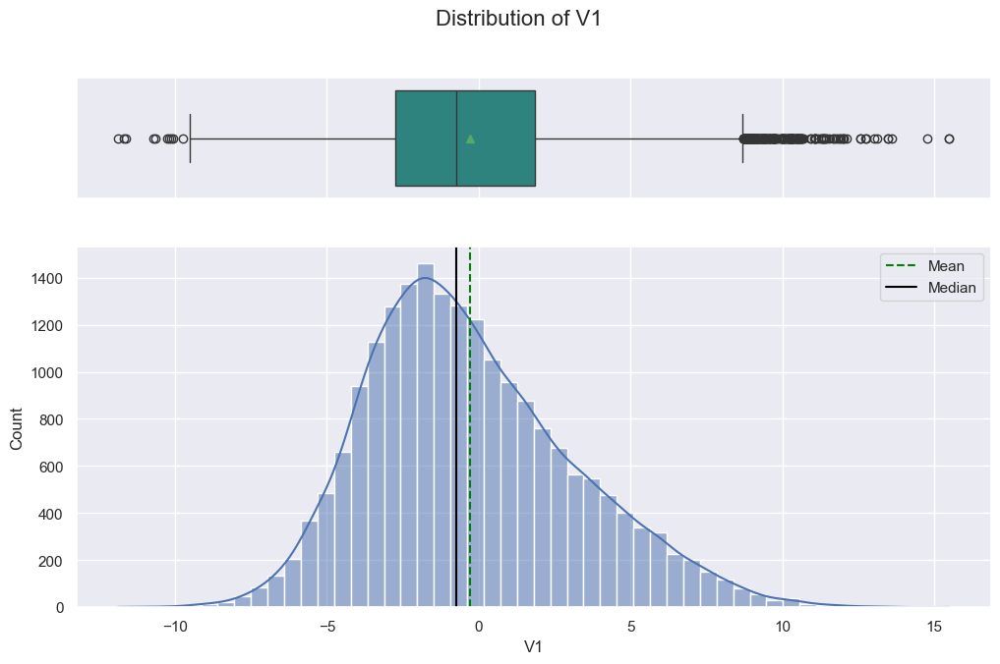

----------------------------------------------------------------------------------------------------
Distribution of 'V2'
count   19982.0000
mean        0.4404
std         3.1508
min       -12.3200
25%        -1.6407
50%         0.4715
75%         2.5440
max        13.0893
Name: V2, dtype: float64


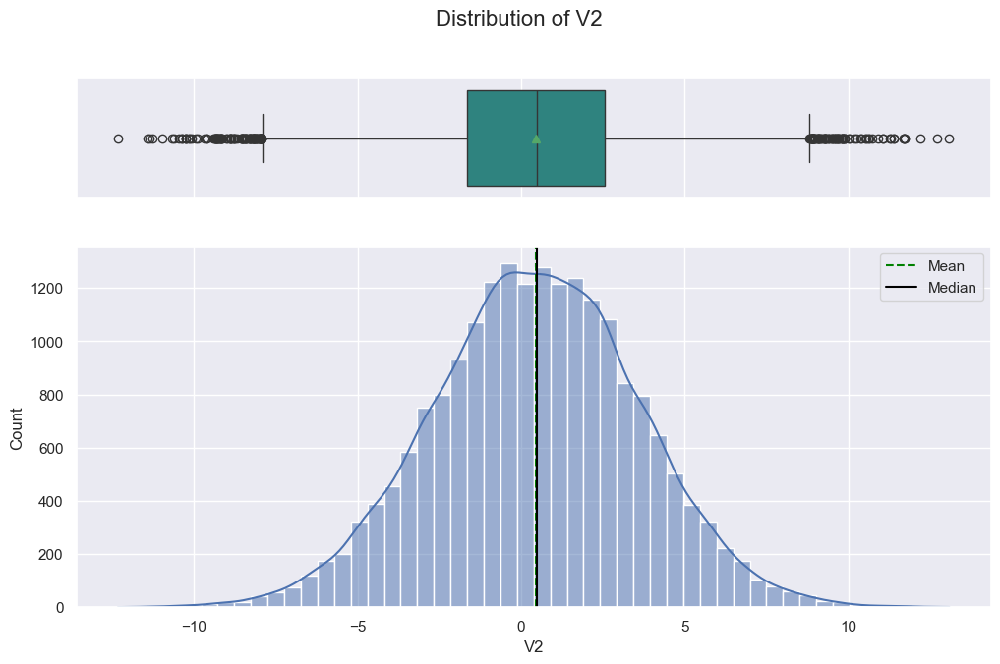

----------------------------------------------------------------------------------------------------
Distribution of 'V3'
count   20000.0000
mean        2.4847
std         3.3890
min       -10.7081
25%         0.2069
50%         2.2558
75%         4.5662
max        17.0909
Name: V3, dtype: float64


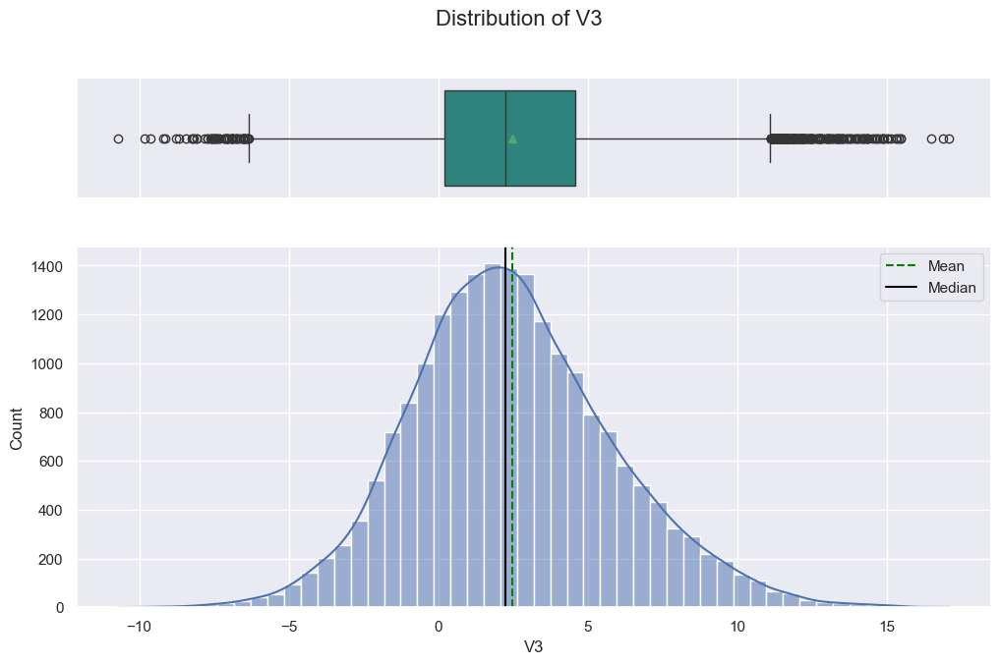

----------------------------------------------------------------------------------------------------
Distribution of 'V4'
count   20000.0000
mean       -0.0832
std         3.4316
min       -15.0821
25%        -2.3477
50%        -0.1352
75%         2.1306
max        13.2364
Name: V4, dtype: float64


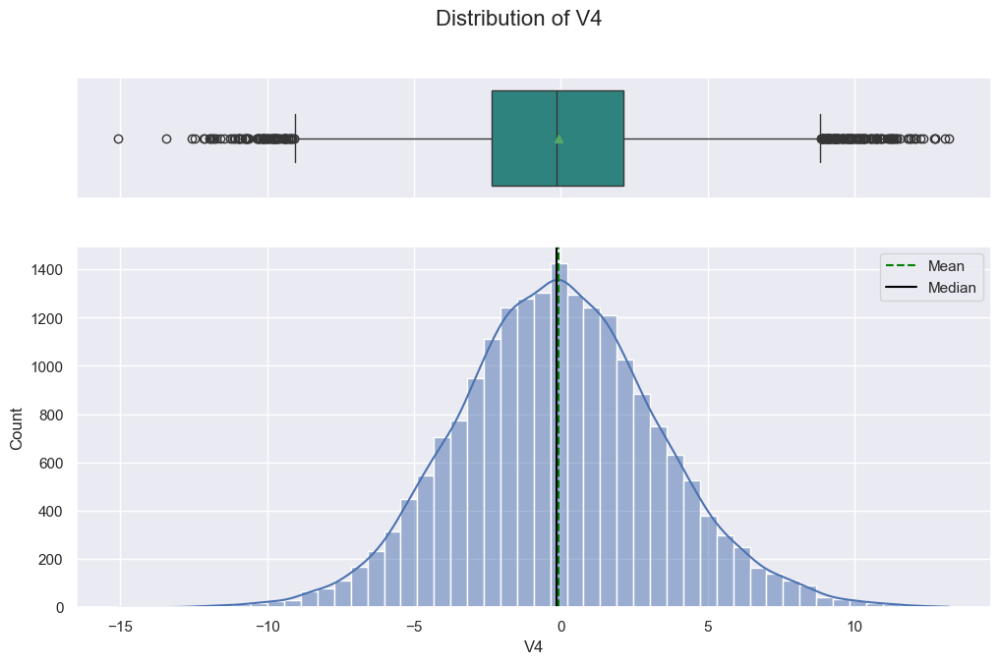

----------------------------------------------------------------------------------------------------
Distribution of 'V5'
count   20000.0000
mean       -0.0538
std         2.1048
min        -8.6034
25%        -1.5356
50%        -0.1020
75%         1.3405
max         8.1338
Name: V5, dtype: float64


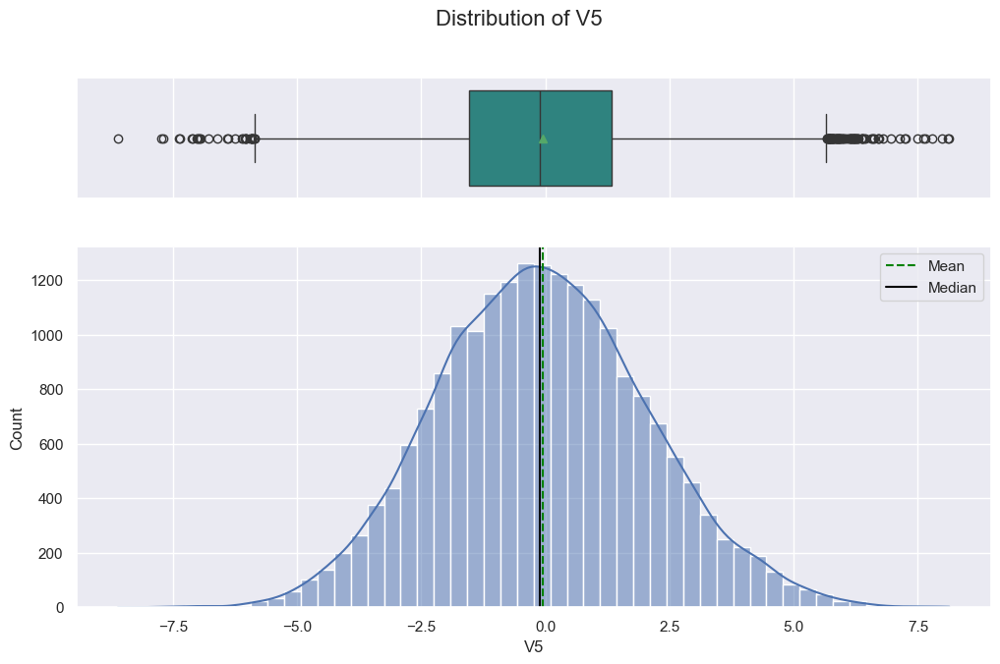

----------------------------------------------------------------------------------------------------
Distribution of 'V6'
count   20000.0000
mean       -0.9954
std         2.0410
min       -10.2271
25%        -2.3472
50%        -1.0005
75%         0.3803
max         6.9758
Name: V6, dtype: float64


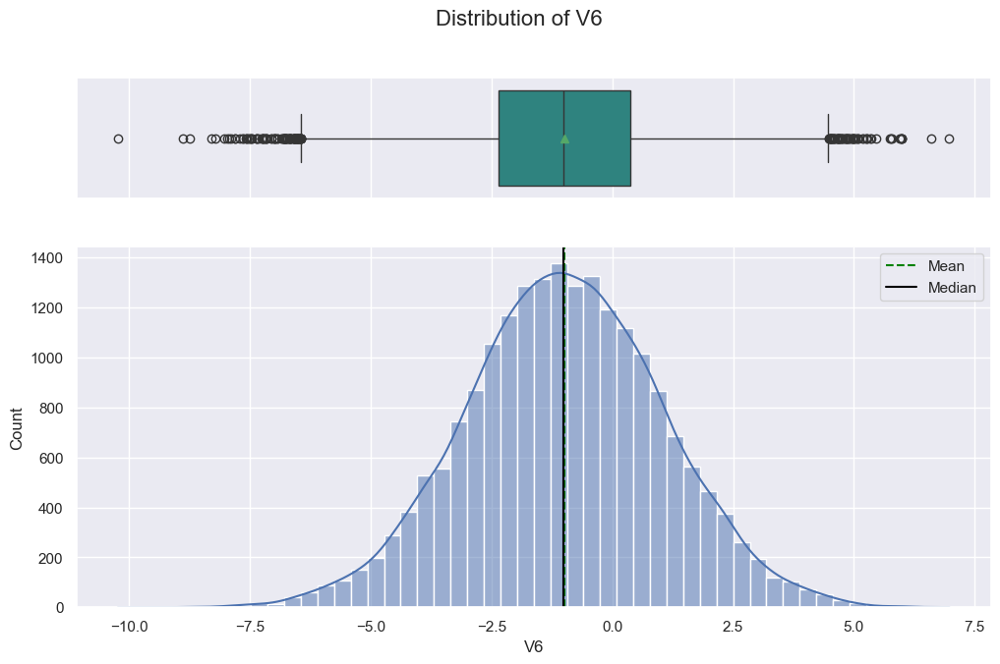

----------------------------------------------------------------------------------------------------
Distribution of 'V7'
count   20000.0000
mean       -0.8793
std         1.7616
min        -7.9497
25%        -2.0309
50%        -0.9172
75%         0.2237
max         8.0061
Name: V7, dtype: float64


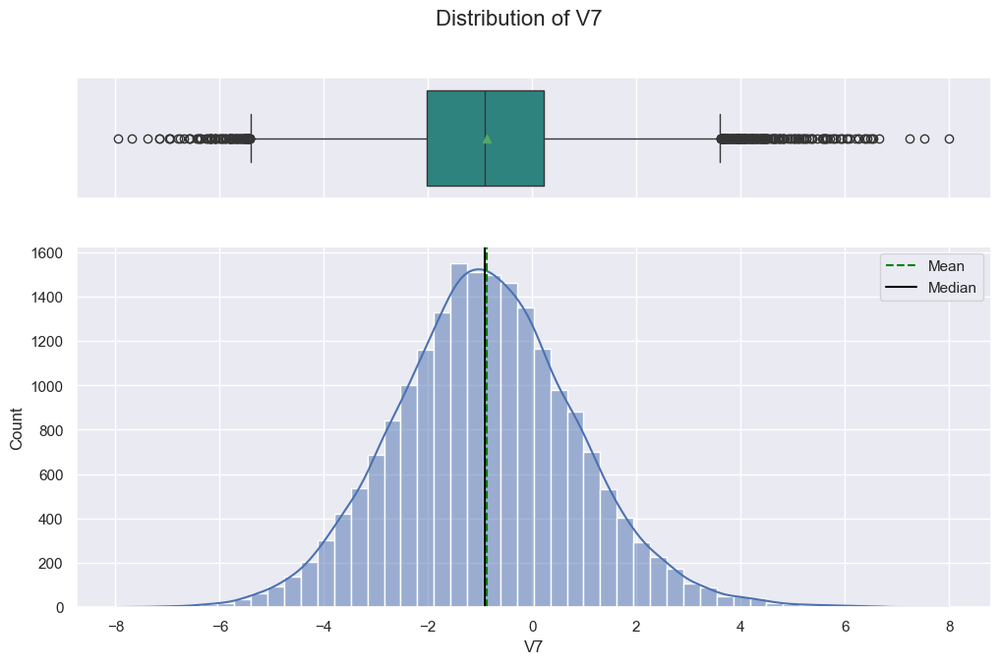

----------------------------------------------------------------------------------------------------
Distribution of 'V8'
count   20000.0000
mean       -0.5482
std         3.2958
min       -15.6576
25%        -2.6427
50%        -0.3891
75%         1.7230
max        11.6795
Name: V8, dtype: float64


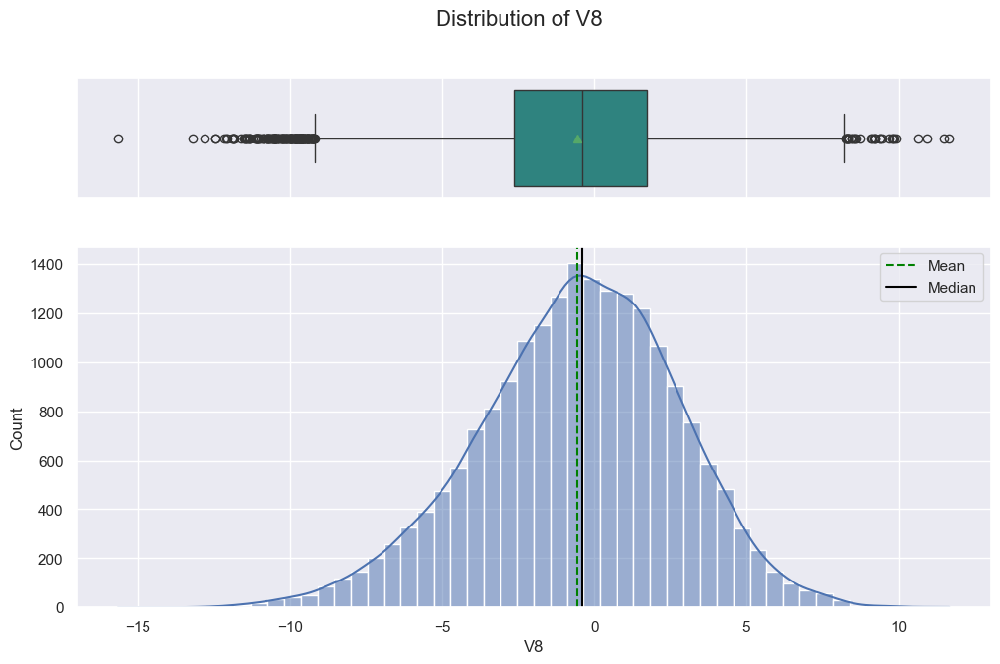

----------------------------------------------------------------------------------------------------
Distribution of 'V9'
count   20000.0000
mean       -0.0168
std         2.1606
min        -8.5963
25%        -1.4950
50%        -0.0676
75%         1.4092
max         8.1376
Name: V9, dtype: float64


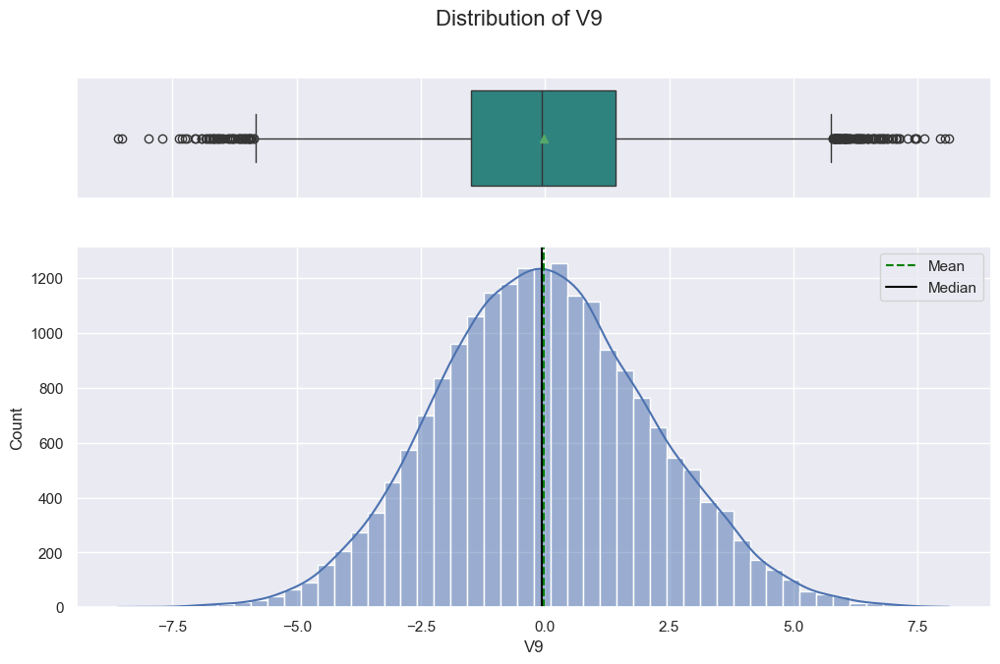

----------------------------------------------------------------------------------------------------
Distribution of 'V10'
count   20000.0000
mean       -0.0130
std         2.1932
min        -9.8540
25%        -1.4112
50%         0.1010
75%         1.4770
max         8.1085
Name: V10, dtype: float64


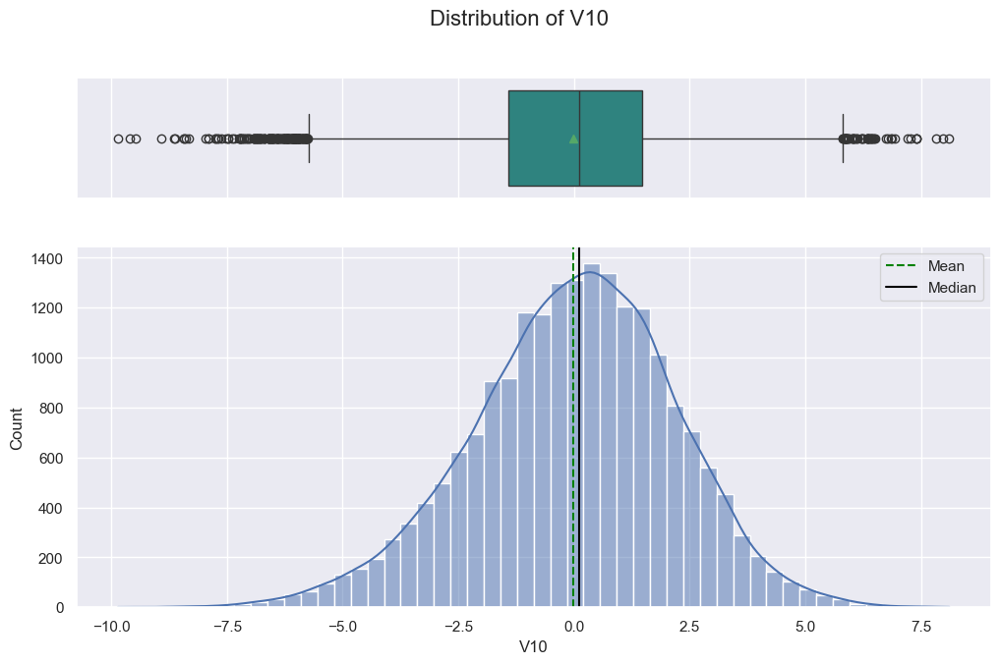

----------------------------------------------------------------------------------------------------
Distribution of 'V11'
count   20000.0000
mean       -1.8954
std         3.1243
min       -14.8321
25%        -3.9224
50%        -1.9212
75%         0.1189
max        11.8264
Name: V11, dtype: float64


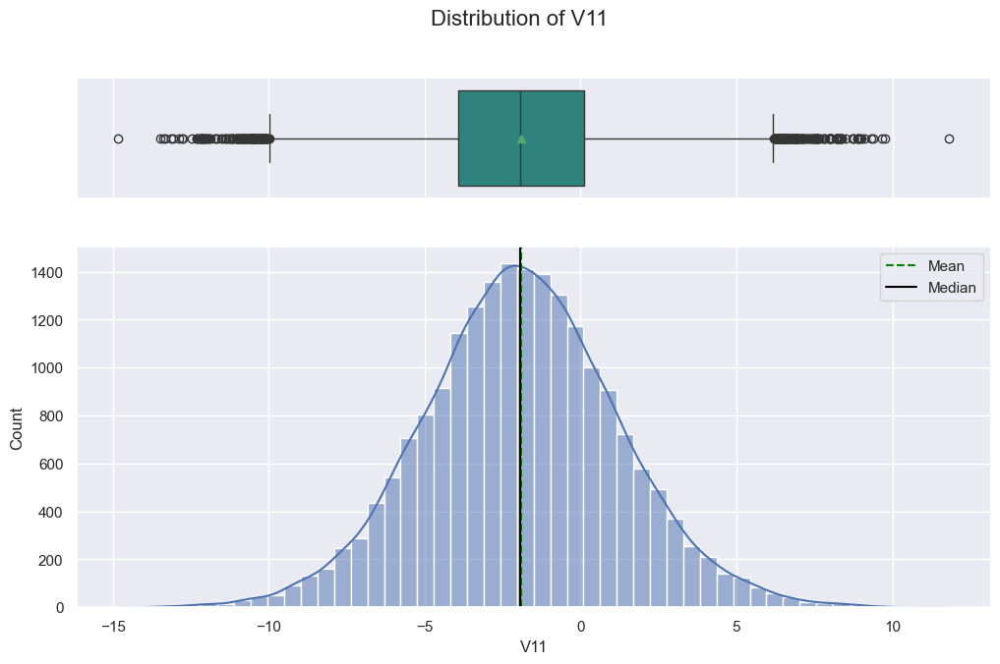

----------------------------------------------------------------------------------------------------
Distribution of 'V12'
count   20000.0000
mean        1.6048
std         2.9305
min       -12.9480
25%        -0.3965
50%         1.5078
75%         3.5715
max        15.0807
Name: V12, dtype: float64


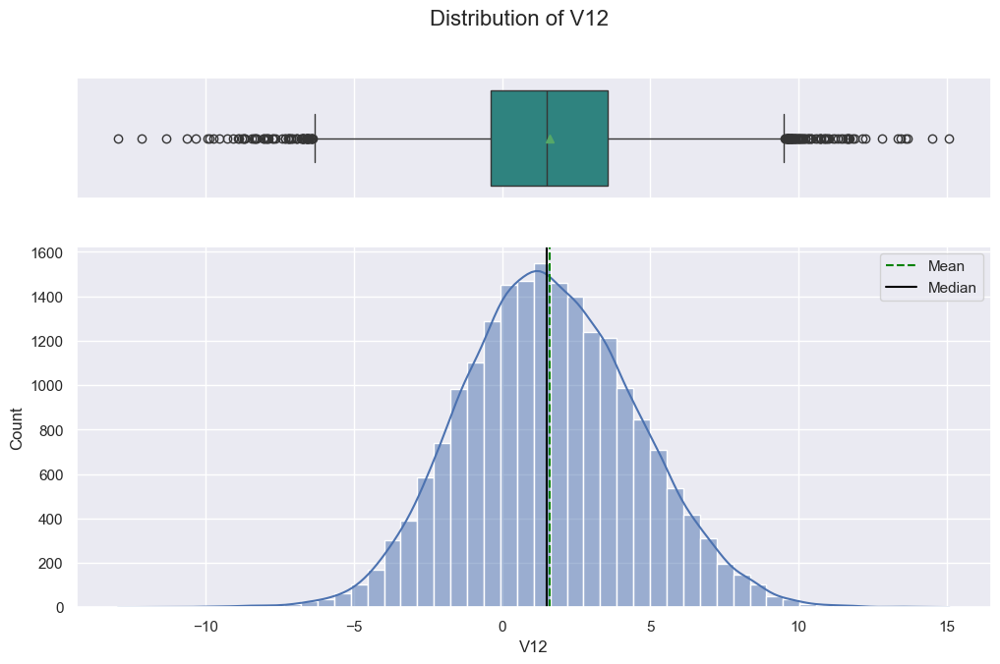

----------------------------------------------------------------------------------------------------
Distribution of 'V13'
count   20000.0000
mean        1.5805
std         2.8747
min       -13.2282
25%        -0.2235
50%         1.6372
75%         3.4599
max        15.4196
Name: V13, dtype: float64


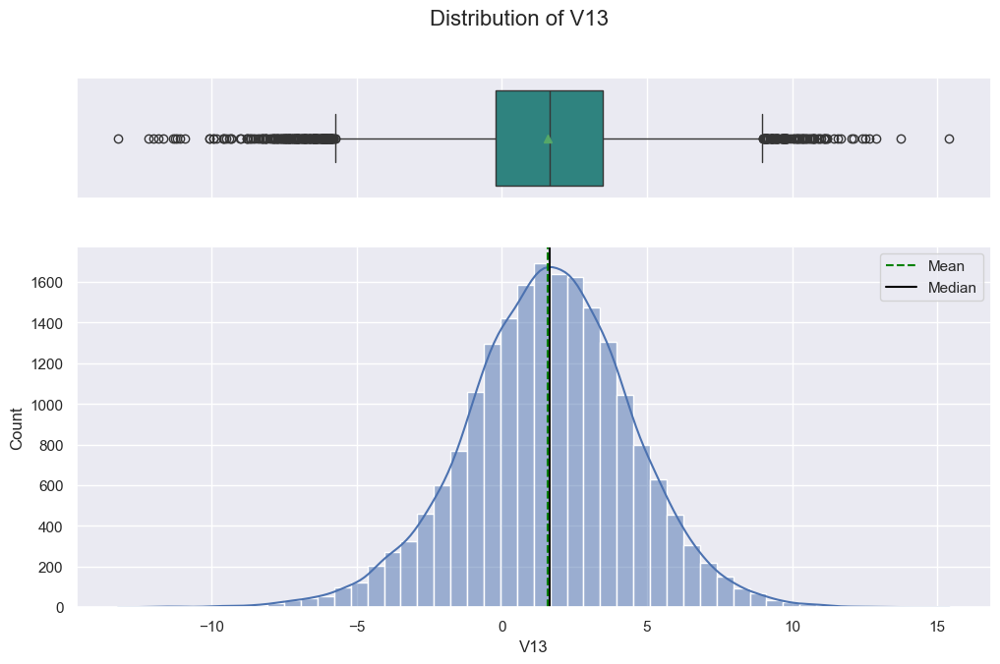

----------------------------------------------------------------------------------------------------
Distribution of 'V14'
count   20000.0000
mean       -0.9506
std         1.7897
min        -7.7386
25%        -2.1707
50%        -0.9572
75%         0.2707
max         5.6707
Name: V14, dtype: float64


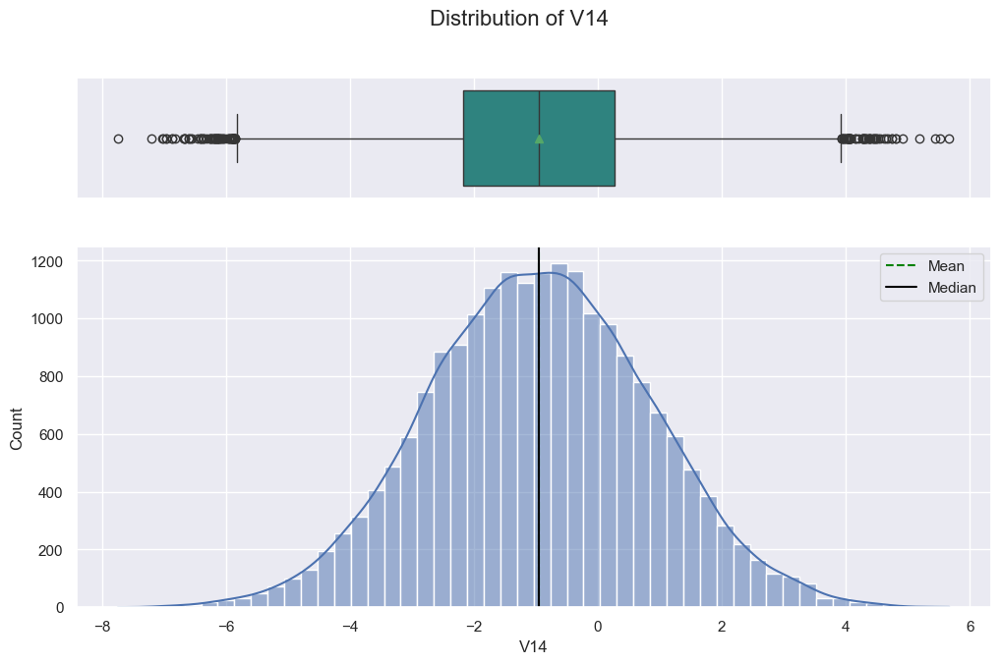

----------------------------------------------------------------------------------------------------
Distribution of 'V15'
count   20000.0000
mean       -2.4150
std         3.3550
min       -16.4166
25%        -4.4153
50%        -2.3826
75%        -0.3591
max        12.2465
Name: V15, dtype: float64


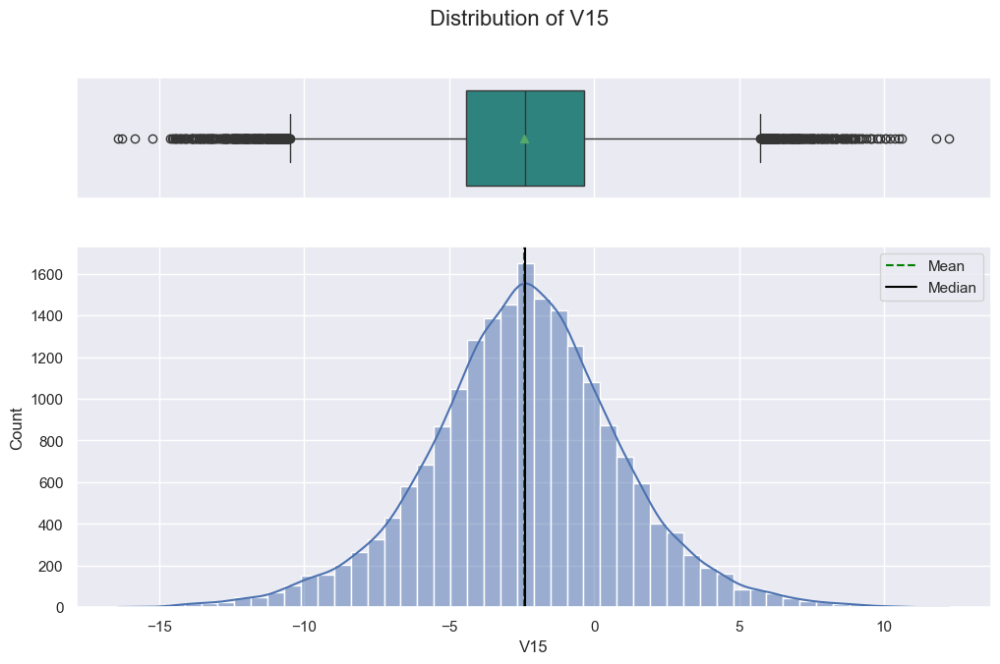

----------------------------------------------------------------------------------------------------
Distribution of 'V16'
count   20000.0000
mean       -2.9252
std         4.2217
min       -20.3742
25%        -5.6342
50%        -2.6827
75%        -0.0950
max        13.5832
Name: V16, dtype: float64


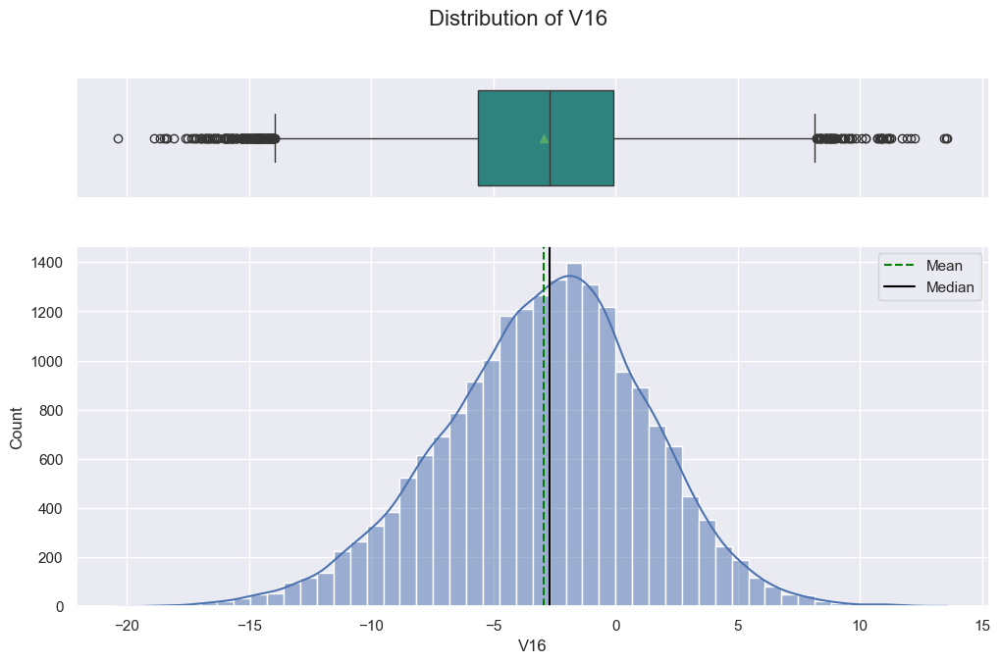

----------------------------------------------------------------------------------------------------
Distribution of 'V17'
count   20000.0000
mean       -0.1343
std         3.3455
min       -14.0912
25%        -2.2156
50%        -0.0146
75%         2.0688
max        16.7564
Name: V17, dtype: float64


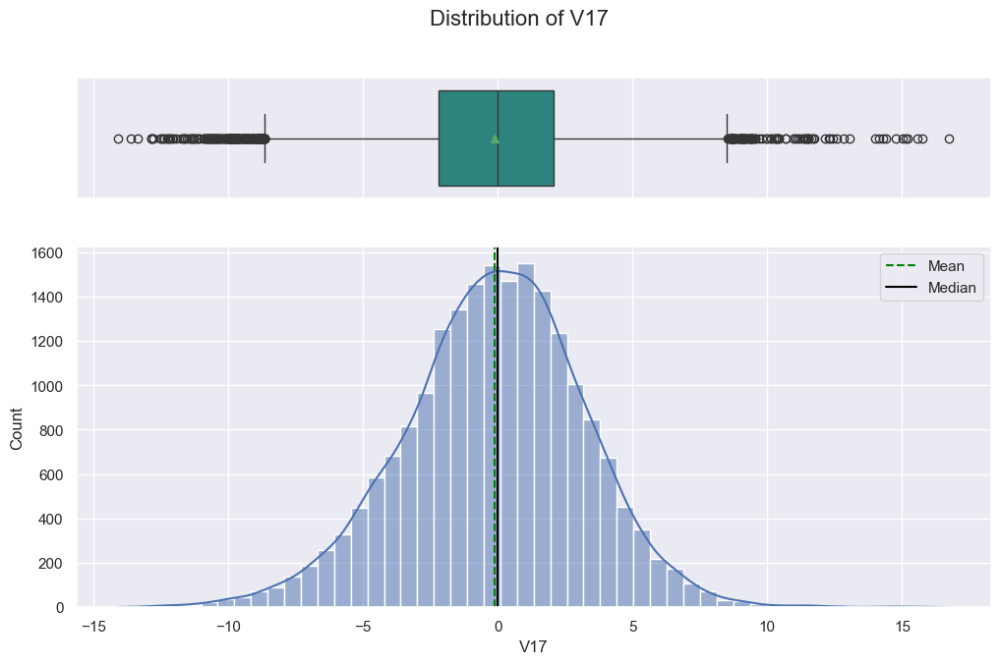

----------------------------------------------------------------------------------------------------
Distribution of 'V18'
count   20000.0000
mean        1.1893
std         2.5923
min       -11.6440
25%        -0.4039
50%         0.8834
75%         2.5718
max        13.1799
Name: V18, dtype: float64


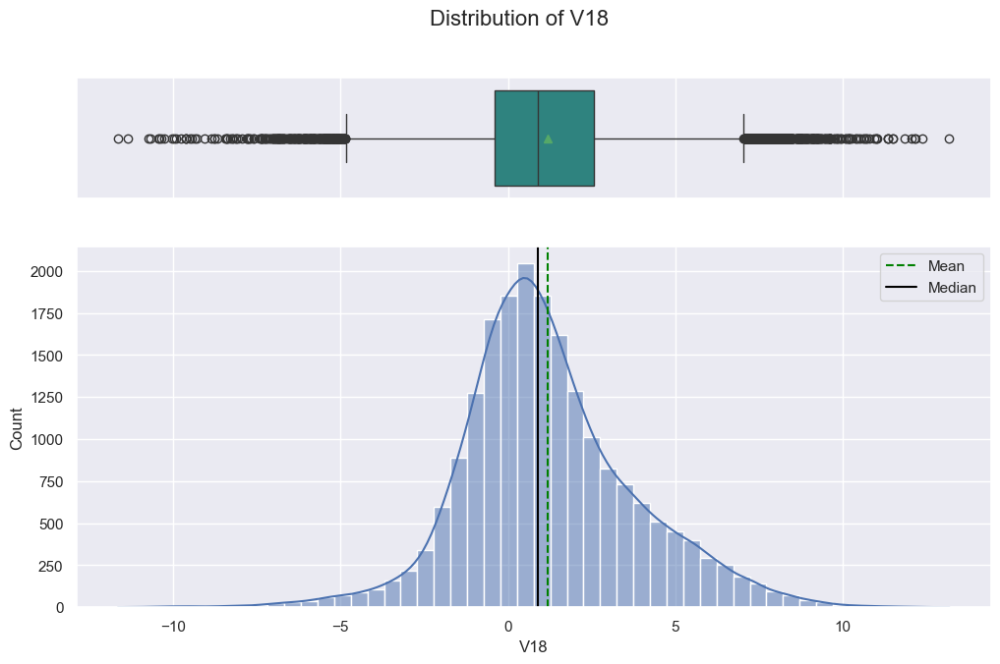

----------------------------------------------------------------------------------------------------
Distribution of 'V19'
count   20000.0000
mean        1.1818
std         3.3969
min       -13.4918
25%        -1.0502
50%         1.2791
75%         3.4933
max        13.2377
Name: V19, dtype: float64


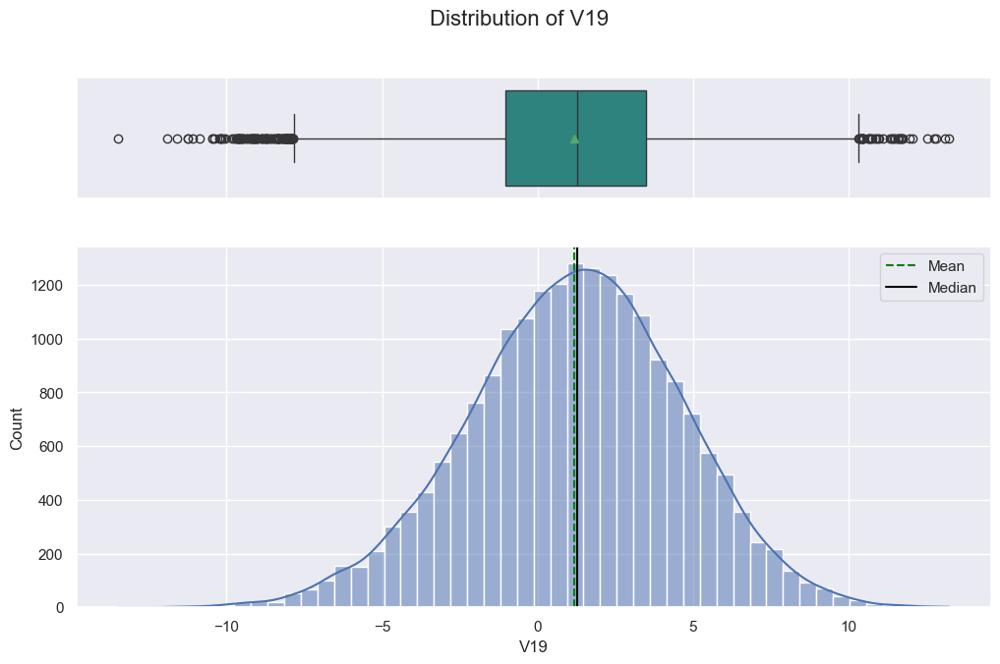

----------------------------------------------------------------------------------------------------
Distribution of 'V20'
count   20000.0000
mean        0.0236
std         3.6695
min       -13.9227
25%        -2.4330
50%         0.0334
75%         2.5124
max        16.0523
Name: V20, dtype: float64


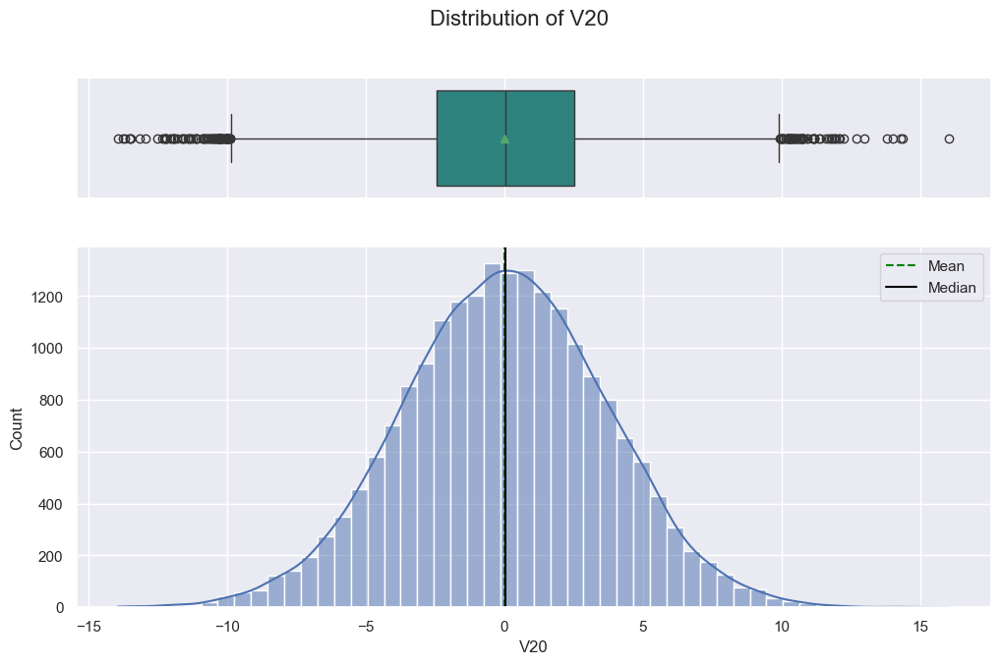

----------------------------------------------------------------------------------------------------
Distribution of 'V21'
count   20000.0000
mean       -3.6113
std         3.5677
min       -17.9562
25%        -5.9304
50%        -3.5329
75%        -1.2659
max        13.8405
Name: V21, dtype: float64


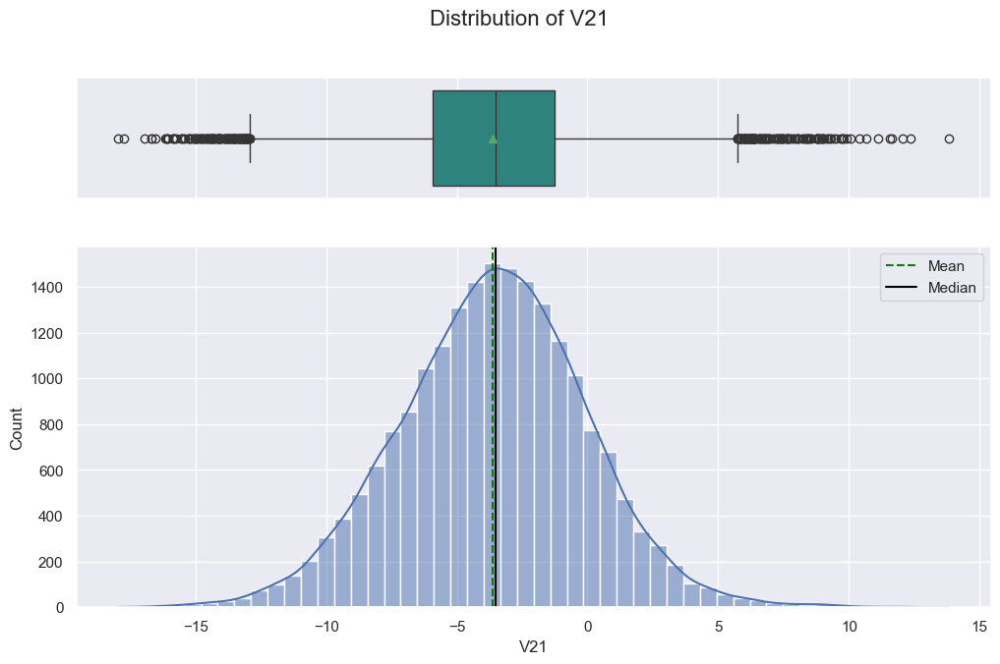

----------------------------------------------------------------------------------------------------
Distribution of 'V22'
count   20000.0000
mean        0.9518
std         1.6515
min       -10.1221
25%        -0.1181
50%         0.9747
75%         2.0256
max         7.4099
Name: V22, dtype: float64


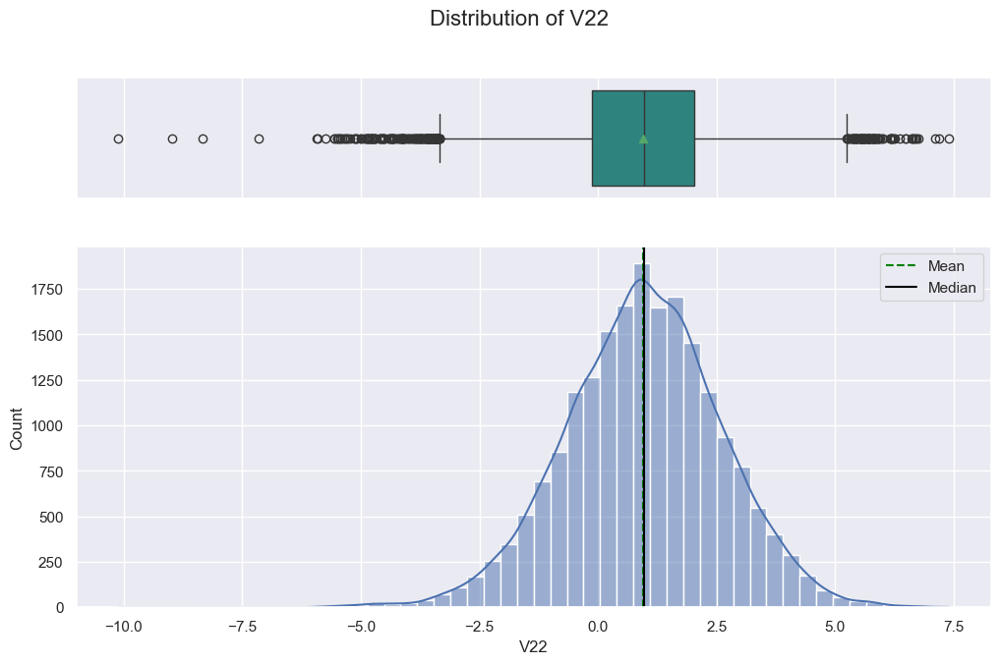

----------------------------------------------------------------------------------------------------
Distribution of 'V23'
count   20000.0000
mean       -0.3661
std         4.0319
min       -14.8661
25%        -3.0988
50%        -0.2621
75%         2.4517
max        14.4587
Name: V23, dtype: float64


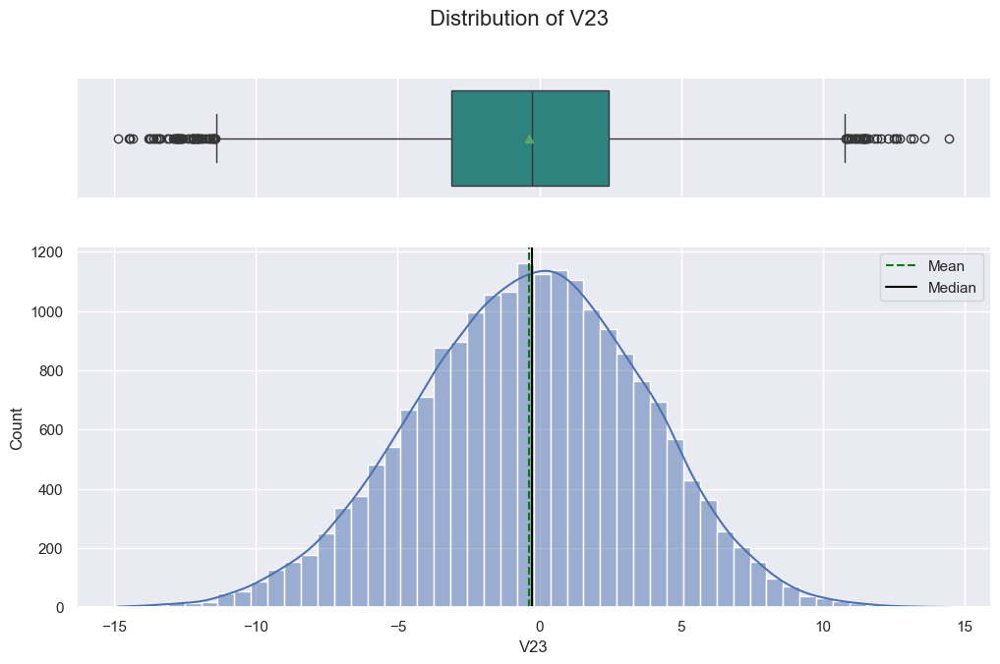

----------------------------------------------------------------------------------------------------
Distribution of 'V24'
count   20000.0000
mean        1.1344
std         3.9121
min       -16.3871
25%        -1.4681
50%         0.9690
75%         3.5460
max        17.1633
Name: V24, dtype: float64


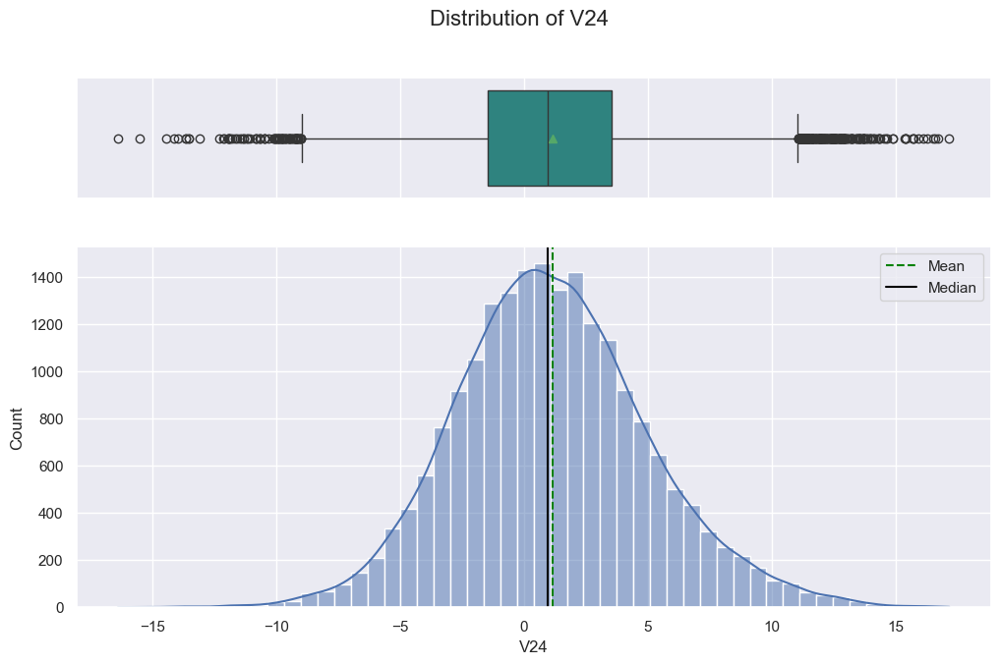

----------------------------------------------------------------------------------------------------
Distribution of 'V25'
count   20000.0000
mean       -0.0022
std         2.0167
min        -8.2283
25%        -1.3652
50%         0.0251
75%         1.3971
max         8.2234
Name: V25, dtype: float64


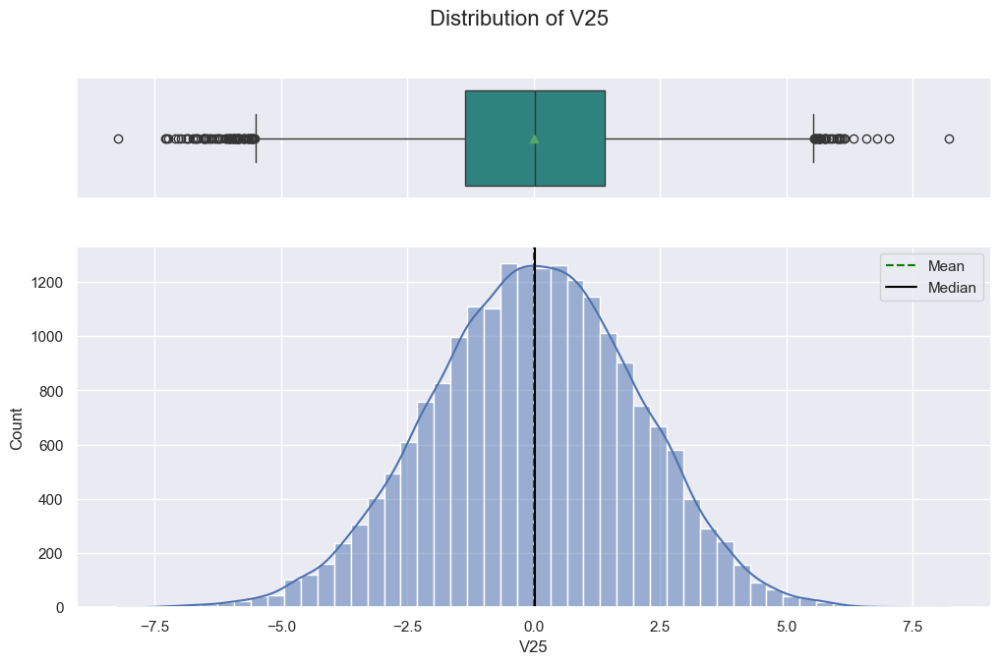

----------------------------------------------------------------------------------------------------
Distribution of 'V26'
count   20000.0000
mean        1.8738
std         3.4351
min       -11.8343
25%        -0.3379
50%         1.9505
75%         4.1300
max        16.8364
Name: V26, dtype: float64


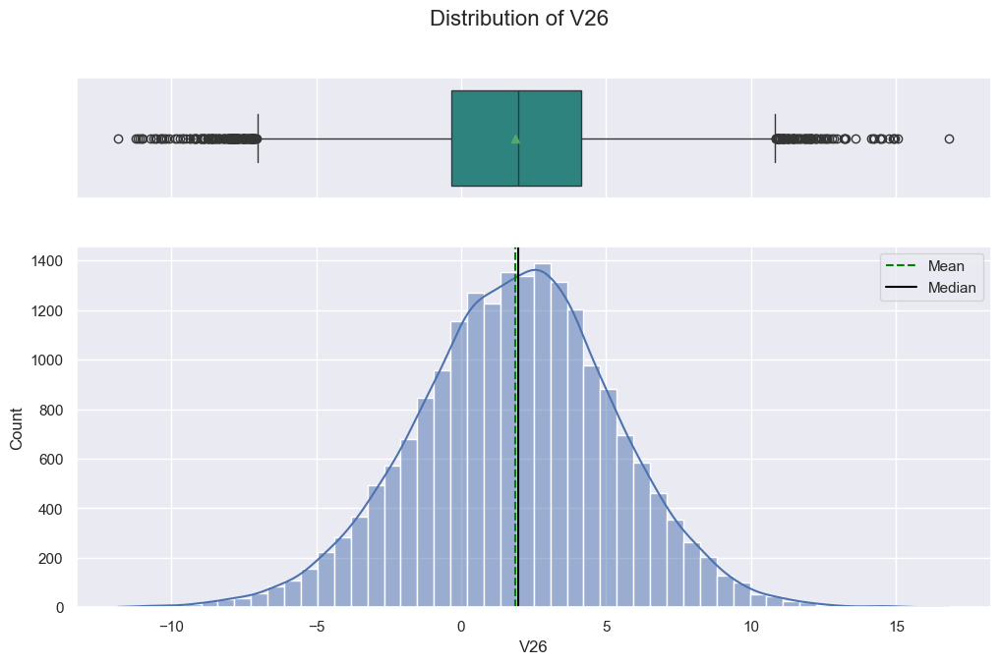

----------------------------------------------------------------------------------------------------
Distribution of 'V27'
count   20000.0000
mean       -0.6124
std         4.3688
min       -14.9049
25%        -3.6523
50%        -0.8849
75%         2.1892
max        17.5604
Name: V27, dtype: float64


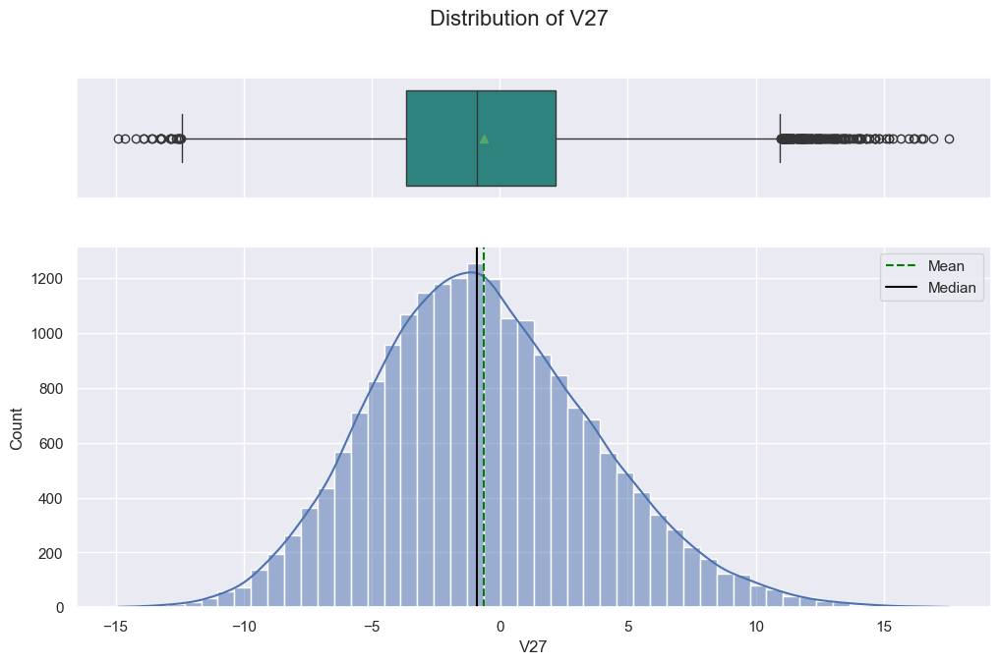

----------------------------------------------------------------------------------------------------
Distribution of 'V28'
count   20000.0000
mean       -0.8832
std         1.9177
min        -9.2695
25%        -2.1712
50%        -0.8911
75%         0.3759
max         6.5276
Name: V28, dtype: float64


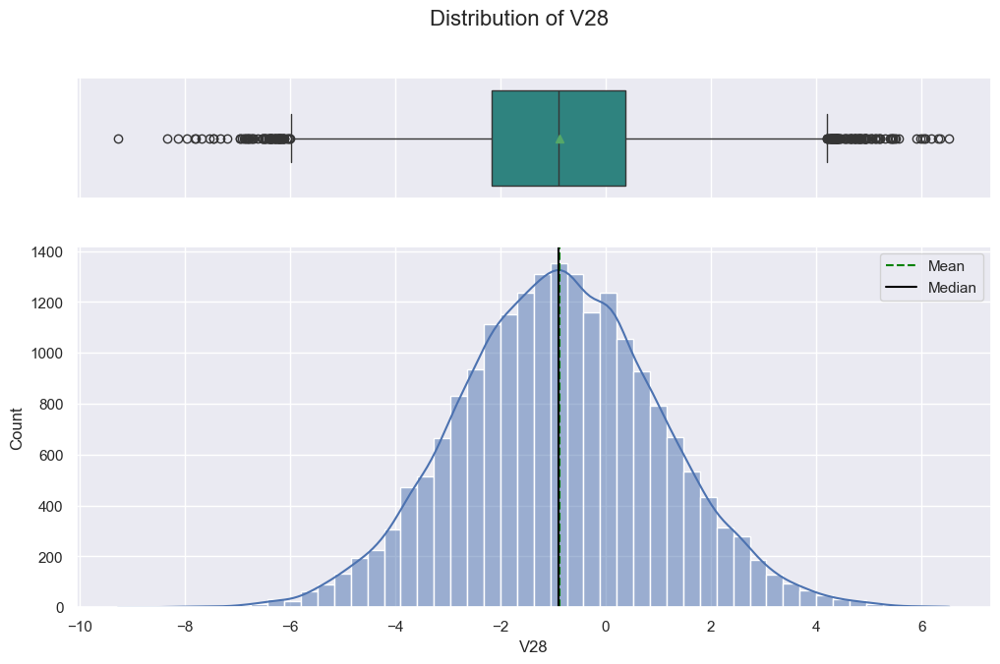

----------------------------------------------------------------------------------------------------
Distribution of 'V29'
count   20000.0000
mean       -0.9856
std         2.6844
min       -12.5795
25%        -2.7874
50%        -1.1762
75%         0.6298
max        10.7221
Name: V29, dtype: float64


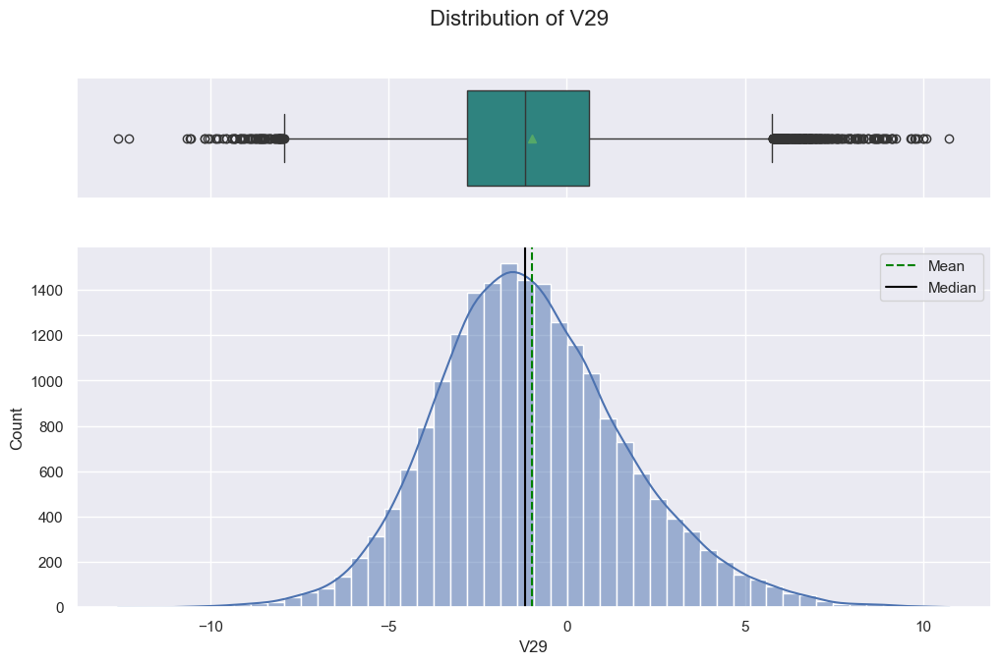

----------------------------------------------------------------------------------------------------
Distribution of 'V30'
count   20000.0000
mean       -0.0155
std         3.0053
min       -14.7960
25%        -1.8671
50%         0.1843
75%         2.0362
max        12.5058
Name: V30, dtype: float64


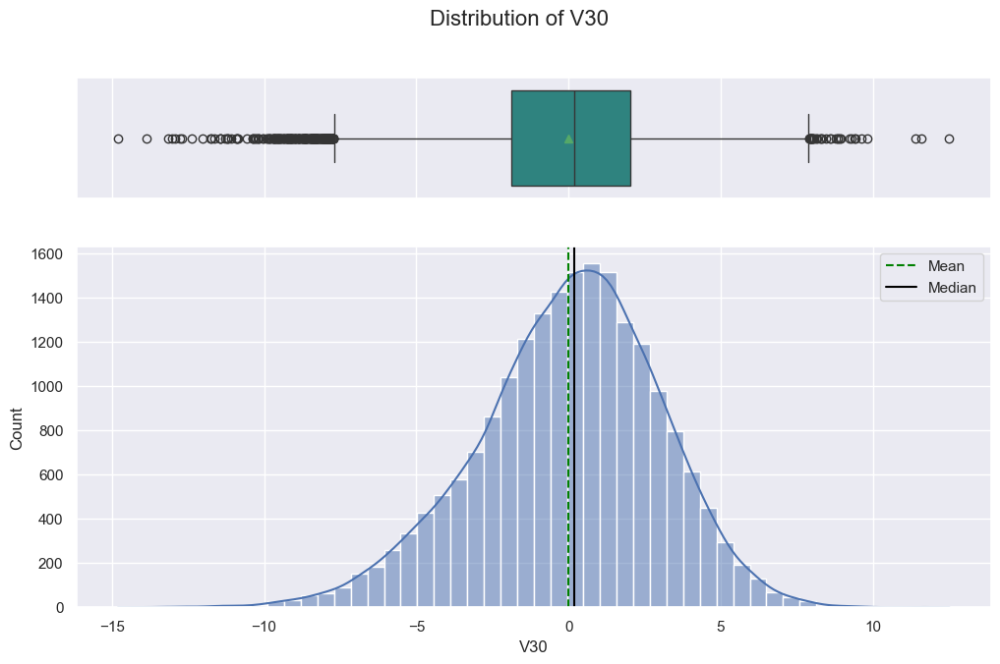

----------------------------------------------------------------------------------------------------
Distribution of 'V31'
count   20000.0000
mean        0.4868
std         3.4614
min       -13.7228
25%        -1.8178
50%         0.4903
75%         2.7307
max        17.2551
Name: V31, dtype: float64


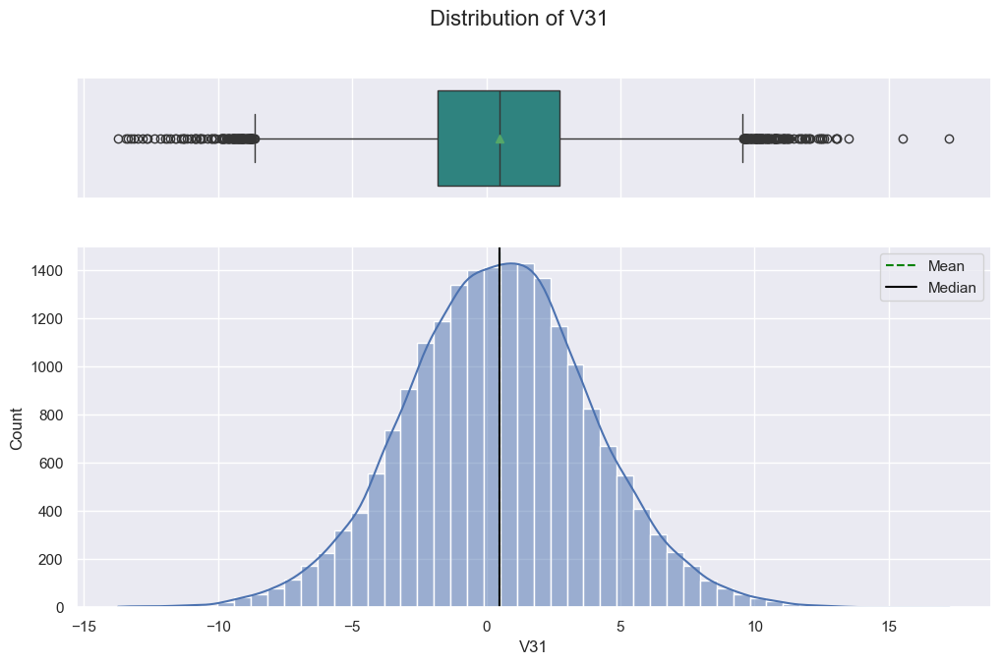

----------------------------------------------------------------------------------------------------
Distribution of 'V32'
count   20000.0000
mean        0.3038
std         5.5004
min       -19.8765
25%        -3.4205
50%         0.0521
75%         3.7617
max        23.6332
Name: V32, dtype: float64


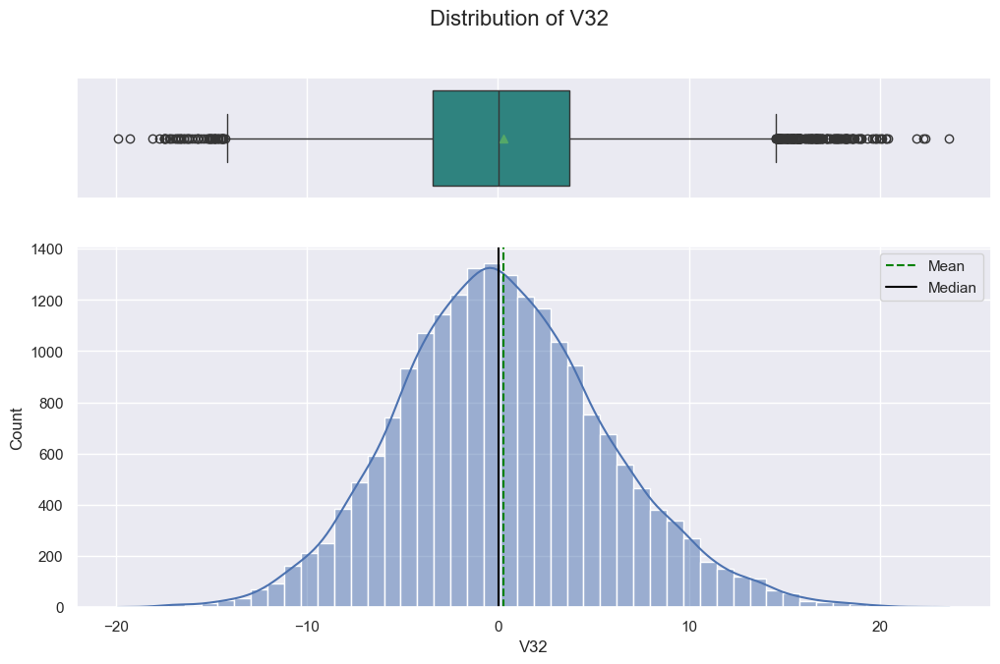

----------------------------------------------------------------------------------------------------
Distribution of 'V33'
count   20000.0000
mean        0.0498
std         3.5753
min       -16.8984
25%        -2.2429
50%        -0.0662
75%         2.2551
max        16.6925
Name: V33, dtype: float64


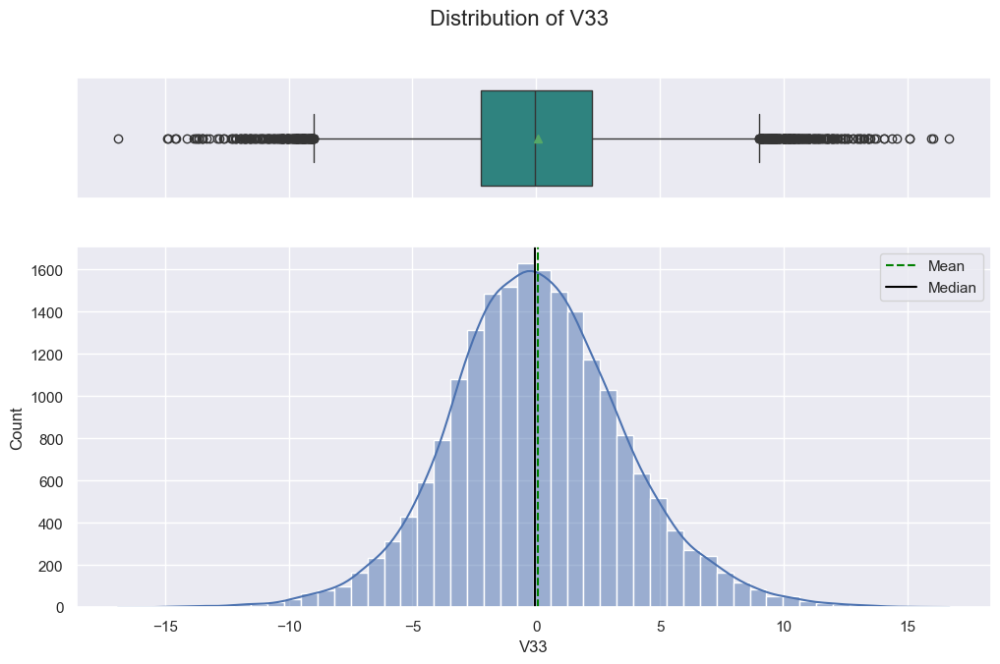

----------------------------------------------------------------------------------------------------
Distribution of 'V34'
count   20000.0000
mean       -0.4627
std         3.1838
min       -17.9851
25%        -2.1370
50%        -0.2550
75%         1.4369
max        14.3582
Name: V34, dtype: float64


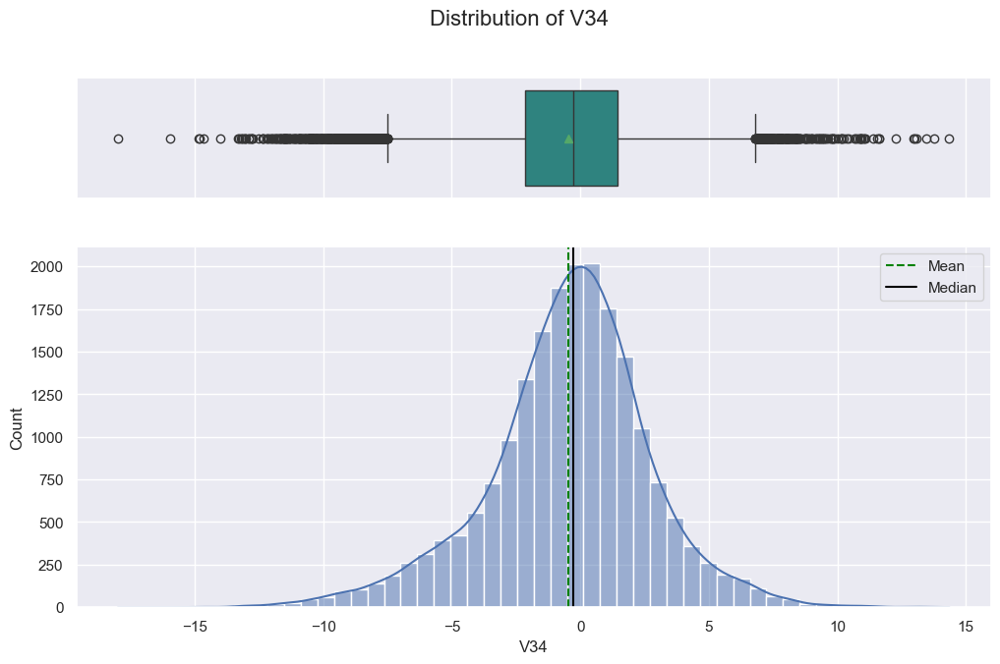

----------------------------------------------------------------------------------------------------
Distribution of 'V35'
count   20000.0000
mean        2.2296
std         2.9371
min       -15.3498
25%         0.3362
50%         2.0986
75%         4.0644
max        15.2911
Name: V35, dtype: float64


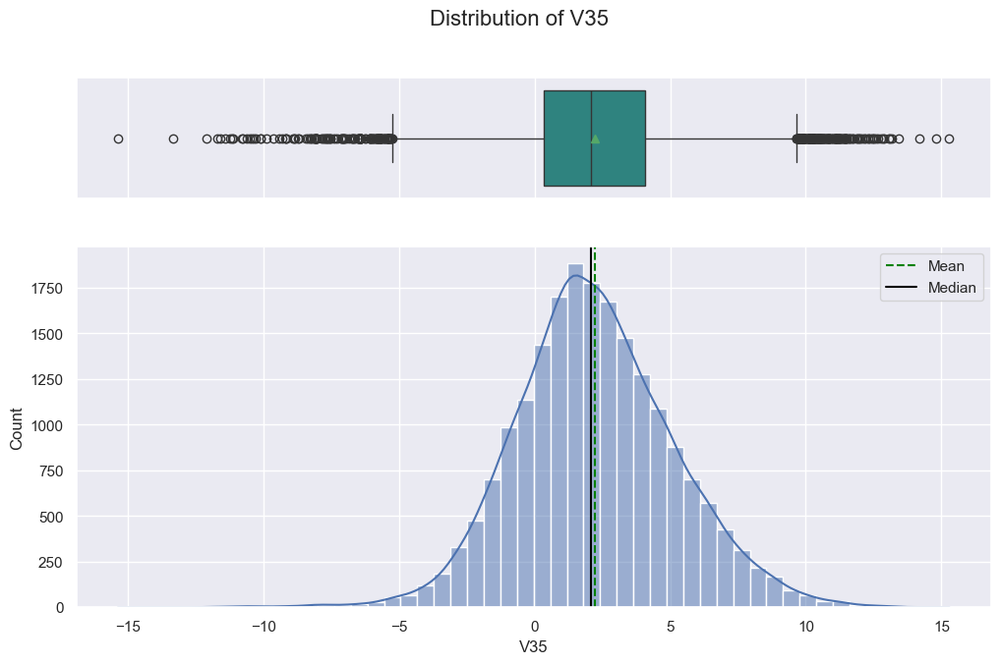

----------------------------------------------------------------------------------------------------
Distribution of 'V36'
count   20000.0000
mean        1.5148
std         3.8009
min       -14.8332
25%        -0.9438
50%         1.5665
75%         3.9839
max        19.3296
Name: V36, dtype: float64


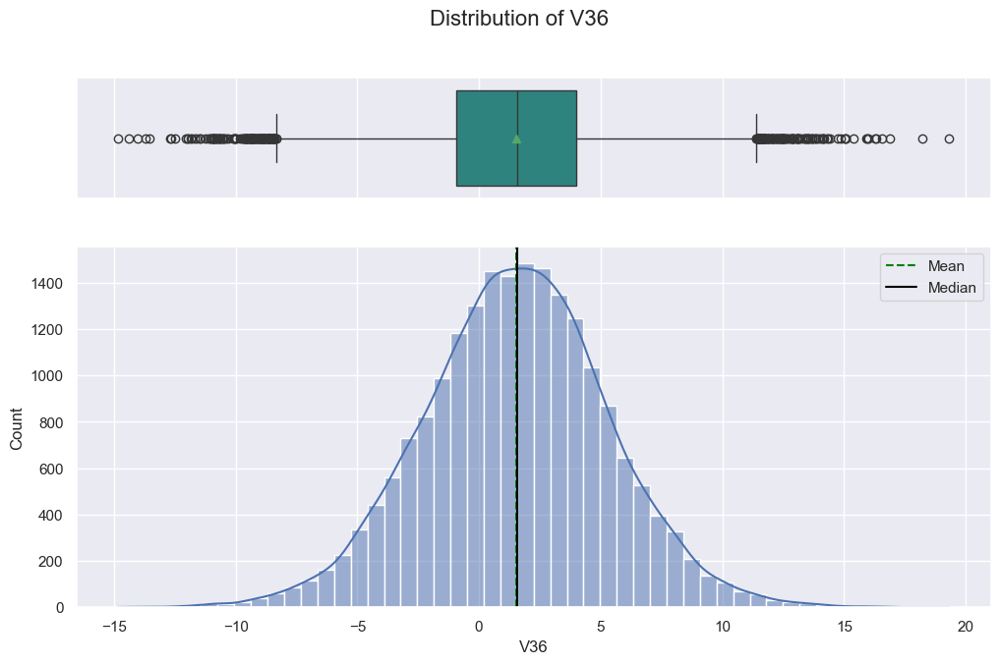

----------------------------------------------------------------------------------------------------
Distribution of 'V37'
count   20000.0000
mean        0.0113
std         1.7882
min        -5.4784
25%        -1.2558
50%        -0.1284
75%         1.1755
max         7.4670
Name: V37, dtype: float64


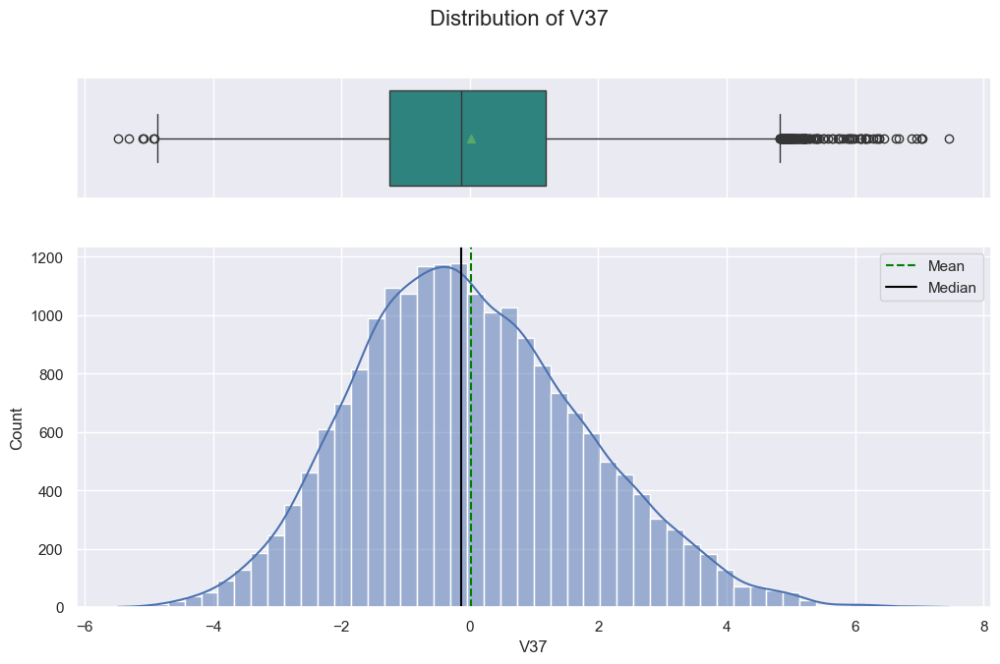

----------------------------------------------------------------------------------------------------
Distribution of 'V38'
count   20000.0000
mean       -0.3440
std         3.9481
min       -17.3750
25%        -2.9876
50%        -0.3168
75%         2.2794
max        15.2899
Name: V38, dtype: float64


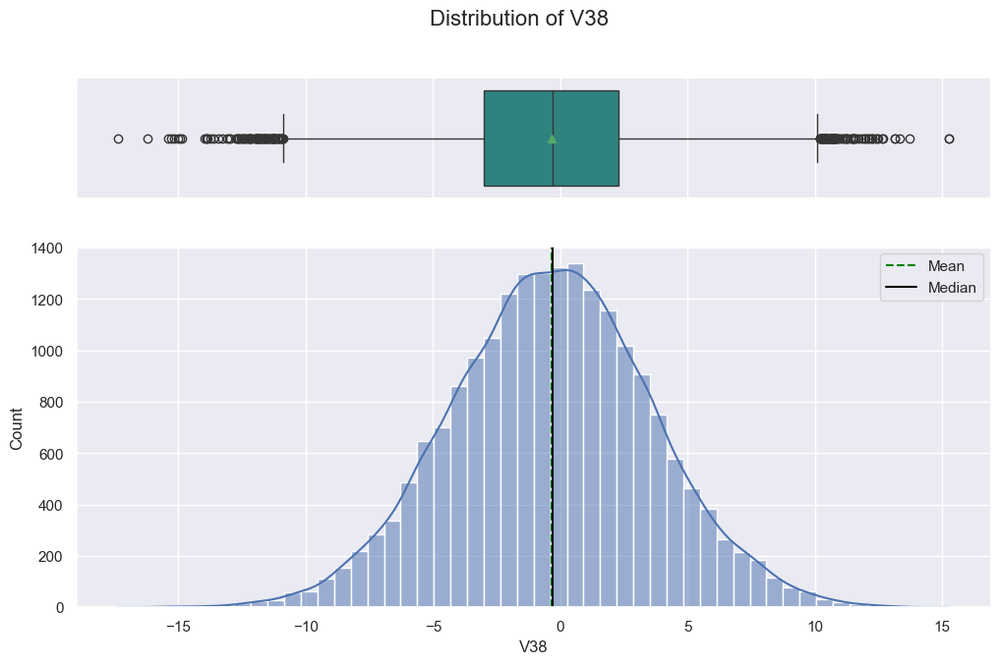

----------------------------------------------------------------------------------------------------
Distribution of 'V39'
count   20000.0000
mean        0.8907
std         1.7531
min        -6.4389
25%        -0.2723
50%         0.9193
75%         2.0575
max         7.7599
Name: V39, dtype: float64


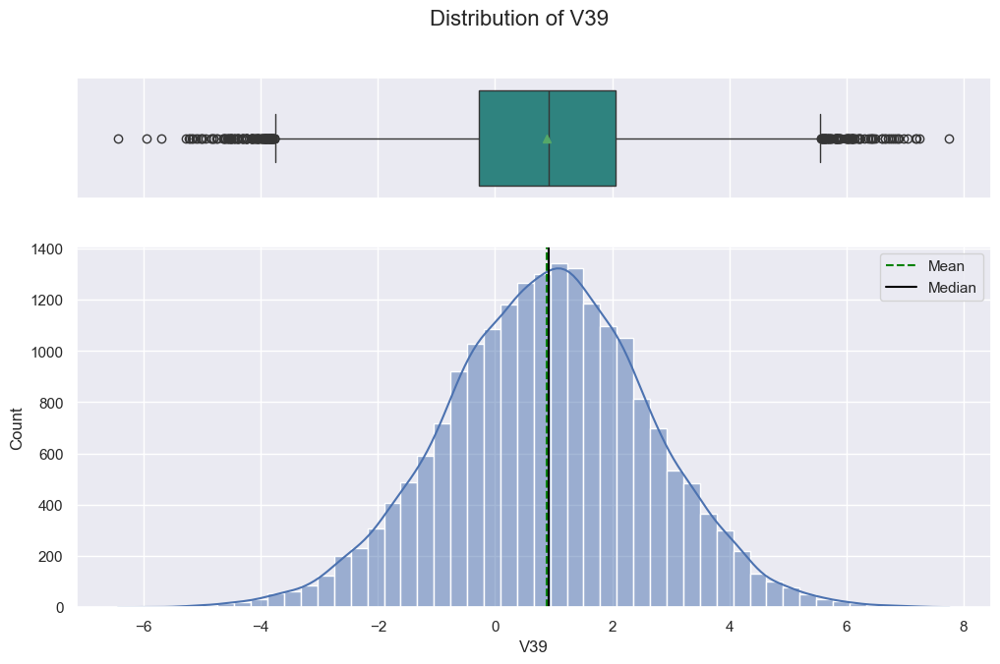

----------------------------------------------------------------------------------------------------
Distribution of 'V40'
count   20000.0000
mean       -0.8756
std         3.0122
min       -11.0239
25%        -2.9402
50%        -0.9208
75%         1.1199
max        10.6543
Name: V40, dtype: float64


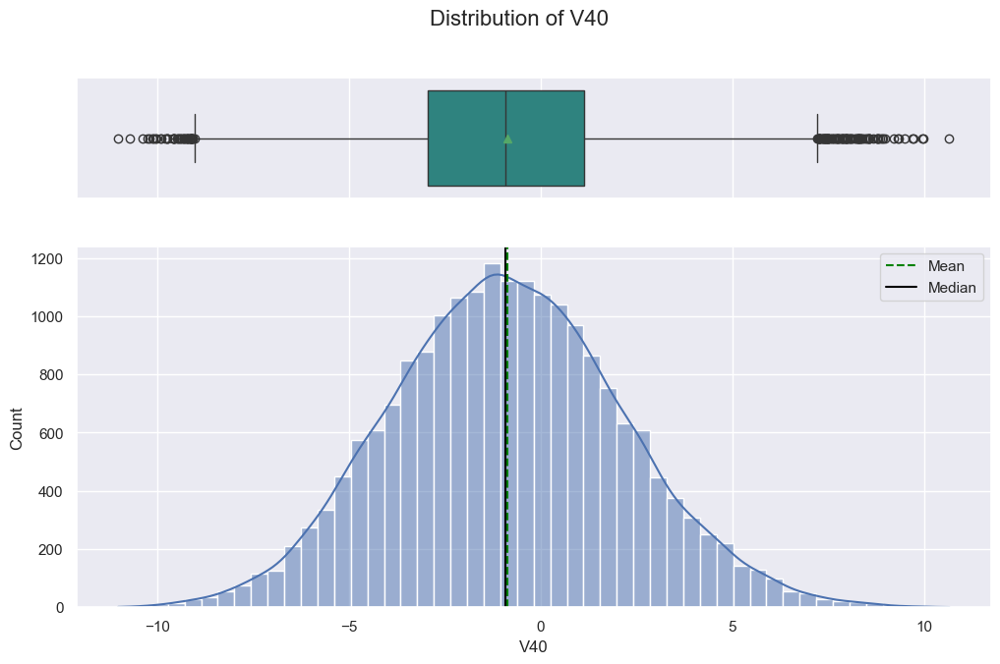

----------------------------------------------------------------------------------------------------
Distribution of 'Target'
count   20000.0000
mean        0.0555
std         0.2290
min         0.0000
25%         0.0000
50%         0.0000
75%         0.0000
max         1.0000
Name: Target, dtype: float64


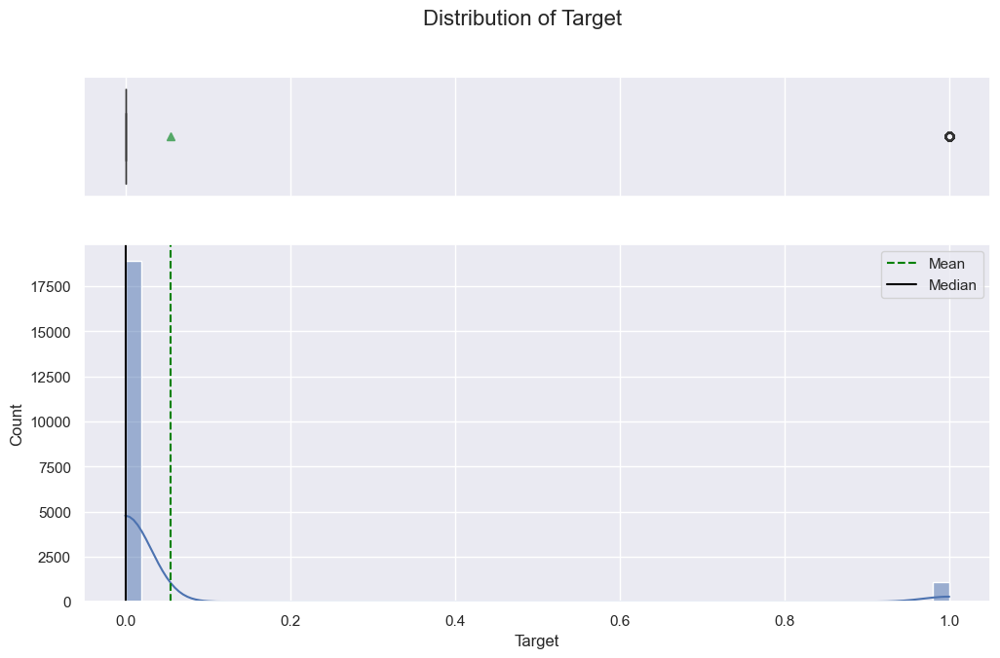

----------------------------------------------------------------------------------------------------


In [22]:
# Selecting all numerical columns ('int64', 'float64')
num_cols = df_eda.select_dtypes(include=["int64", "float64"]).columns

# Iterate through each numerical column and plot the histogram and boxplot combined
for column in num_cols:
    print(f"Distribution of '{column}'")
    print(df_eda[column].describe())
    histogram_boxplot(df_eda, column, bins=50, kde=True)
    print("-" * 100)


- As mentioned before The data is highly skewed towards 0 or no defects.
- When looking at the variables on the same scale we can actually compare and see the data is pretty uniform and following a standard bell shape.


### <a id='toc1_3_3_'></a>[Multivariate Analysis](#toc0_)


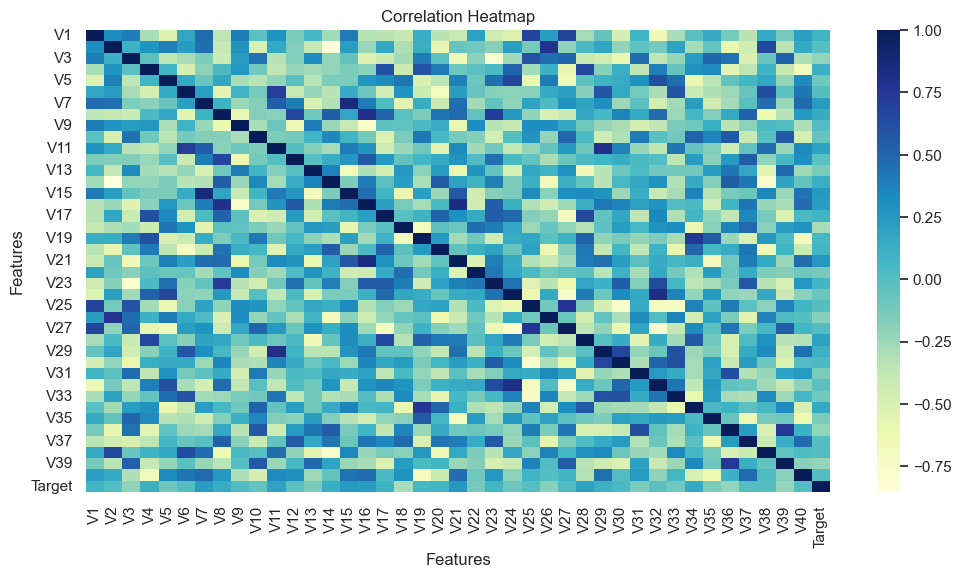

In [23]:
# Calculate the correlation matrix
corr_matrix = df_eda[num_cols].corr()

# Visual representation of the correlation matrix
plt.figure(figsize=(12, 6))
sns.heatmap(corr_matrix, annot=False, cmap="YlGnBu")
plt.title("Correlation Heatmap")
plt.xlabel("Features")
plt.ylabel("Features")
plt.show()


- The target variable has relatively low correlation values with all the predictors. The highest correlations with the target are:
  - `V7`: 0.2369
  - `V15`: 0.2491
  - `V16`: 0.2305
  - `V21`: 0.2564
- These correlations are still fairly weak (below 0.3), meaning no individual feature has a strong direct linear relationship with the target variable, which suggests that the classification task will likely require a combination of features or non-linear models to predict failures effectively.
- There are some strong correlations between predictor variables, indicating multicollinearity. This means I might have to use Lasso or ridge regularization methods.
- Models like tree-based models (Decision Trees, Random Forests, or Gradient Boosting) handle multicollinearity well.


In [24]:
# Function to create distribution plot
def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title(f"Distribution of target for target={str(target_uniq[0])}")
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
        stat="density",
    )

    axs[0, 1].set_title(f"Distribution of target for target={str(target_uniq[1])}")
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()


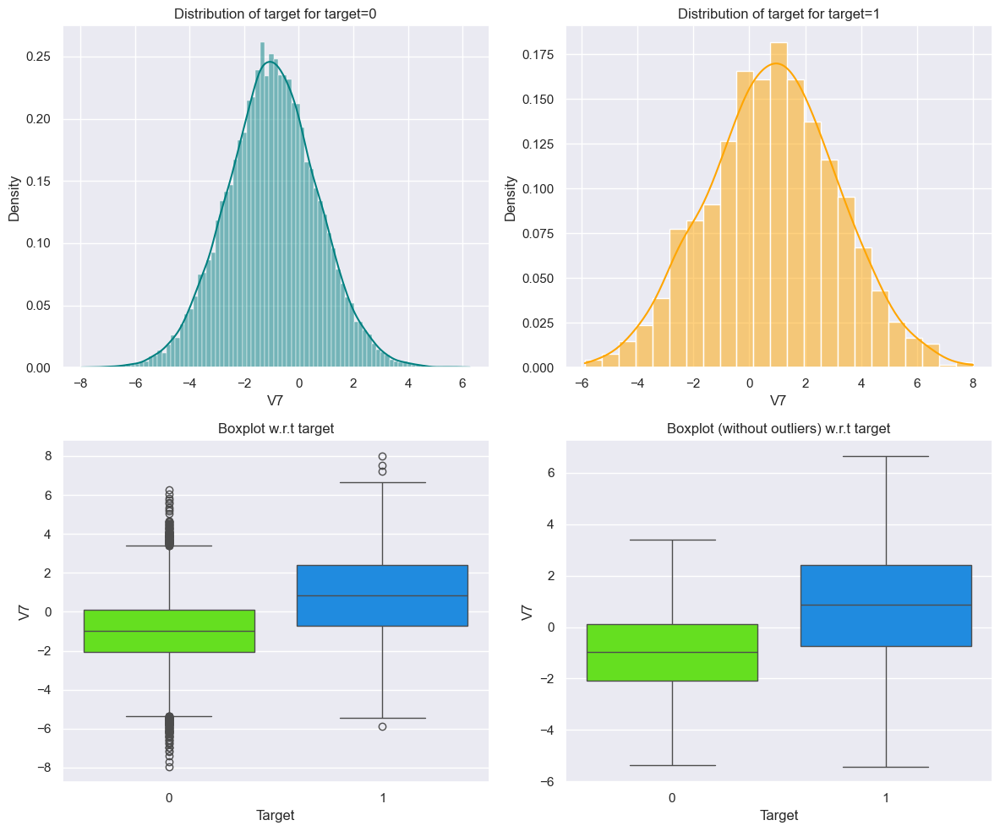

In [25]:
distribution_plot_wrt_target(df_eda, "V7", "Target")


- Higher values of `V7` are more associated with failures.
- We can see this based on the fact that for Target=1, the distribution is somewhat symmetric but shifted to the right, with the mean closer to 2. Also, the median value for Target=1 is clearly higher than for Target=0.
- This feature seems to be a good candidate for distinguishing between failures and non-failures, especially given its positive correlation with the target.


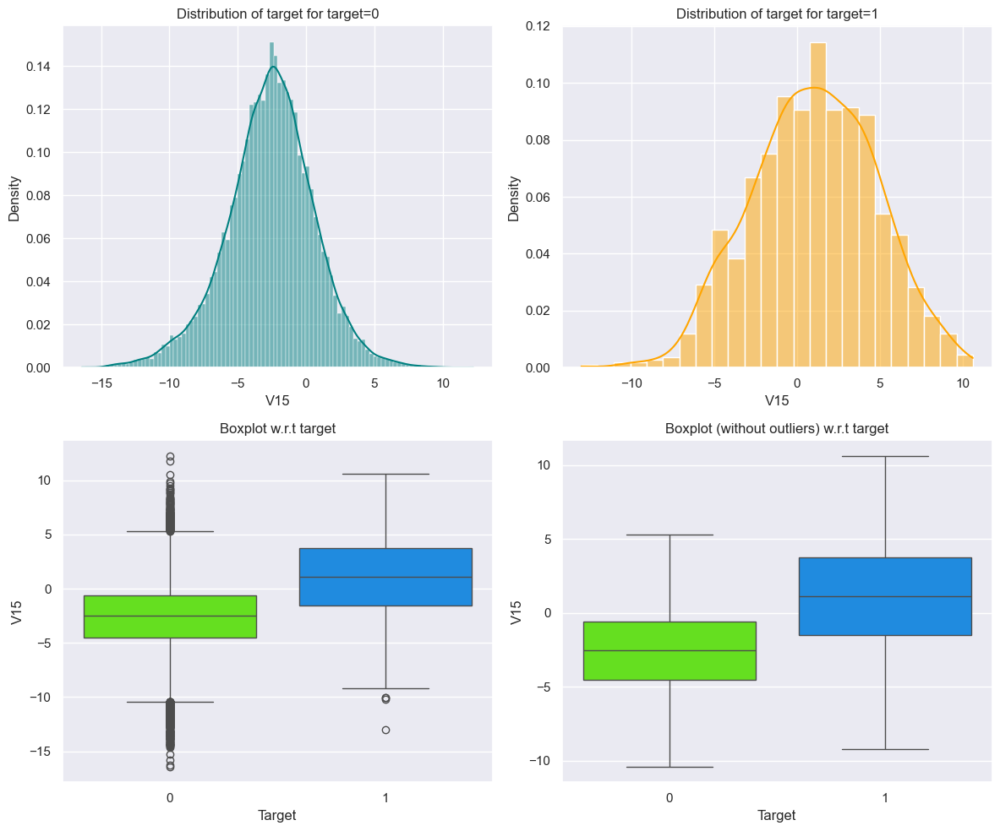

In [26]:
distribution_plot_wrt_target(df_eda, "V15", "Target")


- Like V7, higher values of V15 are associated with failures. This variable could be another important predictor in distinguishing between failures and non-failures, particularly because failures tend to exhibit higher values.


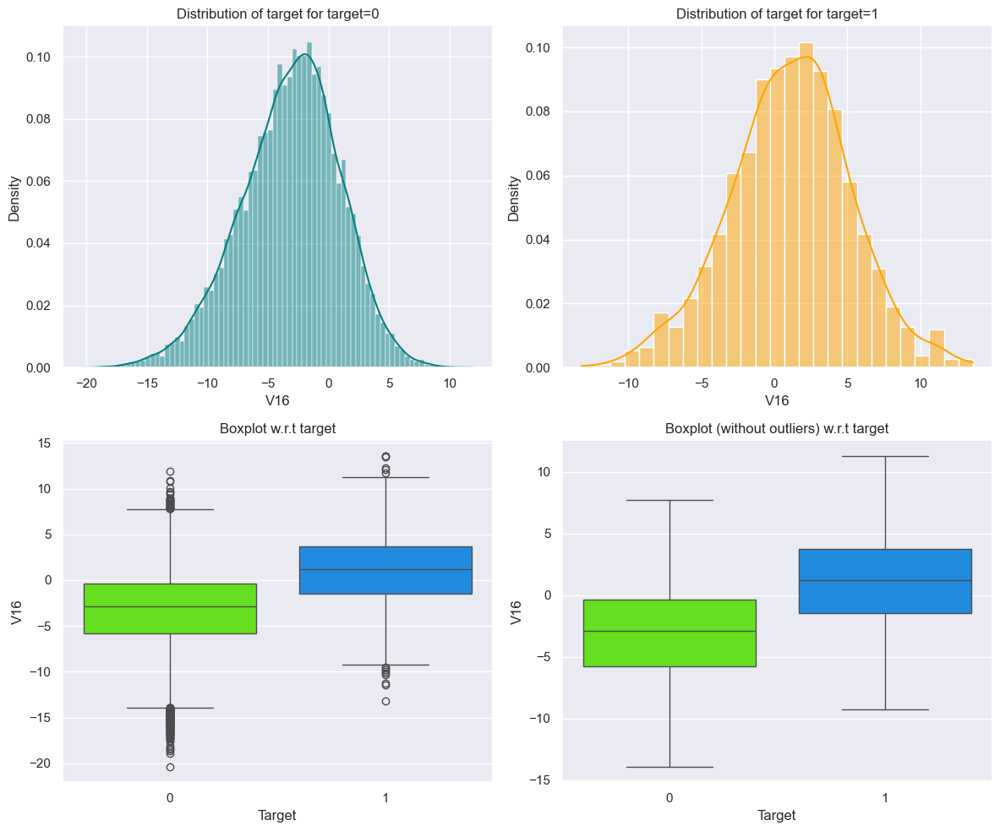

In [27]:
distribution_plot_wrt_target(df_eda, "V16", "Target")


- Failures are associated with higher values of `V16`. This trend is consistent with the previous variables, where failures tend to have higher values. This variable could also help the model in identifying failure events.


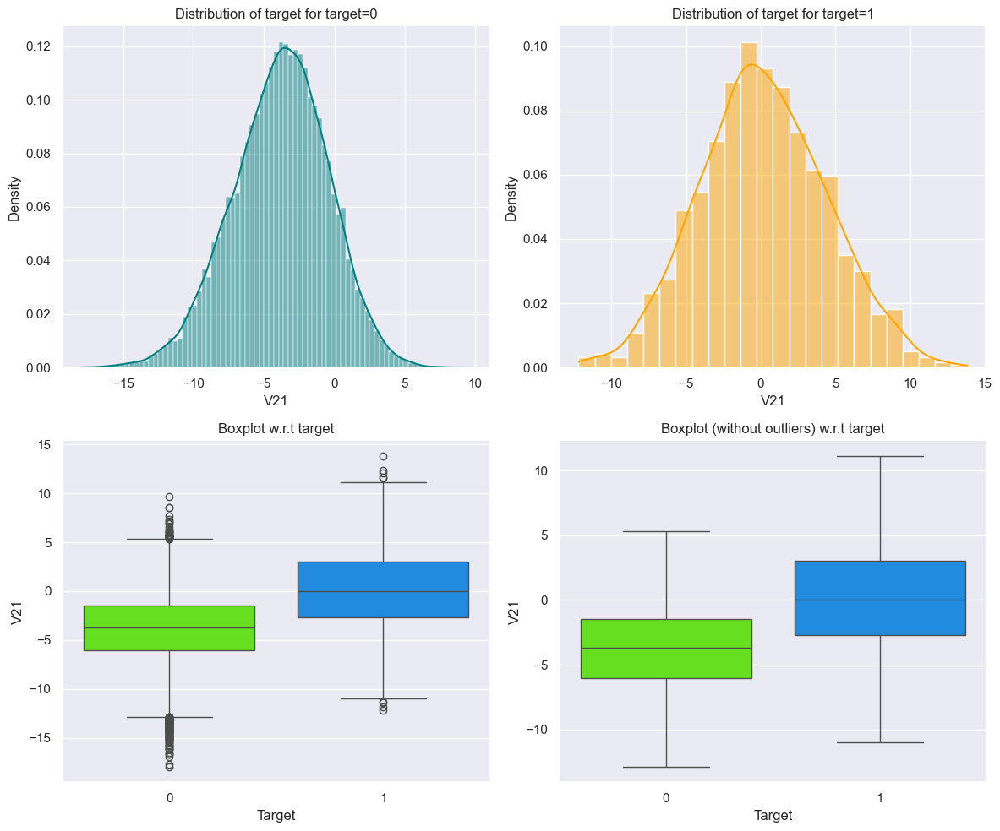

In [28]:
distribution_plot_wrt_target(df_eda, "V21", "Target")


- Like the other variables, `V21` has higher values associated with failure events. The difference between the two groups is clear, with failures showing higher and more spread-out values, making this variable useful for distinguishing between failure and non-failure cases.


## <a id='toc1_4_'></a>[Class Distribution Check](#toc0_)


In [29]:
# Function to calculate and display class distribution
def display_class_distribution(data, dataset_name="Dataset"):
    # Get absolute and relative counts
    class_counts = data["Target"].value_counts()
    class_percentages = data["Target"].value_counts(normalize=True) * 100

    # Create DataFrame for better formatting
    class_distribution_df = pd.DataFrame(
        {"Class Count": class_counts, "Class Percentage (%)": class_percentages}
    )

    # Format percentage column to two decimal places
    class_distribution_df["Class Percentage (%)"] = class_distribution_df[
        "Class Percentage (%)"
    ].apply(lambda x: f"{x:.2f}%")

    print(f"\nClass Distribution in {dataset_name}:")
    display(class_distribution_df)


# Check class distribution for train and test data
display_class_distribution(df, "Train Data")
display_class_distribution(df_test, "Test Data")



Class Distribution in Train Data:


,Class Count,Class Percentage (%)
Target,,
0,18890,94.45%
1,1110,5.55%



Class Distribution in Test Data:


,Class Count,Class Percentage (%)
Target,,
0,4718,94.36%
1,282,5.64%


## <a id='toc1_5_'></a>[Data Pre-processing](#toc0_)


- We will start by performing basic data preprocessing steps. Our objective is to prevent data leakage, we will be doing imputation of missing values after splitting the data.
- Since we already have a separate test set, we don't need to divide data into train, validation and test. Only into Train and Validation.
- As mentioned before, there is no ID column nor other column that seems relevant to drop.
- Since there are no categorical variables, we know that we wont need to do hot encoding.


### <a id='toc1_5_1_'></a>[Outlier detection and treatment.](#toc0_)


In [ ]:
# Copying data to another variable to avoid any changes to original data
df_model = df_eda.copy()


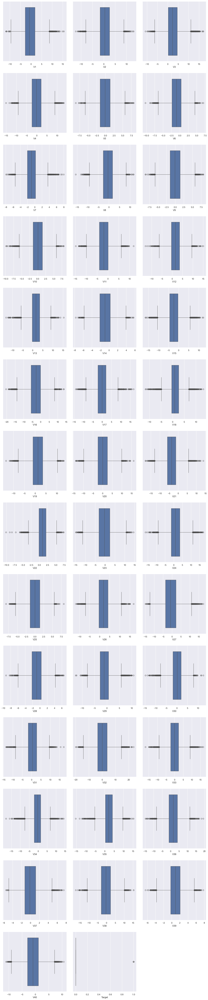


Summary of the numerical features, including outliers:


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
count,19982.0000,19982.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000,20000.0000
mean,-0.2720,0.4404,2.4847,-0.0832,-0.0538,-0.9954,-0.8793,-0.5482,-0.0168,-0.0130,-1.8954,1.6048,1.5805,-0.9506,-2.4150,-2.9252,-0.1343,1.1893,1.1818,0.0236,-3.6113,0.9518,-0.3661,1.1344,-0.0022,1.8738,-0.6124,-0.8832,-0.9856,-0.0155,0.4868,0.3038,0.0498,-0.4627,2.2296,1.5148,0.0113,-0.3440,0.8907,-0.8756,0.0555
std,3.4416,3.1508,3.3890,3.4316,2.1048,2.0410,1.7616,3.2958,2.1606,2.1932,3.1243,2.9305,2.8747,1.7897,3.3550,4.2217,3.3455,2.5923,3.3969,3.6695,3.5677,1.6515,4.0319,3.9121,2.0167,3.4351,4.3688,1.9177,2.6844,3.0053,3.4614,5.5004,3.5753,3.1838,2.9371,3.8009,1.7882,3.9481,1.7531,3.0122,0.2290
min,-11.8765,-12.3200,-10.7081,-15.0821,-8.6034,-10.2271,-7.9497,-15.6576,-8.5963,-9.8540,-14.8321,-12.9480,-13.2282,-7.7386,-16.4166,-20.3742,-14.0912,-11.6440,-13.4918,-13.9227,-17.9562,-10.1221,-14.8661,-16.3871,-8.2283,-11.8343,-14.9049,-9.2695,-12.5795,-14.7960,-13.7228,-19.8765,-16.8984,-17.9851,-15.3498,-14.8332,-5.4784,-17.3750,-6.4389,-11.0239,0.0000
25%,-2.7371,-1.6407,0.2069,-2.3477,-1.5356,-2.3472,-2.0309,-2.6427,-1.4950,-1.4112,-3.9224,-0.3965,-0.2235,-2.1707,-4.4153,-5.6342,-2.2156,-0.4039,-1.0502,-2.4330,-5.9304,-0.1181,-3.0988,-1.4681,-1.3652,-0.3379,-3.6523,-2.1712,-2.7874,-1.8671,-1.8178,-3.4205,-2.2429,-2.1370,0.3362,-0.9438,-1.2558,-2.9876,-0.2723,-2.9402,0.0000
50%,-0.7479,0.4715,2.2558,-0.1352,-0.1020,-1.0005,-0.9172,-0.3891,-0.0676,0.1010,-1.9212,1.5078,1.6372,-0.9572,-2.3826,-2.6827,-0.0146,0.8834,1.2791,0.0334,-3.5329,0.9747,-0.2621,0.9690,0.0251,1.9505,-0.8849,-0.8911,-1.1762,0.1843,0.4903,0.0521,-0.0662,-0.2550,2.0986,1.5665,-0.1284,-0.3168,0.9193,-0.9208,0.0000
75%,1.8401,2.5440,4.5662,2.1306,1.3405,0.3803,0.2237,1.7230,1.4092,1.4770,0.1189,3.5715,3.4599,0.2707,-0.3591,-0.0950,2.0688,2.5718,3.4933,2.5124,-1.2659,2.0256,2.4517,3.5460,1.3971,4.1300,2.1892,0.3759,0.6298,2.0362,2.7307,3.7617,2.2551,1.4369,4.0644,3.9839,1.1755,2.2794,2.0575,1.1199,0.0000
max,15.4930,13.0893,17.0909,13.2364,8.1338,6.9758,8.0061,11.6795,8.1376,8.1085,11.8264,15.0807,15.4196,5.6707,12.2465,13.5832,16.7564,13.1799,13.2377,16.0523,13.8405,7.4099,14.4587,17.1633,8.2234,16.8364,17.5604,6.5276,10.7221,12.5058,17.2551,23.6332,16.6925,14.3582,15.2911,19.3296,7.4670,15.2899,7.7599,10.6543,1.0000


In [31]:
# Outlier detection using boxplot
# Creating a list of numerical columns
numeric_columns = df_model.select_dtypes(include=np.number).columns.tolist()

# Calculate the number of rows needed for the subplots
num_plots = len(num_cols)
num_rows = (num_plots // 3) + (num_plots % 3 > 0)

# Create subplots
plt.figure(figsize=(15, num_rows * 5))
for i, variable in enumerate(num_cols):
    plt.subplot(num_rows, 3, i + 1)
    sns.boxplot(data=df_model, x=variable)
    plt.tight_layout(pad=2)
plt.show()

# Check for outliers in continuous variables
outliers = df_model[num_cols].describe()
print("\nSummary of the numerical features, including outliers:")
display(outliers)


- Since the outliers are close to one another we wont be doing any outlier treatment.


### <a id='toc1_5_2_'></a>[Data Preparation for Modeling](#toc0_)


In [32]:
# Step 1: Define and Prepare the Data
X = df_model.drop("Target", axis=1)
y = df_model["Target"]

display(X.head())
display(y.head())


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40
0,-4.4646,-4.6791,3.1015,0.5061,-0.2211,-2.0325,-2.9109,0.0507,-1.5224,3.7619,-5.7147,0.7359,0.9813,1.4179,-3.3758,-3.0473,0.3062,2.9141,2.2700,4.3949,-2.3883,0.6464,-1.1905,3.1330,0.6653,-2.5108,-0.0367,0.7262,-3.9822,-1.0726,1.6671,3.0597,-1.6904,2.8463,2.2352,6.6675,0.4438,-2.3692,2.9506,-3.4803
1,3.3659,3.6534,0.9097,-1.3675,0.3320,2.3589,0.7326,-4.3321,0.5657,-0.1011,1.9145,-0.9515,-1.2553,-2.7065,0.1932,-4.7694,-2.2053,0.9077,0.7569,-5.8337,-3.0651,1.5966,-1.7573,1.7664,-0.2671,3.6250,1.5003,-0.5857,0.7830,-0.2012,0.0249,-1.7955,3.0328,-2.4675,1.8946,-2.2978,-1.7310,5.9088,-0.3863,0.6162
2,-3.8318,-5.8244,0.6340,-2.4188,-1.7738,1.0168,-2.0989,-3.1732,-2.0819,5.3926,-0.7707,1.1067,1.1443,0.9433,-3.1638,-4.2478,-4.0389,3.6885,3.3112,1.0590,-2.1430,1.6501,-1.6606,1.6799,-0.4508,-4.5507,3.7388,1.1344,-2.0335,0.8408,-1.6004,-0.2571,0.8035,4.0862,2.2921,5.3608,0.3520,2.9400,3.8392,-4.3094
3,1.6181,1.8883,7.0461,-1.1473,0.0831,-1.5298,0.2073,-2.4936,0.3449,2.1186,-3.0530,0.4597,2.7045,-0.6361,-0.4537,-3.1740,-3.4043,-1.2815,1.5821,-1.9518,-3.5166,-1.2060,-5.6279,-1.8177,2.1241,5.2946,4.7481,-2.3085,-3.9630,-6.0287,4.9488,-3.5844,-2.5775,1.3638,0.6227,5.5501,-1.5268,0.1389,3.1014,-1.2774
4,-0.1114,3.8725,-3.7584,-2.9829,3.7927,0.5450,0.2054,4.8490,-1.8549,-6.2200,1.9983,4.7238,0.7091,-1.9894,-2.6327,4.1844,2.2454,3.7345,-6.3128,-5.3799,-0.8867,2.0617,9.4456,4.4900,-3.9451,4.5821,-8.7804,-3.3830,5.1065,6.7875,2.0442,8.2659,6.6292,-10.0687,1.2230,-3.2298,1.6869,-2.1639,-3.6446,6.5103


0    0
1    0
2    0
3    0
4    0
Name: Target, dtype: int64

- When classification problems exhibit a significant imbalance in the distribution of the target classes, it is good to use stratified sampling to ensure that relative class frequencies are approximately preserved in train and test sets.
- This is done using the `stratify` parameter in the train_test_split function.


In [33]:
# Splitting train dataset into training and validation set (75% train, 25% validation), using stratify to maintain target distribution
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.25, random_state=42, stratify=y
)

# Checking the number of rows and columns in the X_train data
print(
    "There are",
    X_train.shape[0],
    "rows and",
    X_train.shape[1],
    "columns in the Training set.",
    X_train.shape,
)

# Checking the number of rows and columns in the X_val data
print(
    "There are",
    X_val.shape[0],
    "rows and",
    X_val.shape[1],
    "columns in the Test set.",
    X_val.shape,
)


There are 15000 rows and 40 columns in the Training set. (15000, 40)
There are 5000 rows and 40 columns in the Test set. (5000, 40)


In [34]:
print("Percentage of classes in training set:")
print(y_train.value_counts(normalize=True) * 100)

print("")

print("Percentage of classes in validation set:")
print(y_val.value_counts(normalize=True) * 100)


Percentage of classes in training set:
Target
0   94.4467
1    5.5533
Name: proportion, dtype: float64

Percentage of classes in validation set:
Target
0   94.4600
1    5.5400
Name: proportion, dtype: float64


In [35]:
# Dividing test data into X_test and y_test
X_test = df_test.drop(["Target"], axis=1)
y_test = df_test["Target"]

display(X_test.head())
display(y_test.head())


,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40
0,-0.6135,-3.8196,2.2023,1.3004,-1.1849,-4.4960,-1.8358,4.7230,1.2061,-0.3419,-5.1229,1.0170,4.8185,3.2690,-2.9843,1.3874,2.0320,-0.5116,-1.0231,7.3387,-2.2422,0.1555,2.0538,-2.7723,1.8514,-1.7887,-0.2773,-1.2551,-3.8329,-1.5045,1.5868,2.2912,-5.4114,0.8701,0.5745,4.1572,1.4281,-10.5113,0.4547,-1.4484
1,0.3896,-0.5123,0.5271,-2.5768,-1.0168,2.2351,-0.4413,-4.4057,-0.3329,1.9668,1.7965,0.4105,0.6383,-1.3896,-1.8834,-5.0179,-3.8272,2.4181,1.7623,-3.2423,-3.1930,1.8575,-1.7080,0.6334,-0.5879,0.0837,3.0139,-0.1823,0.2239,0.8652,-1.7822,-2.4749,2.4936,0.3152,2.0593,0.6839,-0.4855,5.1284,1.7207,-1.4882
2,-0.8749,-0.6406,4.0842,-1.5905,0.5259,-1.9576,-0.6954,1.3473,-1.7323,0.4665,-4.9282,3.5651,-0.4493,-0.6562,-0.1665,-1.6302,2.2919,2.3965,0.6013,1.7935,-2.1202,0.4820,-0.8407,1.7902,1.8744,0.3639,-0.1691,-0.4838,-2.1190,-2.1566,2.9073,-1.3189,-2.9975,0.4597,0.6198,5.6315,1.3235,-1.7522,1.8083,1.6757
3,0.2384,1.4586,4.0145,2.5345,1.1970,-3.1173,-0.9240,0.2695,1.3224,0.7023,-5.5783,-0.8507,2.5905,0.7674,-2.3908,-2.3420,0.5719,-0.9338,0.5087,1.2107,-3.2595,0.1046,-0.6589,1.4981,1.1003,4.1430,-0.2484,-1.1365,-5.3558,-4.5459,3.8087,3.5179,-3.0741,-0.2842,0.9546,3.0293,-1.3672,-3.4121,0.9060,-2.4509
4,5.8282,2.7683,-1.2345,2.8093,-1.6416,-1.4067,0.5686,0.9650,1.9184,-2.7749,-0.5300,1.3745,-0.6509,-1.6795,-0.3792,-4.4431,3.8939,-0.6076,2.9449,0.3672,-5.7891,4.5975,4.4503,3.2249,0.3967,0.2478,-2.3620,1.0794,-0.4731,2.2428,-3.5914,1.7738,-1.5016,-2.2267,4.7768,-6.5597,-0.8056,-0.2760,-3.8582,-0.5377


0    0
1    0
2    0
3    0
4    0
Name: Target, dtype: int64

In [36]:
# Checking the number of rows and columns in the X_test data
print(
    "There are",
    X_test.shape[0],
    "rows and",
    X_test.shape[1],
    "columns in the Test set.",
    X_test.shape,
)


There are 5000 rows and 40 columns in the Test set. (5000, 40)


In [37]:
print("Percentage of classes in test set:")
print(y_test.value_counts(normalize=True) * 100)


Percentage of classes in test set:
Target
0   94.3600
1    5.6400
Name: proportion, dtype: float64


## <a id='toc1_6_'></a>[Missing value imputation](#toc0_)


In [38]:
# Creating an instance of the imputer to be used
imputer = SimpleImputer(strategy="median")


In [39]:
# Fit and transform the train data
X_train = pd.DataFrame(imputer.fit_transform(X_train), columns=X_train.columns)

# Transform the validation data without data leakage (using the same imputer trained on X_train)
X_val = pd.DataFrame(imputer.transform(X_val), columns=X_train.columns)

# Transform the test data without data leakage
X_test = pd.DataFrame(imputer.transform(X_test), columns=X_train.columns)


In [40]:
# Checking that no column has missing values in train, validation, or test sets
print("Missing values on the Train dataset")
print(X_train.isna().sum())
print("-" * 50)

print("Missing values on the Validation dataset")
print(X_val.isna().sum())  # Checking missing values in validation set
print("-" * 50)

print("Missing values on the Test dataset")
print(X_test.isna().sum())  # Checking missing values in test set


Missing values on the Train dataset
V1     0
V2     0
V3     0
V4     0
V5     0
V6     0
V7     0
V8     0
V9     0
V10    0
V11    0
V12    0
V13    0
V14    0
V15    0
V16    0
V17    0
V18    0
V19    0
V20    0
V21    0
V22    0
V23    0
V24    0
V25    0
V26    0
V27    0
V28    0
V29    0
V30    0
V31    0
V32    0
V33    0
V34    0
V35    0
V36    0
V37    0
V38    0
V39    0
V40    0
dtype: int64
--------------------------------------------------
Missing values on the Validation dataset
V1     0
V2     0
V3     0
V4     0
V5     0
V6     0
V7     0
V8     0
V9     0
V10    0
V11    0
V12    0
V13    0
V14    0
V15    0
V16    0
V17    0
V18    0
V19    0
V20    0
V21    0
V22    0
V23    0
V24    0
V25    0
V26    0
V27    0
V28    0
V29    0
V30    0
V31    0
V32    0
V33    0
V34    0
V35    0
V36    0
V37    0
V38    0
V39    0
V40    0
dtype: int64
--------------------------------------------------
Missing values on the Test dataset
V1     0
V2     0
V3     0
V4     0
V5  

## <a id='toc1_7_'></a>[Model Building](#toc0_)


### <a id='toc1_7_1_'></a>[Model evaluation criterion](#toc0_)


The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are failures correctly predicted by the model.
- False negatives (FN) are real failures in a generator where there is no detection by model.
- False positives (FP) are failure detections in a generator where there is no failure.

**Which metric to optimize?**

- We need to choose the metric which will ensure that the maximum number of generator failures are predicted correctly by the model.
- We would want `Recall` to be maximized as greater the Recall, the higher the chances of minimizing false negatives.
- We want to minimize false negatives because if a model predicts that a machine will have no failure when there will be a failure, it will increase the maintenance cost.


**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**


In [41]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance.
    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)
    recall = recall_score(target, pred)
    precision = precision_score(target, pred)
    f1 = f1_score(target, pred)

    # Adding classification report for a detailed overview
    class_report = classification_report(
        target, pred, target_names=["No Failure", "Failure"]
    )

    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1},
        index=[0],
    )

    print("\nClassification Report:\n", class_report)

    return df_perf


In [42]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages and improved visuals.
    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)

    plt.figure(figsize=(6, 4))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cbar=False,
        xticklabels=["No Failure", "Failure"],
        yticklabels=["No Failure", "Failure"],
    )
    plt.title("Confusion Matrix")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.show()


### <a id='toc1_7_2_'></a>[Defining scorer to be used for cross-validation and hyperparameter tuning](#toc0_)


- We want to reduce false negatives and will try to maximize "Recall".
- To maximize Recall, we can use Recall as a **scorer** in cross-validation and hyperparameter tuning.


In [43]:
# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)


### <a id='toc1_7_3_'></a>[Building Initial Models](#toc0_)


### <a id='toc1_7_4_'></a>[Model Building with original data](#toc0_)


In [44]:
print("Counts of label 'Yes' in Training Set: {}".format(sum(y_train == 1)))
print("Counts of label 'No' in Training Set: {} \n".format(sum(y_train == 0)))

# Checking the number of rows and columns in the X_train data
print(
    "There are",
    X_train.shape[0],
    "rows and",
    X_train.shape[1],
    "columns in the train_X set: {}".format(X_train.shape),
)

# Checking the number of rows and columns in the X_train data
print(
    "There are",
    y_train.shape[0],
    "rows and 0",
    "columns in the train_y set: {} \n".format(y_train.shape),
)


Counts of label 'Yes' in Training Set: 833
Counts of label 'No' in Training Set: 14167 

There are 15000 rows and 40 columns in the train_X set: (15000, 40)
There are 15000 rows and 0 columns in the train_y set: (15000,) 



#### <a id='toc1_7_4_1_'></a>[XGBoost](#toc0_)


In [45]:
# Default XGBoost classifier
xgbc_original = XGBClassifier(random_state=1, eval_metric="logloss")
xgbc_original.fit(X_train, y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00     14167
     Failure       1.00      1.00      1.00       833

    accuracy                           1.00     15000
   macro avg       1.00      1.00      1.00     15000
weighted avg       1.00      1.00      1.00     15000



,Accuracy,Recall,Precision,F1
0,1.0000,1.0000,1.0000,1.0000


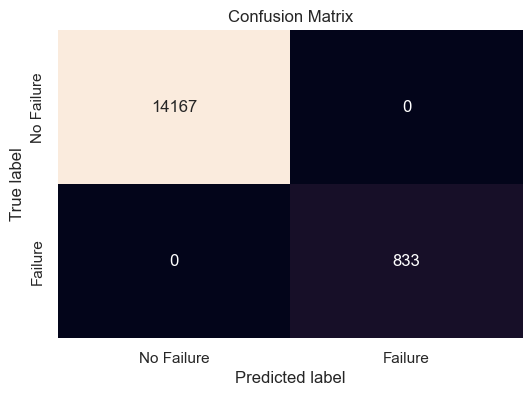

In [46]:
# Evaluate the model on the training data
print("Training Performance:")
xgbc_original_perf_train = model_performance_classification_sklearn(
    xgbc_original, X_train, y_train
)
display(xgbc_original_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(xgbc_original, X_train, y_train)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      1.00      0.99      4723
     Failure       0.96      0.83      0.89       277

    accuracy                           0.99      5000
   macro avg       0.98      0.92      0.94      5000
weighted avg       0.99      0.99      0.99      5000



,Accuracy,Recall,Precision,F1
0,0.9890,0.8339,0.9625,0.8936


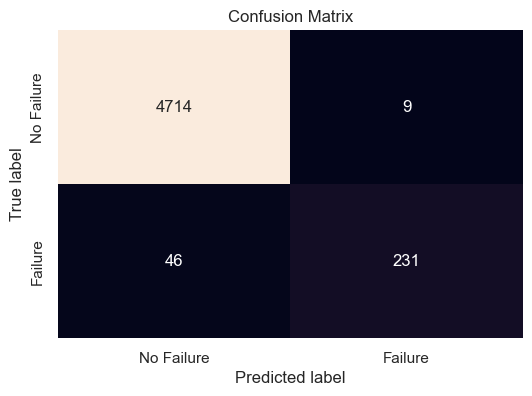

In [47]:
# Evaluate the model on the validation data
print("Validation Performance:")
xgbc_original_perf_val = model_performance_classification_sklearn(
    xgbc_original, X_val, y_val
)
display(xgbc_original_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(xgbc_original, X_val, y_val)


#### <a id='toc1_7_4_2_'></a>[Random Forest](#toc0_)


In [48]:
from sklearn.ensemble import RandomForestClassifier

# Initialize the random forest classifier with optimized hyperparameters
rfc_original = RandomForestClassifier(random_state=1)
rfc_original.fit(X_train, y_train)


RandomForestClassifier(random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00     14167
     Failure       1.00      1.00      1.00       833

    accuracy                           1.00     15000
   macro avg       1.00      1.00      1.00     15000
weighted avg       1.00      1.00      1.00     15000



,Accuracy,Recall,Precision,F1
0,1.0000,1.0000,1.0000,1.0000


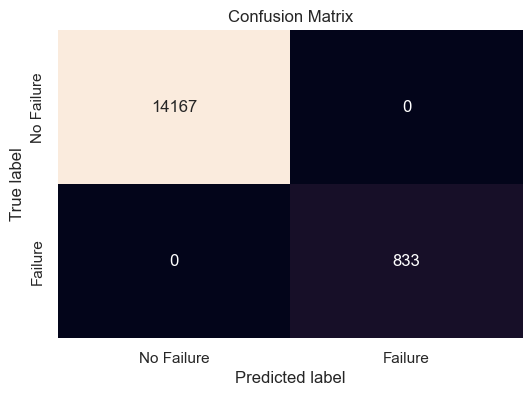

In [49]:
# Evaluate the model on the training data
print("Training Performance:")
rfc_original_perf_train = model_performance_classification_sklearn(
    rfc_original, X_train, y_train
)
display(rfc_original_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(rfc_original, X_train, y_train)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      1.00      0.99      4723
     Failure       0.99      0.75      0.85       277

    accuracy                           0.99      5000
   macro avg       0.99      0.88      0.92      5000
weighted avg       0.99      0.99      0.98      5000



,Accuracy,Recall,Precision,F1
0,0.9856,0.7509,0.9858,0.8525


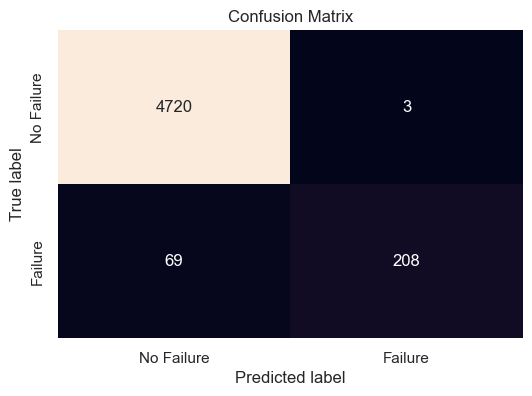

In [50]:
# Evaluate the model on the validation data
print("Validation Performance:")
rfc_original_perf_val = model_performance_classification_sklearn(
    rfc_original, X_val, y_val
)
display(rfc_original_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(rfc_original, X_val, y_val)


#### <a id='toc1_7_4_3_'></a>[Decision Tree](#toc0_)


Since recall is our primary concern (reducing false negatives):

- `Gini impurity` might work well, as it can quickly identify the dominant class (non-failure vs. failure) and create pure splits, helping in capturing failures (which are minority cases).
- However, `entropy` might help create better-balanced splits, leading to better recall for minority classes (failures).

I will be comparing both `Gini impurity` and `entropy` to determine which performs better and will be used for the model.


In [51]:
from sklearn.tree import DecisionTreeClassifier

# Initialize the decision tree classifier with Gini impurity
dtc_gini_original = DecisionTreeClassifier(criterion="gini", random_state=1)
# Train the model on the training data
dtc_gini_original.fit(X_train, y_train)

# Initialize the decision tree classifier with Entropy
dtc_ent_original = DecisionTreeClassifier(criterion="entropy", random_state=1)
# Train the model on the training data
dtc_ent_original.fit(X_train, y_train)

# Compare the two models based on their recall scores:
print("Recall with Gini:", recall_score(y_val, dtc_gini_original.predict(X_val)))
print("Recall with Entropy:", recall_score(y_val, dtc_ent_original.predict(X_val)))


Recall with Gini: 0.7256317689530686
Recall with Entropy: 0.7292418772563177


- Recall with Entropy is greater than Gini. Therefore, `entropy` will be used.


In [52]:
# Initialize the decision tree classifier with Entropy
dtc_ent_original = DecisionTreeClassifier(criterion="entropy", random_state=1)

# Train the model on the training data
dtc_ent_original.fit(X_train, y_train)


DecisionTreeClassifier(criterion='entropy', random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00     14167
     Failure       1.00      1.00      1.00       833

    accuracy                           1.00     15000
   macro avg       1.00      1.00      1.00     15000
weighted avg       1.00      1.00      1.00     15000



,Accuracy,Recall,Precision,F1
0,1.0000,1.0000,1.0000,1.0000


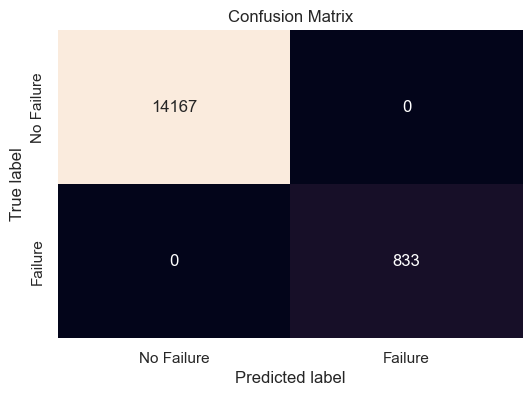

In [53]:
# Evaluate the model on the training data
print("Training Performance:")
dtc_ent_original_perf_train = model_performance_classification_sklearn(
    dtc_ent_original, X_train, y_train
)
display(dtc_ent_original_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(dtc_ent_original, X_train, y_train)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.98      0.99      0.99      4723
     Failure       0.76      0.73      0.74       277

    accuracy                           0.97      5000
   macro avg       0.87      0.86      0.86      5000
weighted avg       0.97      0.97      0.97      5000



,Accuracy,Recall,Precision,F1
0,0.9720,0.7292,0.7566,0.7426


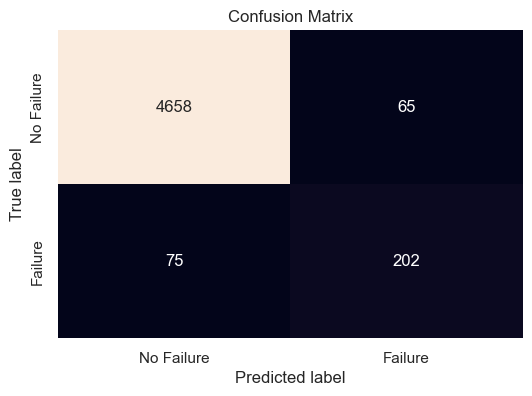

In [54]:
# Evaluate the model on the validation data
print("Validation Performance:")
dtc_ent_original_perf_val = model_performance_classification_sklearn(
    dtc_ent_original, X_val, y_val
)
display(dtc_ent_original_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(dtc_ent_original, X_val, y_val)


#### <a id='toc1_7_4_4_'></a>[Bagging](#toc0_)


In [55]:
# Initialize the Bagging Classifier with more estimators and balanced sampling
bc_original = BaggingClassifier(random_state=1)
bc_original.fit(X_train, y_train)

# Train the model
bc_original.fit(X_train, y_train)


BaggingClassifier(random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00     14167
     Failure       1.00      0.96      0.98       833

    accuracy                           1.00     15000
   macro avg       1.00      0.98      0.99     15000
weighted avg       1.00      1.00      1.00     15000



,Accuracy,Recall,Precision,F1
0,0.9979,0.9628,0.9988,0.9804


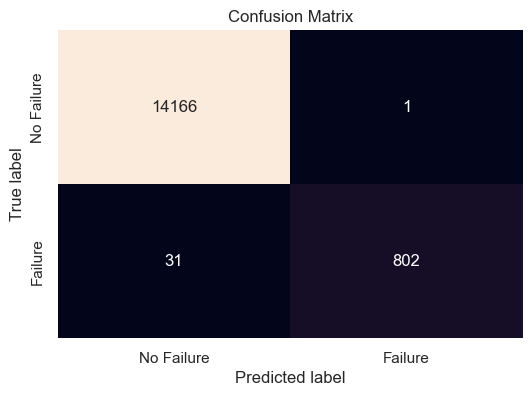

In [56]:
# Evaluate the model on the training data
print("Training Performance:")
bc_original_perf_train = model_performance_classification_sklearn(
    bc_original, X_train, y_train
)
display(bc_original_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(bc_original, X_train, y_train)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.98      1.00      0.99      4723
     Failure       0.96      0.69      0.80       277

    accuracy                           0.98      5000
   macro avg       0.97      0.84      0.90      5000
weighted avg       0.98      0.98      0.98      5000



,Accuracy,Recall,Precision,F1
0,0.9812,0.6895,0.9598,0.8025


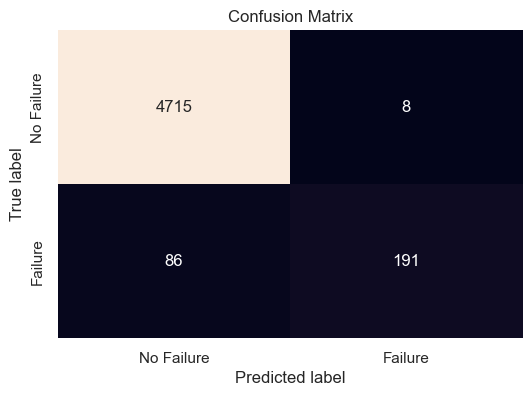

In [57]:
# Evaluate the model on the validation data
print("Validation Performance:")
bc_original_perf_val = model_performance_classification_sklearn(
    bc_original, X_val, y_val
)
display(bc_original_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(bc_original, X_val, y_val)


#### <a id='toc1_7_4_5_'></a>[Gradient Boosting](#toc0_)


In [58]:
gbc_original = GradientBoostingClassifier(random_state=1)
gbc_original.fit(X_train, y_train)


GradientBoostingClassifier(random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      1.00      0.99     14167
     Failure       0.98      0.80      0.88       833

    accuracy                           0.99     15000
   macro avg       0.98      0.90      0.94     15000
weighted avg       0.99      0.99      0.99     15000



,Accuracy,Recall,Precision,F1
0,0.9878,0.8007,0.9751,0.8794


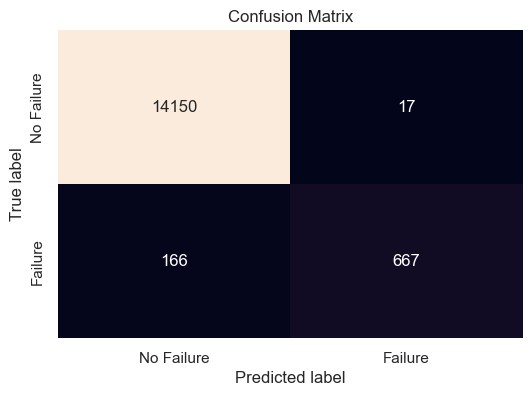

In [59]:
# Evaluate the model on the training data
print("Training Performance:")
gbc_original_perf_train = model_performance_classification_sklearn(
    gbc_original, X_train, y_train
)
display(gbc_original_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(gbc_original, X_train, y_train)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.98      1.00      0.99      4723
     Failure       0.96      0.72      0.82       277

    accuracy                           0.98      5000
   macro avg       0.97      0.86      0.91      5000
weighted avg       0.98      0.98      0.98      5000



,Accuracy,Recall,Precision,F1
0,0.9828,0.7220,0.9569,0.8230


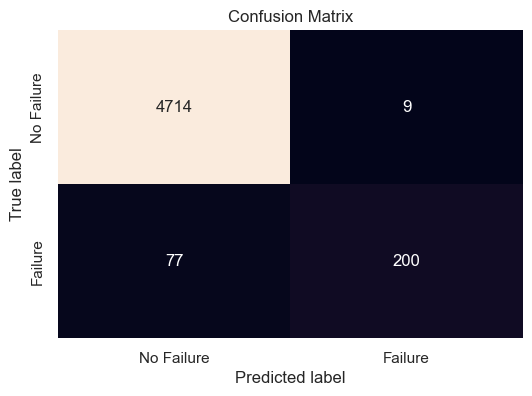

In [60]:
# Evaluate the model on the validation data
print("Validation Performance:")
gbc_original_perf_val = model_performance_classification_sklearn(
    gbc_original, X_val, y_val
)
display(gbc_original_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(gbc_original, X_val, y_val)


#### <a id='toc1_7_4_6_'></a>[Ada Boosting](#toc0_)


In [61]:
abc_original = AdaBoostClassifier(random_state=1)
abc_original.fit(X_train, y_train)


AdaBoostClassifier(random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.98      1.00      0.99     14167
     Failure       0.89      0.65      0.75       833

    accuracy                           0.98     15000
   macro avg       0.94      0.82      0.87     15000
weighted avg       0.98      0.98      0.97     15000



,Accuracy,Recall,Precision,F1
0,0.9763,0.6519,0.8931,0.7536


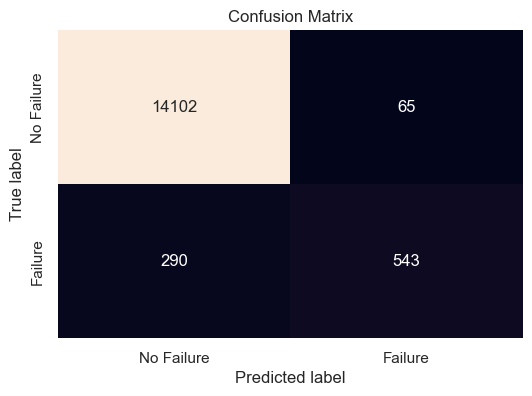

In [62]:
# Evaluate the model on the training data
print("Training Performance:")
abc_original_perf_train = model_performance_classification_sklearn(
    abc_original, X_train, y_train
)
display(abc_original_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(abc_original, X_train, y_train)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.98      1.00      0.99      4723
     Failure       0.91      0.66      0.77       277

    accuracy                           0.98      5000
   macro avg       0.94      0.83      0.88      5000
weighted avg       0.98      0.98      0.98      5000



,Accuracy,Recall,Precision,F1
0,0.9776,0.6643,0.9064,0.7667


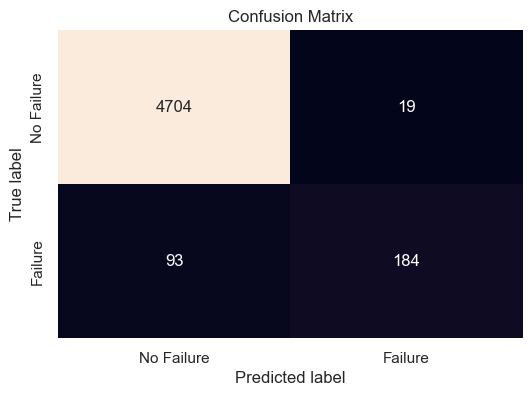

In [63]:
# Evaluate the model on the validation data
print("Validation Performance:")
abc_original_perf_val = model_performance_classification_sklearn(
    abc_original, X_val, y_val
)
display(abc_original_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(abc_original, X_val, y_val)


### <a id='toc1_7_5_'></a>[Model Building with Oversampled data](#toc0_)


In [64]:
print(
    "Before Oversampling, counts of label 'Yes' in Training Set: {}".format(
        sum(y_train == 1)
    )
)
print(
    "Before Oversampling, counts of label 'No' in Training Set: {} \n".format(
        sum(y_train == 0)
    )
)

# Synthetic Minority Over Sampling Technique


sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)

X_train_over, y_train_over = sm.fit_resample(X_train, y_train)


print(
    "After Oversampling, counts of label 'Yes' in Training Set: {}".format(
        sum(y_train_over == 1)
    )
)
print(
    "After Oversampling, counts of label 'No' in Training Set: {} \n".format(
        sum(y_train_over == 0)
    )
)

# Checking the number of rows and columns in the X_train data
print(
    "After Oversampling, there are",
    X_train_over.shape[0],
    "rows and",
    X_train_over.shape[1],
    "columns in the train_X set: {}".format(X_train_over.shape),
)

# Checking the number of rows and columns in the X_train data
print(
    "After Oversampling, there are",
    y_train_over.shape[0],
    "rows and 0",
    "columns in the train_y set: {} \n".format(y_train_over.shape),
)


Before Oversampling, counts of label 'Yes' in Training Set: 833
Before Oversampling, counts of label 'No' in Training Set: 14167 

After Oversampling, counts of label 'Yes' in Training Set: 14167
After Oversampling, counts of label 'No' in Training Set: 14167 

After Oversampling, there are 28334 rows and 40 columns in the train_X set: (28334, 40)
After Oversampling, there are 28334 rows and 0 columns in the train_y set: (28334,) 



#### <a id='toc1_7_5_1_'></a>[XGBoost](#toc0_)


In [65]:
# Default XGBoost classifier
xgbc_overs = XGBClassifier(random_state=1, eval_metric="logloss")
xgbc_overs.fit(X_train_over, y_train_over)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00     14167
     Failure       1.00      1.00      1.00     14167

    accuracy                           1.00     28334
   macro avg       1.00      1.00      1.00     28334
weighted avg       1.00      1.00      1.00     28334



,Accuracy,Recall,Precision,F1
0,1.0000,1.0000,1.0000,1.0000


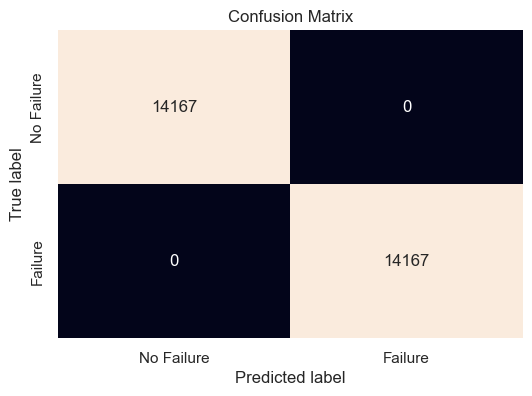

In [66]:
# Evaluate the model on the training data
print("Training Performance:")
xgbc_overs_perf_train = model_performance_classification_sklearn(
    xgbc_overs, X_train_over, y_train_over
)
display(xgbc_overs_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(xgbc_overs, X_train_over, y_train_over)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00     14167
     Failure       1.00      1.00      1.00     14167

    accuracy                           1.00     28334
   macro avg       1.00      1.00      1.00     28334
weighted avg       1.00      1.00      1.00     28334



,Accuracy,Recall,Precision,F1
0,1.0000,1.0000,1.0000,1.0000


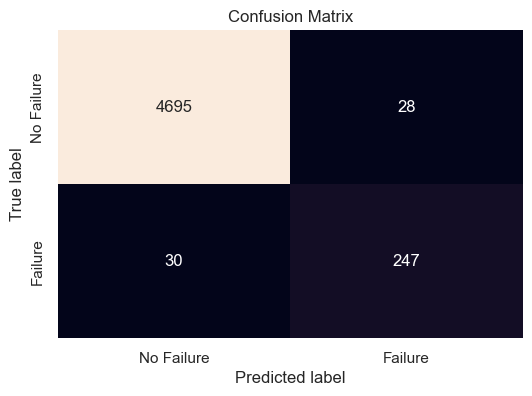

In [67]:
# Evaluate the model on the validation data
print("Validation Performance:")
xgbc_overs_perf_val = model_performance_classification_sklearn(
    xgbc_overs, X_train_over, y_train_over
)
display(xgbc_overs_perf_val)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(xgbc_overs, X_val, y_val)


#### <a id='toc1_7_5_2_'></a>[Random Forest](#toc0_)


In [68]:
from sklearn.ensemble import RandomForestClassifier

# Initialize the random forest classifier with optimized hyperparameters
rfc_overs = RandomForestClassifier(random_state=1)
rfc_overs.fit(X_train_over, y_train_over)


RandomForestClassifier(random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00     14167
     Failure       1.00      1.00      1.00     14167

    accuracy                           1.00     28334
   macro avg       1.00      1.00      1.00     28334
weighted avg       1.00      1.00      1.00     28334



,Accuracy,Recall,Precision,F1
0,1.0000,1.0000,1.0000,1.0000


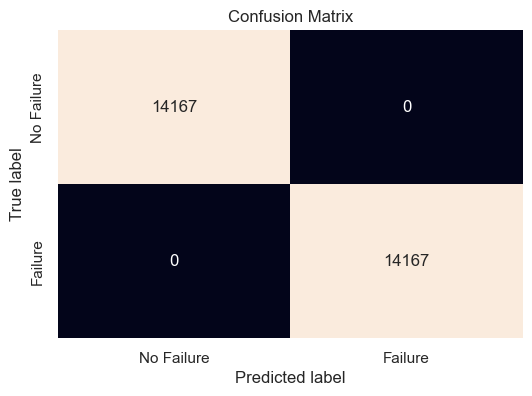

In [69]:
# Evaluate the model on the training data
print("Training Performance:")
rfc_overs_perf_train = model_performance_classification_sklearn(
    rfc_overs, X_train_over, y_train_over
)
display(rfc_overs_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(rfc_overs, X_train_over, y_train_over)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      1.00      0.99      4723
     Failure       0.94      0.86      0.90       277

    accuracy                           0.99      5000
   macro avg       0.97      0.93      0.95      5000
weighted avg       0.99      0.99      0.99      5000



,Accuracy,Recall,Precision,F1
0,0.9896,0.8628,0.9447,0.9019


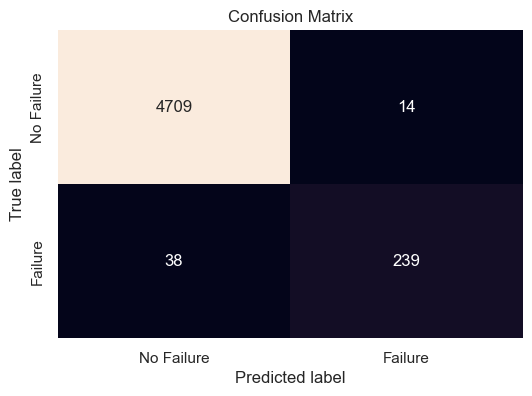

In [70]:
# Evaluate the model on the validation data
print("Validation Performance:")
rfc_overs_perf_val = model_performance_classification_sklearn(rfc_overs, X_val, y_val)
display(rfc_overs_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(rfc_overs, X_val, y_val)


#### <a id='toc1_7_5_3_'></a>[Decision Tree](#toc0_)


Earlier we determined that `entropy` yields better results.


In [71]:
from sklearn.tree import DecisionTreeClassifier

# Initialize the decision tree classifier with Entropy
dtc_ent_overs = DecisionTreeClassifier(criterion="entropy", random_state=1)

# Train the model on the training data
dtc_ent_overs.fit(X_train_over, y_train_over)


DecisionTreeClassifier(criterion='entropy', random_state=1)

In [72]:
# Initialize the decision tree classifier with Entropy
dtc_ent_overs = DecisionTreeClassifier(criterion="entropy", random_state=1)

# Train the model on the training data (oversampled)
dtc_ent_overs.fit(X_train_over, y_train_over)


DecisionTreeClassifier(criterion='entropy', random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00     14167
     Failure       1.00      1.00      1.00     14167

    accuracy                           1.00     28334
   macro avg       1.00      1.00      1.00     28334
weighted avg       1.00      1.00      1.00     28334



,Accuracy,Recall,Precision,F1
0,1.0000,1.0000,1.0000,1.0000


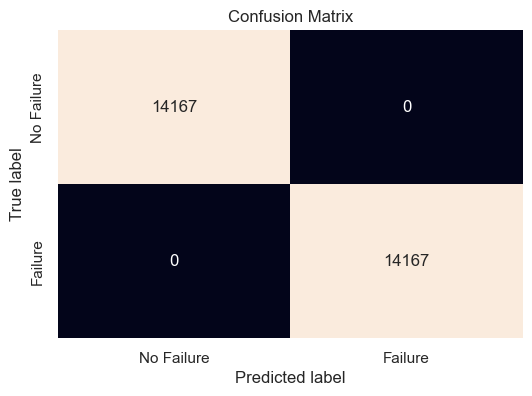

In [73]:
# Evaluate the model on the training data
print("Training Performance:")
dtc_ent_overs_perf_train = model_performance_classification_sklearn(
    dtc_ent_overs, X_train_over, y_train_over
)
display(dtc_ent_overs_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(dtc_ent_overs, X_train_over, y_train_over)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.96      0.97      4723
     Failure       0.52      0.82      0.64       277

    accuracy                           0.95      5000
   macro avg       0.76      0.89      0.81      5000
weighted avg       0.96      0.95      0.95      5000



,Accuracy,Recall,Precision,F1
0,0.9488,0.8195,0.5242,0.6394


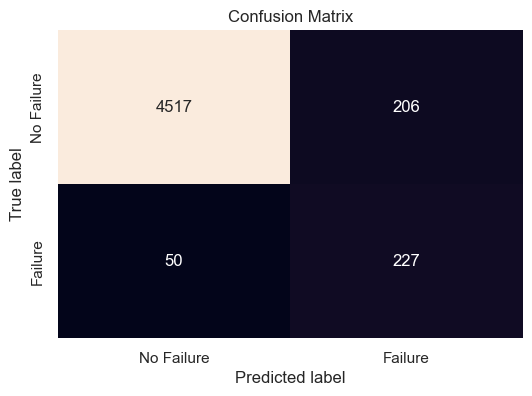

In [74]:
# Evaluate the model on the validation data
print("Validation Performance:")
dtc_ent_overs_perf_val = model_performance_classification_sklearn(
    dtc_ent_overs, X_val, y_val
)
display(dtc_ent_overs_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(dtc_ent_overs, X_val, y_val)


#### <a id='toc1_7_5_4_'></a>[Bagging](#toc0_)


In [75]:
# Initialize the Bagging Classifier with more estimators and balanced sampling
bc_overs = BaggingClassifier(random_state=1)
bc_overs.fit(X_train_over, y_train_over)

# Train the model
bc_overs.fit(X_train_over, y_train_over)


BaggingClassifier(random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00     14167
     Failure       1.00      1.00      1.00     14167

    accuracy                           1.00     28334
   macro avg       1.00      1.00      1.00     28334
weighted avg       1.00      1.00      1.00     28334



,Accuracy,Recall,Precision,F1
0,0.9988,0.9978,0.9999,0.9988


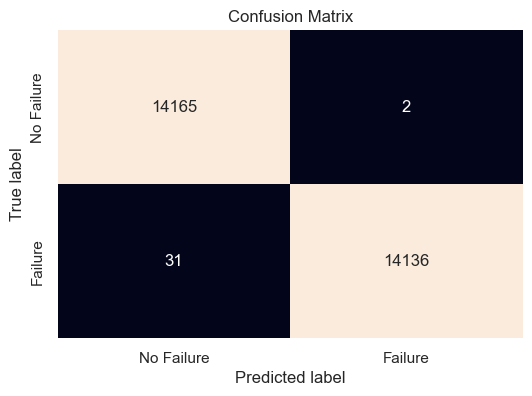

In [76]:
# Evaluate the model on the training data
print("Training Performance:")
bc_overs_perf_train = model_performance_classification_sklearn(
    bc_overs, X_train_over, y_train_over
)
display(bc_overs_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(bc_overs, X_train_over, y_train_over)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.99      0.99      4723
     Failure       0.81      0.83      0.82       277

    accuracy                           0.98      5000
   macro avg       0.90      0.91      0.91      5000
weighted avg       0.98      0.98      0.98      5000



,Accuracy,Recall,Precision,F1
0,0.9800,0.8303,0.8127,0.8214


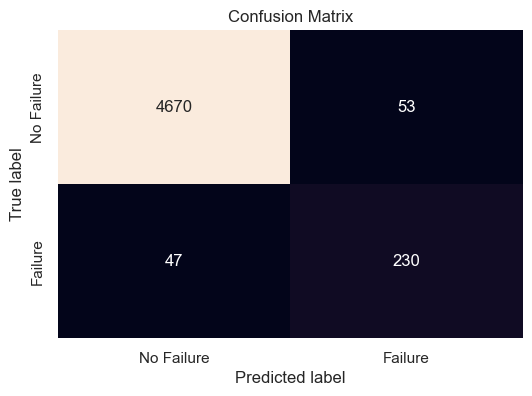

In [77]:
# Evaluate the model on the validation data
print("Validation Performance:")
bc_overs_perf_val = model_performance_classification_sklearn(bc_overs, X_val, y_val)
display(bc_overs_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(bc_overs, X_val, y_val)


#### <a id='toc1_7_5_5_'></a>[Gradient Boosting](#toc0_)


In [78]:
gbc_overs = GradientBoostingClassifier(random_state=1)
gbc_overs.fit(X_train, y_train)


GradientBoostingClassifier(random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.81      1.00      0.89     14167
     Failure       1.00      0.76      0.86     14167

    accuracy                           0.88     28334
   macro avg       0.90      0.88      0.88     28334
weighted avg       0.90      0.88      0.88     28334



,Accuracy,Recall,Precision,F1
0,0.8787,0.7586,0.9984,0.8621


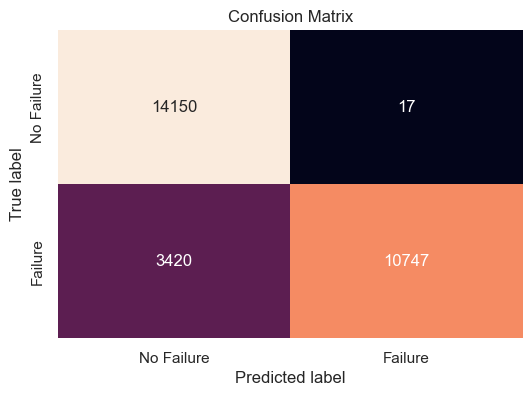

In [79]:
# Evaluate the model on the training data
print("Training Performance:")
gbc_overs_perf_train = model_performance_classification_sklearn(
    gbc_overs, X_train_over, y_train_over
)
display(gbc_overs_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(gbc_overs, X_train_over, y_train_over)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.98      1.00      0.99      4723
     Failure       0.96      0.72      0.82       277

    accuracy                           0.98      5000
   macro avg       0.97      0.86      0.91      5000
weighted avg       0.98      0.98      0.98      5000



,Accuracy,Recall,Precision,F1
0,0.9828,0.7220,0.9569,0.8230


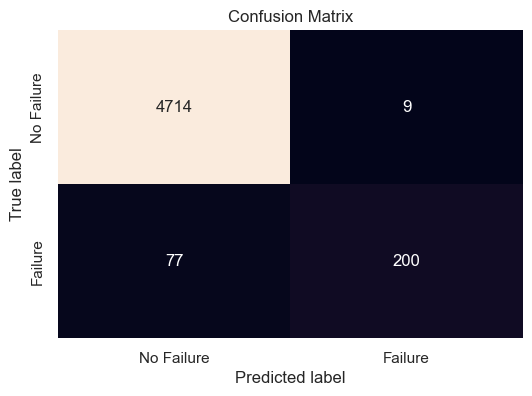

In [80]:
# Evaluate the model on the validation data
print("Validation Performance:")
gbc_overs_perf_val = model_performance_classification_sklearn(gbc_overs, X_val, y_val)
display(gbc_overs_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(gbc_overs, X_val, y_val)


#### <a id='toc1_7_5_6_'></a>[Ada Boosting](#toc0_)


In [81]:
abc_overs = AdaBoostClassifier(random_state=1)
abc_overs.fit(X_train_over, y_train_over)


AdaBoostClassifier(random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.90      0.92      0.91     14167
     Failure       0.92      0.89      0.90     14167

    accuracy                           0.91     28334
   macro avg       0.91      0.91      0.91     28334
weighted avg       0.91      0.91      0.91     28334



,Accuracy,Recall,Precision,F1
0,0.9057,0.8941,0.9152,0.9046


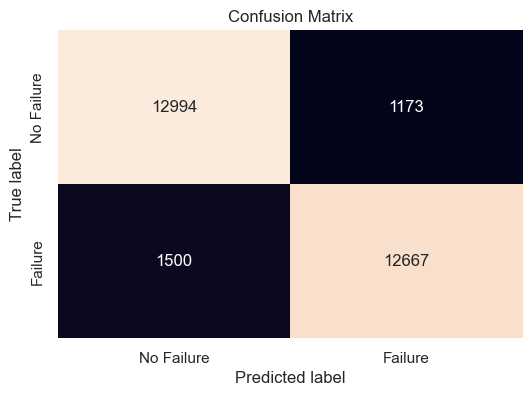

In [82]:
# Evaluate the model on the training data
print("Training Performance:")
abc_overs_perf_train = model_performance_classification_sklearn(
    abc_overs, X_train_over, y_train_over
)
display(abc_overs_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(abc_overs, X_train_over, y_train_over)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.91      0.95      4723
     Failure       0.37      0.88      0.53       277

    accuracy                           0.91      5000
   macro avg       0.68      0.90      0.74      5000
weighted avg       0.96      0.91      0.93      5000



,Accuracy,Recall,Precision,F1
0,0.9116,0.8845,0.3740,0.5258


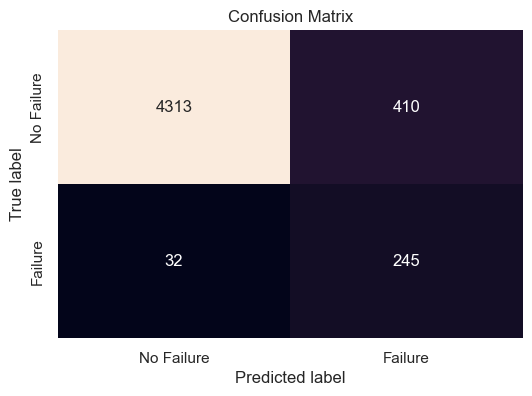

In [83]:
# Evaluate the model on the validation data
print("Validation Performance:")
abc_overs_perf_val = model_performance_classification_sklearn(abc_overs, X_val, y_val)
display(abc_overs_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(abc_overs, X_val, y_val)


### <a id='toc1_7_6_'></a>[Model Building with Undersampled data](#toc0_)


In [84]:
print(
    "Before Undersampling, counts of label 'Yes' in Training Set: {}".format(
        sum(y_train == 1)
    )
)
print(
    "Before Undersampling, counts of label 'No' in Training Set: {} \n".format(
        sum(y_train == 0)
    )
)

# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

print(
    "After Undersampling, counts of label 'Yes' in Training Set: {}".format(
        sum(y_train_un == 1)
    )
)
print(
    "After Undersampling, counts of label 'No' in Training Set: {} \n".format(
        sum(y_train_un == 0)
    )
)

# Checking the number of rows and columns in the X_train data
print(
    "After Undersampling, there are",
    X_train_un.shape[0],
    "rows and",
    X_train_un.shape[1],
    "columns in the train_X set: {}".format(X_train_un.shape),
)

# Checking the number of rows and columns in the X_train data
print(
    "After Undersampling, there are",
    y_train_un.shape[0],
    "rows and 0",
    "columns in the train_y set: {} \n".format(y_train_un.shape),
)


Before Undersampling, counts of label 'Yes' in Training Set: 833
Before Undersampling, counts of label 'No' in Training Set: 14167 

After Undersampling, counts of label 'Yes' in Training Set: 833
After Undersampling, counts of label 'No' in Training Set: 833 

After Undersampling, there are 1666 rows and 40 columns in the train_X set: (1666, 40)
After Undersampling, there are 1666 rows and 0 columns in the train_y set: (1666,) 



#### <a id='toc1_7_6_1_'></a>[XGBoost](#toc0_)


In [85]:
# Default XGBoost classifier
xgbc_unders = XGBClassifier(random_state=1, eval_metric="logloss")
xgbc_unders.fit(X_train_un, y_train_un)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00       833
     Failure       1.00      1.00      1.00       833

    accuracy                           1.00      1666
   macro avg       1.00      1.00      1.00      1666
weighted avg       1.00      1.00      1.00      1666



,Accuracy,Recall,Precision,F1
0,1.0000,1.0000,1.0000,1.0000


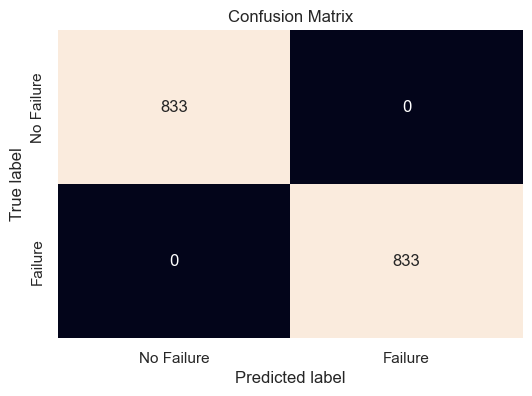

In [86]:
# Evaluate the model on the training data
print("Training Performance:")
xgbc_unders_perf_train = model_performance_classification_sklearn(
    xgbc_unders, X_train_un, y_train_un
)
display(xgbc_unders_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(xgbc_unders, X_train_un, y_train_un)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.94      0.97      4723
     Failure       0.47      0.90      0.62       277

    accuracy                           0.94      5000
   macro avg       0.73      0.92      0.79      5000
weighted avg       0.96      0.94      0.95      5000



,Accuracy,Recall,Precision,F1
0,0.9390,0.8953,0.4733,0.6192


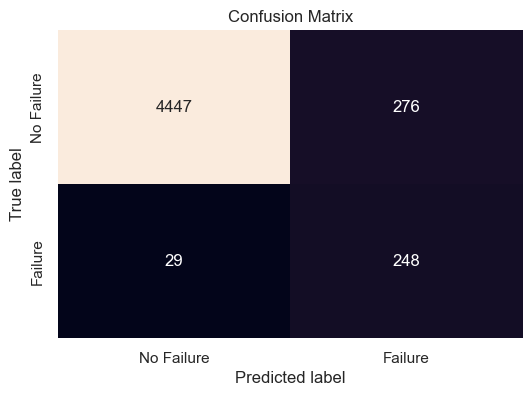

In [87]:
# Evaluate the model on the validation data
print("Validation Performance:")
xgbc_unders_perf_val = model_performance_classification_sklearn(
    xgbc_unders, X_val, y_val
)
display(xgbc_unders_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(xgbc_unders, X_val, y_val)


#### <a id='toc1_7_6_2_'></a>[Random Forest](#toc0_)


In [88]:
from sklearn.ensemble import RandomForestClassifier

# Initialize the random forest classifier with optimized hyperparameters
rfc_unders = RandomForestClassifier(random_state=1)
rfc_unders.fit(X_train_un, y_train_un)


rfc_unders.fit(X_train_un, y_train_un)


RandomForestClassifier(random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00       833
     Failure       1.00      1.00      1.00       833

    accuracy                           1.00      1666
   macro avg       1.00      1.00      1.00      1666
weighted avg       1.00      1.00      1.00      1666



,Accuracy,Recall,Precision,F1
0,1.0000,1.0000,1.0000,1.0000


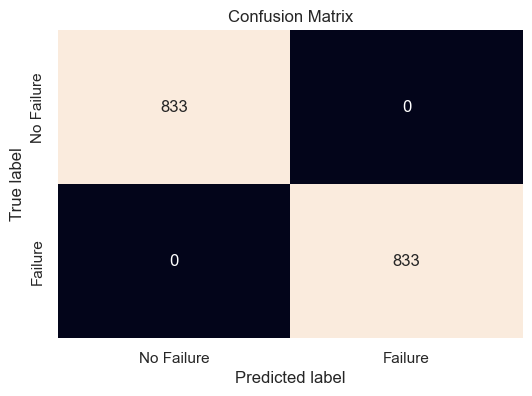

In [89]:
# Evaluate the model on the training data
print("Training Performance:")
rfc_unders_perf_train = model_performance_classification_sklearn(
    rfc_unders, X_train_un, y_train_un
)
display(rfc_unders_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(rfc_unders, X_train_un, y_train_un)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.94      0.96      4723
     Failure       0.45      0.90      0.60       277

    accuracy                           0.93      5000
   macro avg       0.72      0.92      0.78      5000
weighted avg       0.96      0.93      0.94      5000



,Accuracy,Recall,Precision,F1
0,0.9336,0.8989,0.4503,0.6000


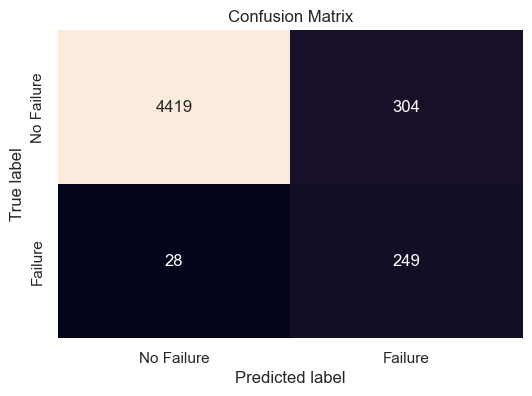

In [90]:
# Evaluate the model on the validation data
print("Validation Performance:")
rfc_unders_perf_val = model_performance_classification_sklearn(rfc_unders, X_val, y_val)
display(rfc_unders_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(rfc_unders, X_val, y_val)


#### <a id='toc1_7_6_3_'></a>[Decision Tree](#toc0_)


Earlier we determined that `entropy` yields better results.


In [91]:
# Initialize the decision tree classifier with Entropy
dtc_ent_unders = DecisionTreeClassifier(criterion="entropy", random_state=1)

# Train the model on the training data (oversampled)
dtc_ent_unders.fit(X_train_un, y_train_un)


DecisionTreeClassifier(criterion='entropy', random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00       833
     Failure       1.00      1.00      1.00       833

    accuracy                           1.00      1666
   macro avg       1.00      1.00      1.00      1666
weighted avg       1.00      1.00      1.00      1666



,Accuracy,Recall,Precision,F1
0,1.0000,1.0000,1.0000,1.0000


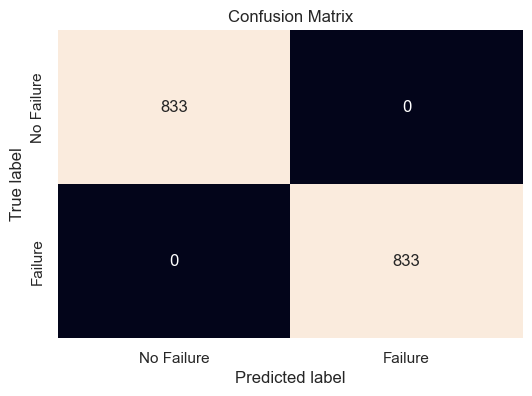

In [92]:
# Evaluate the model on the training data
print("Training Performance:")
dtc_ent_unders_perf_train = model_performance_classification_sklearn(
    dtc_ent_unders, X_train_un, y_train_un
)
display(dtc_ent_unders_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(dtc_ent_unders, X_train_un, y_train_un)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.83      0.90      4723
     Failure       0.23      0.85      0.36       277

    accuracy                           0.83      5000
   macro avg       0.61      0.84      0.63      5000
weighted avg       0.95      0.83      0.87      5000



,Accuracy,Recall,Precision,F1
0,0.8308,0.8520,0.2267,0.3581


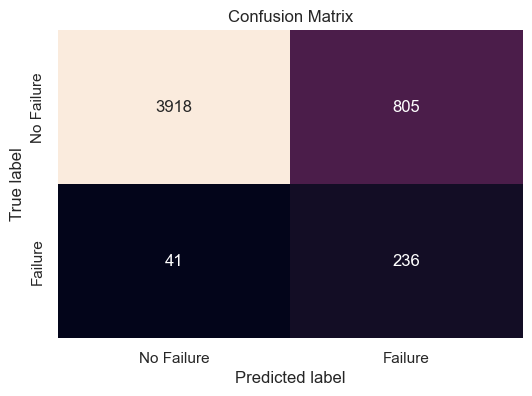

In [93]:
# Evaluate the model on the validation data
print("Validation Performance:")
dtc_ent_unders_perf_val = model_performance_classification_sklearn(
    dtc_ent_unders, X_val, y_val
)
display(dtc_ent_unders_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(dtc_ent_unders, X_val, y_val)


#### <a id='toc1_7_6_4_'></a>[Bagging](#toc0_)


In [94]:
# Initialize the Bagging Classifier with more estimators and balanced sampling
bc_unders = BaggingClassifier(random_state=1)

# Train the model on the training data
bc_unders.fit(X_train_un, y_train_un)


BaggingClassifier(random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      1.00      0.99       833
     Failure       1.00      0.99      0.99       833

    accuracy                           0.99      1666
   macro avg       0.99      0.99      0.99      1666
weighted avg       0.99      0.99      0.99      1666



,Accuracy,Recall,Precision,F1
0,0.9922,0.9856,0.9988,0.9921


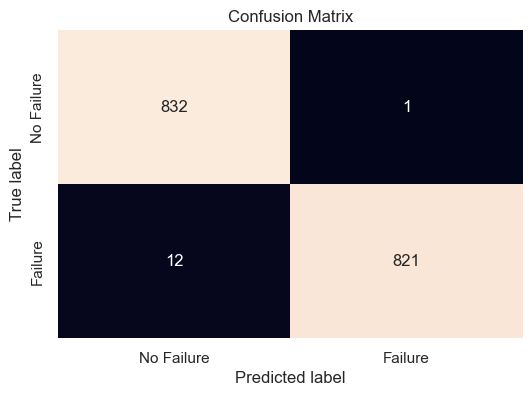

In [95]:
# Evaluate the model on the training data
print("Training Performance:")
bc_unders_perf_train = model_performance_classification_sklearn(
    bc_unders, X_train_un, y_train_un
)
display(bc_unders_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(bc_unders, X_train_un, y_train_un)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.92      0.96      4723
     Failure       0.39      0.88      0.54       277

    accuracy                           0.92      5000
   macro avg       0.69      0.90      0.75      5000
weighted avg       0.96      0.92      0.93      5000



,Accuracy,Recall,Precision,F1
0,0.9184,0.8809,0.3942,0.5446


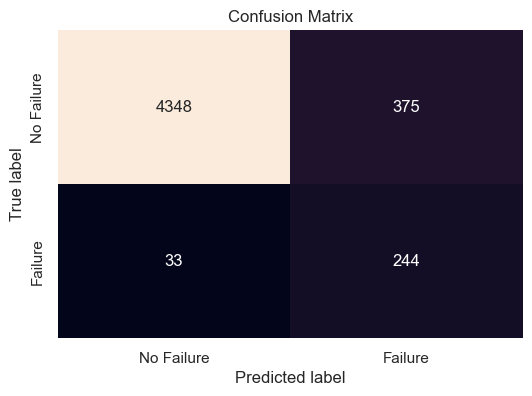

In [96]:
# Evaluate the model on the validation data
print("Validation Performance:")
bc_unders_perf_val = model_performance_classification_sklearn(bc_unders, X_val, y_val)
display(bc_unders_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(bc_unders, X_val, y_val)


#### <a id='toc1_7_6_5_'></a>[Gradient Boosting](#toc0_)


In [97]:
gbc_unders = GradientBoostingClassifier(random_state=1)
gbc_unders.fit(X_train, y_train)


GradientBoostingClassifier(random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.83      1.00      0.91       833
     Failure       1.00      0.80      0.89       833

    accuracy                           0.90      1666
   macro avg       0.92      0.90      0.90      1666
weighted avg       0.92      0.90      0.90      1666



,Accuracy,Recall,Precision,F1
0,0.8998,0.8007,0.9985,0.8887


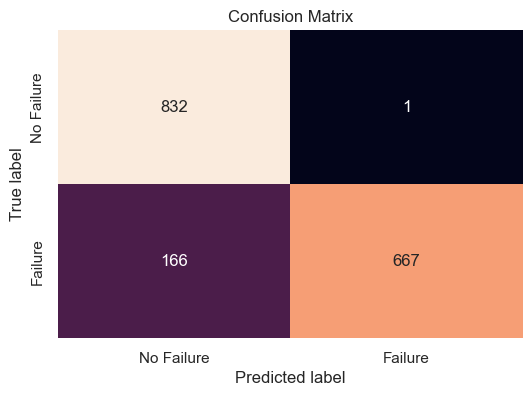

In [98]:
# Evaluate the model on the training data
print("Training Performance:")
gbc_unders_perf_train = model_performance_classification_sklearn(
    gbc_unders, X_train_un, y_train_un
)
display(gbc_unders_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(gbc_unders, X_train_un, y_train_un)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.98      1.00      0.99      4723
     Failure       0.96      0.72      0.82       277

    accuracy                           0.98      5000
   macro avg       0.97      0.86      0.91      5000
weighted avg       0.98      0.98      0.98      5000



,Accuracy,Recall,Precision,F1
0,0.9828,0.7220,0.9569,0.8230


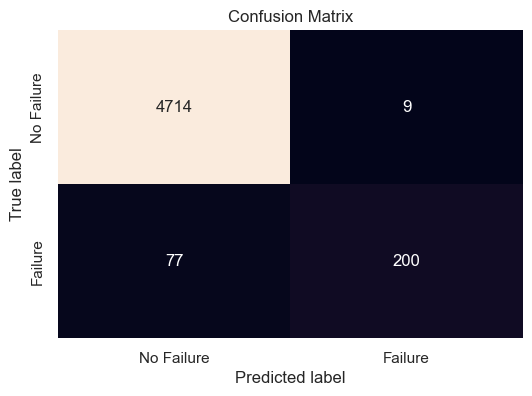

In [99]:
# Evaluate the model on the validation data
print("Validation Performance:")
gbc_unders_perf_val = model_performance_classification_sklearn(gbc_unders, X_val, y_val)
display(gbc_unders_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(gbc_unders, X_val, y_val)


#### <a id='toc1_7_6_6_'></a>[Ada Boosting](#toc0_)


In [100]:
abc_unders = AdaBoostClassifier(random_state=1)
abc_unders.fit(X_train_un, y_train_un)


AdaBoostClassifier(random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.92      0.93      0.92       833
     Failure       0.93      0.92      0.92       833

    accuracy                           0.92      1666
   macro avg       0.92      0.92      0.92      1666
weighted avg       0.92      0.92      0.92      1666



,Accuracy,Recall,Precision,F1
0,0.9232,0.9172,0.9283,0.9227


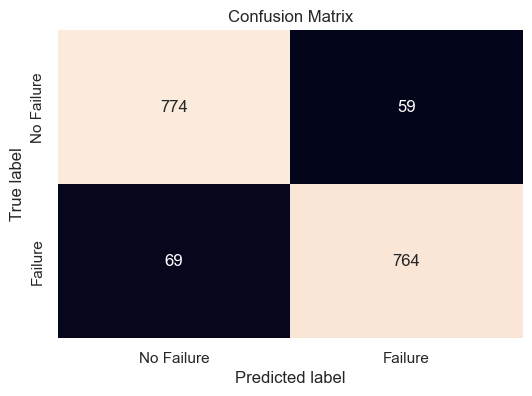

In [101]:
# Evaluate the model on the training data
print("Training Performance:")
abc_unders_perf_train = model_performance_classification_sklearn(
    abc_unders, X_train_un, y_train_un
)
display(abc_unders_perf_train)

# Plot the confusion matrix for the training set
confusion_matrix_sklearn(abc_unders, X_train_un, y_train_un)


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.86      0.92      4723
     Failure       0.27      0.89      0.42       277

    accuracy                           0.86      5000
   macro avg       0.63      0.87      0.67      5000
weighted avg       0.95      0.86      0.89      5000



,Accuracy,Recall,Precision,F1
0,0.8620,0.8881,0.2718,0.4162


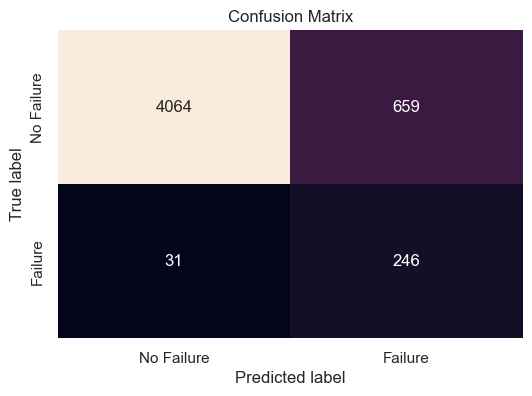

In [102]:
# Evaluate the model on the validation data
print("Validation Performance:")
abc_unders_perf_val = model_performance_classification_sklearn(abc_unders, X_val, y_val)
display(abc_unders_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(abc_unders, X_val, y_val)


### <a id='toc1_7_7_'></a>[Model Performance Comparison](#toc0_)


In [103]:
# List of models to evaluate
models = [
    xgbc_original,
    xgbc_overs,
    xgbc_unders,  # XGBoost variants
    rfc_original,
    rfc_overs,
    rfc_unders,  # Random Forest variants
    dtc_ent_original,
    dtc_ent_overs,
    dtc_ent_unders,  # Decision Tree variants
    bc_original,
    bc_overs,
    bc_unders,  # Bagging variants
    gbc_original,
    gbc_overs,
    gbc_unders,  # Gradient Boosting variants
    abc_original,
    abc_overs,
    abc_unders,  # AdaBoost variants
]

# Corresponding names for each model
model_names = [
    "XGBoost Original",
    "XGBoost Oversampled",
    "XGBoost Undersampled",
    "Random Forest Original",
    "Random Forest Oversampled",
    "Random Forest Undersampled",
    "Decision Tree Original",
    "Decision Tree Oversampled",
    "Decision Tree Undersampled",
    "Bagging Original",
    "Bagging Oversampled",
    "Bagging Undersampled",
    "Gradient Boosting Original",
    "Gradient Boosting Oversampled",
    "Gradient Boosting Undersampled",
    "Ada Boost Original",
    "Ada Boost Oversampled",
    "Ada Boost Undersampled",
]

# Define empty lists to store train and test performance metrics
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
f1_train = []
f1_test = []

# Loop through all models and get performance metrics for both train and validation sets
for model in models:
    # Get metrics for training data
    train_perf = model_performance_classification_sklearn(model, X_train, y_train)
    # Get metrics for test data
    test_perf = model_performance_classification_sklearn(model, X_val, y_val)

    # Append metrics for training data
    acc_train.append(np.round(train_perf["Accuracy"][0], 4))
    recall_train.append(np.round(train_perf["Recall"][0], 4))
    precision_train.append(np.round(train_perf["Precision"][0], 4))
    f1_train.append(np.round(train_perf["F1"][0], 4))

    # Append metrics for validation data
    acc_test.append(np.round(test_perf["Accuracy"][0], 4))
    recall_test.append(np.round(test_perf["Recall"][0], 4))
    precision_test.append(np.round(test_perf["Precision"][0], 4))
    f1_test.append(np.round(test_perf["F1"][0], 4))

# Creating a DataFrame to compare model performance
comparison_frame = pd.DataFrame(
    {
        "Model": model_names,
        "Train_Accuracy": acc_train,
        "Val_Accuracy": acc_test,
        "Train_Recall": recall_train,
        "Val_Recall": recall_test,
        "Train_Precision": precision_train,
        "Val_Precision": precision_test,
        "Train_F1_Score": f1_train,
        "Val_F1_Score": f1_test,
    }
)

# Display the comparison DataFrame
display(comparison_frame)



Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00     14167
     Failure       1.00      1.00      1.00       833

    accuracy                           1.00     15000
   macro avg       1.00      1.00      1.00     15000
weighted avg       1.00      1.00      1.00     15000


Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      1.00      0.99      4723
     Failure       0.96      0.83      0.89       277

    accuracy                           0.99      5000
   macro avg       0.98      0.92      0.94      5000
weighted avg       0.99      0.99      0.99      5000


Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00     14167
     Failure       1.00      1.00      1.00       833

    accuracy                           1.00     15000
   macro avg       1.00      1.00      1.00     15000

,Model,Train_Accuracy,Val_Accuracy,Train_Recall,Val_Recall,Train_Precision,Val_Precision,Train_F1_Score,Val_F1_Score
0,XGBoost Original,1.0000,0.9890,1.0000,0.8339,1.0000,0.9625,1.0000,0.8936
1,XGBoost Oversampled,1.0000,0.9884,1.0000,0.8917,1.0000,0.8982,1.0000,0.8949
2,XGBoost Undersampled,0.9493,0.9390,1.0000,0.8953,0.5229,0.4733,0.6867,0.6192
3,Random Forest Original,1.0000,0.9856,1.0000,0.7509,1.0000,0.9858,1.0000,0.8525
4,Random Forest Oversampled,1.0000,0.9896,1.0000,0.8628,1.0000,0.9447,1.0000,0.9019
5,Random Forest Undersampled,0.9411,0.9336,1.0000,0.8989,0.4854,0.4503,0.6536,0.6000
6,Decision Tree Original,1.0000,0.9720,1.0000,0.7292,1.0000,0.7566,1.0000,0.7426
7,Decision Tree Oversampled,1.0000,0.9488,1.0000,0.8195,1.0000,0.5242,1.0000,0.6394
8,Decision Tree Undersampled,0.8537,0.8308,1.0000,0.8520,0.2752,0.2267,0.4316,0.3581
9,Bagging Original,0.9979,0.9812,0.9628,0.6895,0.9988,0.9598,0.9804,0.8025


In [104]:
# Creating a DataFrame to compare model performance
comparison_frame = pd.DataFrame(
    {
        "Model": model_names,
        "Train_Accuracy": acc_train,
        "Val_Accuracy": acc_test,
        "Train_Recall": recall_train,
        "Val_Recall": recall_test,
        "Train_Precision": precision_train,
        "Val_Precision": precision_test,
        "Train_F1_Score": f1_train,
        "Val_F1_Score": f1_test,
    }
)

# Sort the DataFrame based on Test Recall in descending order
sorted_comparison_frame = comparison_frame.sort_values(by="Val_Recall", ascending=False)

# Display the sorted comparison DataFrame
display(sorted_comparison_frame)


,Model,Train_Accuracy,Val_Accuracy,Train_Recall,Val_Recall,Train_Precision,Val_Precision,Train_F1_Score,Val_F1_Score
5,Random Forest Undersampled,0.9411,0.9336,1.0000,0.8989,0.4854,0.4503,0.6536,0.6000
2,XGBoost Undersampled,0.9493,0.9390,1.0000,0.8953,0.5229,0.4733,0.6867,0.6192
1,XGBoost Oversampled,1.0000,0.9884,1.0000,0.8917,1.0000,0.8982,1.0000,0.8949
17,Ada Boost Undersampled,0.8654,0.8620,0.9172,0.8881,0.2815,0.2718,0.4308,0.4162
16,Ada Boost Oversampled,0.9149,0.9116,0.8752,0.8845,0.3833,0.3740,0.5331,0.5258
11,Bagging Undersampled,0.9273,0.9184,0.9856,0.8809,0.4321,0.3942,0.6008,0.5446
4,Random Forest Oversampled,1.0000,0.9896,1.0000,0.8628,1.0000,0.9447,1.0000,0.9019
8,Decision Tree Undersampled,0.8537,0.8308,1.0000,0.8520,0.2752,0.2267,0.4316,0.3581
0,XGBoost Original,1.0000,0.9890,1.0000,0.8339,1.0000,0.9625,1.0000,0.8936
10,Bagging Oversampled,0.9999,0.9800,1.0000,0.8303,0.9976,0.8127,0.9988,0.8214


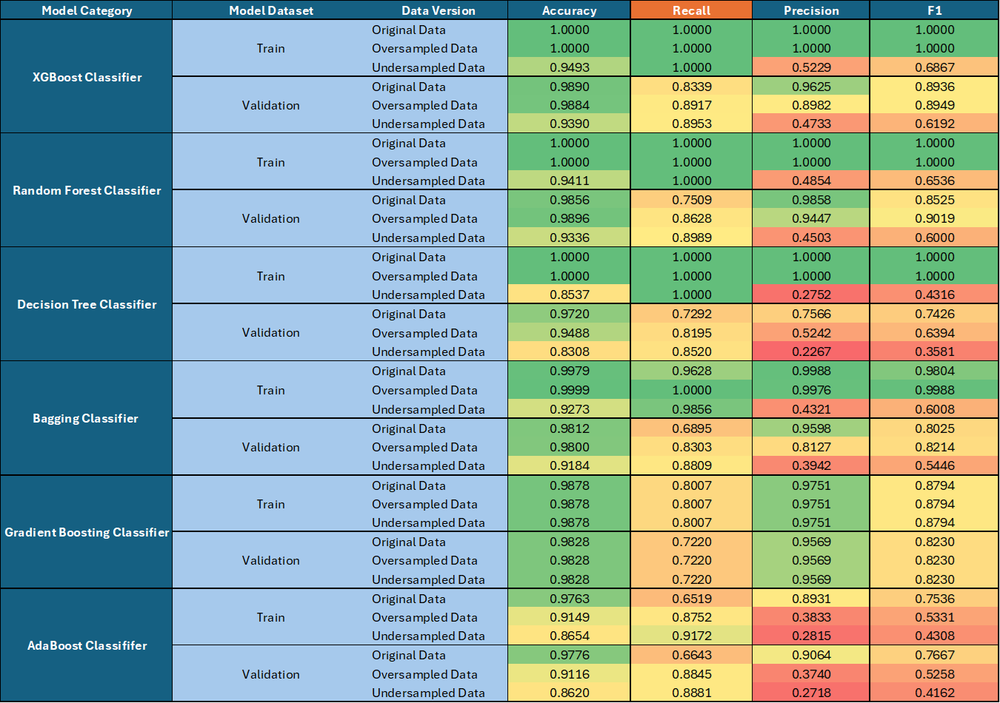


**Observations:**

This table highlights each model's performance, showing how they handle both training and validation sets. Many oversampled models show perfect recall during training, which hints at overfitting. This overfitting means the model might not generalize well to unseen data. On the other hand, undersampled models show balanced performance without perfect recall, suggesting they're learning more robust patterns. The validation scores are crucial here; models with strong validation recall without perfect training recall are generally more dependable.

- Oversampled models generally perform well but risk overfitting due to high training recall scores.
- Undersampled models tend to have more balanced metrics, making them better candidates for real-world application.
- Validation scores are crucial here; models with high recall on validation data without perfect training recall are generally more reliable.


In [105]:
# List of models with corresponding training datasets
models = [
    (
        "XGBoost Original",
        XGBClassifier(random_state=1, eval_metric="logloss"),
        X_train,
        y_train,
    ),
    (
        "XGBoost Oversampled",
        XGBClassifier(random_state=1, eval_metric="logloss"),
        X_train_over,
        y_train_over,
    ),
    (
        "XGBoost Undersampled",
        XGBClassifier(random_state=1, eval_metric="logloss"),
        X_train_un,
        y_train_un,
    ),
    (
        "Random Forest Original",
        RandomForestClassifier(random_state=1),
        X_train,
        y_train,
    ),
    (
        "Random Forest Oversampled",
        RandomForestClassifier(random_state=1),
        X_train_over,
        y_train_over,
    ),
    (
        "Random Forest Undersampled",
        RandomForestClassifier(random_state=1),
        X_train_un,
        y_train_un,
    ),
    (
        "Decision Tree Original",
        DecisionTreeClassifier(random_state=1, criterion="entropy"),
        X_train,
        y_train,
    ),
    (
        "Decision Tree Oversampled",
        DecisionTreeClassifier(random_state=1, criterion="entropy"),
        X_train_over,
        y_train_over,
    ),
    (
        "Decision Tree Undersampled",
        DecisionTreeClassifier(random_state=1, criterion="entropy"),
        X_train_un,
        y_train_un,
    ),
    ("Bagging Original", BaggingClassifier(random_state=1), X_train, y_train),
    (
        "Bagging Oversampled",
        BaggingClassifier(random_state=1),
        X_train_over,
        y_train_over,
    ),
    ("Bagging Undersampled", BaggingClassifier(random_state=1), X_train_un, y_train_un),
    (
        "Gradient Boosting Original",
        GradientBoostingClassifier(random_state=1),
        X_train,
        y_train,
    ),
    (
        "Gradient Boosting Oversampled",
        GradientBoostingClassifier(random_state=1),
        X_train_over,
        y_train_over,
    ),
    (
        "Gradient Boosting Undersampled",
        GradientBoostingClassifier(random_state=1),
        X_train_un,
        y_train_un,
    ),
    ("AdaBoost Original", AdaBoostClassifier(random_state=1), X_train, y_train),
    (
        "AdaBoost Oversampled",
        AdaBoostClassifier(random_state=1),
        X_train_over,
        y_train_over,
    ),
    (
        "AdaBoost Undersampled",
        AdaBoostClassifier(random_state=1),
        X_train_un,
        y_train_un,
    ),
]

# Store CV and validation results in DataFrame
cv_results = pd.DataFrame(columns=["Model", "CV Recall", "Validation Recall"])

# List to store model names and cross-validation results
results1 = []  # List to store all CV recall scores (5-fold) for each model
names = []  # List to store model names

# Define scorer for recall
scorer = metrics.make_scorer(metrics.recall_score)

# loop through all models to get the cross-validated score and validation score
print("\nCross-Validation and Validation Performance on training dataset:\n")

for name, model, X_train_curr, y_train_curr in models:
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)

    # Cross-validation results (5 recall scores for each fold)
    cv_result = cross_val_score(
        estimator=model, X=X_train_curr, y=y_train_curr, scoring=scorer, cv=kfold
    )

    # Fit model and validate on the validation set
    model.fit(X_train_curr, y_train_curr)
    val_score = recall_score(y_val, model.predict(X_val))

    # Store the full CV results in a list
    results1.append(cv_result)
    names.append(name)

    # Store mean CV recall and validation recall in DataFrame
    result_row = pd.DataFrame(
        {
            "Model": [name],
            "CV Recall": [cv_result.mean()],  # Mean of 5 CV folds
            "Validation Recall": [val_score],
        }
    )

    # Concatenate the result row to the main DataFrame
    cv_results = pd.concat([cv_results, result_row], ignore_index=True)

# Print the final DataFrame with CV and validation recall
print(cv_results)



Cross-Validation and Validation Performance on training dataset:

                             Model  CV Recall  Validation Recall
0                 XGBoost Original     0.8079             0.8339
1              XGBoost Oversampled     0.9904             0.8917
2             XGBoost Undersampled     0.9003             0.8953
3           Random Forest Original     0.7180             0.7509
4        Random Forest Oversampled     0.9830             0.8628
5       Random Forest Undersampled     0.9015             0.8989
6           Decision Tree Original     0.7264             0.7292
7        Decision Tree Oversampled     0.9720             0.8195
8       Decision Tree Undersampled     0.8655             0.8520
9                 Bagging Original     0.6976             0.6895
10             Bagging Oversampled     0.9747             0.8303
11            Bagging Undersampled     0.8739             0.8809
12      Gradient Boosting Original     0.6843             0.7220
13   Gradient Boosting 

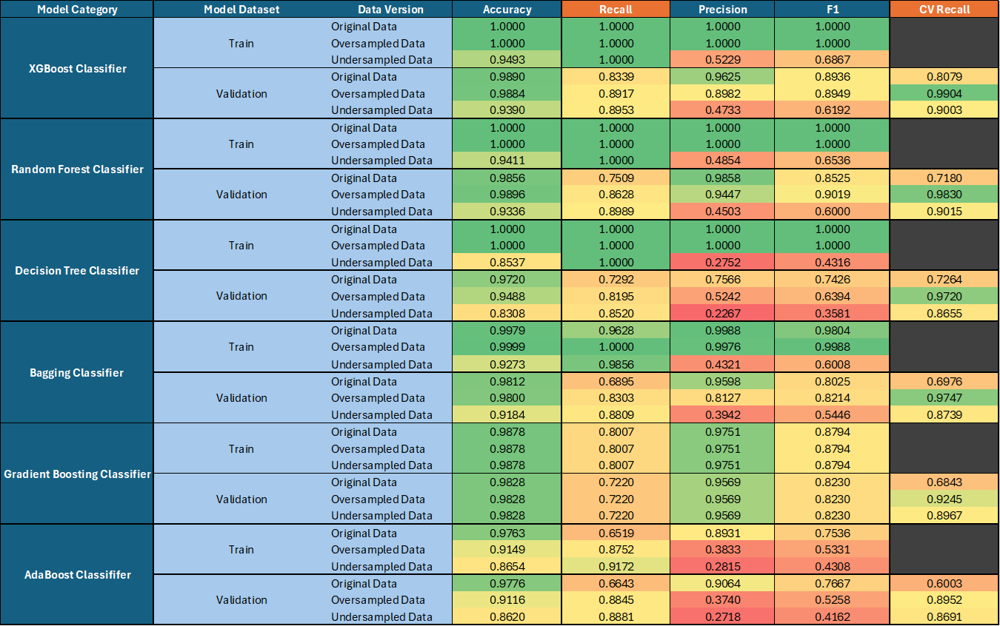


**Observations:**

Cross-validation helps verify how consistently a model performs across different training subsets. Models like XGBoost (Oversampled) and Random Forest (Undersampled) show high recall and stability in cross-validation and validation, suggesting they generalize well. Oversampled models perform well but need careful checking to avoid overfitting.

- Consistency between cross-validation and validation recall is a key indicator of model robustness.
- Models with both high cross-validation and validation recall are prioritized for further tuning.
- Oversampled data generally provides high recall but with caution needed regarding potential overfitting.


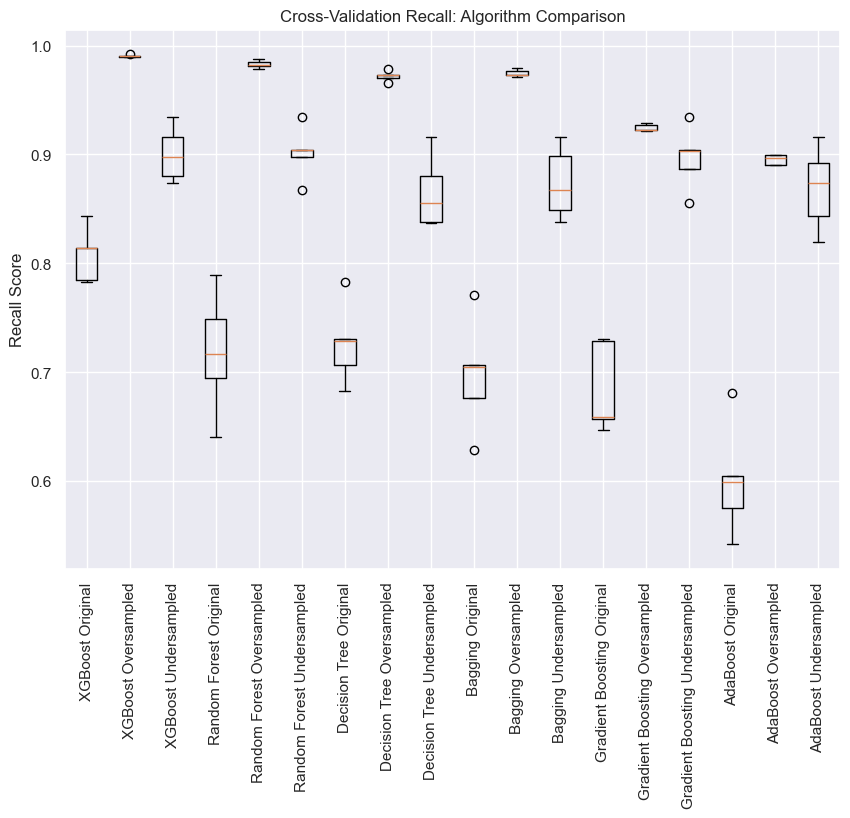

In [106]:
# Optionally, you can plot the boxplots of the CV results:
plt.figure(figsize=(10, 7))
plt.boxplot(results1)
plt.xticks(ticks=np.arange(1, len(names) + 1), labels=names, rotation=90)
plt.title("Cross-Validation Recall: Algorithm Comparison")
plt.ylabel("Recall Score")
plt.show()


**Observations:**

The boxplot shows the recall variability across cross-validation folds. Models with tight, high median recall scores are the most reliable. XGBoost and Random Forest variants performed well with consistent recall, whereas others like Decision Trees had more variability, indicating less stability.

- Tight, high boxplots indicate reliable performance.
- Wide plots suggest less consistent models.
- XGBoost (Oversampled) and Random Forest (Undersampled) stood out for stability and recall.


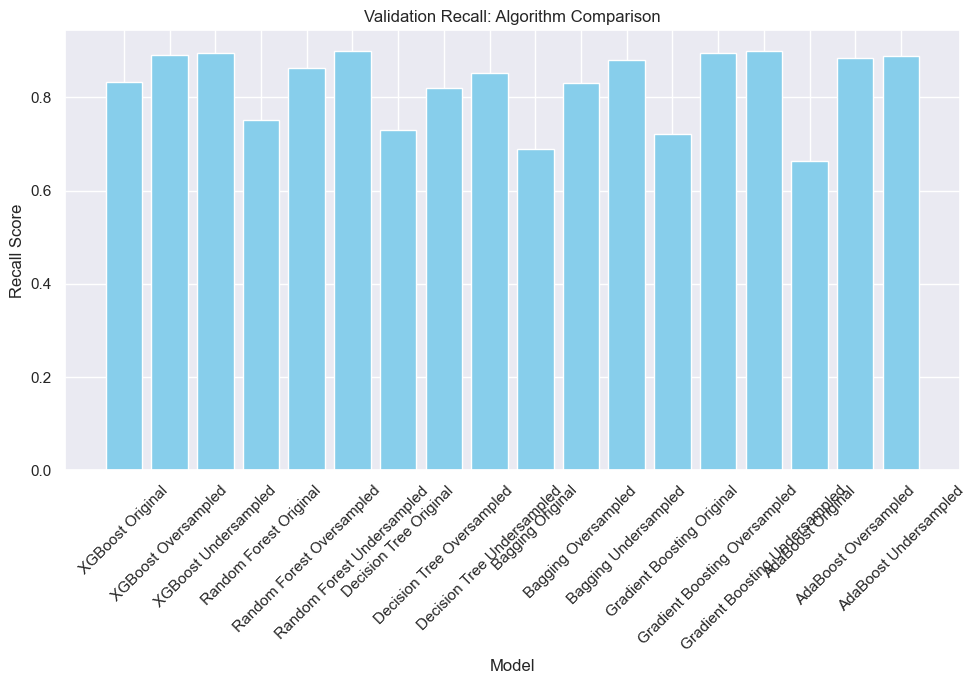

In [107]:
# Plotting bar plot for validation recall scores
fig, ax = plt.subplots(figsize=(10, 7))

ax.bar(cv_results["Model"], cv_results["Validation Recall"], color="skyblue")

# Adding title and labels
ax.set_title("Validation Recall: Algorithm Comparison")
ax.set_ylabel("Recall Score")
ax.set_xlabel("Model")

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Observations:

Based on overall performance and stability, the top 4 models chosen for hyperparameter tuning are:

- `XGBoost (Oversampled)`: High recall, consistent performance, and great potential for tuning.
- `Random Forest (Undersampled)`: Balanced recall with solid generalization, making it a strong candidate.
- `AdaBoost (Oversampled)`: High validation recall and balanced performance, ready to improve further with tuning.
- `Gradient Boosting (Oversampled)`: Consistent recall performance and a strong ensemble option for tuning.


## <a id='toc1_8_'></a>[HyperparameterTuning](#toc0_)


### <a id='toc1_8_1_'></a>[Sample Parameter Grids](#toc0_)


**Hyperparameter tuning can take a long time to run, so to avoid that time complexity - you can use the following grids, wherever required.**

- For `Gradient Boosting`:

param_grid = {
"n_estimators": np.arange(100,150,25),
"learning_rate": [0.2, 0.05, 1],
"subsample":[0.5,0.7],
"max_features":[0.5,0.7]
}

- For `Adaboost`:

param_grid = {
"n_estimators": [100, 150, 200],
"learning_rate": [0.2, 0.05],
"base_estimator": [DecisionTreeClassifier(max_depth=1, random_state=1), DecisionTreeClassifier(max_depth=2, random_state=1), DecisionTreeClassifier(max_depth=3, random_state=1),
]
}

- For `Bagging Classifier`:

param_grid = {
'max_samples': [0.8,0.9,1],
'max_features': [0.7,0.8,0.9],
'n_estimators' : [30,50,70],
}

- For `Random Forest`:

param_grid = {
"n_estimators": [200,250,300],
"min_samples_leaf": np.arange(1, 4),
"max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
"max_samples": np.arange(0.4, 0.7, 0.1)
}

- For `Decision Trees`:

param_grid = {
'max_depth': np.arange(2,6),
'min_samples_leaf': [1, 4, 7],
'max_leaf_nodes' : [10, 15],
'min_impurity_decrease': [0.0001,0.001]
}

- For `Logistic Regression`:

param_grid = {'C': np.arange(0.1,1.1,0.1)}

- For `XGBoost`:

param_grid={
'n_estimators': [150, 200, 250],
'scale_pos_weight': [5,10],
'learning_rate': [0.1,0.2],
'gamma': [0,3,5],
'subsample': [0.8,0.9]
}


**We will tune XGBoost (Oversampled), Random Forest (Undersampled), AdaBoost (Oversampled), and Gradient Boosting (Oversampled) models using GridSearchCV and RandomizedSearchCV. We will also compare the performance and time taken by the two hyperparameter tuning methods - grid search and randomized search.**


### <a id='toc1_8_2_'></a>[Tuning XGBoost (Oversampled)](#toc0_)


#### <a id='toc1_8_2_1_'></a>[GridSearchCV](#toc0_)


In [108]:
%%time

# Clear previous GridSearchCV
xgb_grid_cv = None

# Define the XGBoost model
xgb_model = XGBClassifier(random_state=1, eval_metric='logloss')

# Parameter grid to pass in GridSearchCV
xgb_param_grid = {
    'n_estimators': [150, 200, 250],
    'scale_pos_weight': [5, 10],
    'learning_rate': [0.1, 0.2],
    'gamma': [0, 3, 5],
    'subsample': [0.8, 0.9]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
xgb_grid_cv = GridSearchCV(estimator=xgb_model, param_grid=xgb_param_grid, scoring=scorer, cv=5, n_jobs=-1, verbose=2)

# Fitting parameters in GridSearchCV
xgb_grid_cv.fit(X_train_over, y_train_over)

# Display the best parameters
print("GridSearchCV Best Parameters (XGBoost):", xgb_grid_cv.best_params_)


Fitting 5 folds for each of 72 candidates, totalling 360 fits
GridSearchCV Best Parameters (XGBoost): {'gamma': 0, 'learning_rate': 0.1, 'n_estimators': 200, 'scale_pos_weight': 10, 'subsample': 0.9}
CPU times: total: 27.1 s
Wall time: 1min 36s


In [109]:
# Initialize the XGBoost model with the best parameters found
xgbco_gscv_tuned = XGBClassifier(
    **xgb_grid_cv.best_params_, random_state=1, eval_metric="logloss"
)

# Fit the model on the oversampled training data
xgbco_gscv_tuned.fit(X_train_over, y_train_over)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=200,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00     14167
     Failure       1.00      1.00      1.00     14167

    accuracy                           1.00     28334
   macro avg       1.00      1.00      1.00     28334
weighted avg       1.00      1.00      1.00     28334



,Accuracy,Recall,Precision,F1
0,0.9980,1.0000,0.9961,0.9980



Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.98      0.99      4723
     Failure       0.73      0.90      0.81       277

    accuracy                           0.98      5000
   macro avg       0.86      0.94      0.90      5000
weighted avg       0.98      0.98      0.98      5000



,Accuracy,Recall,Precision,F1
0,0.9762,0.8953,0.7337,0.8065


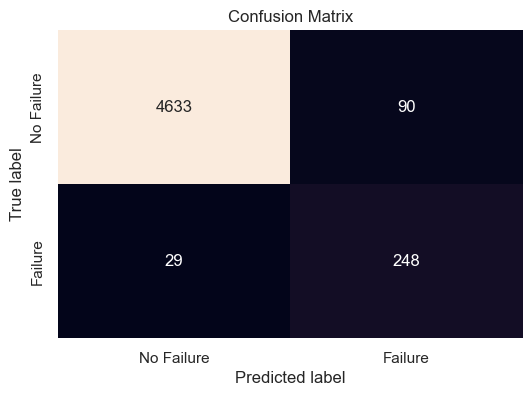

In [110]:
# Evaluate the model on the training data
print("Training Performance:")
xgbco_gscv_tuned_perf_train = model_performance_classification_sklearn(
    xgbco_gscv_tuned, X_train_over, y_train_over
)
display(xgbco_gscv_tuned_perf_train)

# Evaluate the model on the validation data
print("\nValidation Performance:")
xgbco_gscv_tuned_perf_val = model_performance_classification_sklearn(
    xgbco_gscv_tuned, X_val, y_val
)
display(xgbco_gscv_tuned_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(xgbco_gscv_tuned, X_val, y_val)


#### <a id='toc1_8_2_2_'></a>[RandomizedSearchCV](#toc0_)


In [111]:
%%time


# Clear previous RandomizedSearchCV
xgb_random_cv = None  

# Define the XGBoost model
xgb_model = XGBClassifier(random_state=1, eval_metric='logloss')

# Calling RandomizedSearchCV
xgb_random_cv = RandomizedSearchCV(estimator=xgb_model, param_distributions=xgb_param_grid, scoring=scorer, n_iter=10, n_jobs=-1, cv=5, random_state=1, verbose=2)

# Fitting parameters in RandomizedSearchCV
xgb_random_cv.fit(X_train_over, y_train_over)

# Display the best parameters
print("RandomizedSearchCV Best Parameters (XGBoost):", xgb_random_cv.best_params_)



Fitting 5 folds for each of 10 candidates, totalling 50 fits
RandomizedSearchCV Best Parameters (XGBoost): {'subsample': 0.8, 'scale_pos_weight': 10, 'n_estimators': 250, 'learning_rate': 0.1, 'gamma': 0}
CPU times: total: 11.6 s
Wall time: 14.7 s


In [112]:
# Define the tuned XGBoost model with best parameters from RandomizedSearchCV
xgbco_rscv_tuned = XGBClassifier(
    **xgb_random_cv.best_params_, random_state=1, eval_metric="logloss"
)

# Fit the model on the oversampled training data
xgbco_rscv_tuned.fit(X_train_over, y_train_over)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=250,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

Training Performance of XGBoost (RSCV Tuned):

Classification Report:
               precision    recall  f1-score   support

  No Failure       1.00      1.00      1.00     14167
     Failure       1.00      1.00      1.00     14167

    accuracy                           1.00     28334
   macro avg       1.00      1.00      1.00     28334
weighted avg       1.00      1.00      1.00     28334



,Accuracy,Recall,Precision,F1
0,0.9992,1.0000,0.9983,0.9992



Validation Performance of XGBoost (RSCV Tuned):

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.99      0.99      4723
     Failure       0.79      0.90      0.84       277

    accuracy                           0.98      5000
   macro avg       0.89      0.94      0.91      5000
weighted avg       0.98      0.98      0.98      5000



,Accuracy,Recall,Precision,F1
0,0.9810,0.8953,0.7898,0.8393


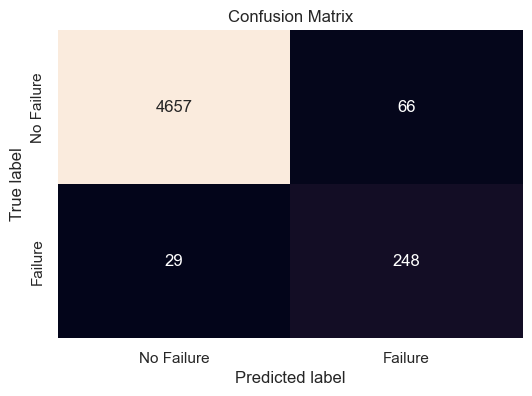

In [113]:
# Evaluate performance on the training data
print("Training Performance of XGBoost (RSCV Tuned):")
xgbco_rscv_tuned_perf_train = model_performance_classification_sklearn(
    xgbco_rscv_tuned, X_train_over, y_train_over
)
display(xgbco_rscv_tuned_perf_train)

# Evaluate performance on the validation data
print("\nValidation Performance of XGBoost (RSCV Tuned):")
xgbco_rscv_tuned_perf_val = model_performance_classification_sklearn(
    xgbco_rscv_tuned, X_val, y_val
)
display(xgbco_rscv_tuned_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(xgbco_rscv_tuned, X_val, y_val)


### <a id='toc1_8_3_'></a>[Tuning Random Forest (Undersampled)](#toc0_)


#### <a id='toc1_8_3_1_'></a>[GridSearchCV](#toc0_)


In [114]:
%%time


# Define the Random Forest model
rf_grid_cv = None  

# Define the Random Forest model
rf_model = RandomForestClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV
rf_param_grid = {
    "n_estimators": [200, 250, 300],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": ['sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}

# Calling GridSearchCV
rf_grid_cv = GridSearchCV(estimator=rf_model, param_grid=rf_param_grid, scoring=scorer, cv=5, n_jobs=-1, verbose=2)

# Fitting parameters in GridSearchCV
rf_grid_cv.fit(X_train_un, y_train_un)

# Display the best parameters
print("GridSearchCV Best Parameters (Random Forest):", rf_grid_cv.best_params_)


Fitting 5 folds for each of 27 candidates, totalling 135 fits


GridSearchCV Best Parameters (Random Forest): {'max_features': 'sqrt', 'max_samples': 0.6, 'min_samples_leaf': 1, 'n_estimators': 250}
CPU times: total: 719 ms
Wall time: 18.2 s


In [115]:
# Building the Random Forest model using the best parameters from GridSearchCV
rfcu_gscv_tuned = RandomForestClassifier(
    n_estimators=rf_grid_cv.best_params_.get("n_estimators"),
    min_samples_leaf=rf_grid_cv.best_params_.get("min_samples_leaf"),
    max_samples=rf_grid_cv.best_params_.get("max_samples"),
    max_features=rf_grid_cv.best_params_.get("max_features"),
    random_state=1,
)

# Fitting the model on the undersampled training data
rfcu_gscv_tuned.fit(X_train_un, y_train_un)


RandomForestClassifier(max_samples=0.6, n_estimators=250, random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.98      1.00      0.99       833
     Failure       1.00      0.97      0.99       833

    accuracy                           0.99      1666
   macro avg       0.99      0.99      0.99      1666
weighted avg       0.99      0.99      0.99      1666



,Accuracy,Recall,Precision,F1
0,0.9874,0.9748,1.0000,0.9872


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.93      0.96      4723
     Failure       0.43      0.91      0.58       277

    accuracy                           0.93      5000
   macro avg       0.71      0.92      0.77      5000
weighted avg       0.96      0.93      0.94      5000



,Accuracy,Recall,Precision,F1
0,0.9282,0.9061,0.4298,0.5830


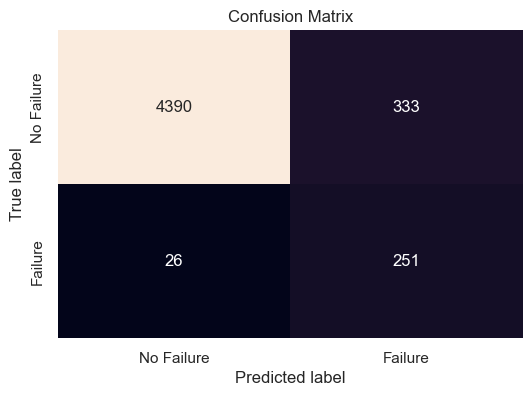

In [116]:
# Evaluate the model on the training data
print("Training Performance:")
rfcu_gscv_tuned_perf_train = model_performance_classification_sklearn(
    rfcu_gscv_tuned, X_train_un, y_train_un
)
display(rfcu_gscv_tuned_perf_train)

# Evaluate the model on the validation data
print("Validation Performance:")
rfcu_gscv_tuned_perf_val = model_performance_classification_sklearn(
    rfcu_gscv_tuned, X_val, y_val
)
display(rfcu_gscv_tuned_perf_val)

# Plotting the confusion matrix for the validation set
confusion_matrix_sklearn(rfcu_gscv_tuned, X_val, y_val)


#### <a id='toc1_8_3_2_'></a>[RandomizedSearchCV](#toc0_)


In [117]:
%%time


# Clear previous RandomizedSearchCV
rf_random_cv = None

# Define the Random Forest model
rf_model = RandomForestClassifier(random_state=1)

# Calling RandomizedSearchCV
rf_random_cv = RandomizedSearchCV(estimator=rf_model, param_distributions=rf_param_grid, scoring=scorer, n_iter=10, cv=5, n_jobs=-1, random_state=1, verbose=2)

# Fitting parameters in RandomizedSearchCV
rf_random_cv.fit(X_train_un, y_train_un)

# Display the best parameters
print("RandomizedSearchCV Best Parameters (Random Forest):", rf_random_cv.best_params_)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
RandomizedSearchCV Best Parameters (Random Forest): {'n_estimators': 300, 'min_samples_leaf': 1, 'max_samples': 0.6, 'max_features': 'sqrt'}
CPU times: total: 875 ms
Wall time: 8.14 s


In [118]:
# Building the Random Forest model with the best parameters
rfcu_rscv_tuned = RandomForestClassifier(**rf_random_cv.best_params_, random_state=1)

# Fitting the model on the undersampled training data
rfcu_rscv_tuned.fit(X_train_un, y_train_un)


RandomForestClassifier(max_samples=0.6, n_estimators=300, random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.98      1.00      0.99       833
     Failure       1.00      0.98      0.99       833

    accuracy                           0.99      1666
   macro avg       0.99      0.99      0.99      1666
weighted avg       0.99      0.99      0.99      1666



,Accuracy,Recall,Precision,F1
0,0.9892,0.9784,1.0000,0.9891


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.93      0.96      4723
     Failure       0.43      0.91      0.58       277

    accuracy                           0.93      5000
   macro avg       0.71      0.92      0.77      5000
weighted avg       0.96      0.93      0.94      5000



,Accuracy,Recall,Precision,F1
0,0.9284,0.9097,0.4308,0.5847


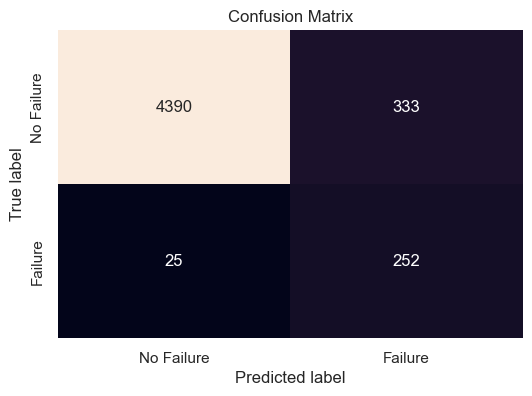

In [119]:
# Evaluating the model performance on the training data
print("Training Performance:")
rf_train_perf = model_performance_classification_sklearn(
    rfcu_rscv_tuned, X_train_un, y_train_un
)
display(rf_train_perf)

# Evaluating the model performance on the validation data
print("Validation Performance:")
rf_val_perf = model_performance_classification_sklearn(rfcu_rscv_tuned, X_val, y_val)
display(rf_val_perf)

# Displaying the confusion matrix for validation set
confusion_matrix_sklearn(rfcu_rscv_tuned, X_val, y_val)


### <a id='toc1_8_4_'></a>[Tuning AdaBoost (Oversampled)](#toc0_)


#### <a id='toc1_8_4_1_'></a>[GridSearchCV](#toc0_)


In [120]:
%%time


# Clear previous GridSearchCV
ada_grid_cv = None

# Define the AdaBoost model
ada_model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV
ada_param_grid = {
    "n_estimators": [100, 150, 200],
    "learning_rate": [0.2, 0.05],
    "estimator": [DecisionTreeClassifier(max_depth=1, random_state=1), DecisionTreeClassifier(max_depth=2, random_state=1), DecisionTreeClassifier(max_depth=3, random_state=1)]
}

# Calling GridSearchCV
ada_grid_cv = GridSearchCV(estimator=ada_model, param_grid=ada_param_grid, scoring=scorer, cv=5, n_jobs=-1, verbose=2)

# Fitting parameters in GridSearchCV
ada_grid_cv.fit(X_train_over, y_train_over)

# Display the best parameters
print("GridSearchCV Best Parameters (AdaBoost):", ada_grid_cv.best_params_)


Fitting 5 folds for each of 18 candidates, totalling 90 fits
GridSearchCV Best Parameters (AdaBoost): {'estimator': DecisionTreeClassifier(max_depth=3, random_state=1), 'learning_rate': 0.2, 'n_estimators': 200}
CPU times: total: 1min 1s
Wall time: 6min 52s


In [121]:
# Define the tuned AdaBoost model with the best parameters
abco_gscv_tuned = AdaBoostClassifier(**ada_grid_cv.best_params_, random_state=1)

# Fit the model on the oversampled training data
abco_gscv_tuned.fit(X_train_over, y_train_over)


AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=3,
                                                    random_state=1),
                   learning_rate=0.2, n_estimators=200, random_state=1)

Training Performance with Best GridSearchCV Parameters:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      1.00      0.99     14167
     Failure       1.00      0.99      0.99     14167

    accuracy                           0.99     28334
   macro avg       0.99      0.99      0.99     28334
weighted avg       0.99      0.99      0.99     28334



,Accuracy,Recall,Precision,F1
0,0.9910,0.9868,0.9951,0.9909



Validation Performance with Best GridSearchCV Parameters:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.99      0.99      4723
     Failure       0.81      0.89      0.85       277

    accuracy                           0.98      5000
   macro avg       0.90      0.94      0.92      5000
weighted avg       0.98      0.98      0.98      5000



,Accuracy,Recall,Precision,F1
0,0.9822,0.8881,0.8092,0.8468



Confusion Matrix on Validation Data:


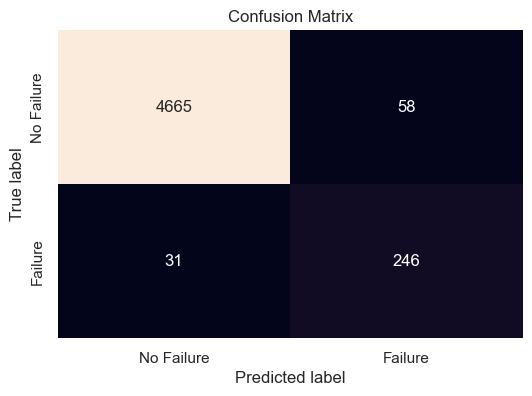

In [122]:
# Evaluate the model on the training data
print("Training Performance with Best GridSearchCV Parameters:")
ada_perf_train = model_performance_classification_sklearn(
    abco_gscv_tuned, X_train_over, y_train_over
)
display(ada_perf_train)

# Evaluate the model on the validation data
print("\nValidation Performance with Best GridSearchCV Parameters:")
ada_perf_val = model_performance_classification_sklearn(abco_gscv_tuned, X_val, y_val)
display(ada_perf_val)

# Plot the confusion matrix for the validation set
print("\nConfusion Matrix on Validation Data:")
confusion_matrix_sklearn(abco_gscv_tuned, X_val, y_val)


#### <a id='toc1_8_4_2_'></a>[RandomizedSearchCV](#toc0_)


In [123]:
%%time

# Clear any previous xgb_grid_cv or ab_random_cv
ab_random_cv = None 

# Define the AdaBoost model
ada_model = AdaBoostClassifier(random_state=1)

# Calling RandomizedSearchCV
ab_random_cv = RandomizedSearchCV(estimator=ada_model, param_distributions=ada_param_grid, scoring=scorer, n_iter=10, n_jobs=-1, cv=5, random_state=1, verbose=2)

# Fitting parameters in RandomizedSearchCV
ab_random_cv.fit(X_train_over, y_train_over)

# Displaying the best parameters
print("RandomizedSearchCV Best Parameters (AdaBoost):", ab_random_cv.best_params_)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
RandomizedSearchCV Best Parameters (AdaBoost): {'n_estimators': 200, 'learning_rate': 0.2, 'estimator': DecisionTreeClassifier(max_depth=3, random_state=1)}
CPU times: total: 1min
Wall time: 3min 59s


In [124]:
# Define the AdaBoost model with the best parameters from RandomizedSearchCV
abco_rscv_tuned = AdaBoostClassifier(**ab_random_cv.best_params_, random_state=1)

# Fit the model on the oversampled training data
abco_rscv_tuned.fit(X_train_over, y_train_over)


AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=3,
                                                    random_state=1),
                   learning_rate=0.2, n_estimators=200, random_state=1)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      1.00      0.99     14167
     Failure       1.00      0.99      0.99     14167

    accuracy                           0.99     28334
   macro avg       0.99      0.99      0.99     28334
weighted avg       0.99      0.99      0.99     28334



,Accuracy,Recall,Precision,F1
0,0.9910,0.9868,0.9951,0.9909


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.99      0.99      4723
     Failure       0.81      0.89      0.85       277

    accuracy                           0.98      5000
   macro avg       0.90      0.94      0.92      5000
weighted avg       0.98      0.98      0.98      5000



,Accuracy,Recall,Precision,F1
0,0.9822,0.8881,0.8092,0.8468


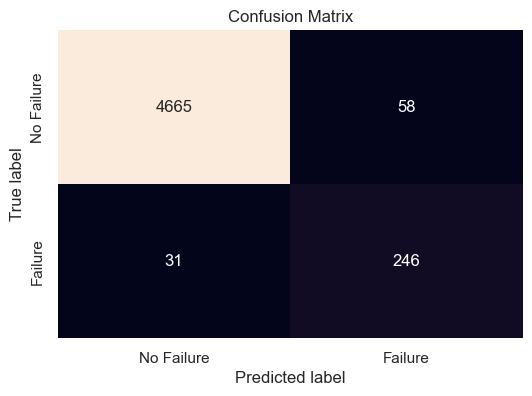

In [125]:
# Evaluate the model performance on the oversampled training data
print("Training Performance:")
ada_perf_train = model_performance_classification_sklearn(
    abco_rscv_tuned, X_train_over, y_train_over
)
display(ada_perf_train)

# Evaluate the model performance on the validation data
print("Validation Performance:")
ada_perf_val = model_performance_classification_sklearn(abco_rscv_tuned, X_val, y_val)
display(ada_perf_val)

# Plot the confusion matrix for validation performance
confusion_matrix_sklearn(abco_rscv_tuned, X_val, y_val)


### <a id='toc1_8_5_'></a>[Tuning Gradient Boosting (Oversampled)](#toc0_)


#### <a id='toc1_8_5_1_'></a>[GridSearchCV](#toc0_)


In [126]:
%%time

# Clear any previous gb_grid_cv or xgb_random_cv
gb_grid_cv = None

# Define the Gradient Boosting model
gb_model = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV
gb_param_grid = {
    "n_estimators": np.arange(100, 150, 25),
    "learning_rate": [0.2, 0.05, 1],
    "subsample": [0.5, 0.7],
    "max_features": [0.5, 0.7]
}

# Calling GridSearchCV
gb_grid_cv = GridSearchCV(estimator=gb_model, param_grid=gb_param_grid, scoring=scorer, cv=5, n_jobs=-1, verbose=2)

# Fitting parameters in GridSearchCV
gb_grid_cv.fit(X_train_over, y_train_over)

# Displaying the best parameters
print("GridSearchCV Best Parameters (Gradient Boosting):", gb_grid_cv.best_params_)


Fitting 5 folds for each of 24 candidates, totalling 120 fits
GridSearchCV Best Parameters (Gradient Boosting): {'learning_rate': 1, 'max_features': 0.5, 'n_estimators': 125, 'subsample': 0.7}
CPU times: total: 16.2 s
Wall time: 2min 37s


In [127]:
# Build the Gradient Boosting model with the best parameters from GridSearchCV
gbco_gscv_tuned = GradientBoostingClassifier(**gb_grid_cv.best_params_, random_state=1)

# Fit the model on the oversampled training data
gbco_gscv_tuned.fit(X_train_over, y_train_over)


GradientBoostingClassifier(learning_rate=1, max_features=0.5, n_estimators=125,
                           random_state=1, subsample=0.7)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.96      0.97      0.97     14167
     Failure       0.97      0.96      0.97     14167

    accuracy                           0.97     28334
   macro avg       0.97      0.97      0.97     28334
weighted avg       0.97      0.97      0.97     28334



,Accuracy,Recall,Precision,F1
0,0.9671,0.9602,0.9737,0.9669


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.96      0.98      4723
     Failure       0.56      0.89      0.69       277

    accuracy                           0.96      5000
   macro avg       0.78      0.93      0.83      5000
weighted avg       0.97      0.96      0.96      5000



,Accuracy,Recall,Precision,F1
0,0.9556,0.8917,0.5626,0.6899


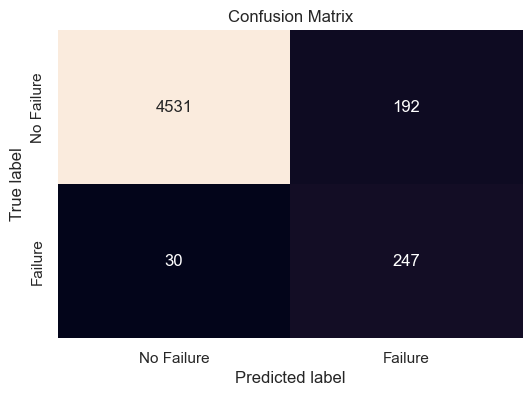

In [128]:
# Evaluate the model performance on the training set
print("Training Performance:")
gbc_perf_train = model_performance_classification_sklearn(
    gbco_gscv_tuned, X_train_over, y_train_over
)
display(gbc_perf_train)

# Evaluate the model performance on the validation set
print("Validation Performance:")
gbc_perf_val = model_performance_classification_sklearn(gbco_gscv_tuned, X_val, y_val)
display(gbc_perf_val)

# Plot the confusion matrix for the validation set
confusion_matrix_sklearn(gbco_gscv_tuned, X_val, y_val)


#### <a id='toc1_8_5_2_'></a>[RandomizedSearchCV](#toc0_)


In [129]:
%%time

# Clear any previous xgb_grid_cv or gb_random_cv
gb_random_cv = None 

# Define the Gradient Boosting model
gb_model = GradientBoostingClassifier(random_state=1)

# Calling RandomizedSearchCV
gb_random_cv = RandomizedSearchCV(estimator=gb_model, param_distributions=gb_param_grid, scoring=scorer, n_iter=10, n_jobs=-1, cv=5, random_state=1, verbose=2)

# Fitting parameters in RandomizedSearchCV
gb_random_cv.fit(X_train_over, y_train_over)

# Displaying the best parameters
print("RandomizedSearchCV Best Parameters (Gradient Boosting):", gb_random_cv.best_params_)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
RandomizedSearchCV Best Parameters (Gradient Boosting): {'subsample': 0.7, 'n_estimators': 125, 'max_features': 0.5, 'learning_rate': 1}
CPU times: total: 13 s
Wall time: 1min 13s


In [130]:
# Define the Gradient Boosting model with the best parameters
gbco_rscv_tuned = GradientBoostingClassifier(
    **gb_random_cv.best_params_, random_state=1
)

# Train the model on the oversampled training data
gbco_rscv_tuned.fit(X_train_over, y_train_over)


GradientBoostingClassifier(learning_rate=1, max_features=0.5, n_estimators=125,
                           random_state=1, subsample=0.7)

Training Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.96      0.97      0.97     14167
     Failure       0.97      0.96      0.97     14167

    accuracy                           0.97     28334
   macro avg       0.97      0.97      0.97     28334
weighted avg       0.97      0.97      0.97     28334



,Accuracy,Recall,Precision,F1
0,0.9671,0.9602,0.9737,0.9669


Validation Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.96      0.98      4723
     Failure       0.56      0.89      0.69       277

    accuracy                           0.96      5000
   macro avg       0.78      0.93      0.83      5000
weighted avg       0.97      0.96      0.96      5000



,Accuracy,Recall,Precision,F1
0,0.9556,0.8917,0.5626,0.6899


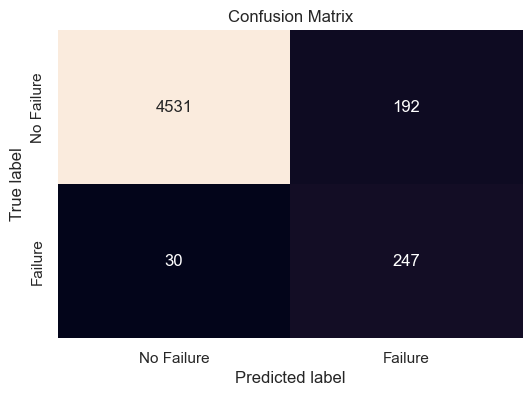

In [131]:
# Evaluate model performance on training data
print("Training Performance:")
gbco_rscv_tuned_perf_train = model_performance_classification_sklearn(
    gbco_rscv_tuned, X_train_over, y_train_over
)
display(gbco_rscv_tuned_perf_train)

# Evaluate model performance on validation data
print("Validation Performance:")
gbco_rscv_tuned_perf_val = model_performance_classification_sklearn(
    gbco_rscv_tuned, X_val, y_val
)
display(gbco_rscv_tuned_perf_val)

# Plotting the confusion matrix for validation data
confusion_matrix_sklearn(gbco_rscv_tuned, X_val, y_val)


## <a id='toc1_9_'></a>[Model performance comparison and choosing the final model](#toc0_)


In [132]:
# List of models to evaluate
models = [
    xgbco_gscv_tuned,
    xgbco_rscv_tuned,  # Updated to use xgbco_rscv_tuned
    rfcu_gscv_tuned,
    rfcu_rscv_tuned,  # Updated to use rfcu_rscv_tuned
    abco_gscv_tuned,
    abco_rscv_tuned,  # Updated to use abco_rscv_tuned
    gbco_gscv_tuned,
    gbco_rscv_tuned,  # Updated to use gbco_rscv_tuned
]

# Define empty lists to store performance metrics
acc_train, acc_val = [], []
recall_train, recall_val = [], []
precision_train, precision_val = [], []
f1_train, f1_val = [], []


# Function to compute performance metrics
def compute_metrics(model, X, y):
    """Computes accuracy, recall, precision, and F1 score."""
    predictions = model.predict(X)
    acc = accuracy_score(y, predictions)
    recall = recall_score(y, predictions)
    precision = precision_score(y, predictions)
    f1 = f1_score(y, predictions)
    return acc, recall, precision, f1


# Loop through all models and get metrics
for model in models:
    # Metrics for training data
    train_acc, train_recall, train_precision, train_f1 = compute_metrics(
        model, X_train, y_train
    )
    acc_train.append(round(train_acc, 4))
    recall_train.append(round(train_recall, 4))
    precision_train.append(round(train_precision, 4))
    f1_train.append(round(train_f1, 4))

    # Metrics for validation data
    val_acc, val_recall, val_precision, val_f1 = compute_metrics(model, X_val, y_val)
    acc_val.append(round(val_acc, 4))
    recall_val.append(round(val_recall, 4))
    precision_val.append(round(val_precision, 4))
    f1_val.append(round(val_f1, 4))

# Step 2: Create the Comparison DataFrame
comparison_table = pd.DataFrame(
    {
        "Model": [
            "XGBoost GSCV Tuned",
            "XGBoost RSCV Tuned",
            "Random Forest GSCV Tuned",
            "Random Forest RSCV Tuned",
            "AdaBoost GSCV Tuned",
            "AdaBoost RSCV Tuned",
            "Gradient Boosting GSCV Tuned",
            "Gradient Boosting RSCV Tuned",
        ],
        "Train_Accuracy": acc_train,
        "Val_Accuracy": acc_val,
        "Train_Recall": recall_train,
        "Val_Recall": recall_val,
        "Train_Precision": precision_train,
        "Val_Precision": precision_val,
        "Train_F1_Score": f1_train,
        "Val_F1_Score": f1_val,
    }
)

# Step 3: Display the Comparison DataFrame
display(comparison_table)


,Model,Train_Accuracy,Val_Accuracy,Train_Recall,Val_Recall,Train_Precision,Val_Precision,Train_F1_Score,Val_F1_Score
0,XGBoost GSCV Tuned,0.9963,0.9762,1.0000,0.8953,0.9370,0.7337,0.9675,0.8065
1,XGBoost RSCV Tuned,0.9984,0.9810,1.0000,0.8953,0.9720,0.7898,0.9858,0.8393
2,Random Forest GSCV Tuned,0.9344,0.9282,0.9748,0.9061,0.4575,0.4298,0.6227,0.5830
3,Random Forest RSCV Tuned,0.9354,0.9284,0.9784,0.9097,0.4615,0.4308,0.6272,0.5847
4,AdaBoost GSCV Tuned,0.9947,0.9822,0.9868,0.8881,0.9226,0.8092,0.9536,0.8468
5,AdaBoost RSCV Tuned,0.9947,0.9822,0.9868,0.8881,0.9226,0.8092,0.9536,0.8468
6,Gradient Boosting GSCV Tuned,0.9729,0.9556,0.9532,0.8917,0.6833,0.5626,0.7960,0.6899
7,Gradient Boosting RSCV Tuned,0.9729,0.9556,0.9532,0.8917,0.6833,0.5626,0.7960,0.6899


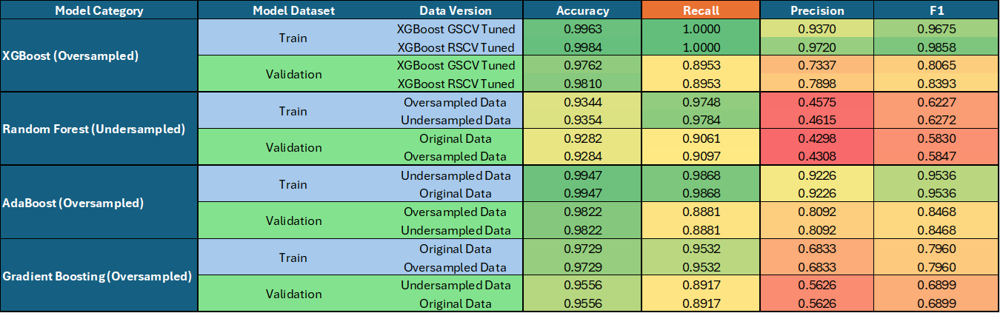


**Observations:**

1. XGBoost Models (Oversampled):

- Both GridSearchCV and RandomizedSearchCV tuned XGBoost models exhibit high validation accuracy and recall, with the RSCV-tuned model slightly outperforming the GSCV-tuned model in terms of validation accuracy and F1 score.
- The RSCV-tuned XGBoost model has a validation recall of 0.8953 with a balanced performance between precision and recall, making it a strong candidate for balanced performance.

2. Random Forest Models (Undersampled):

- The Random Forest models also show strong recall scores, with the RSCV-tuned model performing slightly better than the GSCV-tuned version.
- The RSCV-tuned Random Forest model achieves a validation recall of 0.9097, which is slightly higher than the XGBoost models, but at the cost of significantly lower precision, indicating a high number of false positives.

3. AdaBoost Models (Oversampled):

- Both the GridSearchCV and RandomizedSearchCV-tuned AdaBoost models have the same performance metrics, suggesting identical parameter tuning results.
- The validation recall of 0.8881 is solid, but the precision is lower than the XGBoost models, which suggests it may not handle false positives as well.

4. Gradient Boosting Models (Oversampled):

- Both GSCV and RSCV-tuned Gradient Boosting models perform identically, with a recall of 0.8917 but lower precision and F1 scores compared to XGBoost and Random Forest models.
- The slightly lower precision and recall suggest it might not be the optimal choice among the models considered.


## <a id='toc1_10_'></a>[Final Model Selection:](#toc0_)

**Chosen Model: XGBoost RSCV Tuned with Oversampled Data (xgbco_rscv_tuned)**

The XGBoost RSCV-tuned model balances high recall with better precision and F1 scores compared to Random Forest and AdaBoost. This model shows strong generalization with good validation performance, making it the most robust choice for unseen test data.


### <a id='toc1_10_1_'></a>[Test set final performance](#toc0_)


Test Set Performance:

Classification Report:
               precision    recall  f1-score   support

  No Failure       0.99      0.99      0.99      4718
     Failure       0.79      0.85      0.82       282

    accuracy                           0.98      5000
   macro avg       0.89      0.92      0.91      5000
weighted avg       0.98      0.98      0.98      5000



,Accuracy,Recall,Precision,F1
0,0.9792,0.8546,0.7928,0.8225


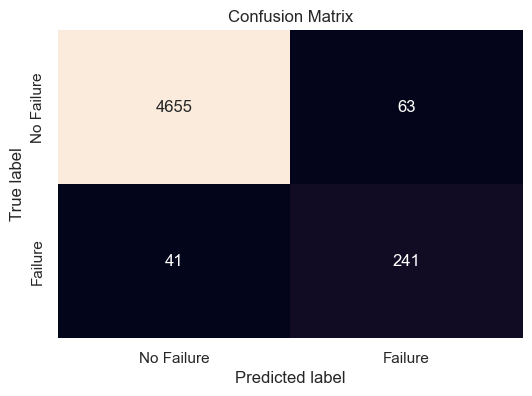

In [133]:
# Evaluating the model on the test set
print("Test Set Performance:")

# Evaluating the model performance on the test data
xgbco_rscv_tuned_perf_test = model_performance_classification_sklearn(
    xgbco_rscv_tuned, X_test, y_test
)
display(xgbco_rscv_tuned_perf_test)

# Plotting the confusion matrix for the test set
confusion_matrix_sklearn(xgbco_rscv_tuned, X_test, y_test)


The final selected model, XGBoost tuned using RandomizedSearchCV on oversampled data, has demonstrated excellent performance on both validation and test datasets. Its high recall and F1 score for the failure class make it particularly suitable for applications where identifying all failure cases is crucial. The overall strong performance metrics validate the model’s suitability for deployment in real-world scenarios, where the cost of missed failures needs to be minimized.


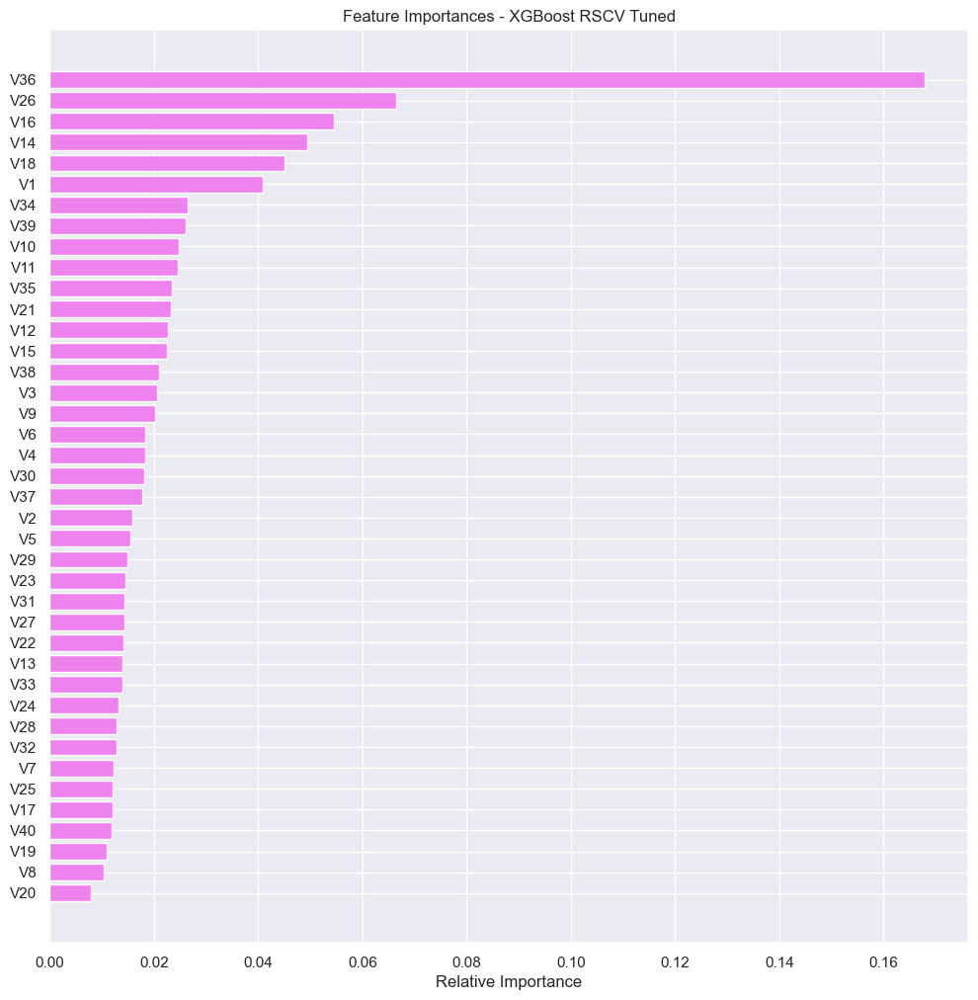

In [134]:
# Extract feature names from the training set
feature_names = X_train_over.columns

# Get feature importances from the tuned XGBoost model
importances = xgbco_rscv_tuned.feature_importances_

# Sort the feature importances in ascending order
indices = np.argsort(importances)

# Plotting the feature importances
plt.figure(figsize=(12, 12))
plt.title("Feature Importances - XGBoost RSCV Tuned")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()


**Observations:**

The plot shows that features V36, V26, and V16 are the most influential in the model’s predictions, significantly outweighing other features. The prominence of V36 suggests it plays a critical role in determining the target variable.


## <a id='toc1_11_'></a>[Pipelines to build the final model](#toc0_)


In [135]:
# Copying data to another variable to avoid any changes to original data
df_train = df_model.copy()


In [136]:
from imblearn.pipeline import Pipeline  # Use imblearn's Pipeline for handling SMOTE
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.metrics import (
    classification_report,
    accuracy_score,
    recall_score,
    precision_score,
    f1_score,
)


# Define the pipeline for the best model
Pipeline_model = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="median")),  # Handling missing values
        (
            "smote",
            SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1),
        ),  # Oversampling minority class
        ("model", xgbco_rscv_tuned),  # Best tuned model
    ]
)


In [137]:
# Separating target variable and other variables
X1 = df_train.drop(columns="Target")
Y1 = df_train["Target"]

# Since we already have a separate test set, we don't need to divide data into train and test
X_test1 = df_test.drop(columns="Target")  # Dropping target variable from test data
y_test1 = df_test["Target"]  # Storing target variable in y_test1


In [138]:
# Since we already have a separate test set, we don't need to divide data into train and test
X_test1 = df_test.drop(columns="Target")  # Dropping target variable from test data
y_test1 = df_test["Target"]  # Storing target variable in y_test1


In [139]:
# Fitting the pipeline model on the training data
Pipeline_model.fit(X1, Y1)


Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                ('smote', SMOTE(random_state=1, sampling_strategy=1)),
                ('model',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric='logloss',
                               feature_types=Non..., grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=250, n_jobs=None,
                               num_parallel_tree=None, random_state=1, ...))])

In [140]:
# Predicting and evaluating performance on the test set
Pipeline_model_test_pred = Pipeline_model.predict(X_test1)
Pipeline_model_test_pred


array([0, 0, 0, ..., 0, 0, 0])

In [141]:
# Display the performance metrics
Pipeline_model_test_perf = {
    "Accuracy": accuracy_score(y_test1, Pipeline_model_test_pred),
    "Recall": recall_score(y_test1, Pipeline_model_test_pred),
    "Precision": precision_score(y_test1, Pipeline_model_test_pred),
    "F1 Score": f1_score(y_test1, Pipeline_model_test_pred),
}

print("Performance on Test Set:")
display(Pipeline_model_test_perf)
print(
    "\nClassification Report:\n",
    classification_report(y_test1, Pipeline_model_test_pred),
)


Performance on Test Set:


{'Accuracy': 0.9746,
 'Recall': 0.8546099290780141,
 'Precision': 0.7370030581039755,
 'F1 Score': 0.7914614121510674}


Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.98      0.99      4718
           1       0.74      0.85      0.79       282

    accuracy                           0.97      5000
   macro avg       0.86      0.92      0.89      5000
weighted avg       0.98      0.97      0.98      5000



# <a id='toc2_'></a>[Business Insights and Conclusions](#toc0_)


---


## <a id='toc2_1_'></a>[Final Conclusion](#toc0_)

This project aimed to develop a predictive maintenance solution for wind turbines using machine learning models to reduce operational costs associated with generator failures. The primary objective was to accurately predict potential failures before they occur, allowing for timely repairs and avoiding costly replacements.

### <a id='toc2_1_1_'></a>[Key Findings and Model Performance:](#toc0_)

- Model Selection and Tuning: Multiple classification models were tested, including XGBoost, Random Forest, AdaBoost, and Gradient Boosting. Hyperparameter tuning was conducted using GridSearchCV and RandomizedSearchCV, with a focus on optimizing recall to capture as many failures as possible.

- **Best Performing Model: The XGBoost model, tuned with RandomizedSearchCV on oversampled data, was selected as the best model due to its balanced performance across accuracy, recall, precision, and F1 score on validation data. On the test set, the model demonstrated strong generalization capabilities, achieving a recall of 85.46%, precision of 79.28%, and overall accuracy of 97.92%.**

- Cost Implications: The predictive model effectively minimized false negatives (missed failures), which are the most costly outcome due to generator replacements. By reducing false negatives and maintaining a high recall rate, the model significantly lowers replacement costs, aligning with the company’s goal to minimize overall maintenance expenses.

- Feature Importance: Analysis of feature importance identified that certain environmental factors and specific turbine components (e.g., V36 and V26) were critical predictors of failure. These insights can guide targeted monitoring and preventive strategies to enhance predictive maintenance efforts.

### <a id='toc2_1_2_'></a>[Business Insights and Recommendations:](#toc0_)

- Cost Reduction: Implementing this model can lead to substantial cost savings by prioritizing repairs over replacements. High recall ensures early detection of most failures, enabling planned maintenance instead of reactive, costly interventions.

- Improved Operational Efficiency: The predictive approach enhances operational efficiency by reducing downtime and unexpected failures, resulting in higher energy output and improved reliability within the energy grid.

- Data-Driven Maintenance Strategy: By integrating the model’s predictions into maintenance schedules, ReneWind can transition from time-based maintenance to condition-based maintenance, reducing unnecessary inspections and focusing resources where they are most needed.

- Scalable Solution: The model’s ability to adapt to new data supports continuous learning and improvement, making it a scalable solution that evolves with changing operational conditions and component wear patterns.

### <a id='toc2_1_3_'></a>[Next Steps:](#toc0_)

- Implementation and Monitoring: Deploy the model in a real-time monitoring environment to continuously assess performance and make necessary adjustments.

- Integration with Maintenance Teams: Collaborate with field engineers and maintenance teams to integrate predictive insights into daily operations seamlessly.

- Continuous Data Collection and Model Updates: Regularly update the model with new data to maintain accurate predictions that reflect the latest operating conditions.


# <a id='toc3_'></a>[Appendix](#toc0_)

- Click here to go to Summarized [Exploratory Data Analysis (EDA)](#toc1_3_) section
- Click here to go back to the [Table of Contents](#toc0_)


## <a id='toc3_1_'></a>[Univariate Analysis](#toc0_)


Distribution of 'V1'
count   19982.0000
mean       -0.2720
std         3.4416
min       -11.8765
25%        -2.7371
50%        -0.7479
75%         1.8401
max        15.4930
Name: V1, dtype: float64


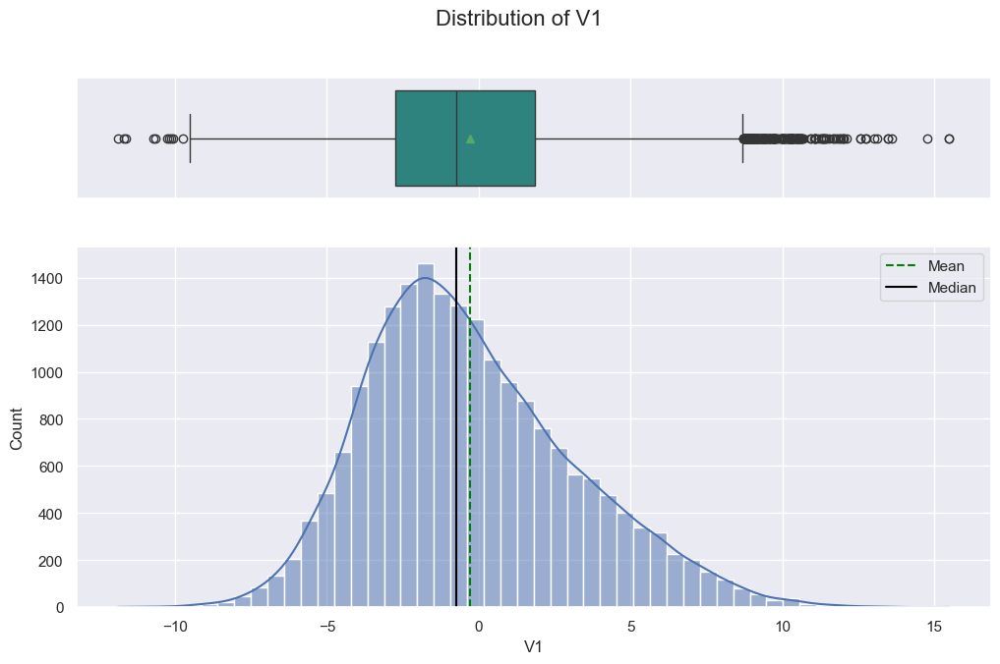

----------------------------------------------------------------------------------------------------
Distribution of 'V2'
count   19982.0000
mean        0.4404
std         3.1508
min       -12.3200
25%        -1.6407
50%         0.4715
75%         2.5440
max        13.0893
Name: V2, dtype: float64


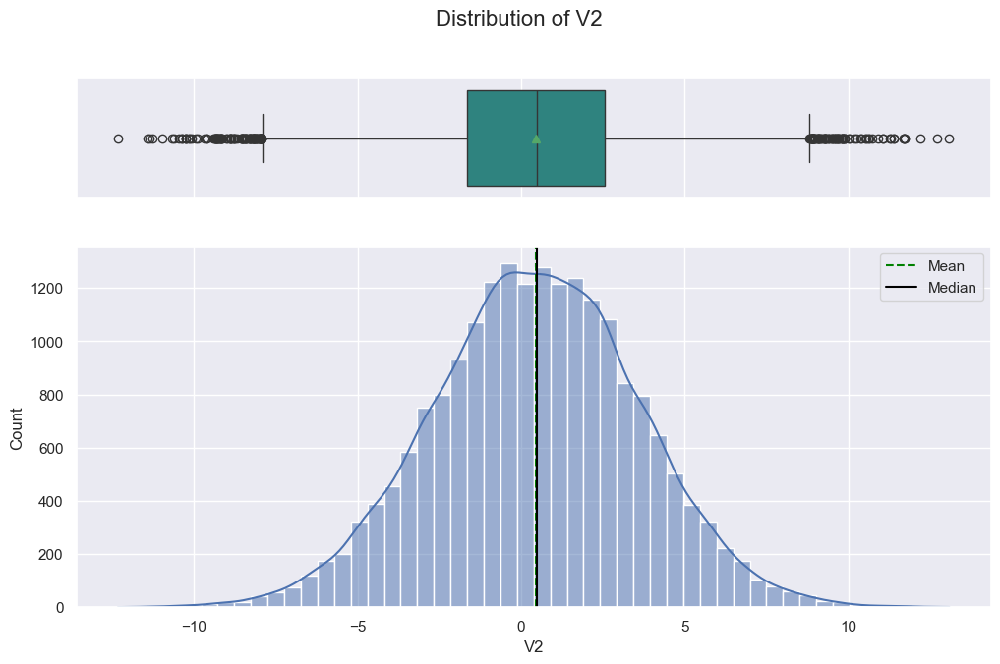

----------------------------------------------------------------------------------------------------
Distribution of 'V3'
count   20000.0000
mean        2.4847
std         3.3890
min       -10.7081
25%         0.2069
50%         2.2558
75%         4.5662
max        17.0909
Name: V3, dtype: float64


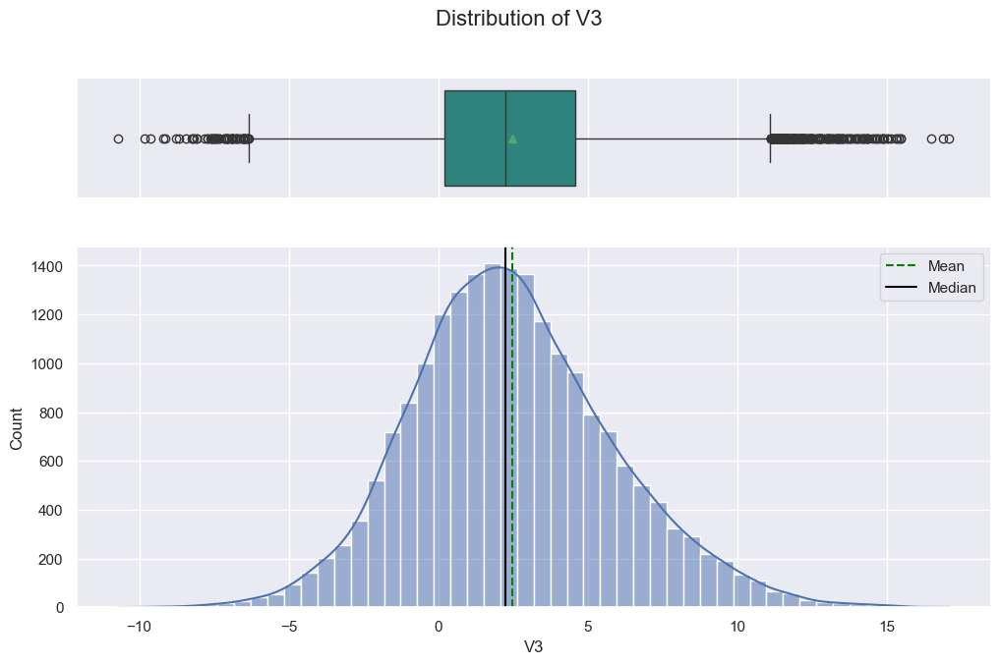

----------------------------------------------------------------------------------------------------
Distribution of 'V4'
count   20000.0000
mean       -0.0832
std         3.4316
min       -15.0821
25%        -2.3477
50%        -0.1352
75%         2.1306
max        13.2364
Name: V4, dtype: float64


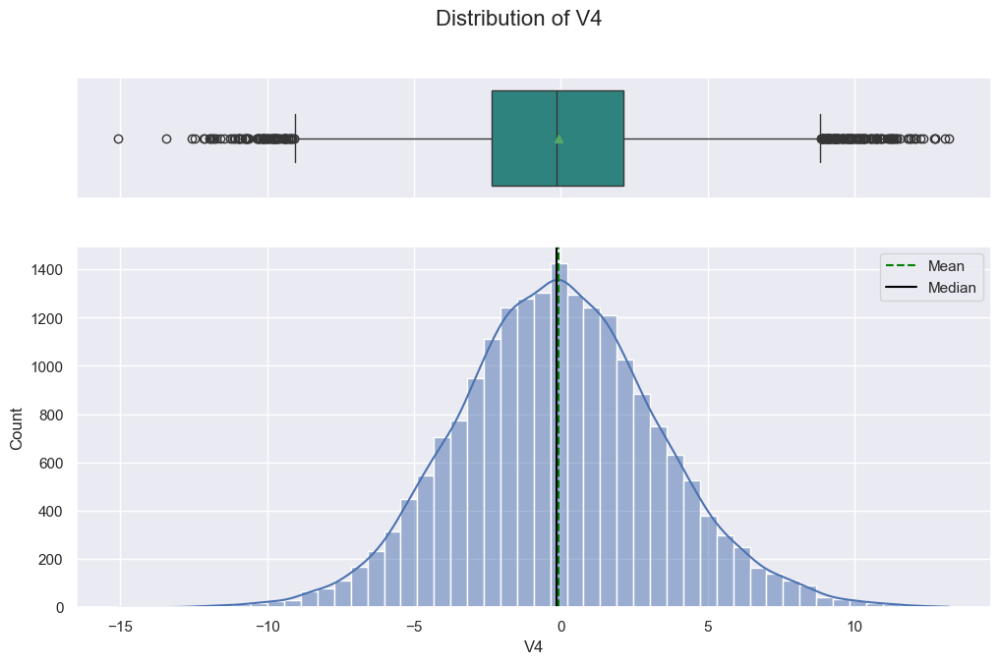

----------------------------------------------------------------------------------------------------
Distribution of 'V5'
count   20000.0000
mean       -0.0538
std         2.1048
min        -8.6034
25%        -1.5356
50%        -0.1020
75%         1.3405
max         8.1338
Name: V5, dtype: float64


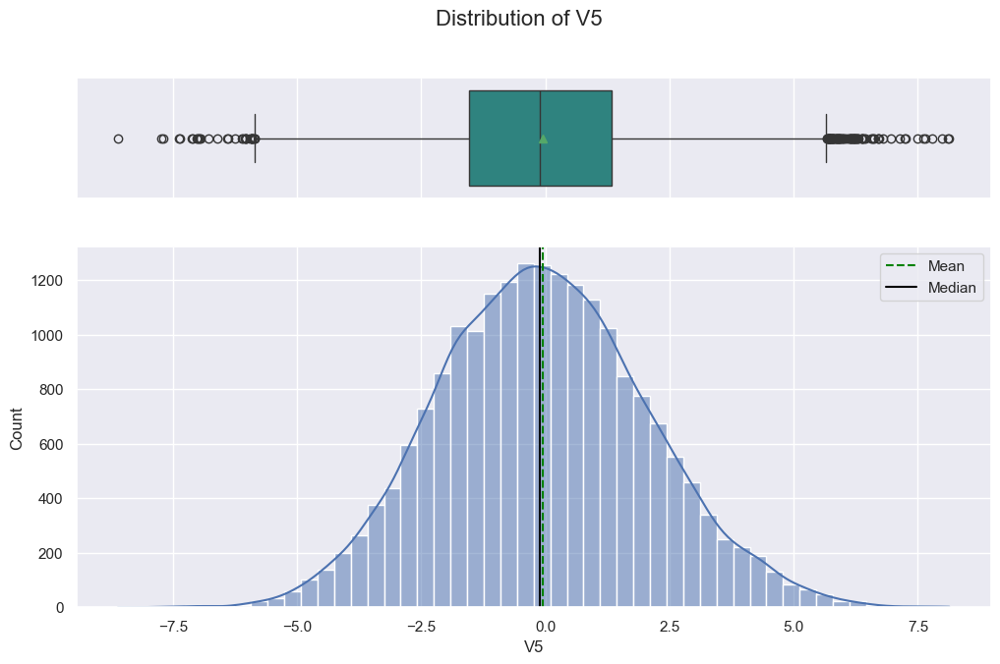

----------------------------------------------------------------------------------------------------
Distribution of 'V6'
count   20000.0000
mean       -0.9954
std         2.0410
min       -10.2271
25%        -2.3472
50%        -1.0005
75%         0.3803
max         6.9758
Name: V6, dtype: float64


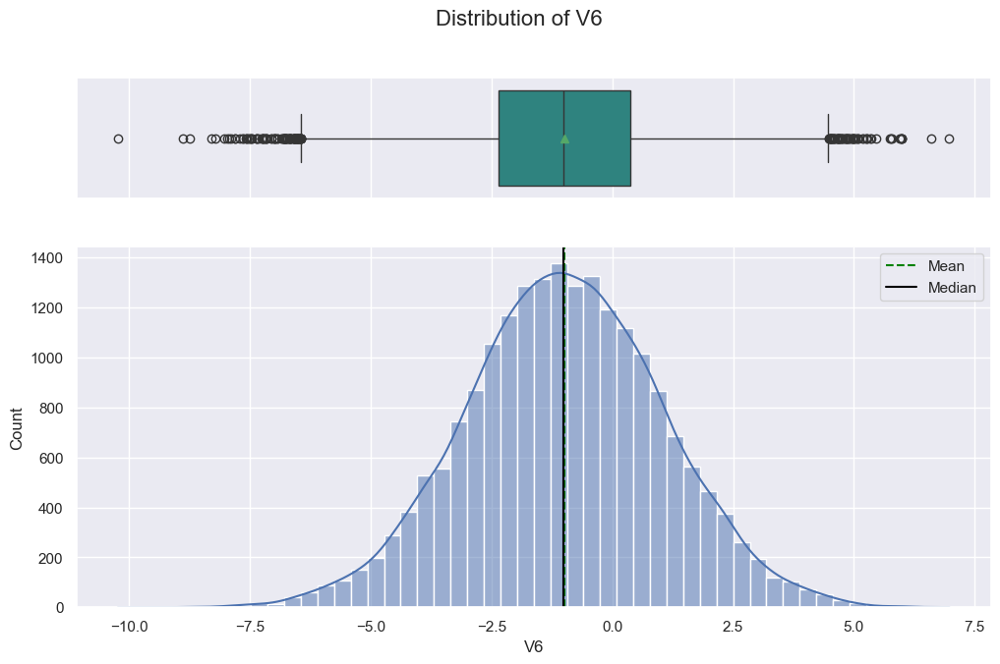

----------------------------------------------------------------------------------------------------
Distribution of 'V7'
count   20000.0000
mean       -0.8793
std         1.7616
min        -7.9497
25%        -2.0309
50%        -0.9172
75%         0.2237
max         8.0061
Name: V7, dtype: float64


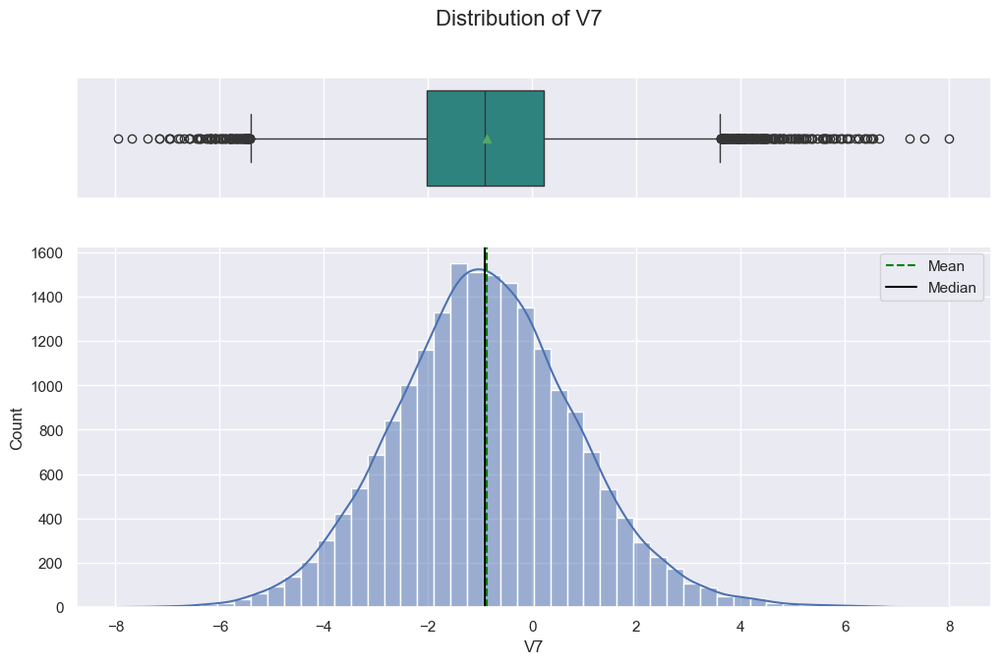

----------------------------------------------------------------------------------------------------
Distribution of 'V8'
count   20000.0000
mean       -0.5482
std         3.2958
min       -15.6576
25%        -2.6427
50%        -0.3891
75%         1.7230
max        11.6795
Name: V8, dtype: float64


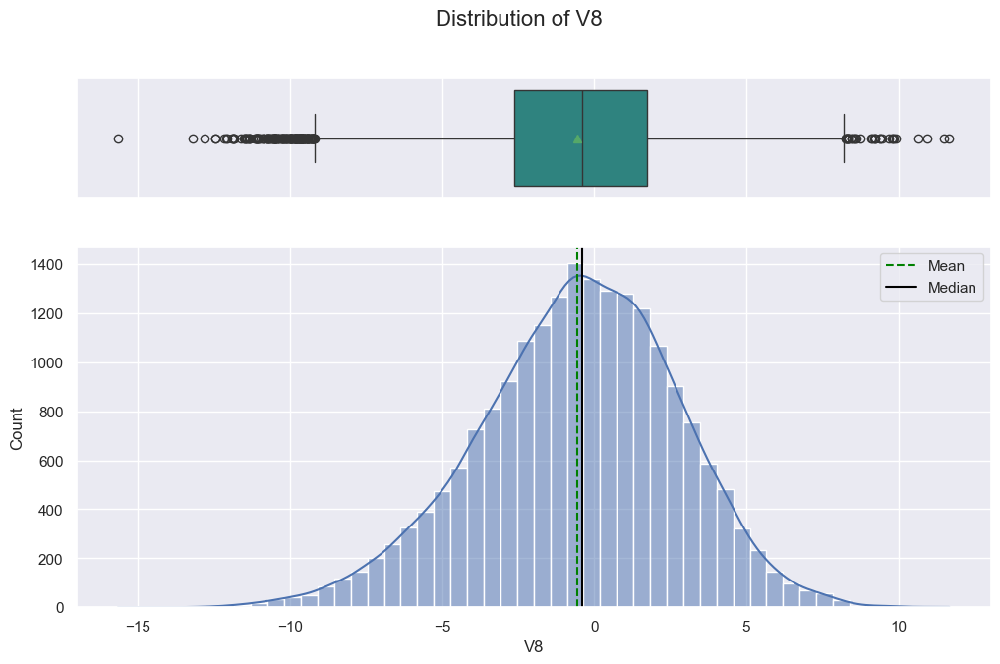

----------------------------------------------------------------------------------------------------
Distribution of 'V9'
count   20000.0000
mean       -0.0168
std         2.1606
min        -8.5963
25%        -1.4950
50%        -0.0676
75%         1.4092
max         8.1376
Name: V9, dtype: float64


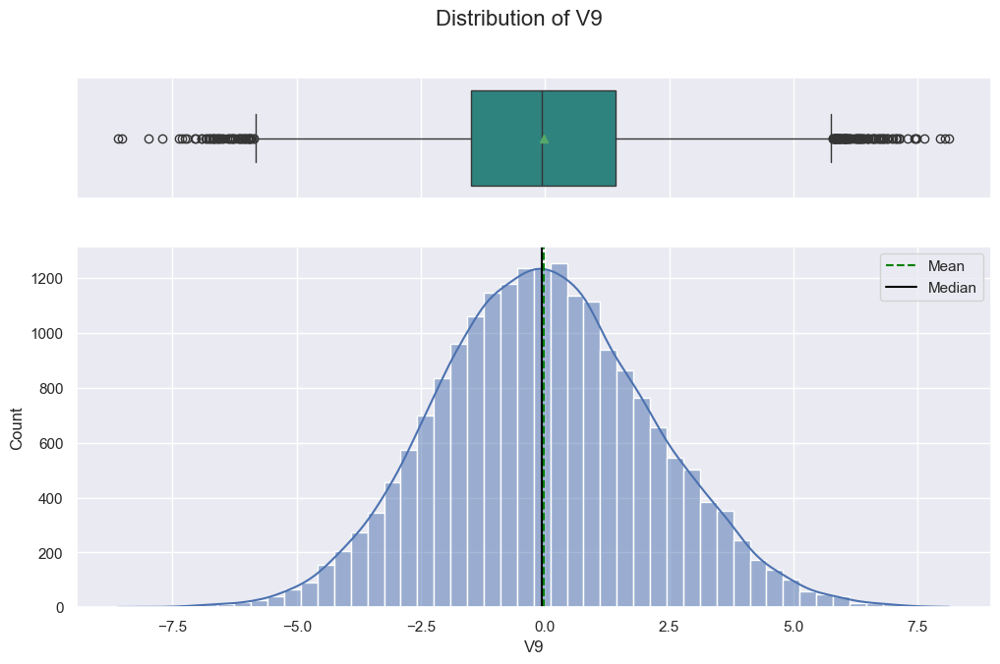

----------------------------------------------------------------------------------------------------
Distribution of 'V10'
count   20000.0000
mean       -0.0130
std         2.1932
min        -9.8540
25%        -1.4112
50%         0.1010
75%         1.4770
max         8.1085
Name: V10, dtype: float64


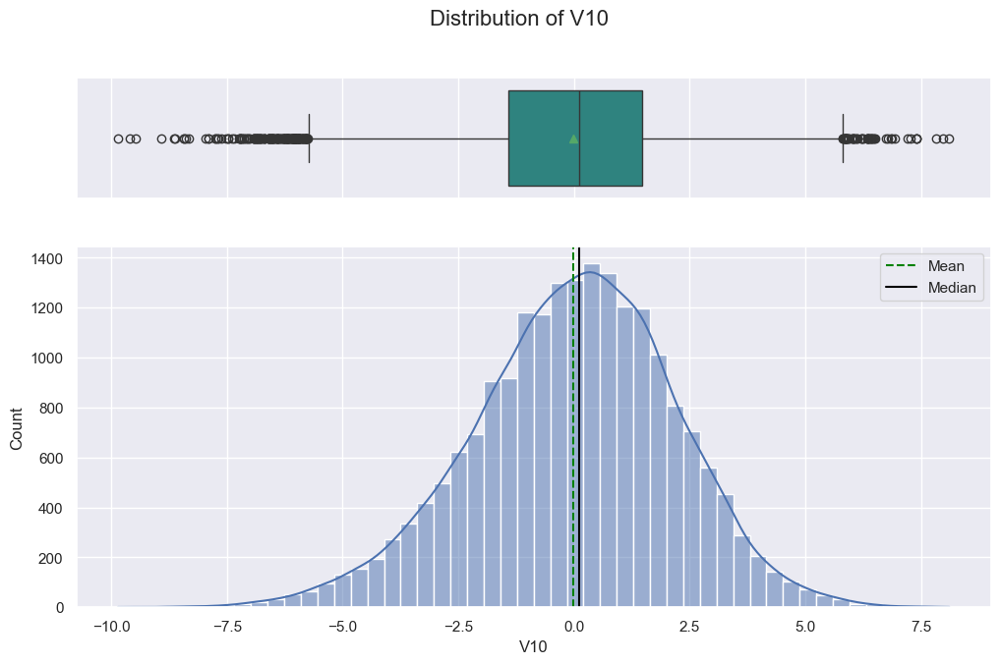

----------------------------------------------------------------------------------------------------
Distribution of 'V11'
count   20000.0000
mean       -1.8954
std         3.1243
min       -14.8321
25%        -3.9224
50%        -1.9212
75%         0.1189
max        11.8264
Name: V11, dtype: float64


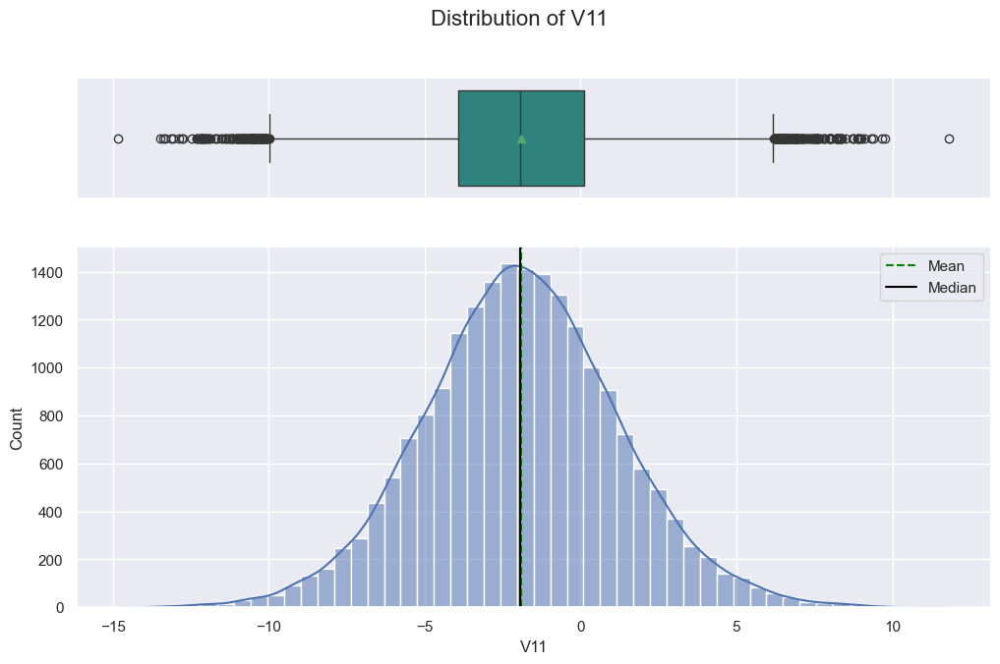

----------------------------------------------------------------------------------------------------
Distribution of 'V12'
count   20000.0000
mean        1.6048
std         2.9305
min       -12.9480
25%        -0.3965
50%         1.5078
75%         3.5715
max        15.0807
Name: V12, dtype: float64


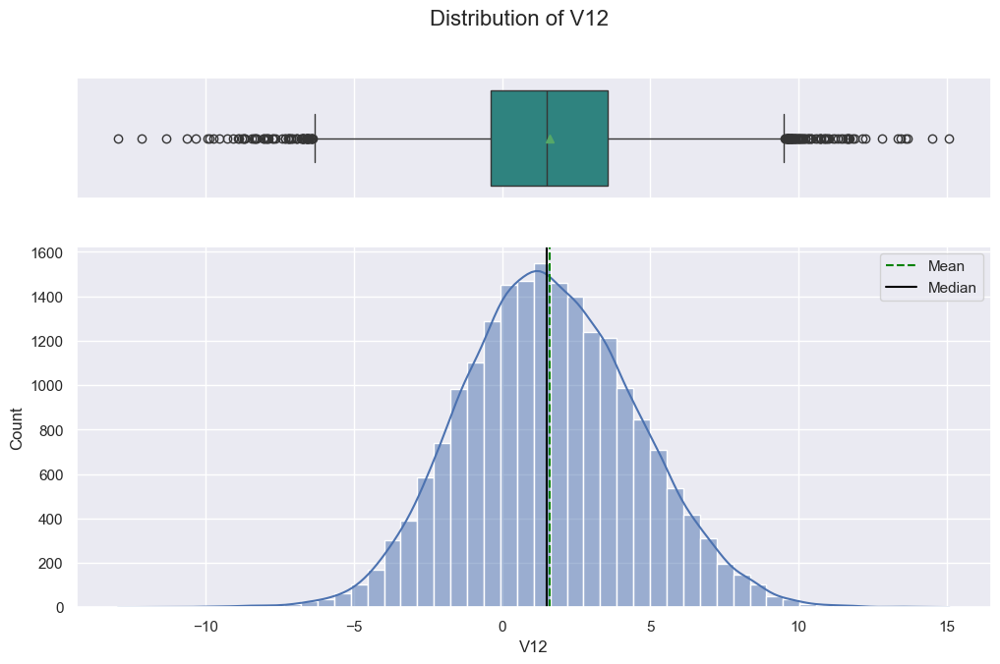

----------------------------------------------------------------------------------------------------
Distribution of 'V13'
count   20000.0000
mean        1.5805
std         2.8747
min       -13.2282
25%        -0.2235
50%         1.6372
75%         3.4599
max        15.4196
Name: V13, dtype: float64


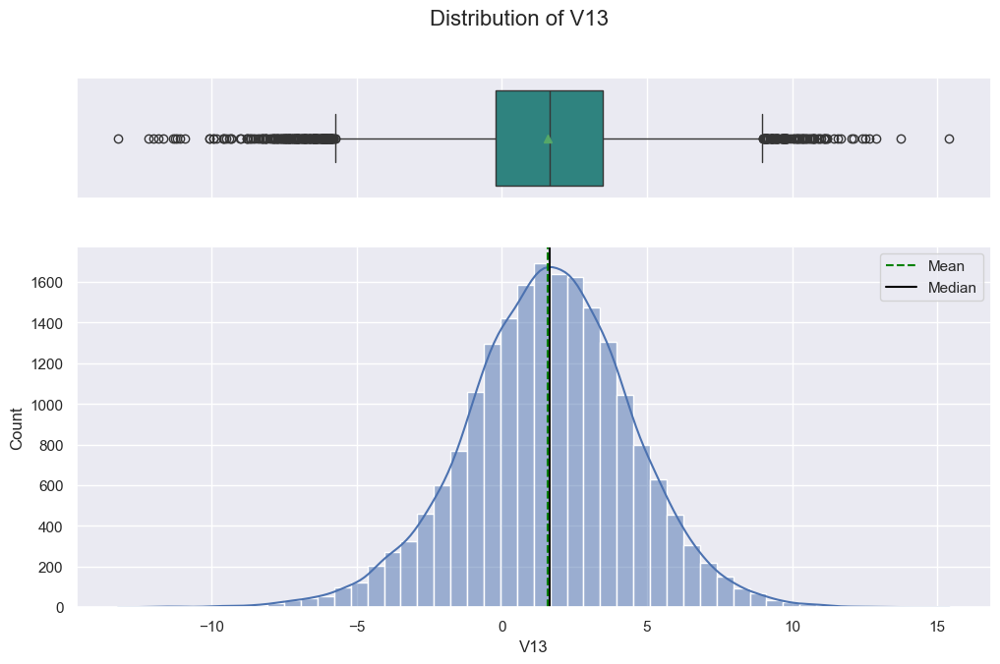

----------------------------------------------------------------------------------------------------
Distribution of 'V14'
count   20000.0000
mean       -0.9506
std         1.7897
min        -7.7386
25%        -2.1707
50%        -0.9572
75%         0.2707
max         5.6707
Name: V14, dtype: float64


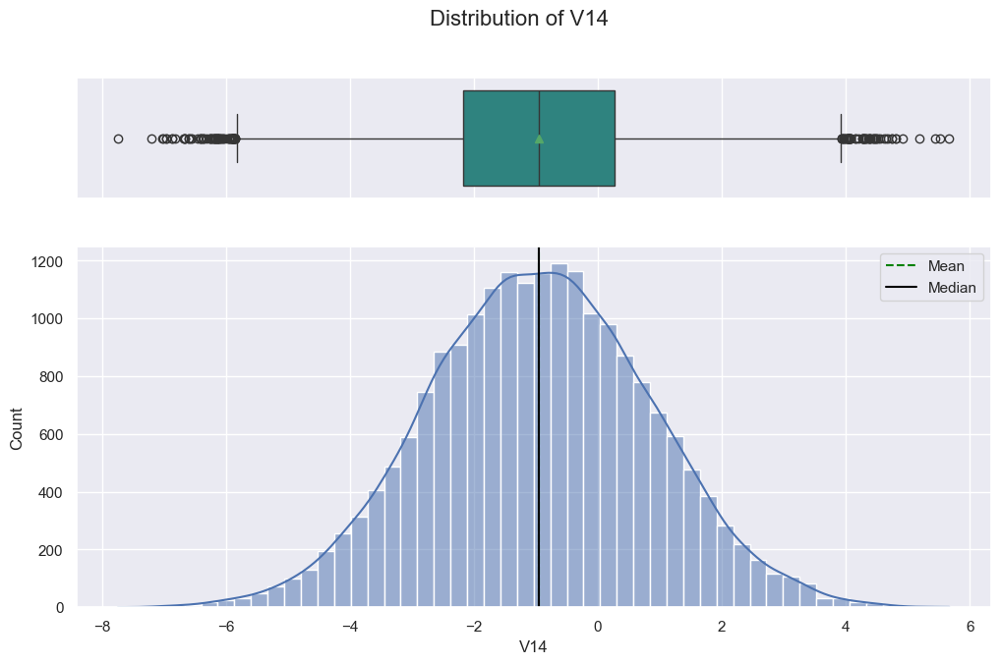

----------------------------------------------------------------------------------------------------
Distribution of 'V15'
count   20000.0000
mean       -2.4150
std         3.3550
min       -16.4166
25%        -4.4153
50%        -2.3826
75%        -0.3591
max        12.2465
Name: V15, dtype: float64


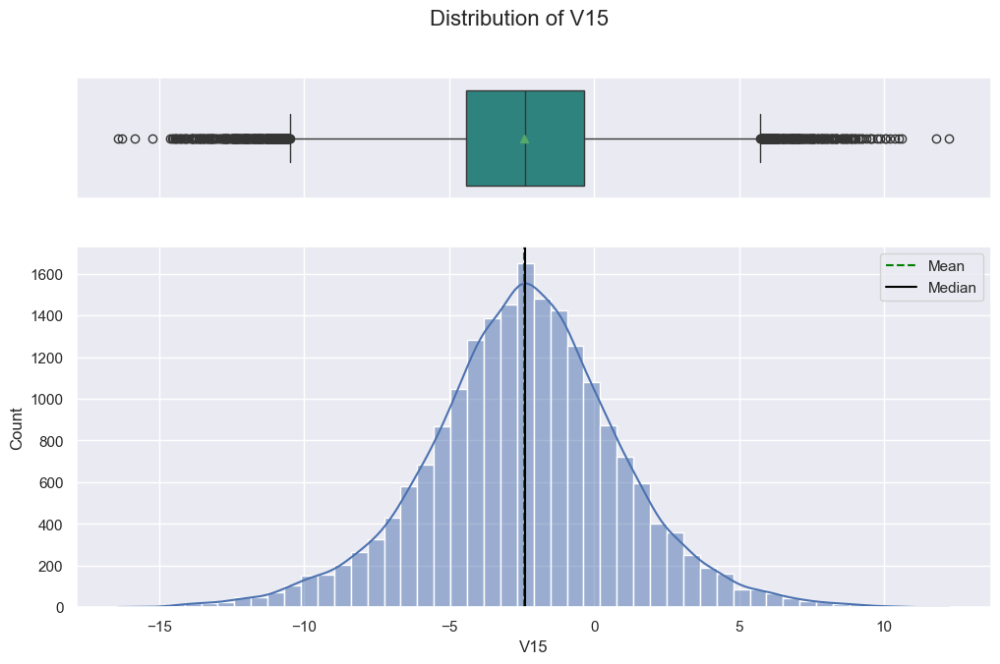

----------------------------------------------------------------------------------------------------
Distribution of 'V16'
count   20000.0000
mean       -2.9252
std         4.2217
min       -20.3742
25%        -5.6342
50%        -2.6827
75%        -0.0950
max        13.5832
Name: V16, dtype: float64


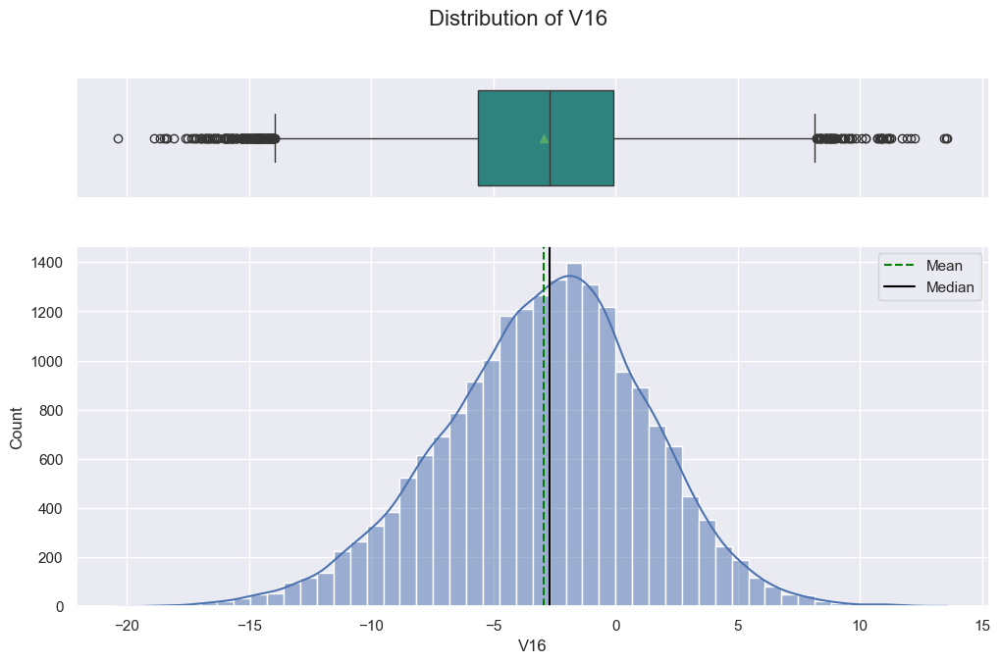

----------------------------------------------------------------------------------------------------
Distribution of 'V17'
count   20000.0000
mean       -0.1343
std         3.3455
min       -14.0912
25%        -2.2156
50%        -0.0146
75%         2.0688
max        16.7564
Name: V17, dtype: float64


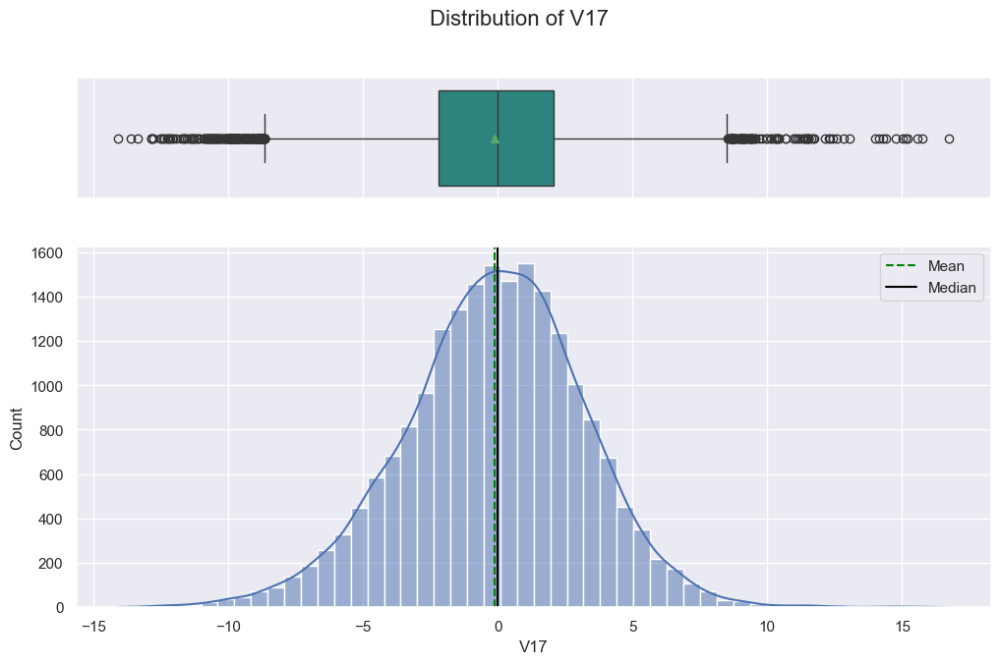

----------------------------------------------------------------------------------------------------
Distribution of 'V18'
count   20000.0000
mean        1.1893
std         2.5923
min       -11.6440
25%        -0.4039
50%         0.8834
75%         2.5718
max        13.1799
Name: V18, dtype: float64


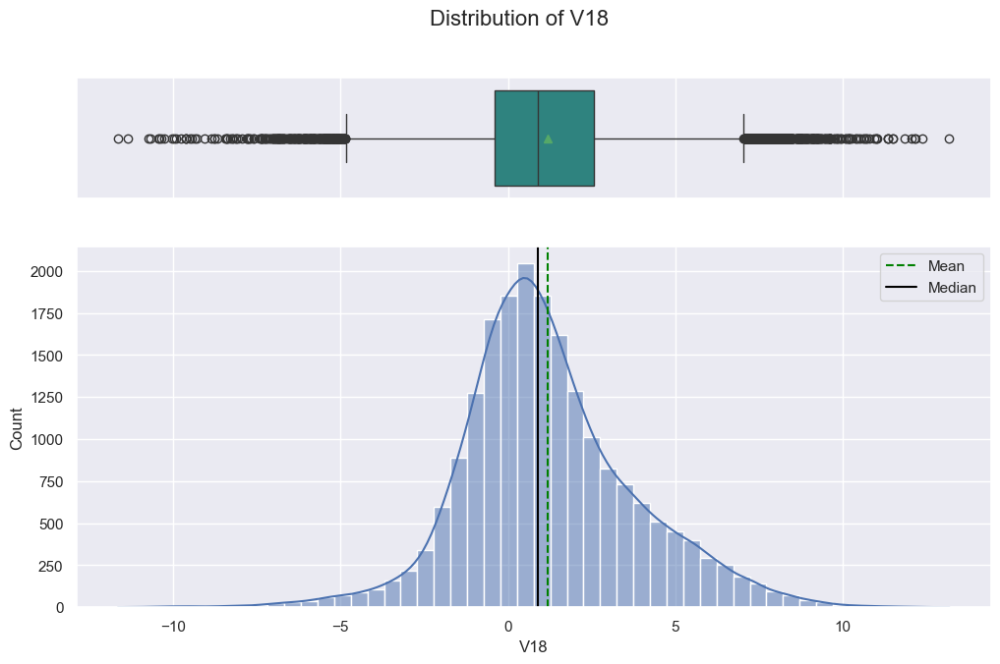

----------------------------------------------------------------------------------------------------
Distribution of 'V19'
count   20000.0000
mean        1.1818
std         3.3969
min       -13.4918
25%        -1.0502
50%         1.2791
75%         3.4933
max        13.2377
Name: V19, dtype: float64


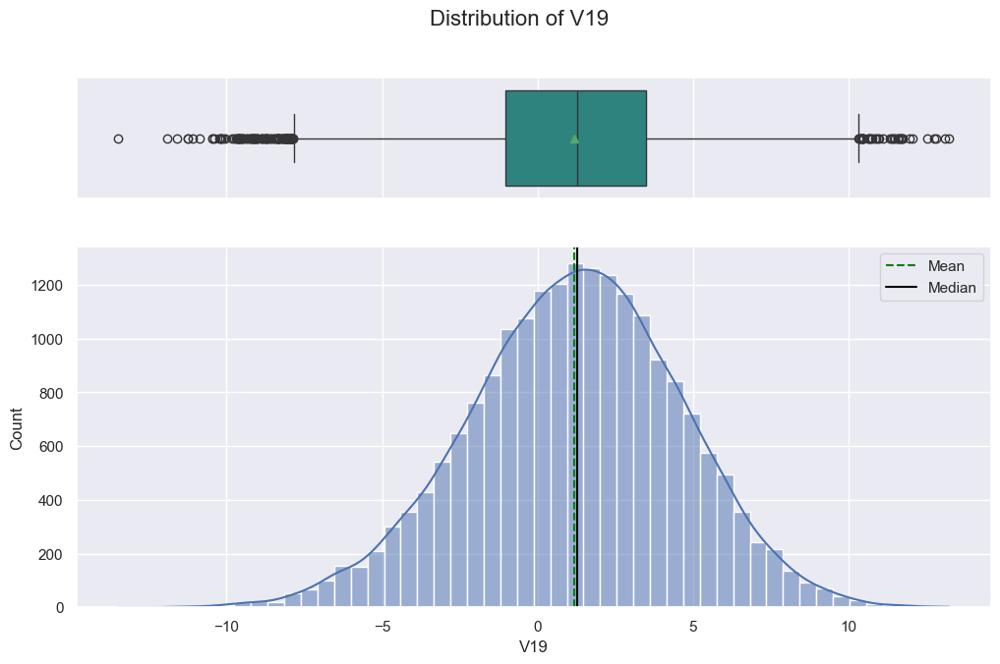

----------------------------------------------------------------------------------------------------
Distribution of 'V20'
count   20000.0000
mean        0.0236
std         3.6695
min       -13.9227
25%        -2.4330
50%         0.0334
75%         2.5124
max        16.0523
Name: V20, dtype: float64


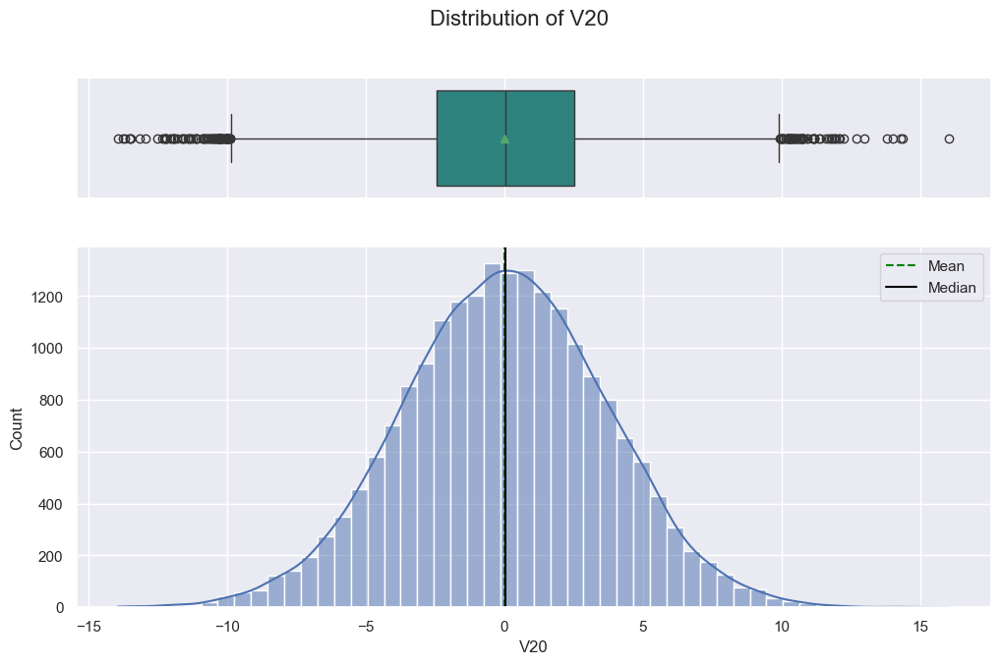

----------------------------------------------------------------------------------------------------
Distribution of 'V21'
count   20000.0000
mean       -3.6113
std         3.5677
min       -17.9562
25%        -5.9304
50%        -3.5329
75%        -1.2659
max        13.8405
Name: V21, dtype: float64


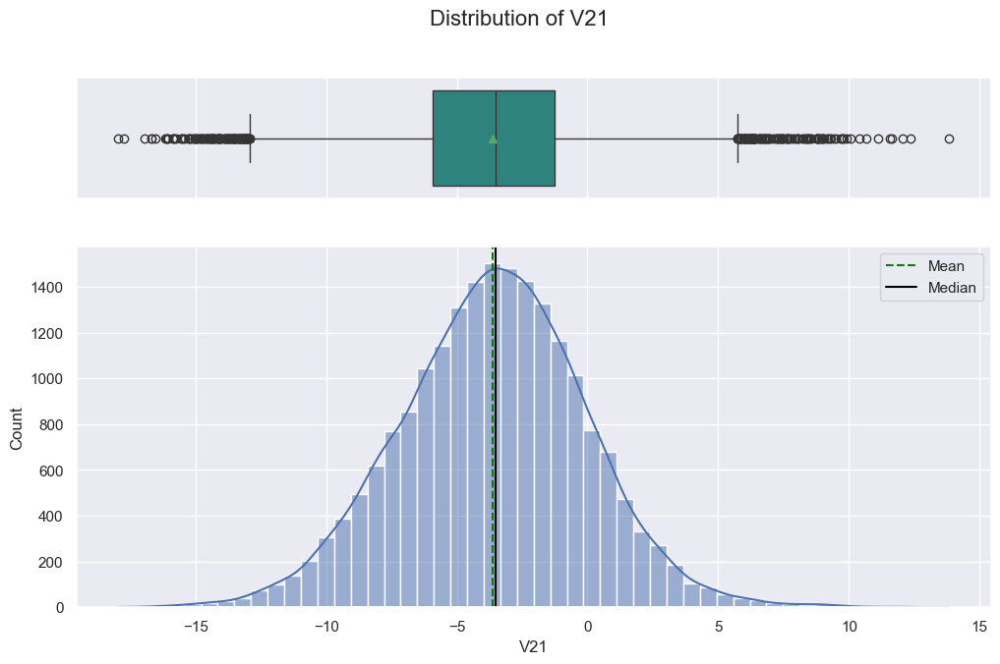

----------------------------------------------------------------------------------------------------
Distribution of 'V22'
count   20000.0000
mean        0.9518
std         1.6515
min       -10.1221
25%        -0.1181
50%         0.9747
75%         2.0256
max         7.4099
Name: V22, dtype: float64


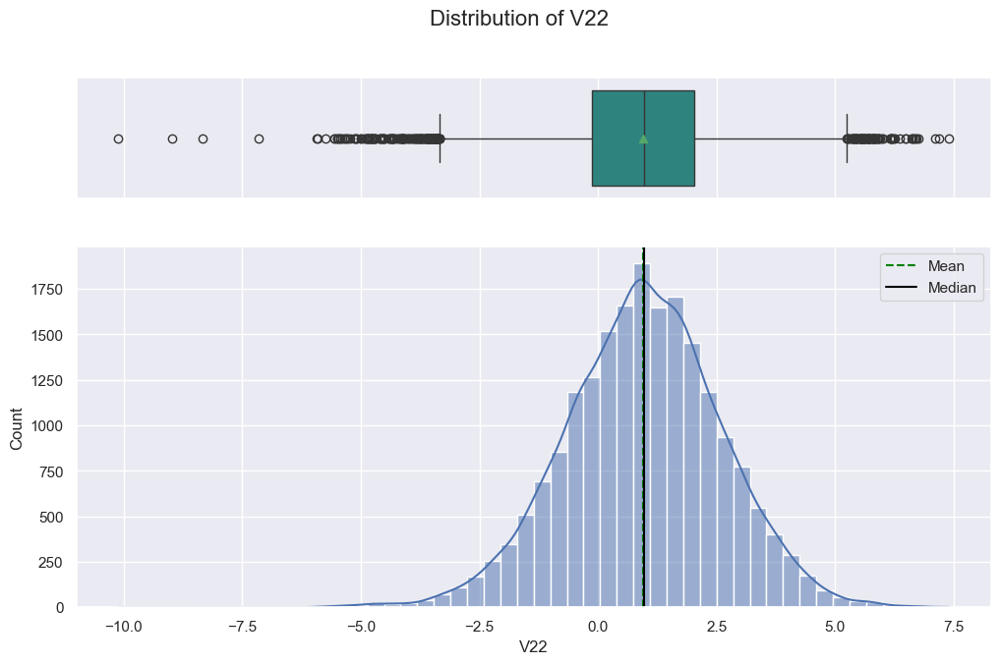

----------------------------------------------------------------------------------------------------
Distribution of 'V23'
count   20000.0000
mean       -0.3661
std         4.0319
min       -14.8661
25%        -3.0988
50%        -0.2621
75%         2.4517
max        14.4587
Name: V23, dtype: float64


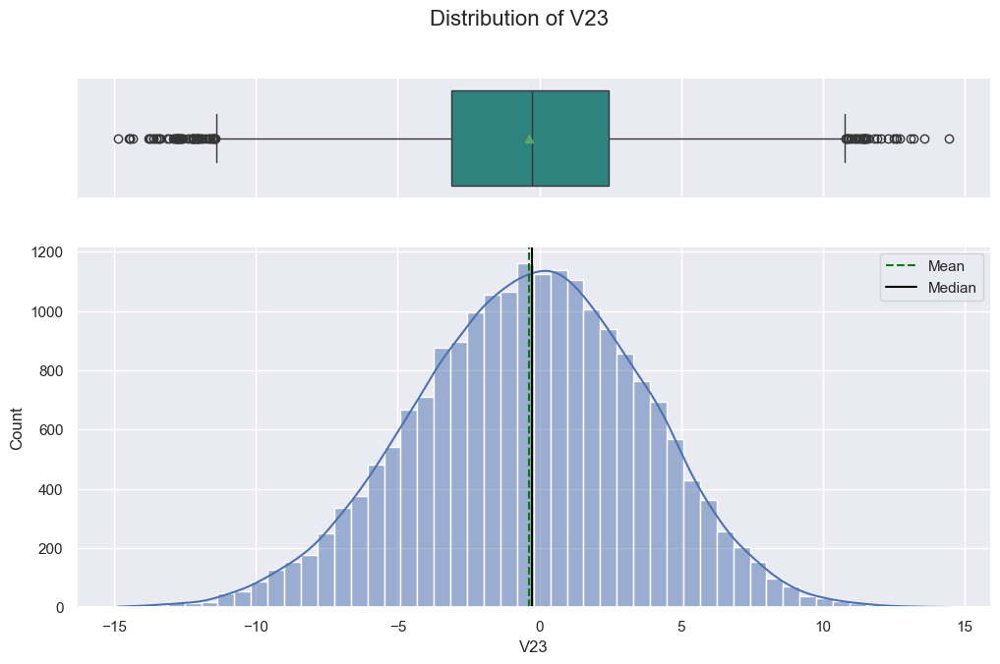

----------------------------------------------------------------------------------------------------
Distribution of 'V24'
count   20000.0000
mean        1.1344
std         3.9121
min       -16.3871
25%        -1.4681
50%         0.9690
75%         3.5460
max        17.1633
Name: V24, dtype: float64


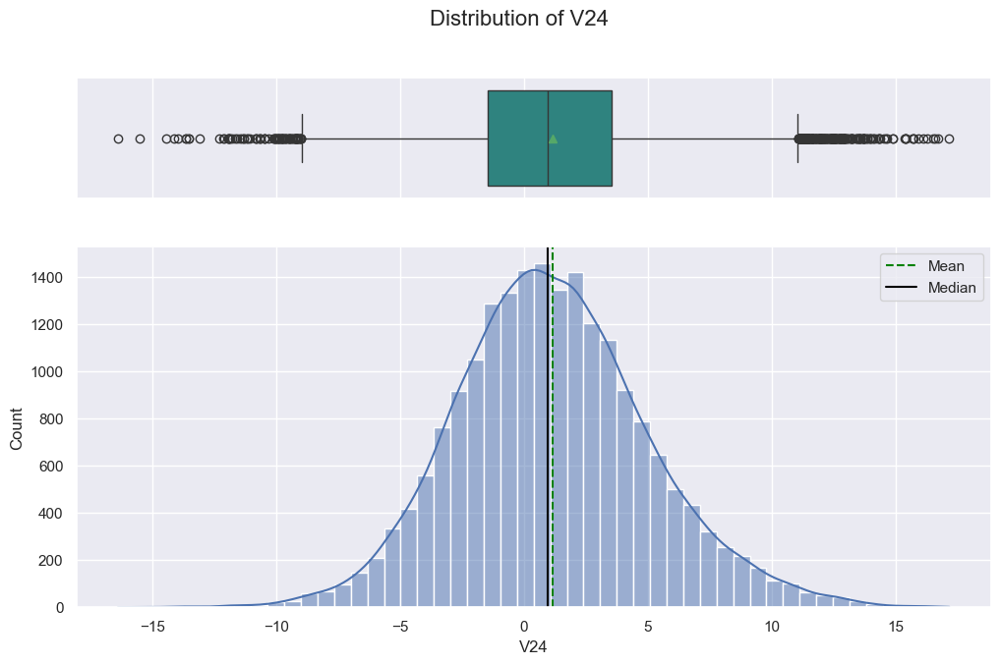

----------------------------------------------------------------------------------------------------
Distribution of 'V25'
count   20000.0000
mean       -0.0022
std         2.0167
min        -8.2283
25%        -1.3652
50%         0.0251
75%         1.3971
max         8.2234
Name: V25, dtype: float64


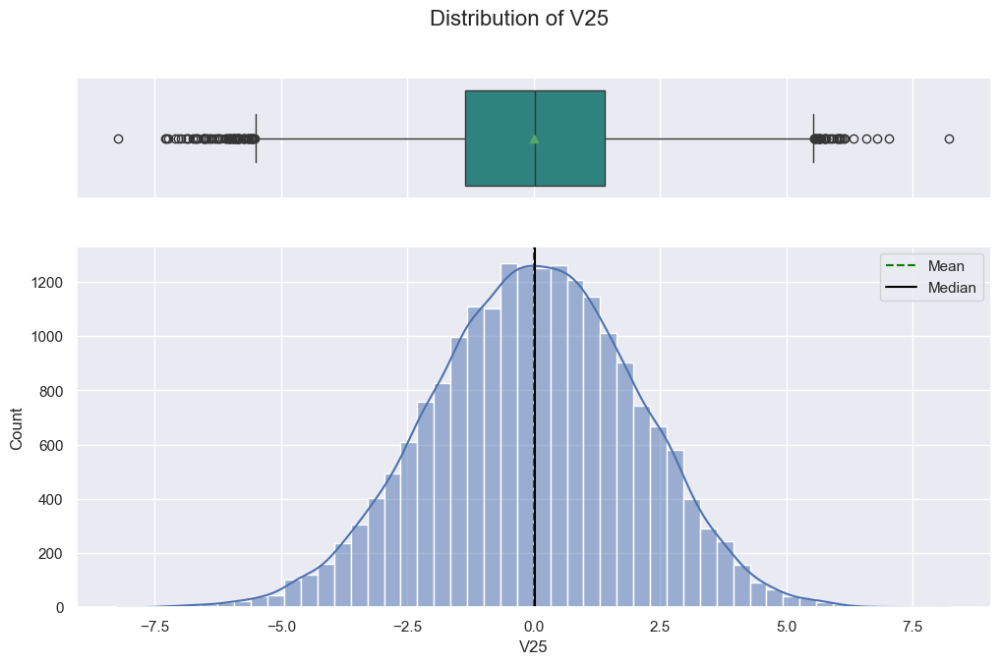

----------------------------------------------------------------------------------------------------
Distribution of 'V26'
count   20000.0000
mean        1.8738
std         3.4351
min       -11.8343
25%        -0.3379
50%         1.9505
75%         4.1300
max        16.8364
Name: V26, dtype: float64


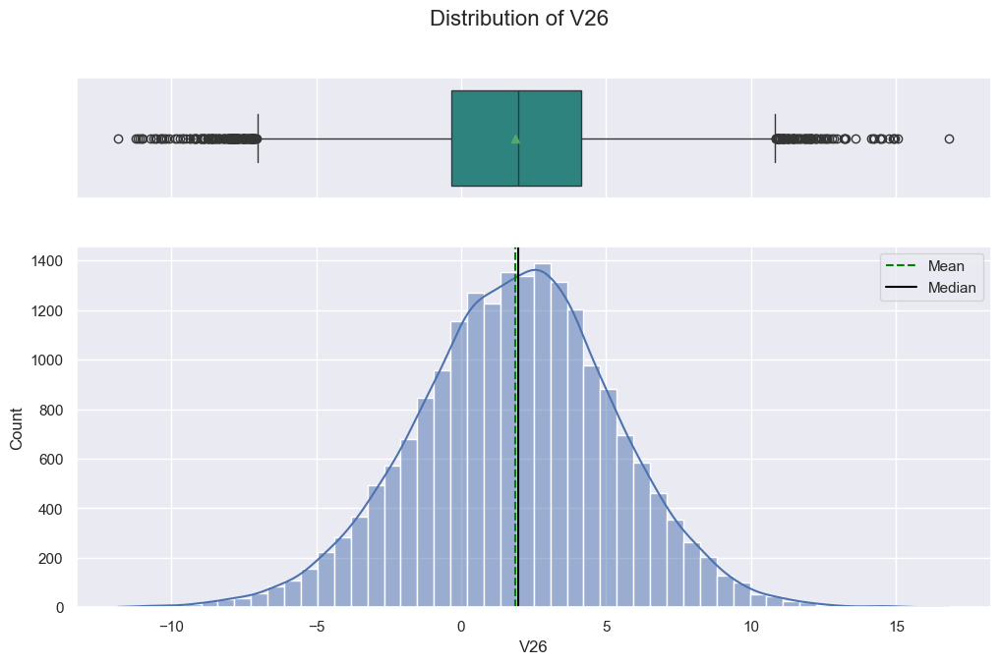

----------------------------------------------------------------------------------------------------
Distribution of 'V27'
count   20000.0000
mean       -0.6124
std         4.3688
min       -14.9049
25%        -3.6523
50%        -0.8849
75%         2.1892
max        17.5604
Name: V27, dtype: float64


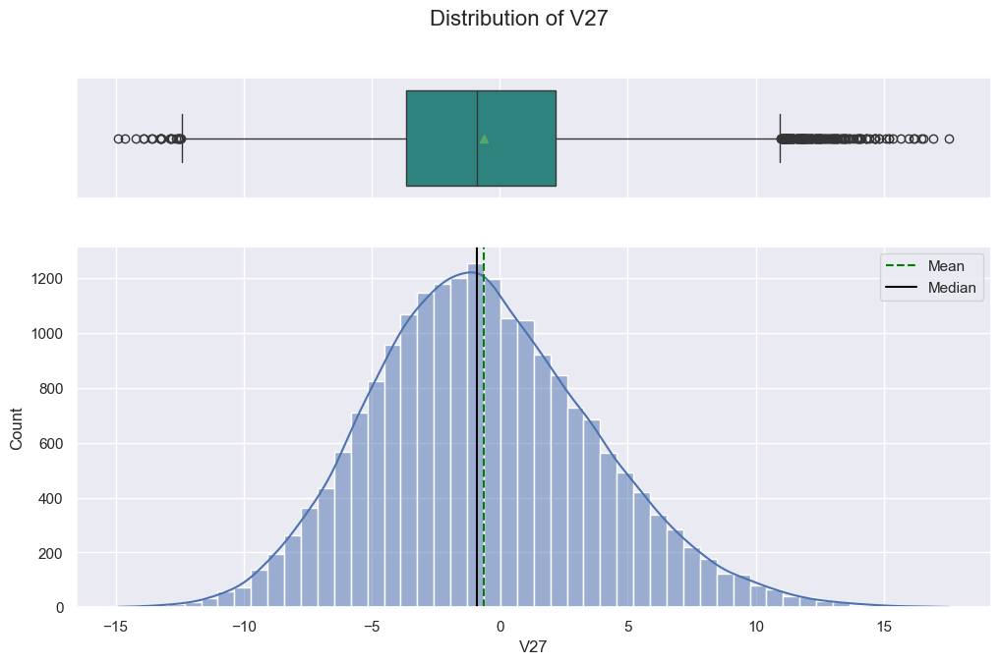

----------------------------------------------------------------------------------------------------
Distribution of 'V28'
count   20000.0000
mean       -0.8832
std         1.9177
min        -9.2695
25%        -2.1712
50%        -0.8911
75%         0.3759
max         6.5276
Name: V28, dtype: float64


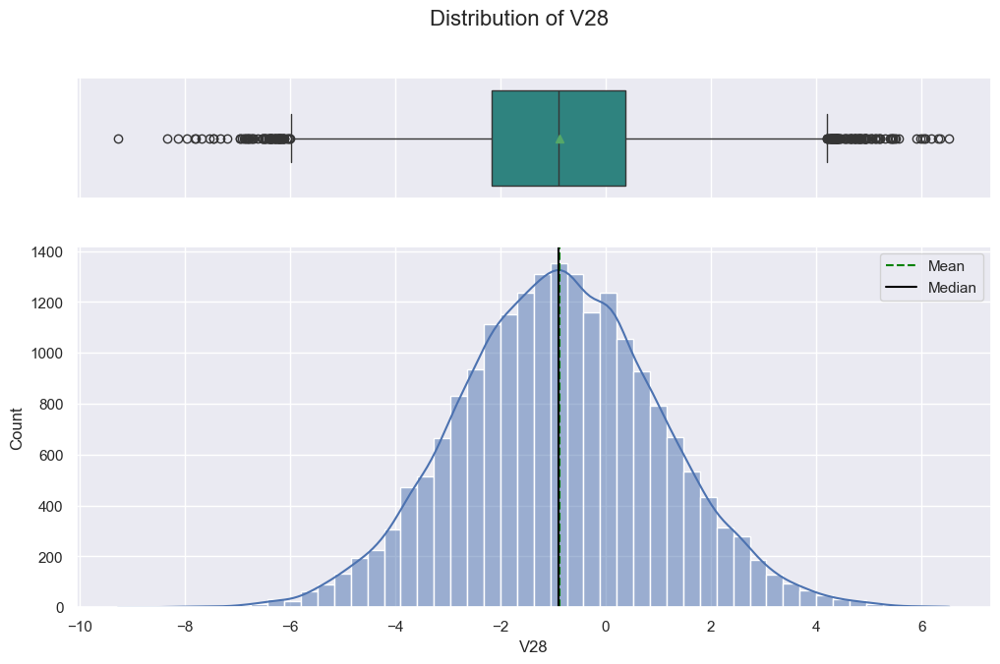

----------------------------------------------------------------------------------------------------
Distribution of 'V29'
count   20000.0000
mean       -0.9856
std         2.6844
min       -12.5795
25%        -2.7874
50%        -1.1762
75%         0.6298
max        10.7221
Name: V29, dtype: float64


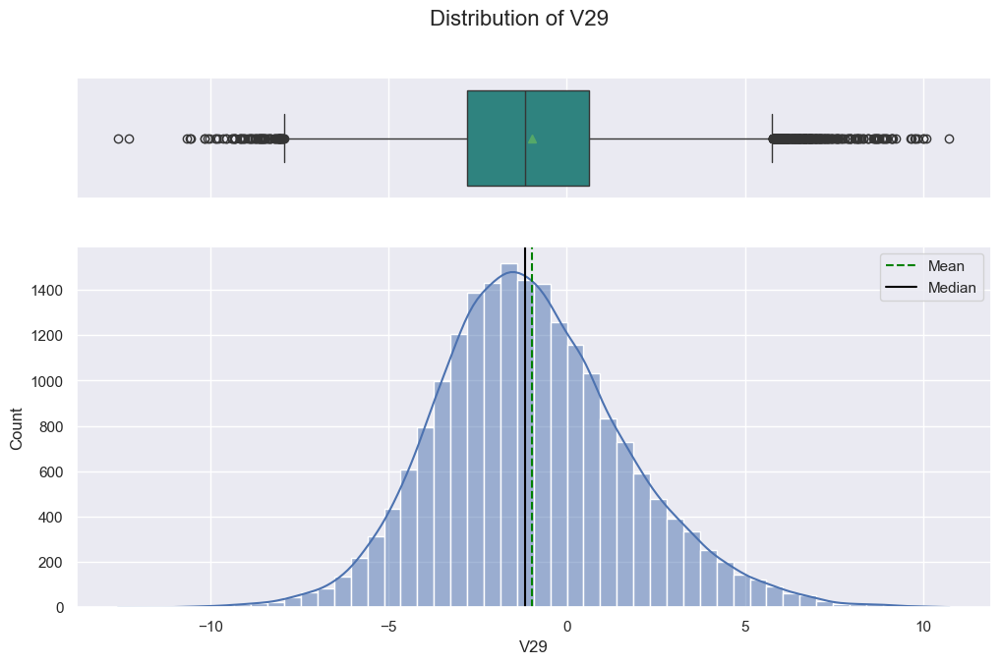

----------------------------------------------------------------------------------------------------
Distribution of 'V30'
count   20000.0000
mean       -0.0155
std         3.0053
min       -14.7960
25%        -1.8671
50%         0.1843
75%         2.0362
max        12.5058
Name: V30, dtype: float64


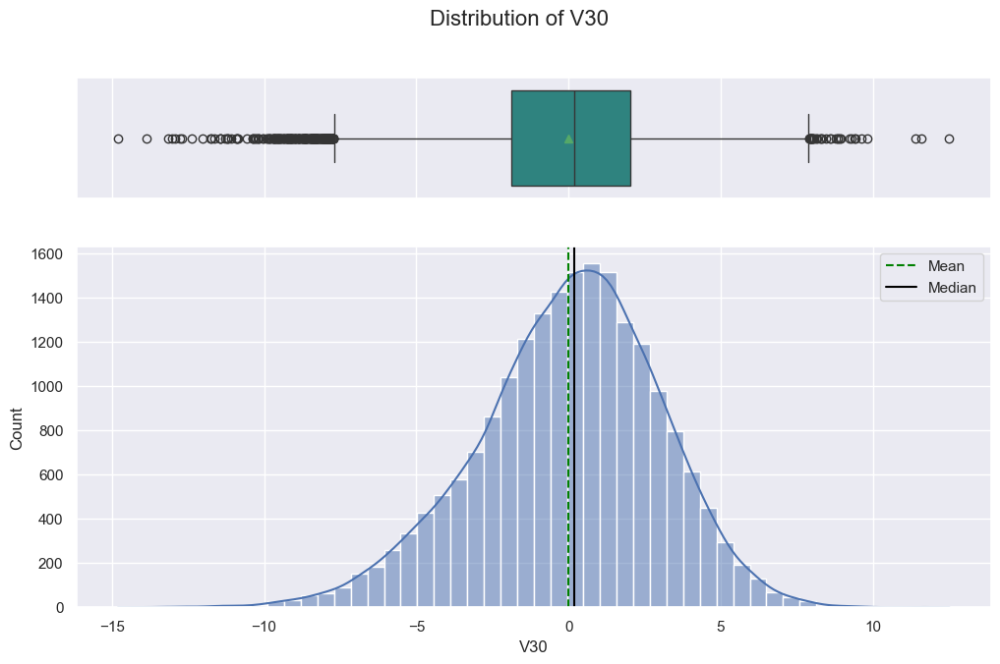

----------------------------------------------------------------------------------------------------
Distribution of 'V31'
count   20000.0000
mean        0.4868
std         3.4614
min       -13.7228
25%        -1.8178
50%         0.4903
75%         2.7307
max        17.2551
Name: V31, dtype: float64


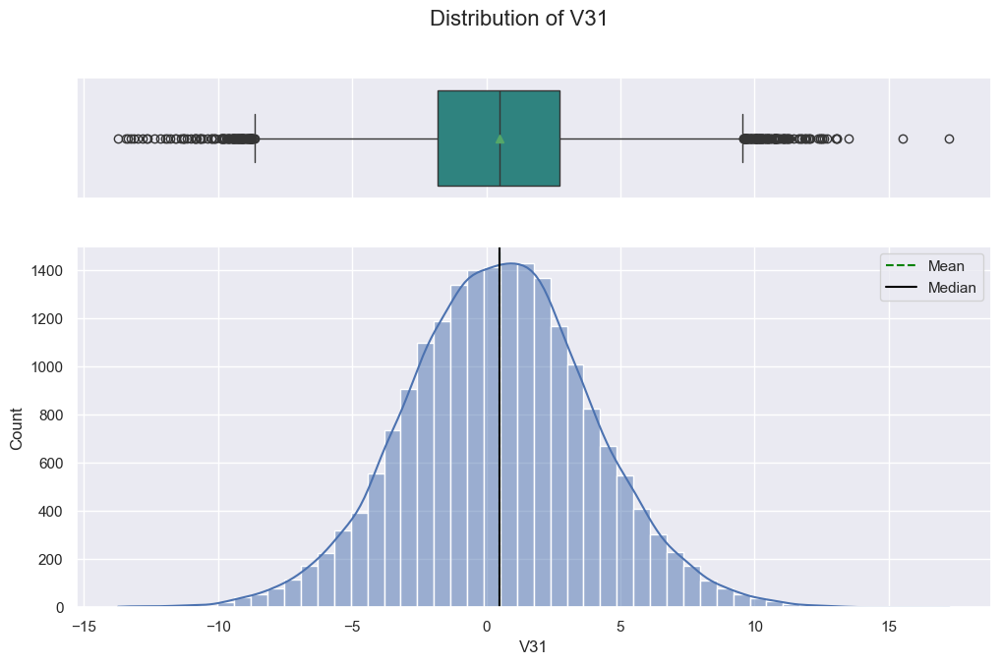

----------------------------------------------------------------------------------------------------
Distribution of 'V32'
count   20000.0000
mean        0.3038
std         5.5004
min       -19.8765
25%        -3.4205
50%         0.0521
75%         3.7617
max        23.6332
Name: V32, dtype: float64


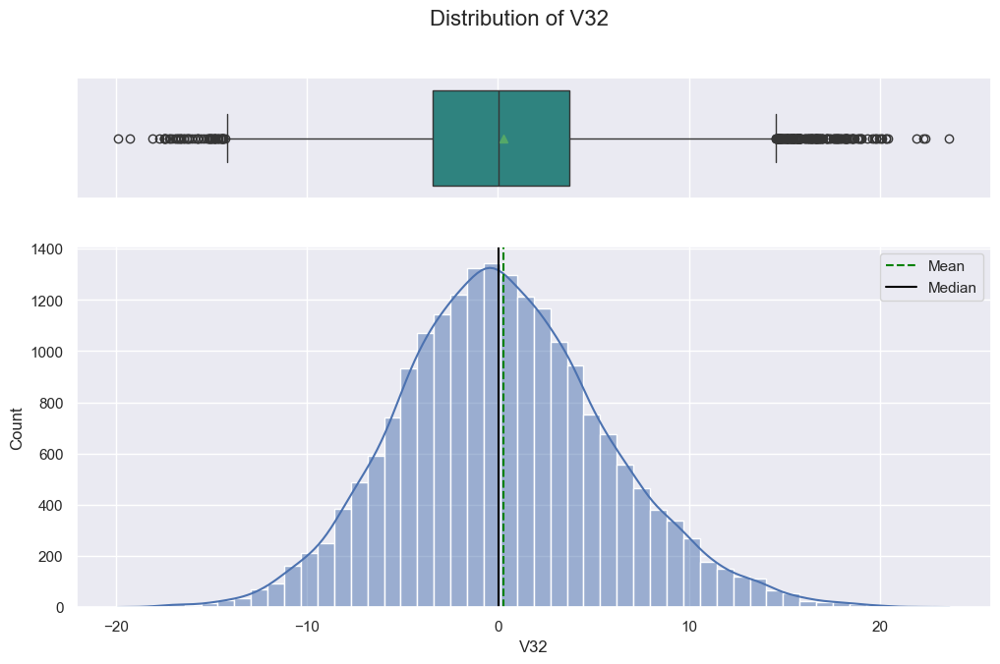

----------------------------------------------------------------------------------------------------
Distribution of 'V33'
count   20000.0000
mean        0.0498
std         3.5753
min       -16.8984
25%        -2.2429
50%        -0.0662
75%         2.2551
max        16.6925
Name: V33, dtype: float64


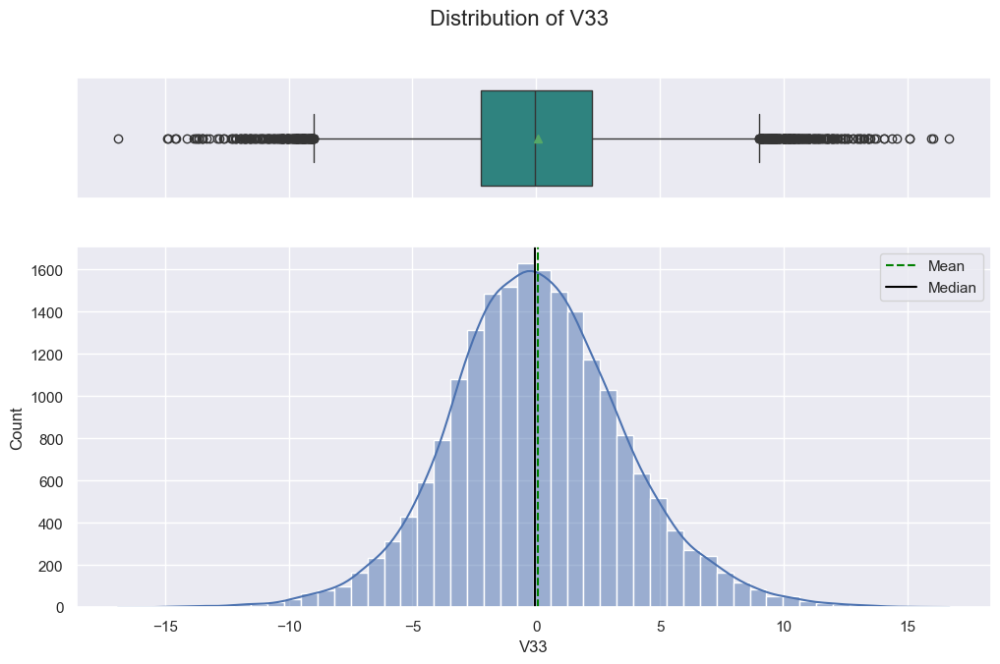

----------------------------------------------------------------------------------------------------
Distribution of 'V34'
count   20000.0000
mean       -0.4627
std         3.1838
min       -17.9851
25%        -2.1370
50%        -0.2550
75%         1.4369
max        14.3582
Name: V34, dtype: float64


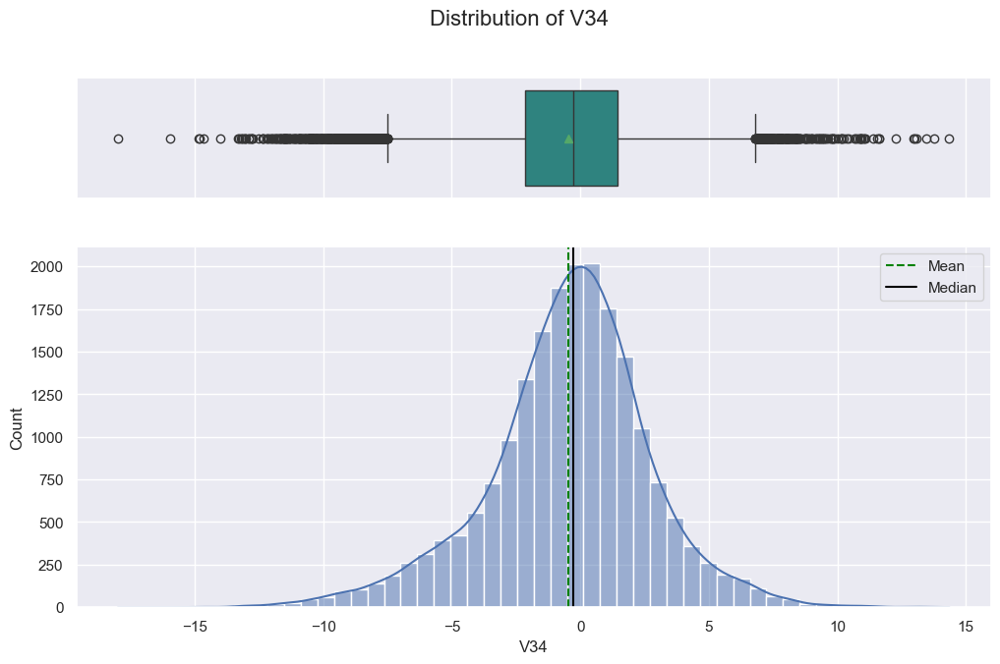

----------------------------------------------------------------------------------------------------
Distribution of 'V35'
count   20000.0000
mean        2.2296
std         2.9371
min       -15.3498
25%         0.3362
50%         2.0986
75%         4.0644
max        15.2911
Name: V35, dtype: float64


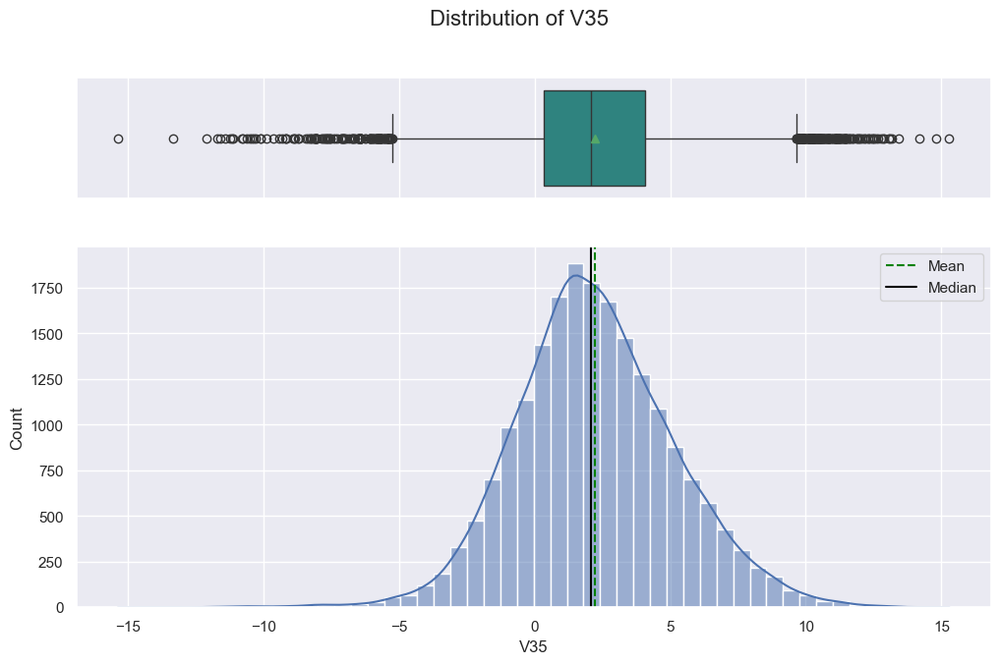

----------------------------------------------------------------------------------------------------
Distribution of 'V36'
count   20000.0000
mean        1.5148
std         3.8009
min       -14.8332
25%        -0.9438
50%         1.5665
75%         3.9839
max        19.3296
Name: V36, dtype: float64


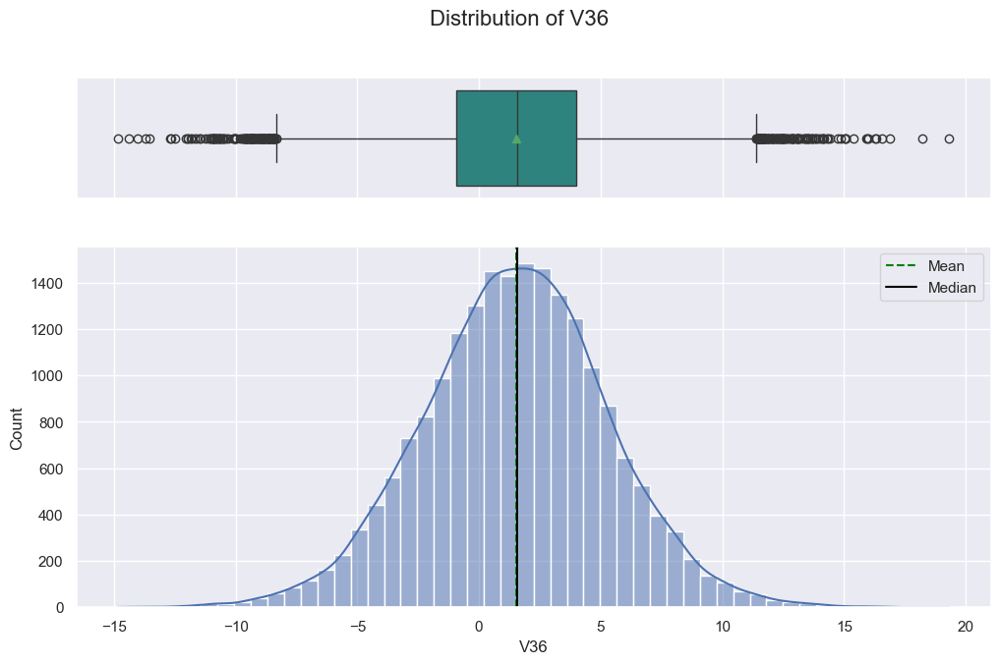

----------------------------------------------------------------------------------------------------
Distribution of 'V37'
count   20000.0000
mean        0.0113
std         1.7882
min        -5.4784
25%        -1.2558
50%        -0.1284
75%         1.1755
max         7.4670
Name: V37, dtype: float64


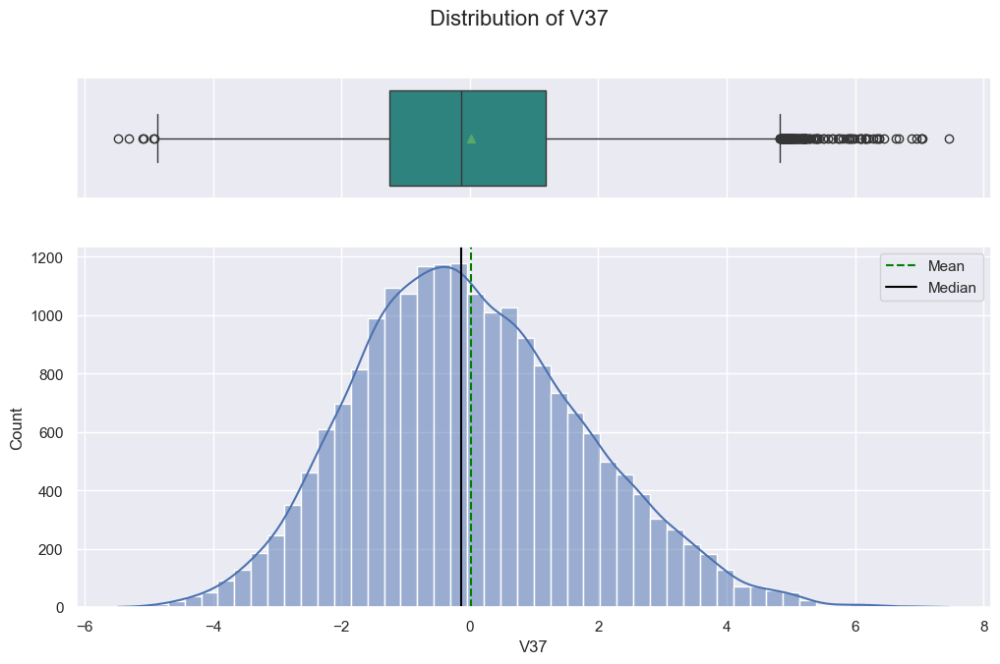

----------------------------------------------------------------------------------------------------
Distribution of 'V38'
count   20000.0000
mean       -0.3440
std         3.9481
min       -17.3750
25%        -2.9876
50%        -0.3168
75%         2.2794
max        15.2899
Name: V38, dtype: float64


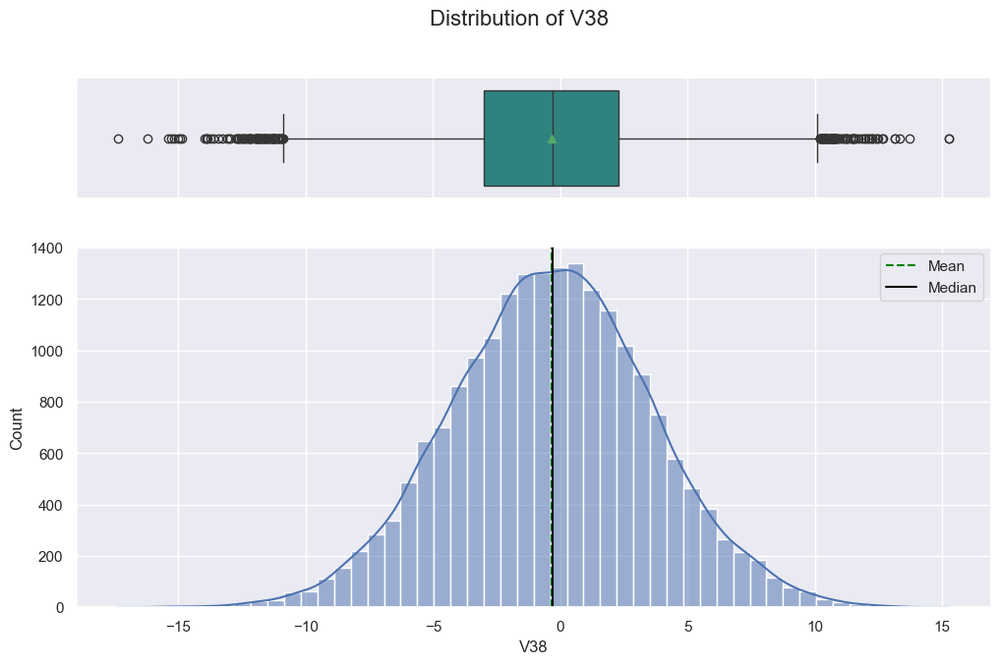

----------------------------------------------------------------------------------------------------
Distribution of 'V39'
count   20000.0000
mean        0.8907
std         1.7531
min        -6.4389
25%        -0.2723
50%         0.9193
75%         2.0575
max         7.7599
Name: V39, dtype: float64


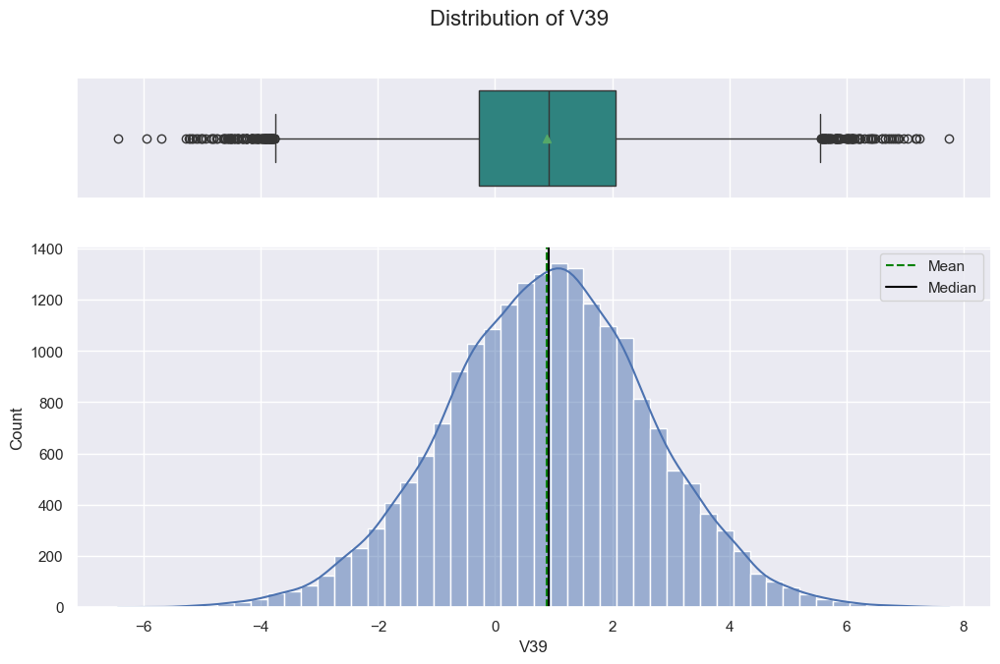

----------------------------------------------------------------------------------------------------
Distribution of 'V40'
count   20000.0000
mean       -0.8756
std         3.0122
min       -11.0239
25%        -2.9402
50%        -0.9208
75%         1.1199
max        10.6543
Name: V40, dtype: float64


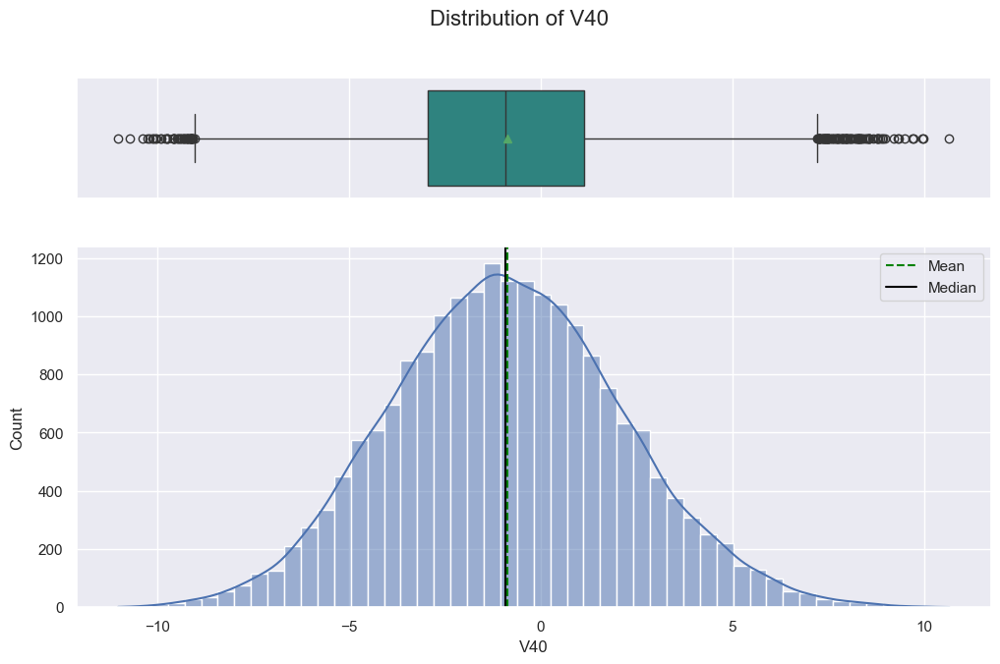

----------------------------------------------------------------------------------------------------
Distribution of 'Target'
count   20000.0000
mean        0.0555
std         0.2290
min         0.0000
25%         0.0000
50%         0.0000
75%         0.0000
max         1.0000
Name: Target, dtype: float64


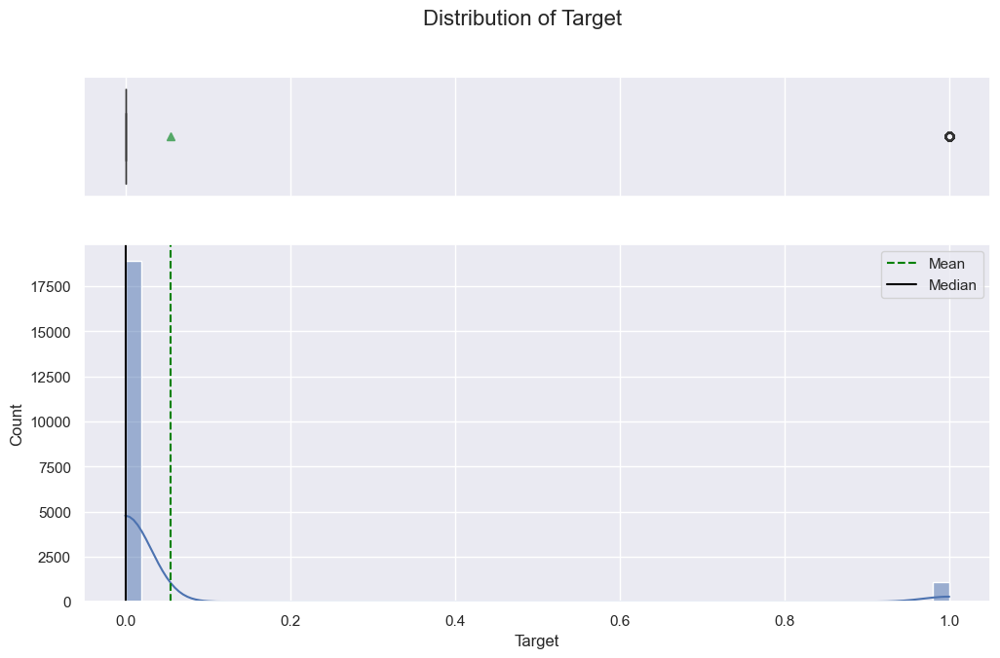

----------------------------------------------------------------------------------------------------


In [142]:
# Selecting all numerical columns ('int64', 'float64')
num_cols = df_eda.select_dtypes(include=["int64", "float64"]).columns

# Iterate through each numerical column and plot the histogram and boxplot combined
for column in num_cols:
    print(f"Distribution of '{column}'")
    print(df_eda[column].describe())
    histogram_boxplot(df_eda, column, bins=50, kde=True)
    print("-" * 100)


## <a id='toc3_2_'></a>[Multivariate analysis](#toc0_)


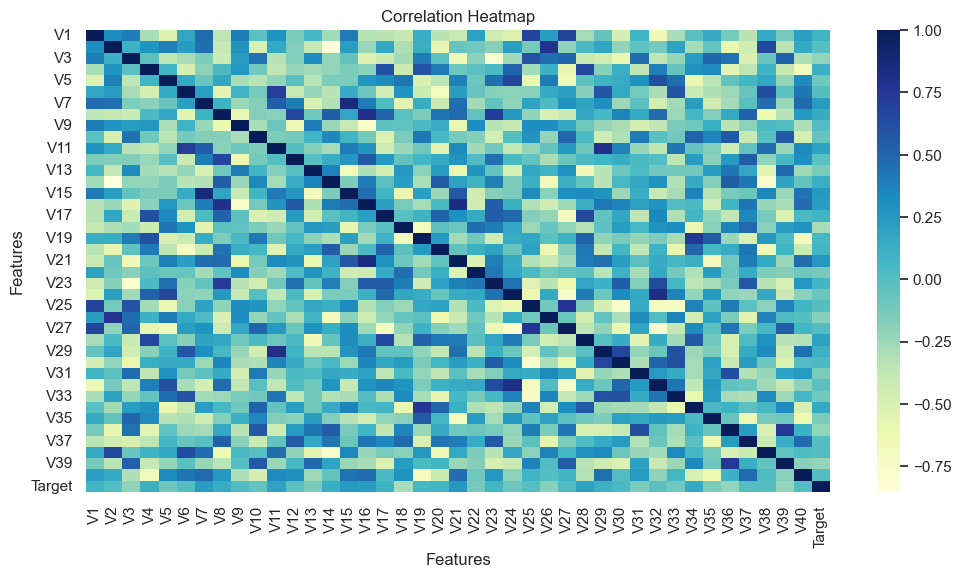

In [143]:
# Calculate the correlation matrix
corr_matrix = df_eda[num_cols].corr()

# Visual representation of the correlation matrix
plt.figure(figsize=(12, 6))
sns.heatmap(corr_matrix, annot=False, cmap="YlGnBu")
plt.title("Correlation Heatmap")
plt.xlabel("Features")
plt.ylabel("Features")
plt.show()


In [144]:
# Function to create distribution plot for each predictor w.r.t target
def distribution_plot_wrt_target(data, target):

    # Get the list of numeric predictor columns
    predictors = data.select_dtypes(include=["float64", "int64"]).columns.drop(target)

    for predictor in predictors:
        print(f"Distribution of '{predictor}' with respect to the target '{target}'")

        fig, axs = plt.subplots(2, 2, figsize=(12, 10))

        target_uniq = data[target].unique()

        axs[0, 0].set_title(
            f"Distribution of {predictor} for target={str(target_uniq[0])}"
        )
        sns.histplot(
            data=data[data[target] == target_uniq[0]],
            x=predictor,
            kde=True,
            ax=axs[0, 0],
            color="teal",
            stat="density",
        )

        axs[0, 1].set_title(
            f"Distribution of {predictor} for target={str(target_uniq[1])}"
        )
        sns.histplot(
            data=data[data[target] == target_uniq[1]],
            x=predictor,
            kde=True,
            ax=axs[0, 1],
            color="orange",
            stat="density",
        )

        axs[1, 0].set_title(f"Boxplot of {predictor} w.r.t {target}")
        sns.boxplot(
            data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow"
        )

        axs[1, 1].set_title(f"Boxplot of {predictor} w.r.t {target} (without outliers)")
        sns.boxplot(
            data=data,
            x=target,
            y=predictor,
            ax=axs[1, 1],
            showfliers=False,
            palette="gist_rainbow",
        )

        plt.tight_layout()
        plt.show()
        print("-" * 100)


Distribution of 'V1' with respect to the target 'Target'


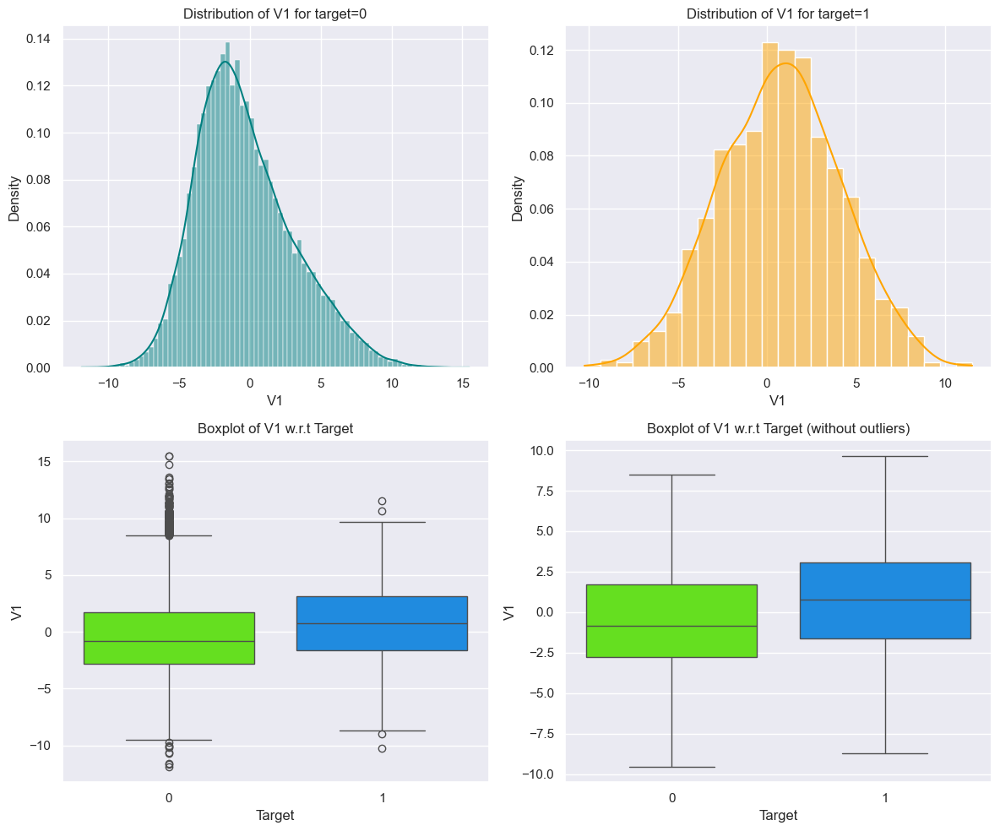

----------------------------------------------------------------------------------------------------
Distribution of 'V2' with respect to the target 'Target'


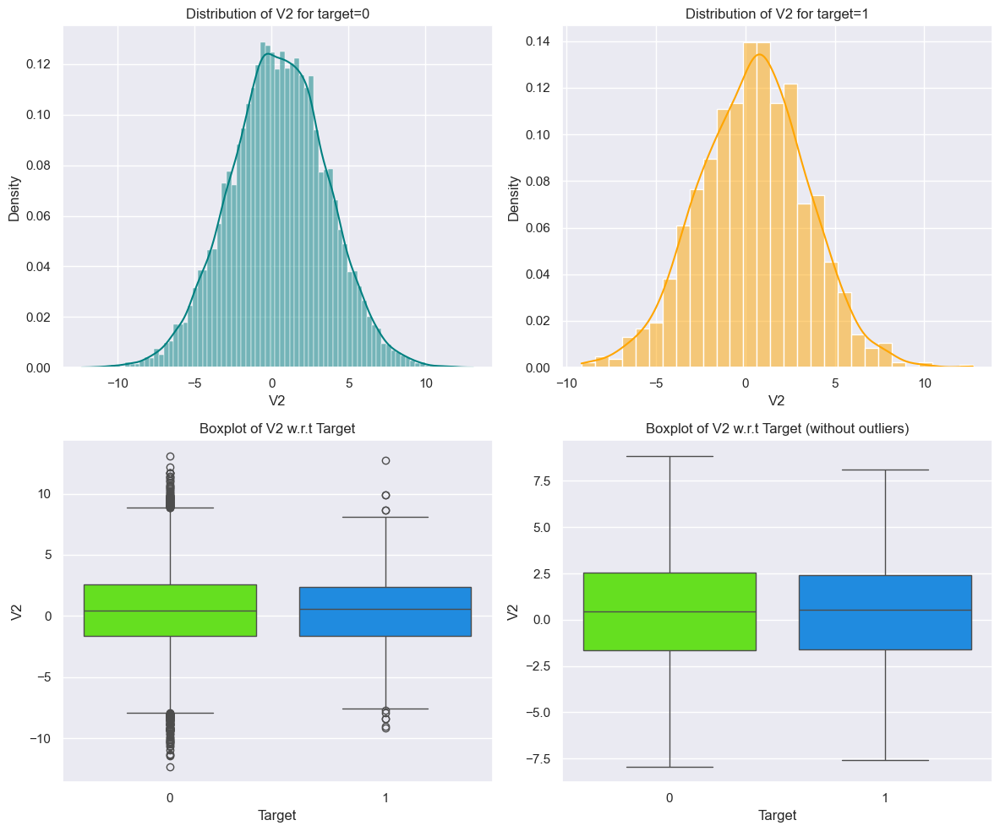

----------------------------------------------------------------------------------------------------
Distribution of 'V3' with respect to the target 'Target'


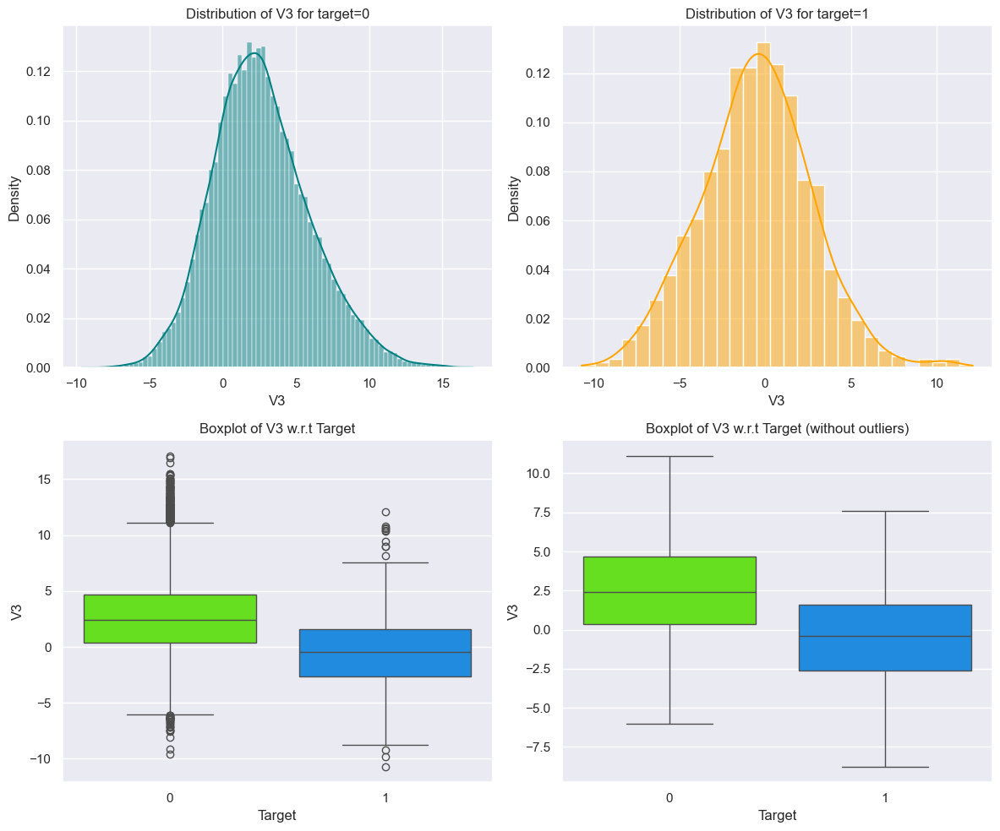

----------------------------------------------------------------------------------------------------
Distribution of 'V4' with respect to the target 'Target'


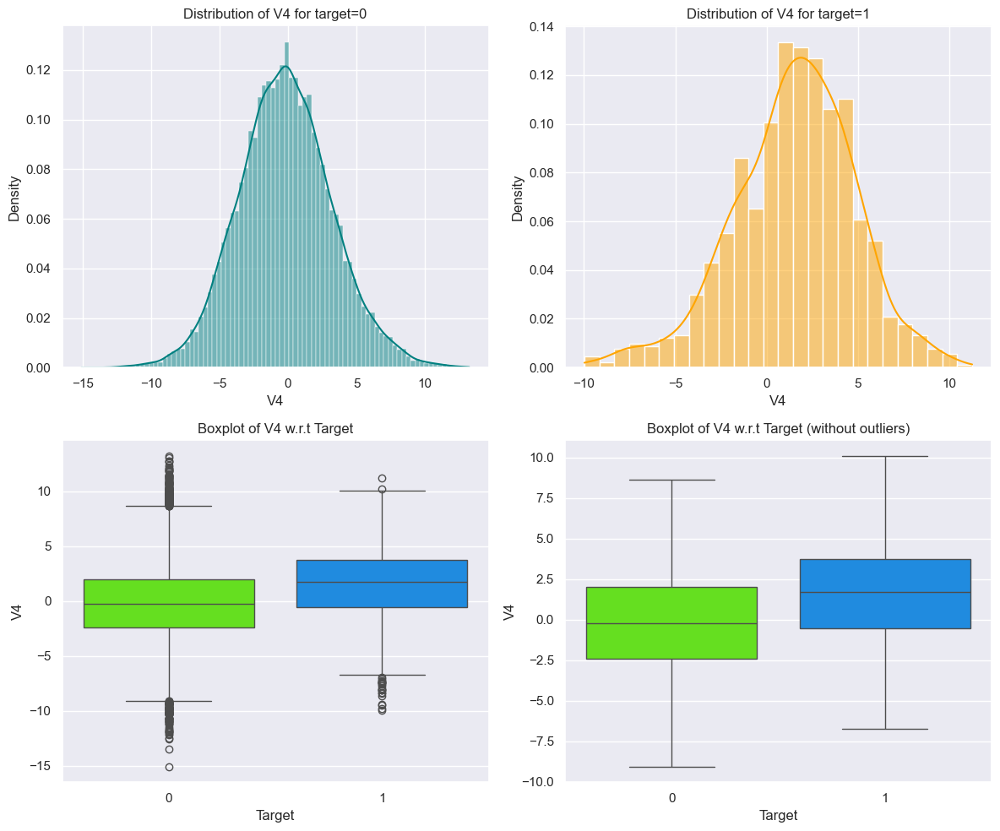

----------------------------------------------------------------------------------------------------
Distribution of 'V5' with respect to the target 'Target'


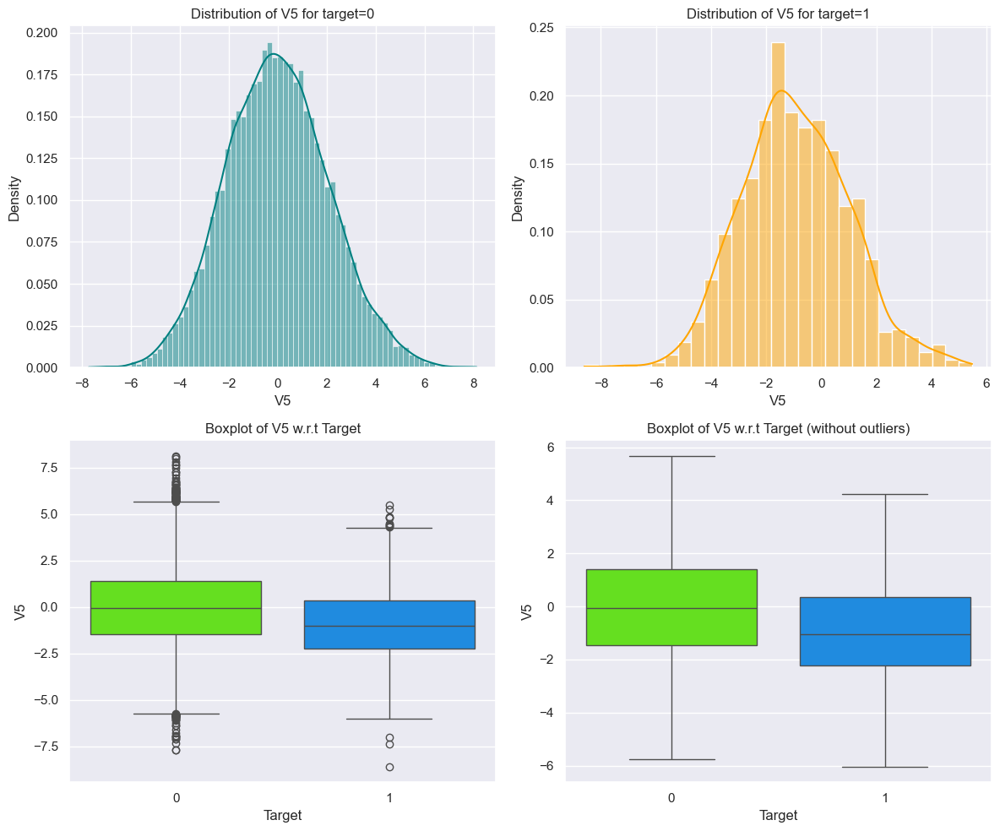

----------------------------------------------------------------------------------------------------
Distribution of 'V6' with respect to the target 'Target'


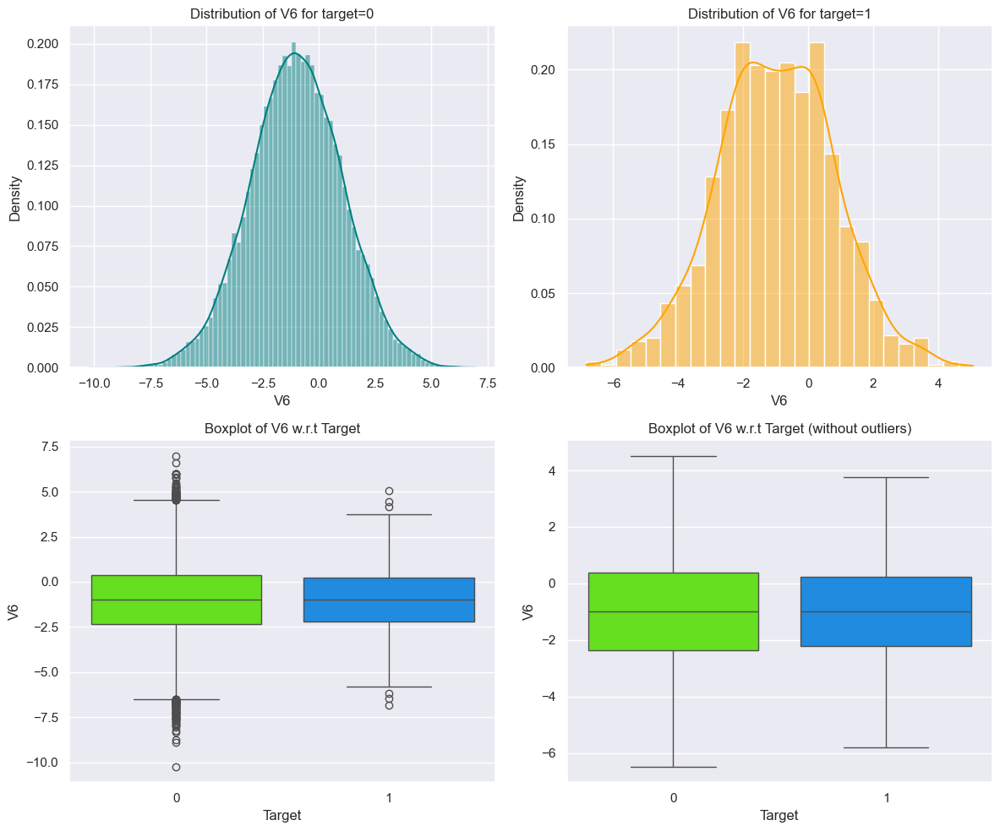

----------------------------------------------------------------------------------------------------
Distribution of 'V7' with respect to the target 'Target'


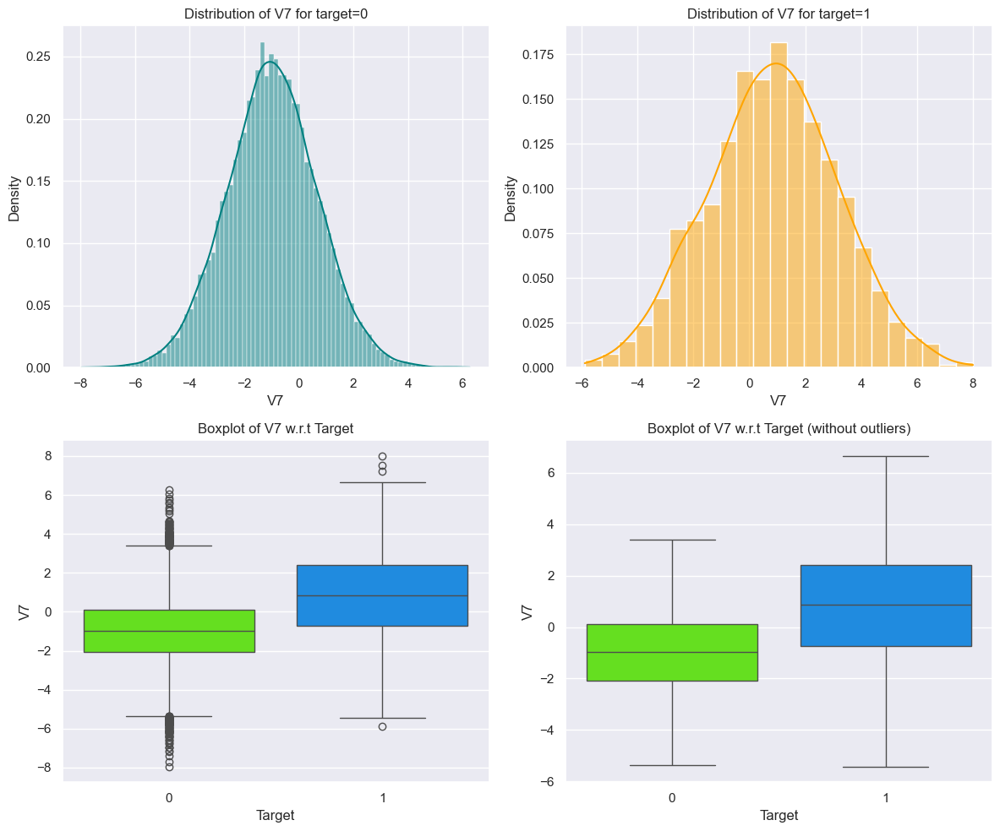

----------------------------------------------------------------------------------------------------
Distribution of 'V8' with respect to the target 'Target'


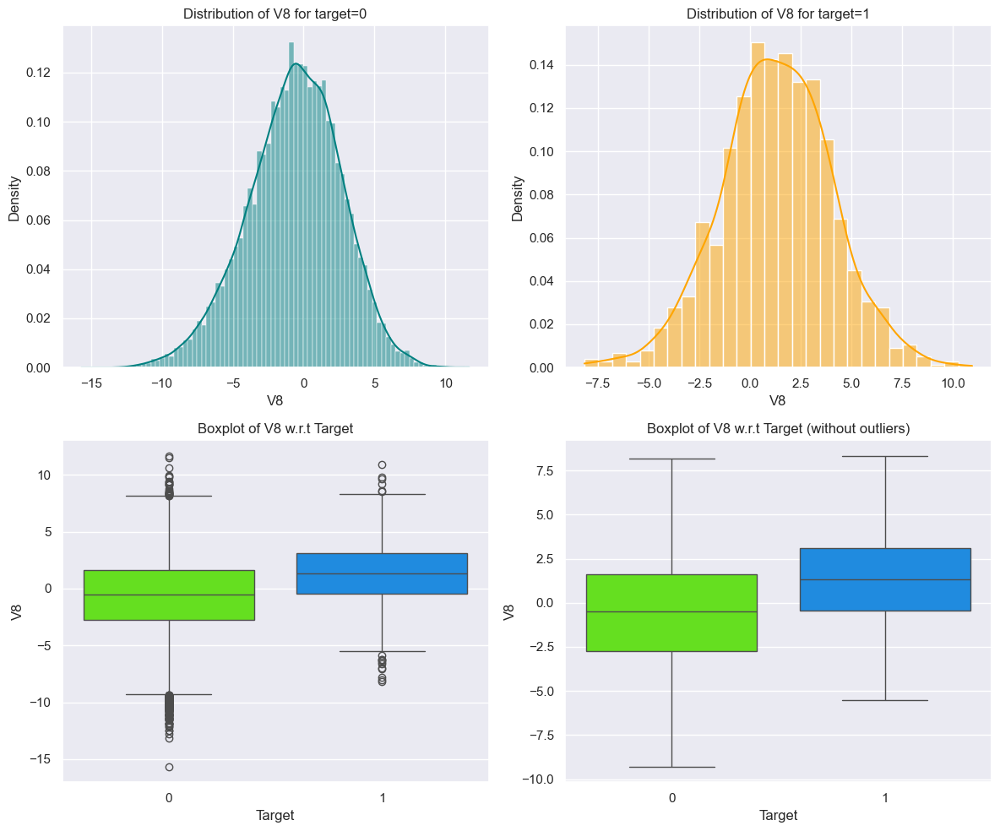

----------------------------------------------------------------------------------------------------
Distribution of 'V9' with respect to the target 'Target'


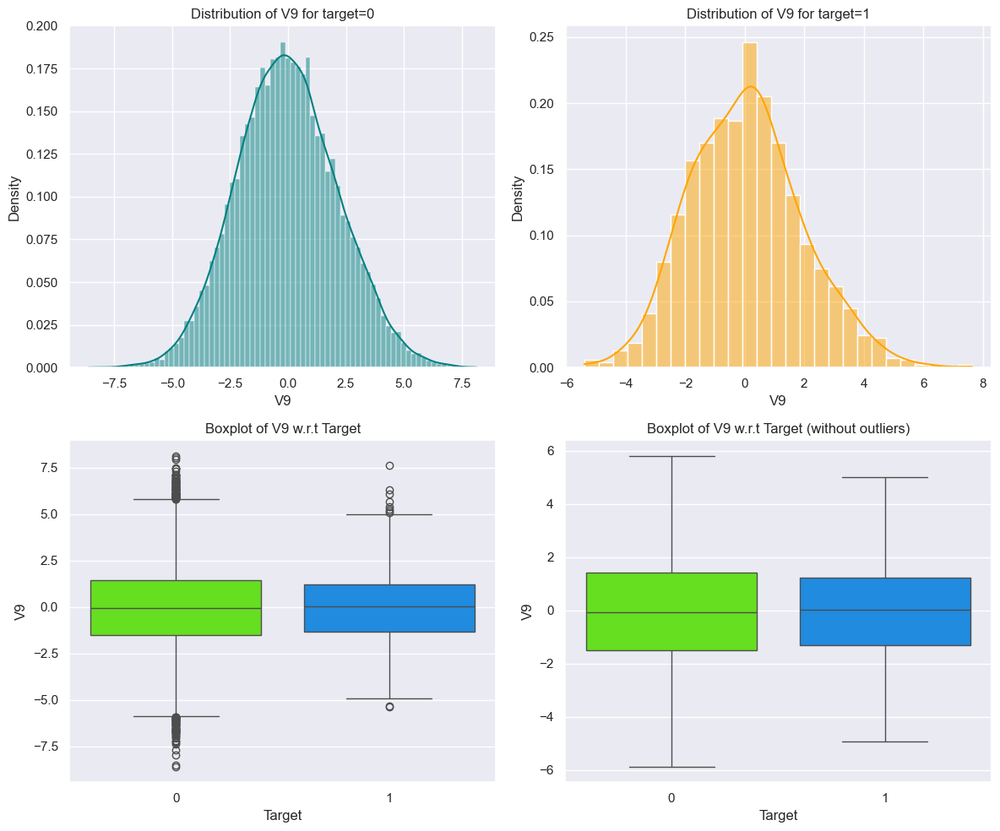

----------------------------------------------------------------------------------------------------
Distribution of 'V10' with respect to the target 'Target'


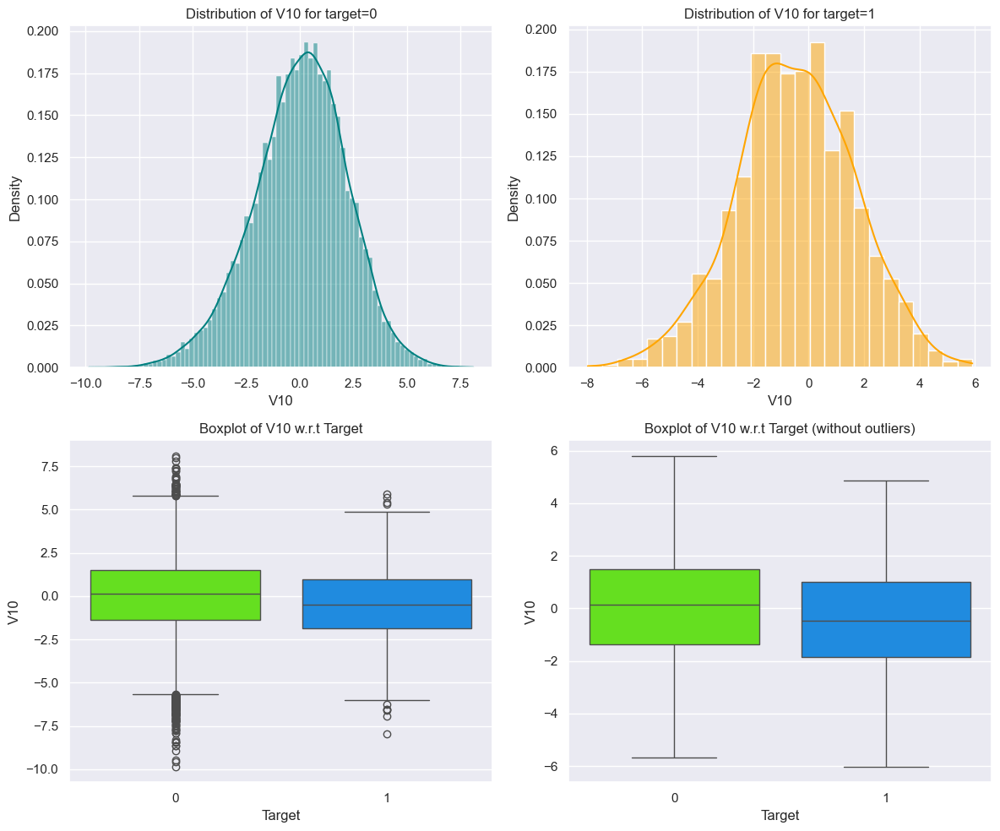

----------------------------------------------------------------------------------------------------
Distribution of 'V11' with respect to the target 'Target'


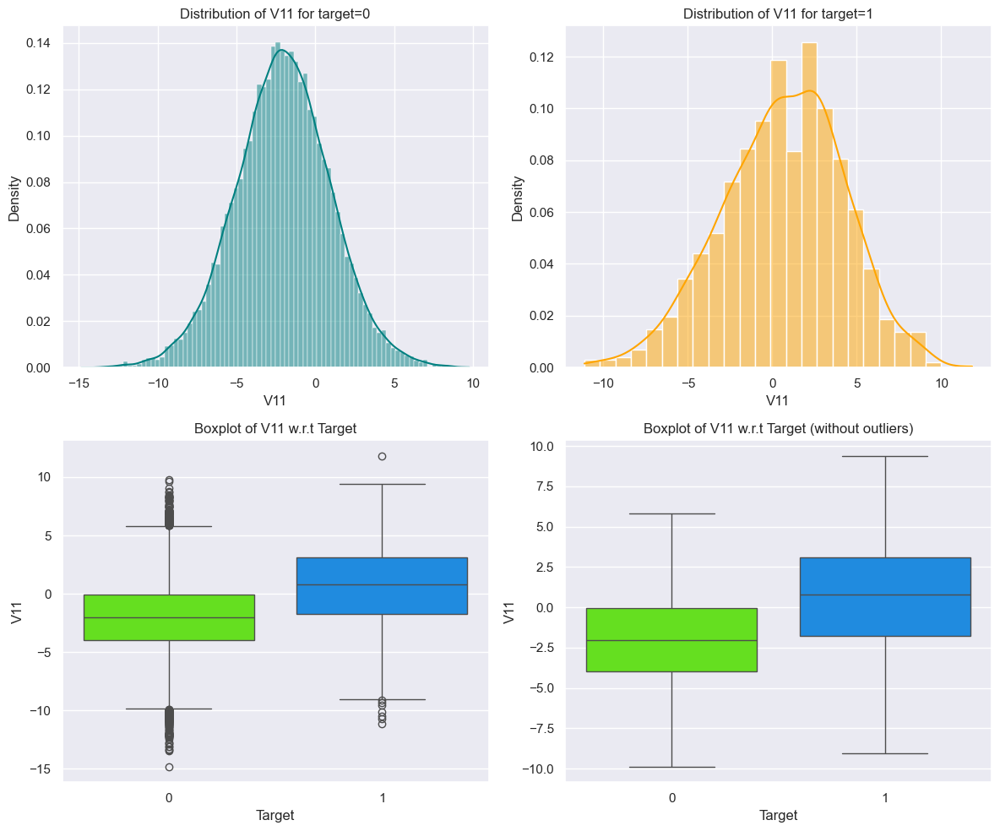

----------------------------------------------------------------------------------------------------
Distribution of 'V12' with respect to the target 'Target'


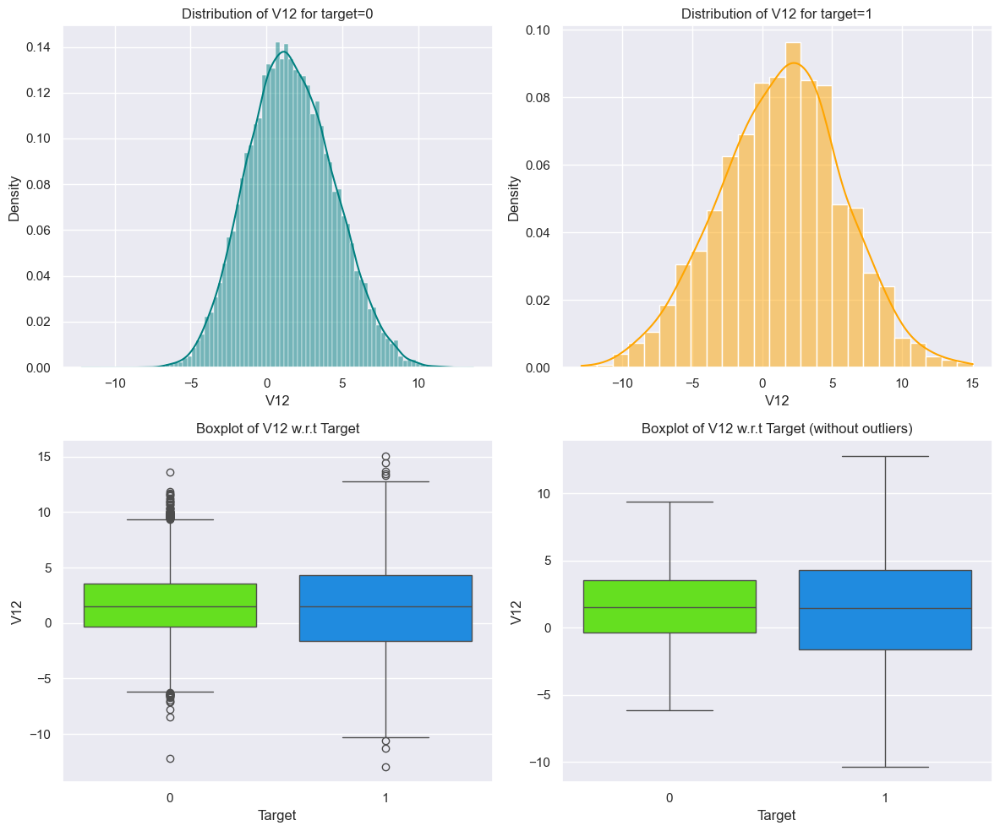

----------------------------------------------------------------------------------------------------
Distribution of 'V13' with respect to the target 'Target'


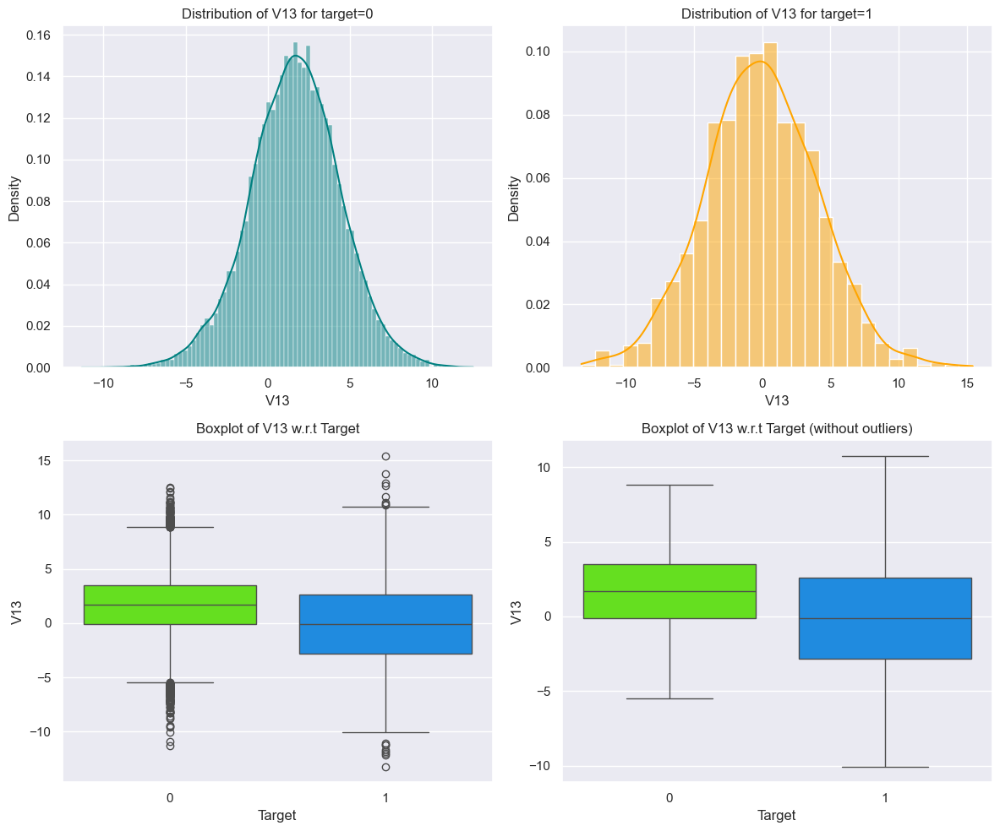

----------------------------------------------------------------------------------------------------
Distribution of 'V14' with respect to the target 'Target'


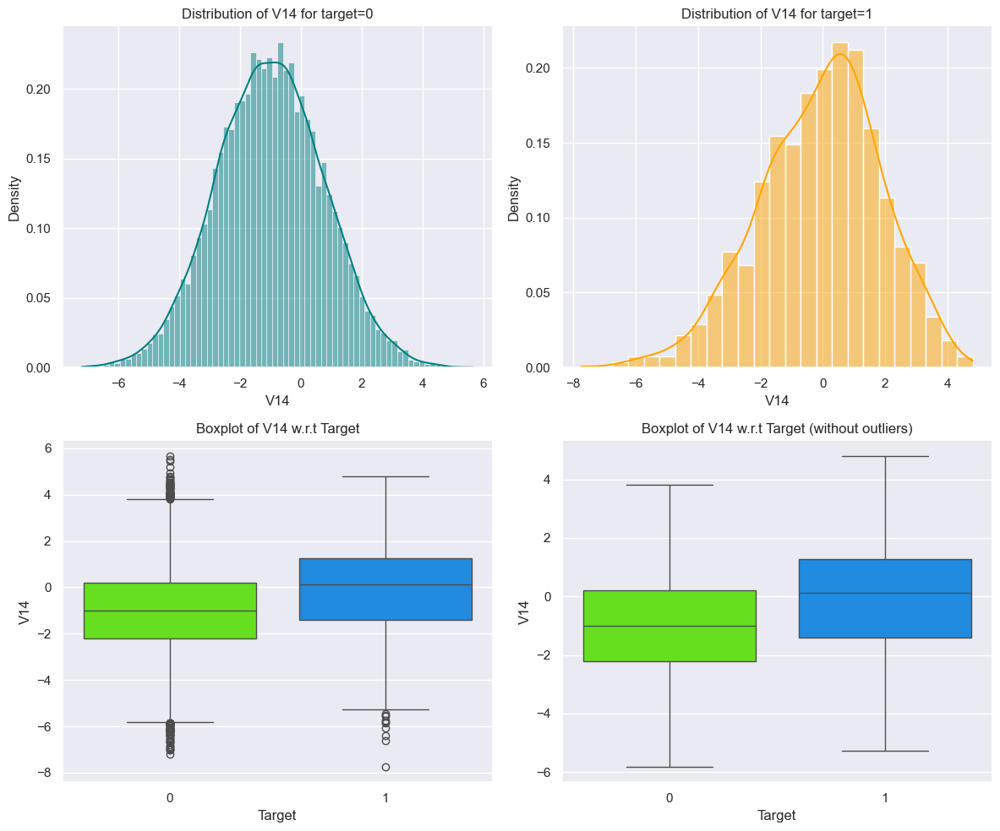

----------------------------------------------------------------------------------------------------
Distribution of 'V15' with respect to the target 'Target'


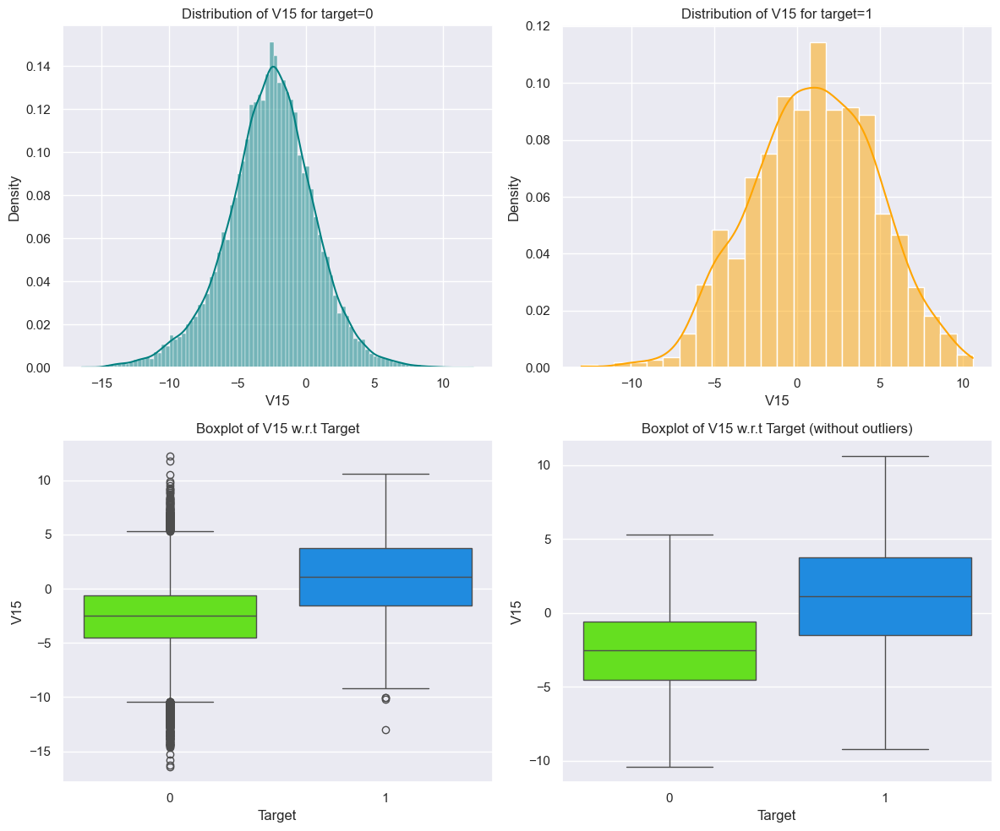

----------------------------------------------------------------------------------------------------
Distribution of 'V16' with respect to the target 'Target'


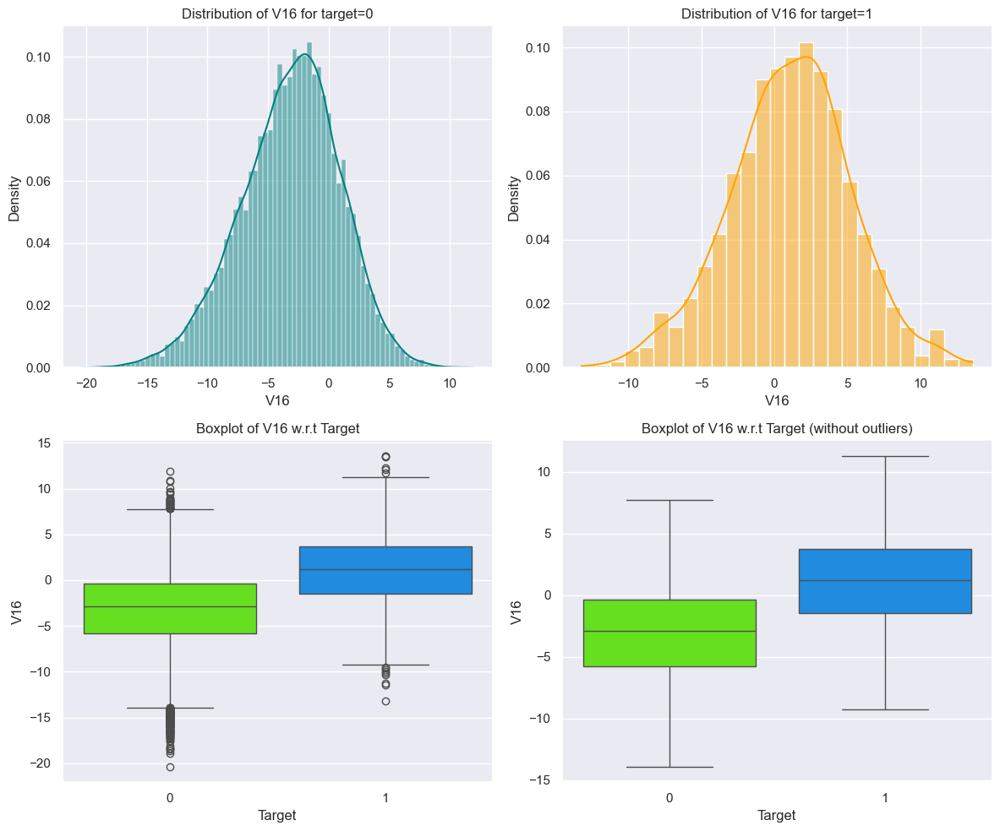

----------------------------------------------------------------------------------------------------
Distribution of 'V17' with respect to the target 'Target'


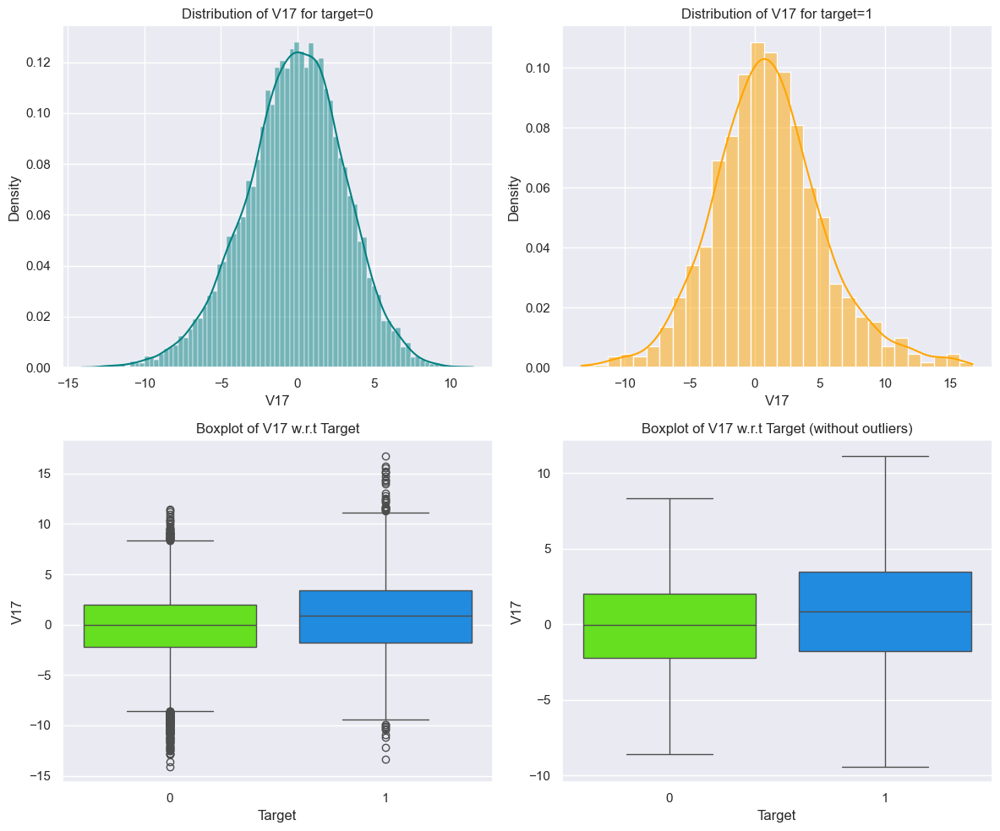

----------------------------------------------------------------------------------------------------
Distribution of 'V18' with respect to the target 'Target'


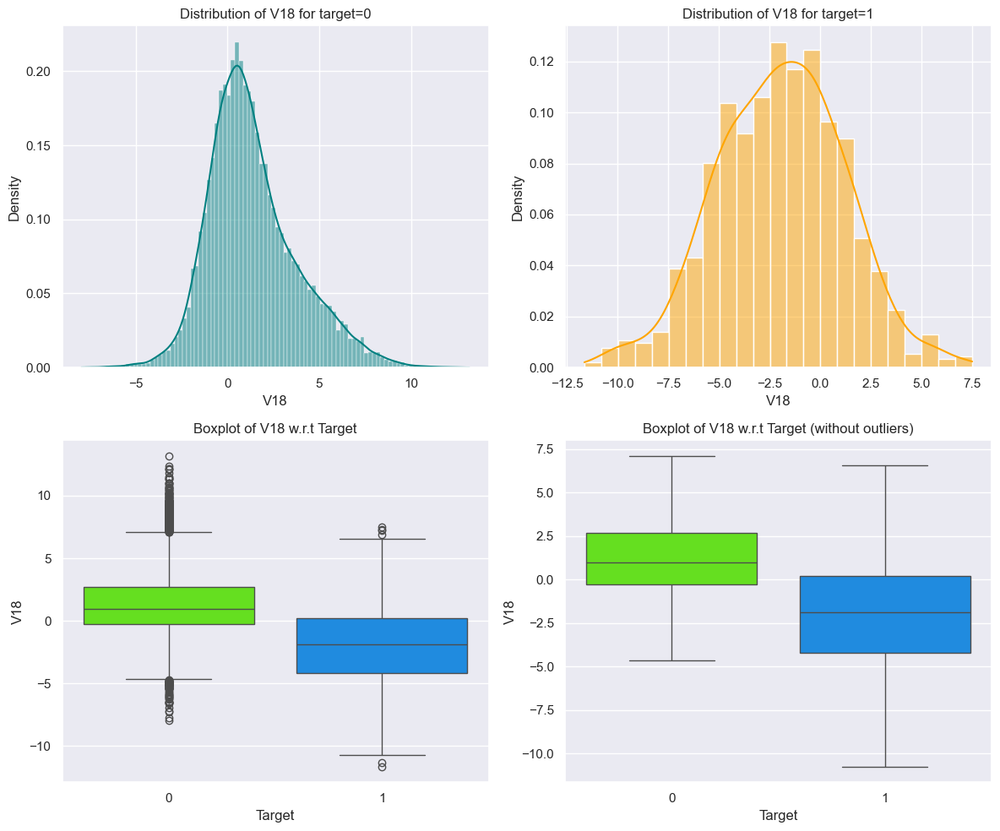

----------------------------------------------------------------------------------------------------
Distribution of 'V19' with respect to the target 'Target'


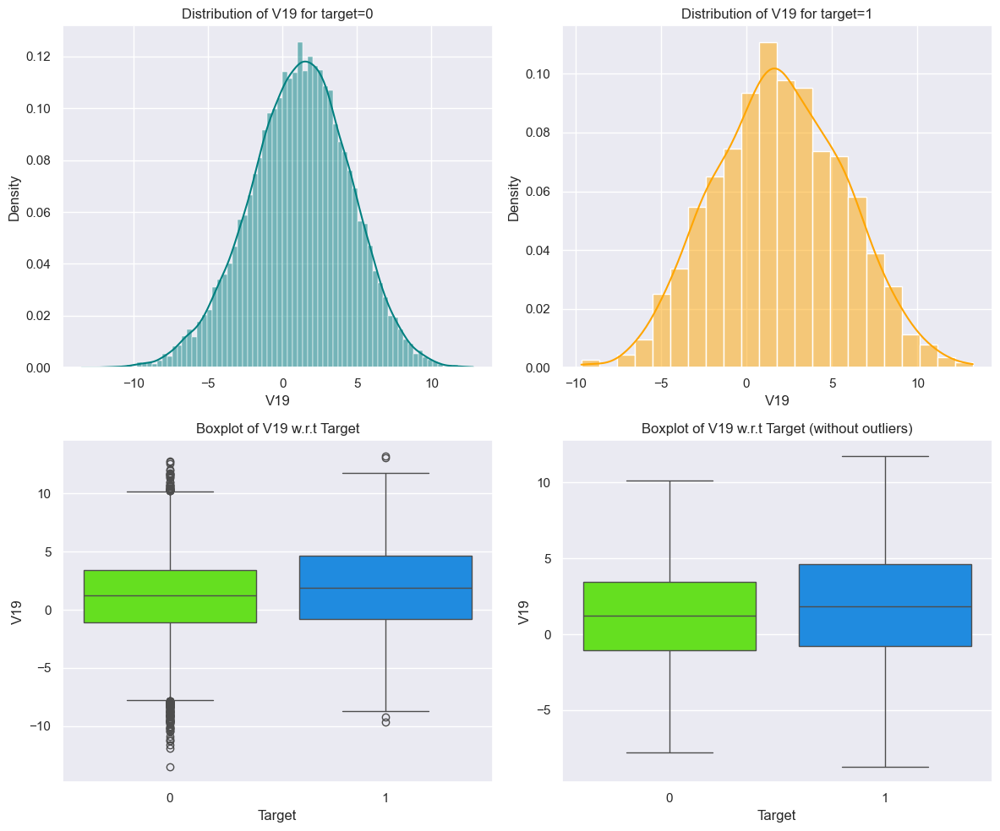

----------------------------------------------------------------------------------------------------
Distribution of 'V20' with respect to the target 'Target'


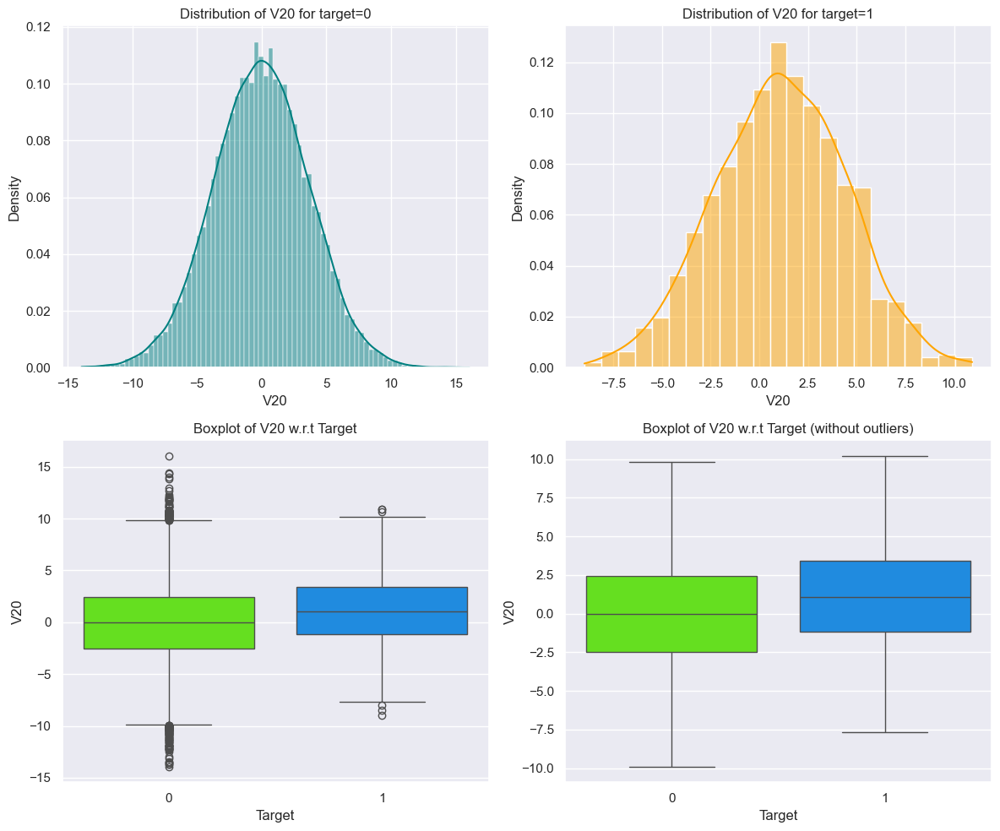

----------------------------------------------------------------------------------------------------
Distribution of 'V21' with respect to the target 'Target'


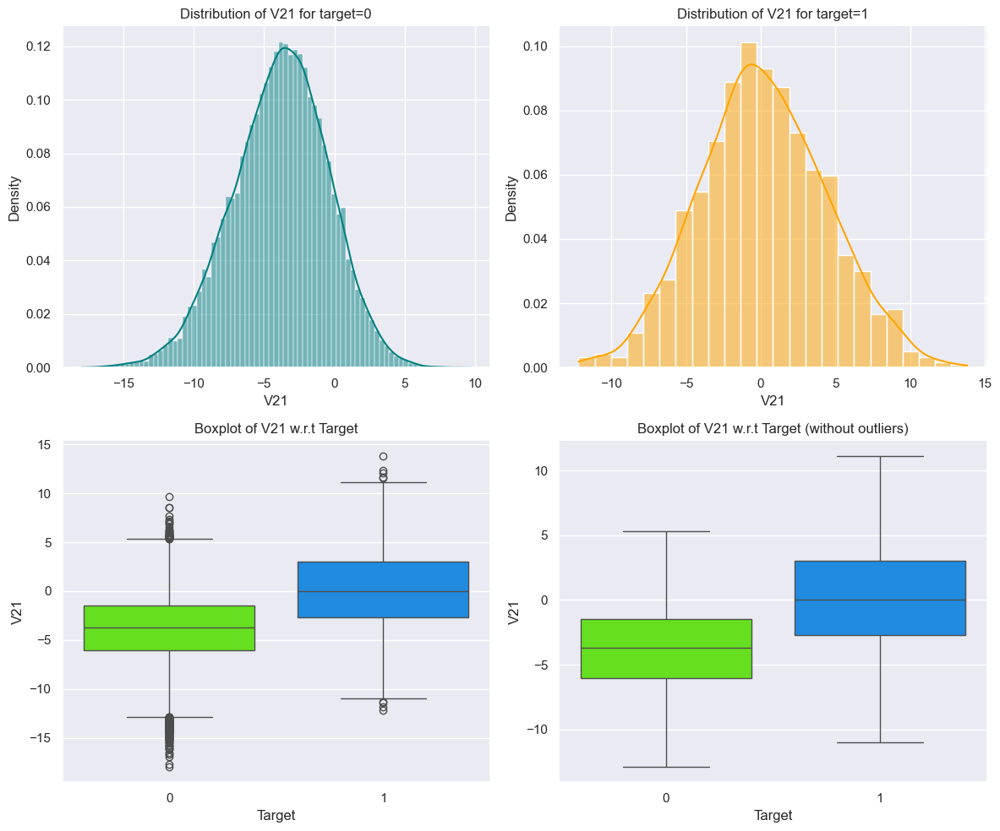

----------------------------------------------------------------------------------------------------
Distribution of 'V22' with respect to the target 'Target'


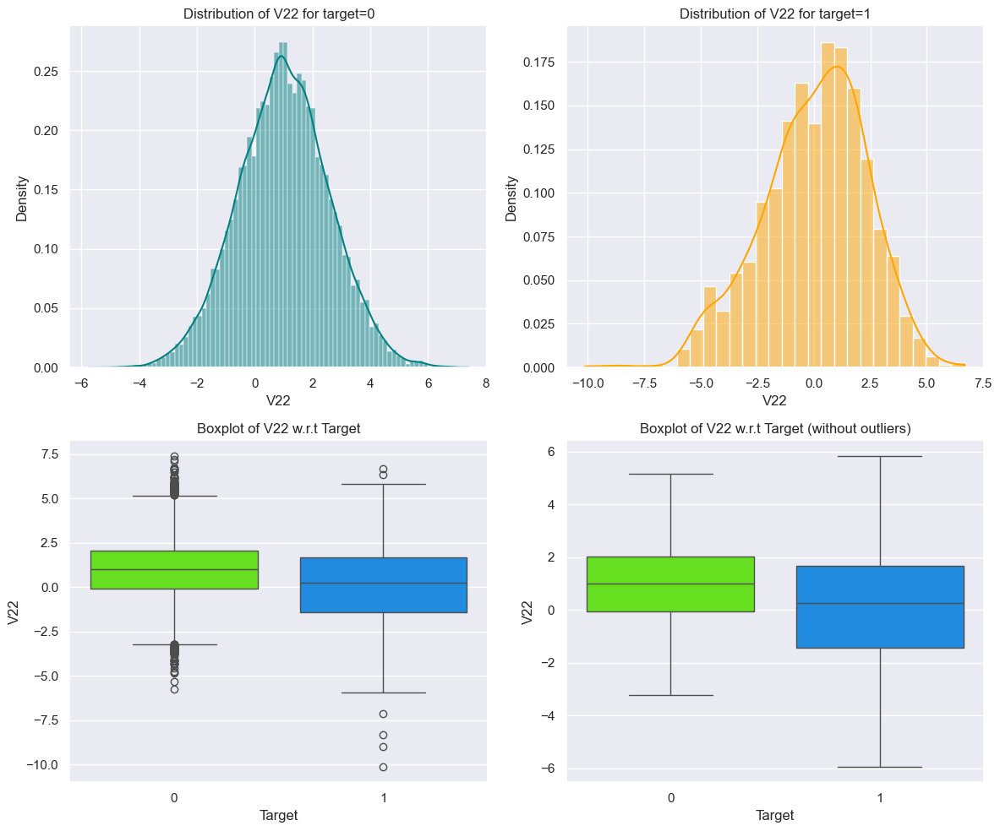

----------------------------------------------------------------------------------------------------
Distribution of 'V23' with respect to the target 'Target'


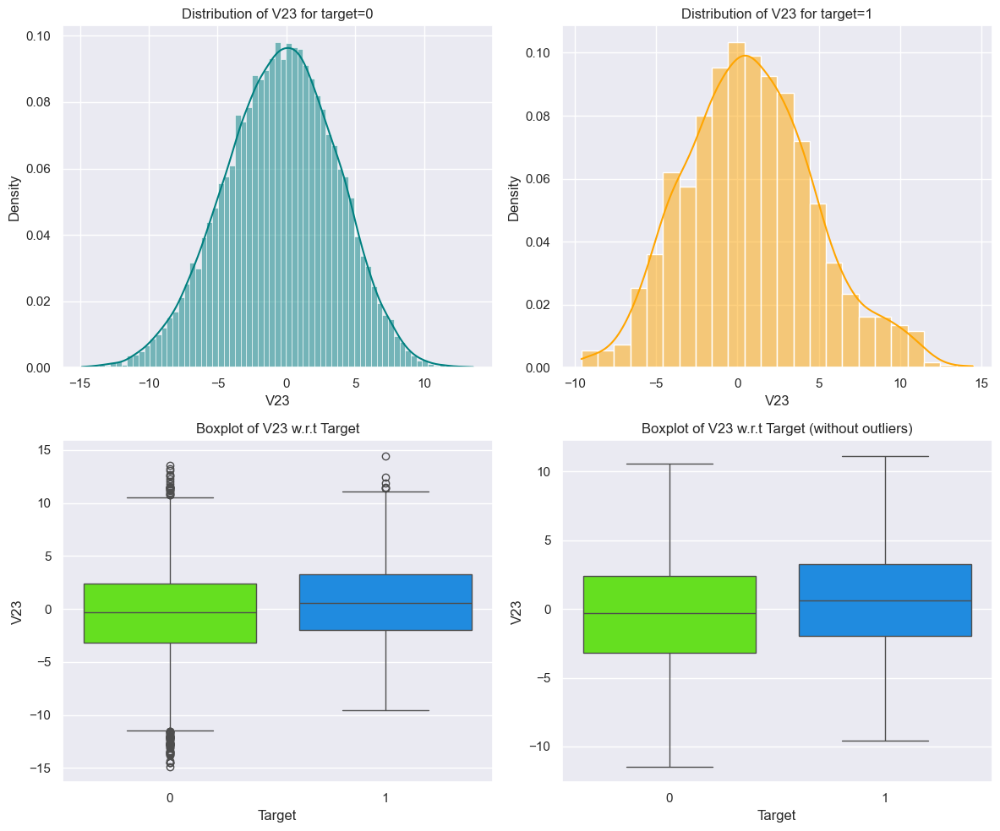

----------------------------------------------------------------------------------------------------
Distribution of 'V24' with respect to the target 'Target'


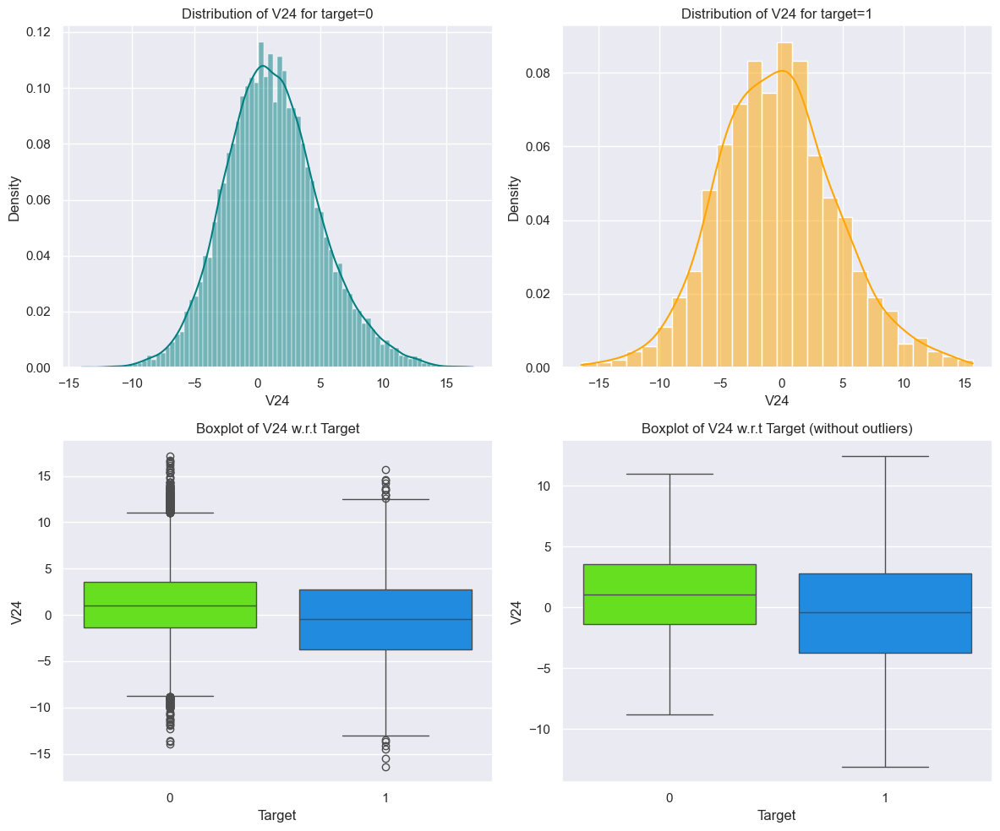

----------------------------------------------------------------------------------------------------
Distribution of 'V25' with respect to the target 'Target'


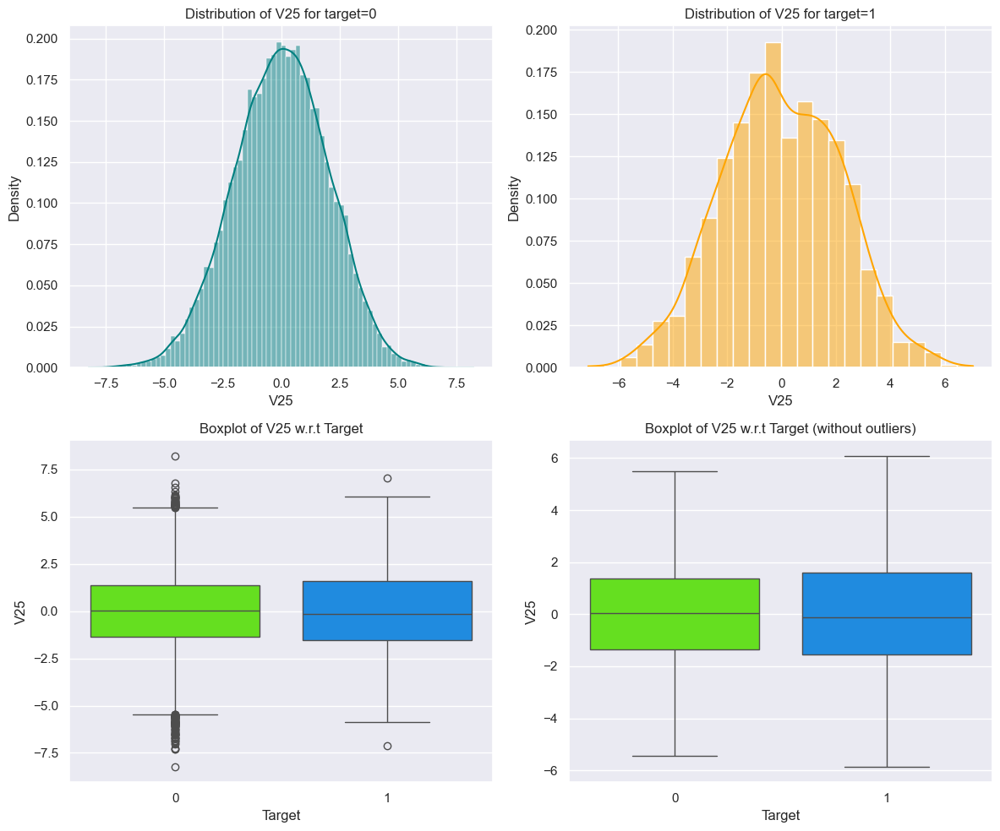

----------------------------------------------------------------------------------------------------
Distribution of 'V26' with respect to the target 'Target'


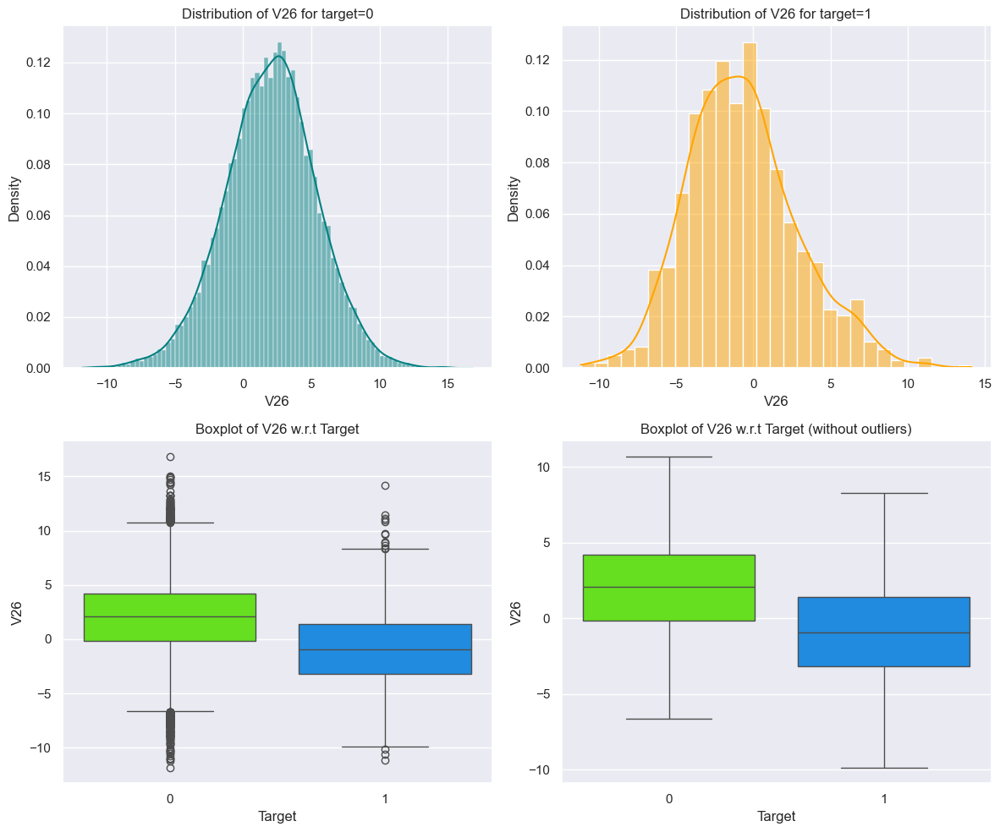

----------------------------------------------------------------------------------------------------
Distribution of 'V27' with respect to the target 'Target'


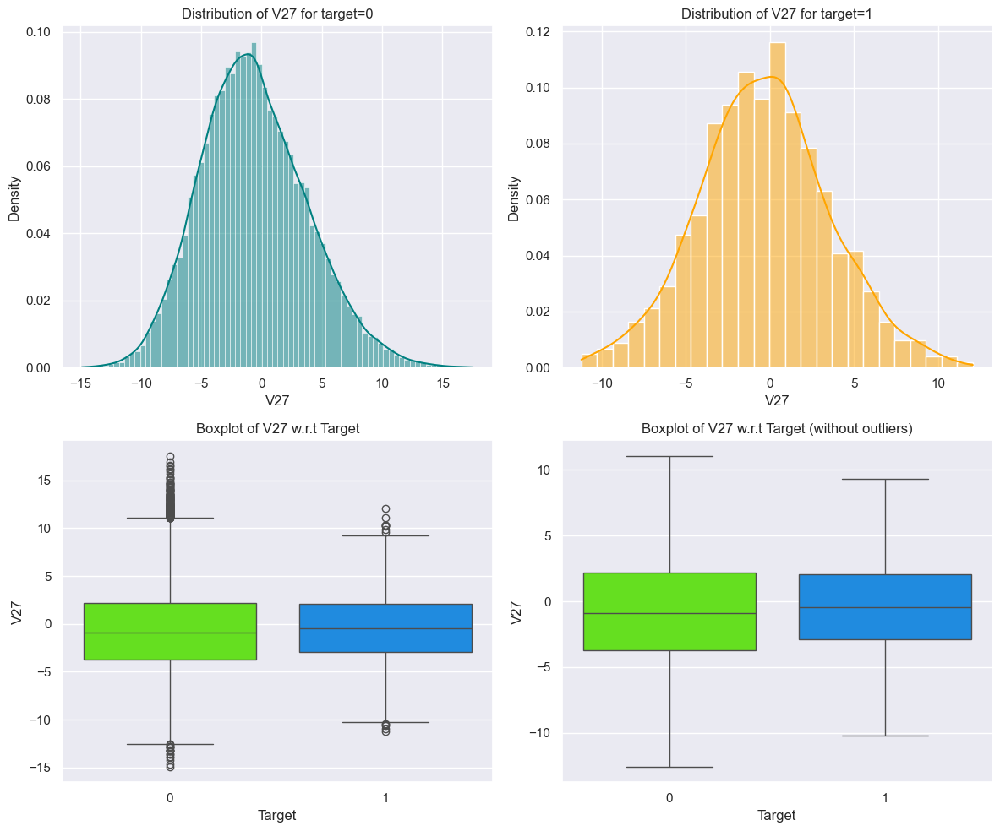

----------------------------------------------------------------------------------------------------
Distribution of 'V28' with respect to the target 'Target'


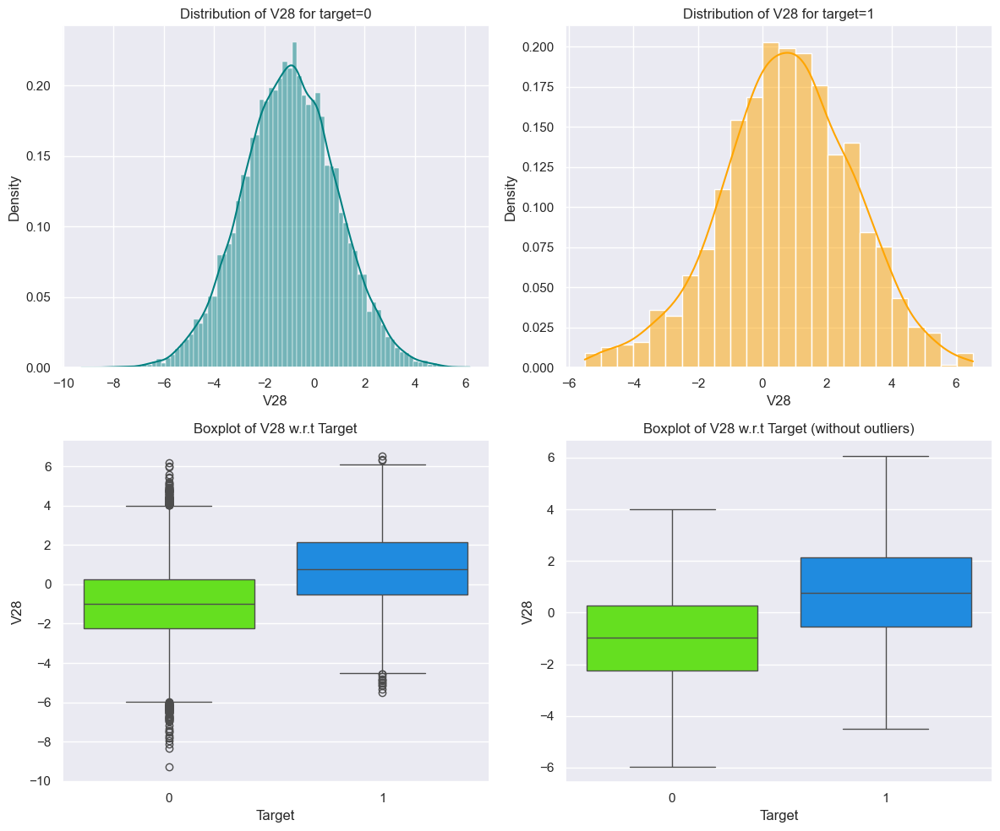

----------------------------------------------------------------------------------------------------
Distribution of 'V29' with respect to the target 'Target'


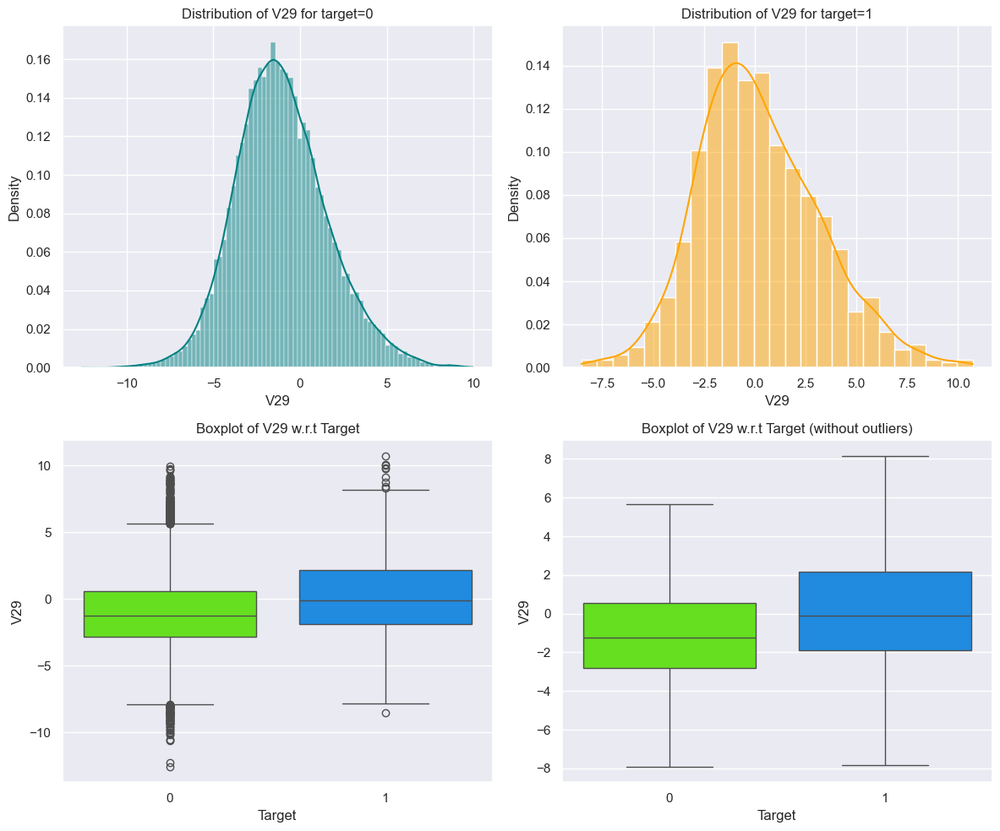

----------------------------------------------------------------------------------------------------
Distribution of 'V30' with respect to the target 'Target'


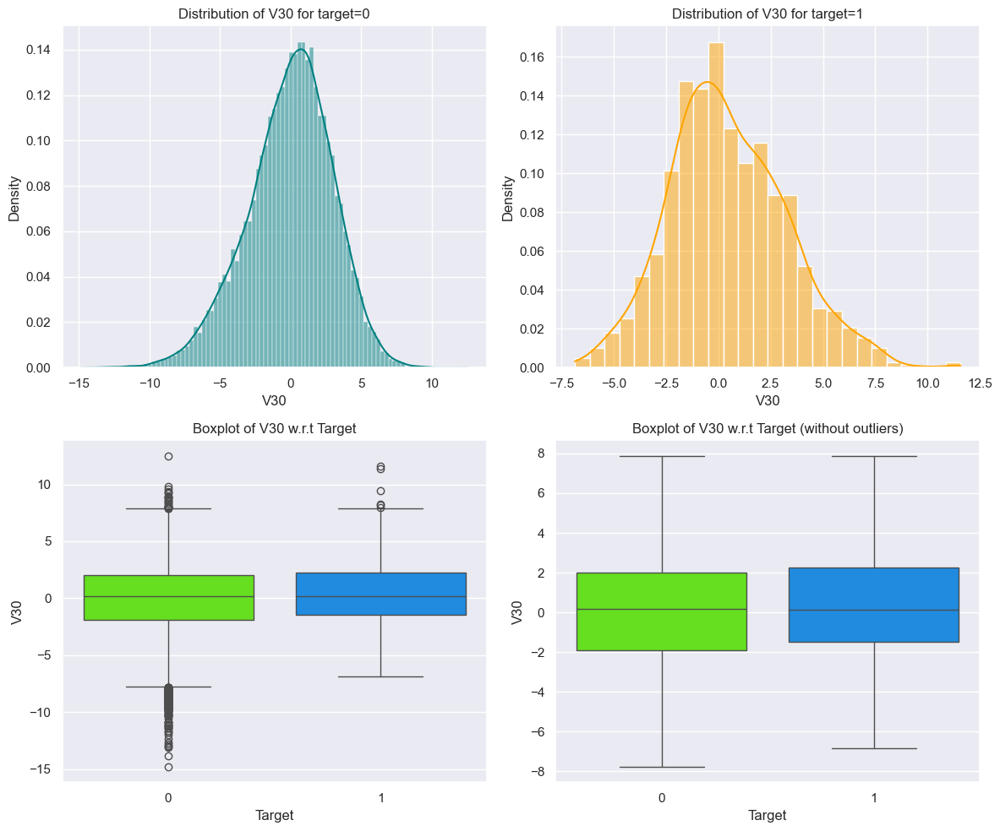

----------------------------------------------------------------------------------------------------
Distribution of 'V31' with respect to the target 'Target'


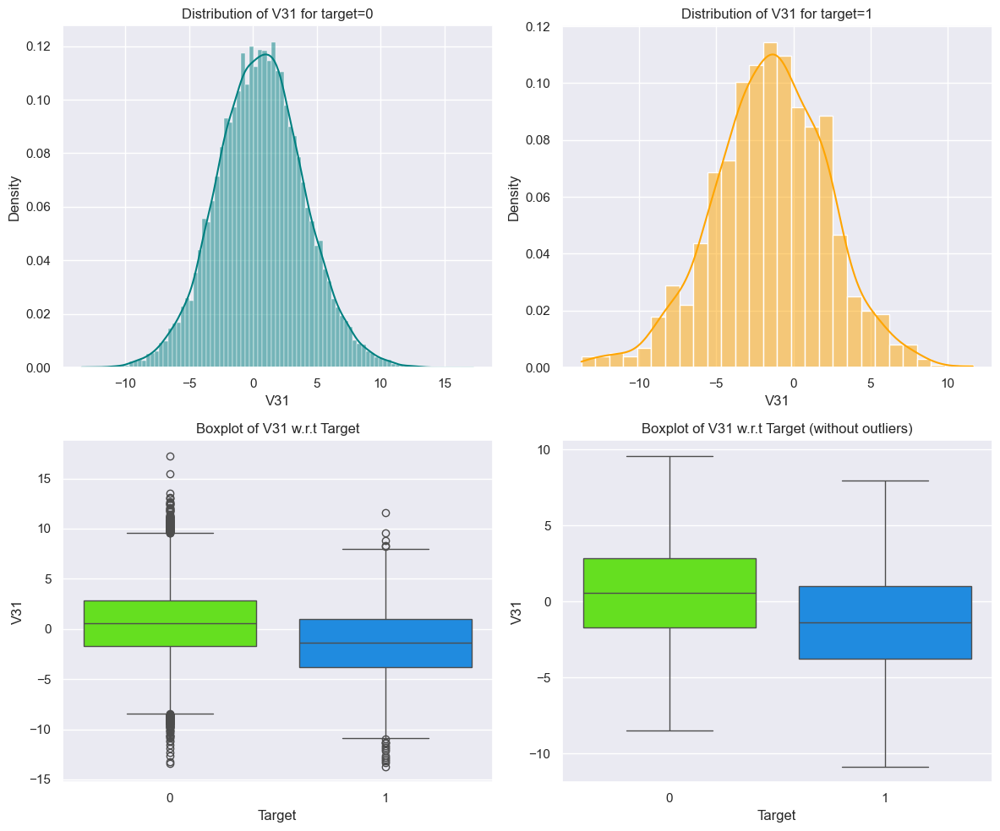

----------------------------------------------------------------------------------------------------
Distribution of 'V32' with respect to the target 'Target'


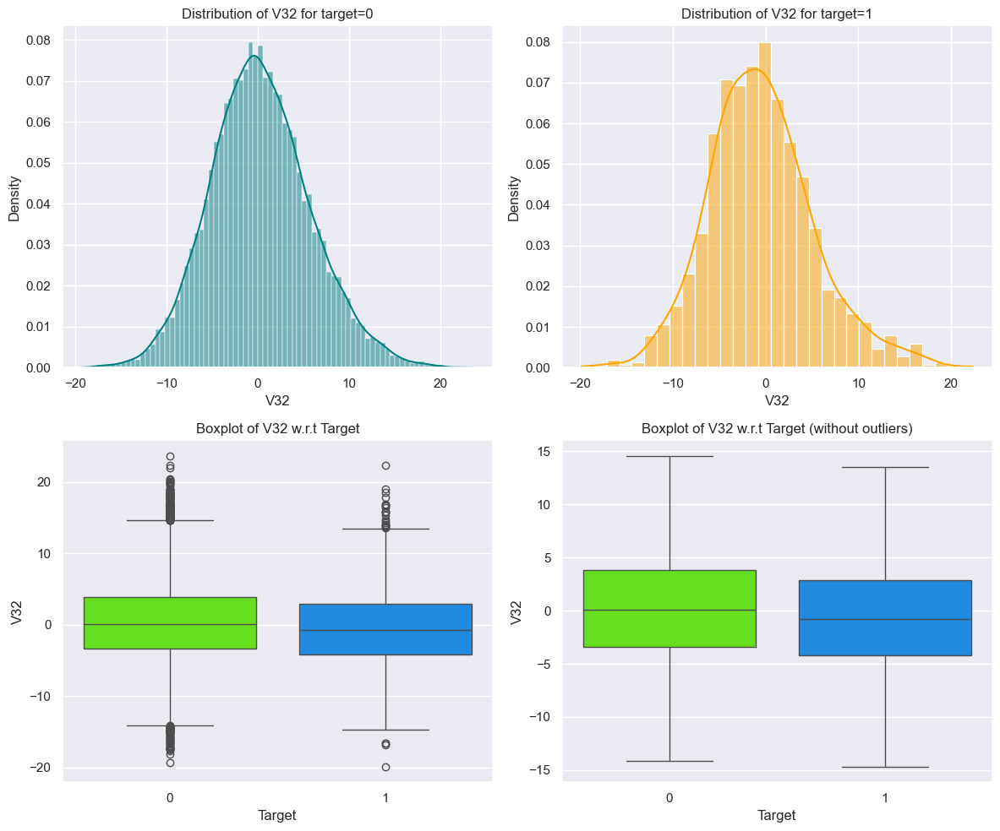

----------------------------------------------------------------------------------------------------
Distribution of 'V33' with respect to the target 'Target'


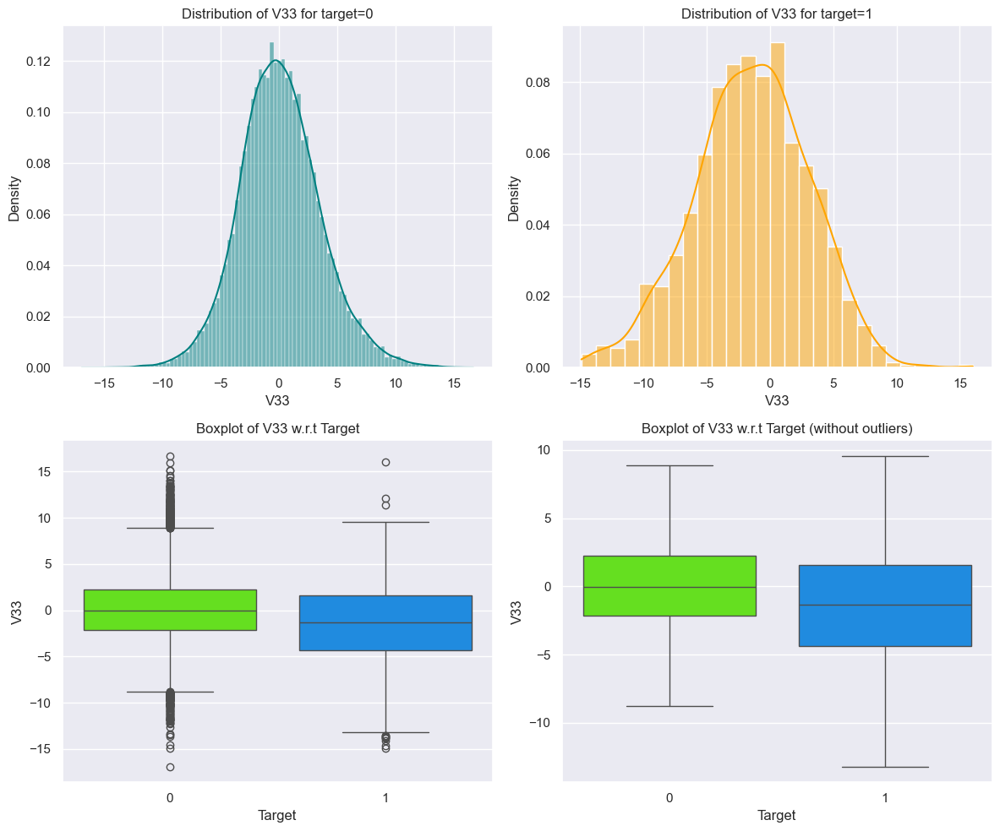

----------------------------------------------------------------------------------------------------
Distribution of 'V34' with respect to the target 'Target'


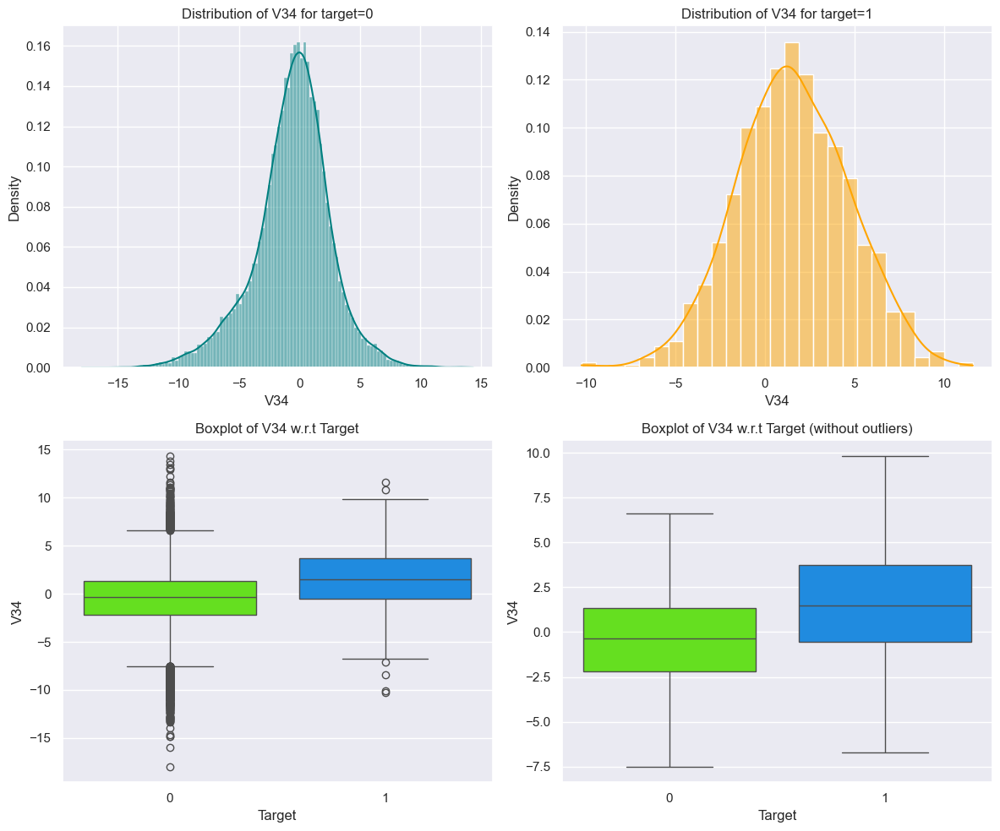

----------------------------------------------------------------------------------------------------
Distribution of 'V35' with respect to the target 'Target'


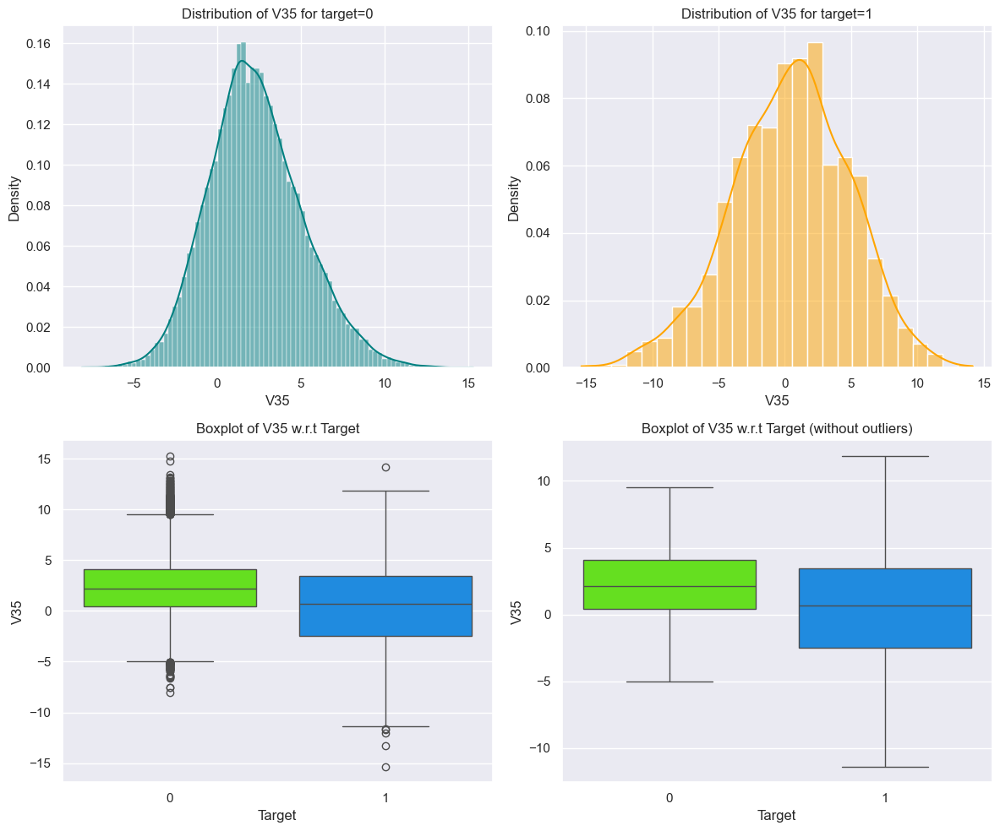

----------------------------------------------------------------------------------------------------
Distribution of 'V36' with respect to the target 'Target'


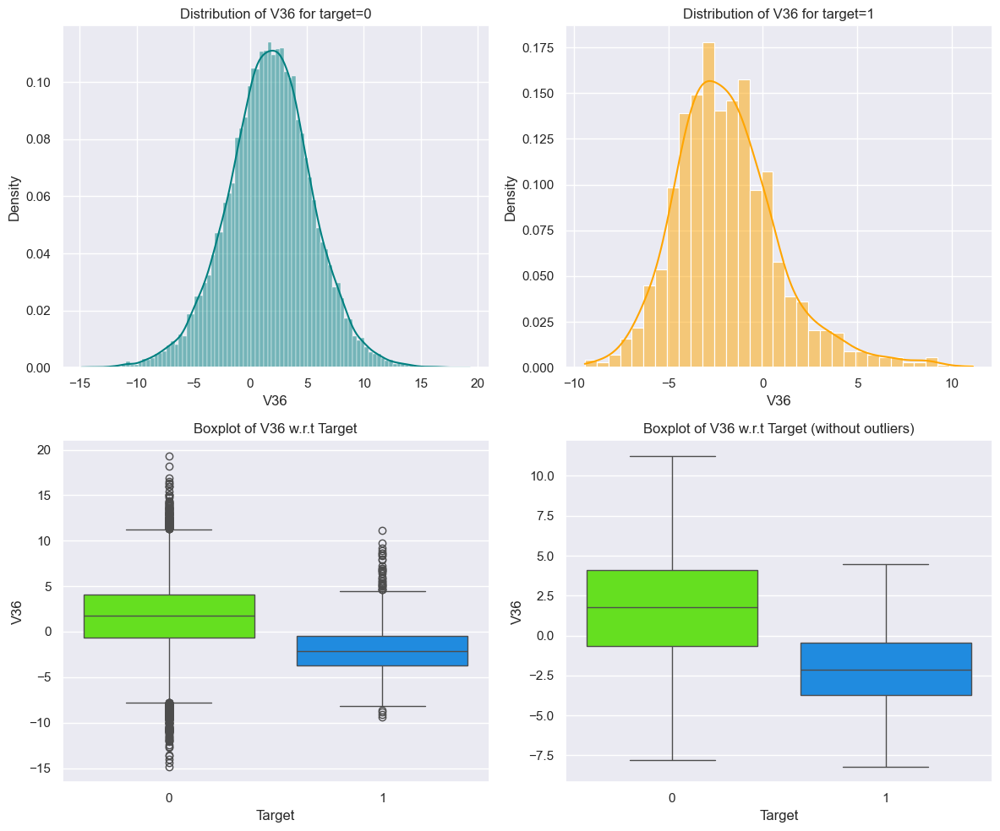

----------------------------------------------------------------------------------------------------
Distribution of 'V37' with respect to the target 'Target'


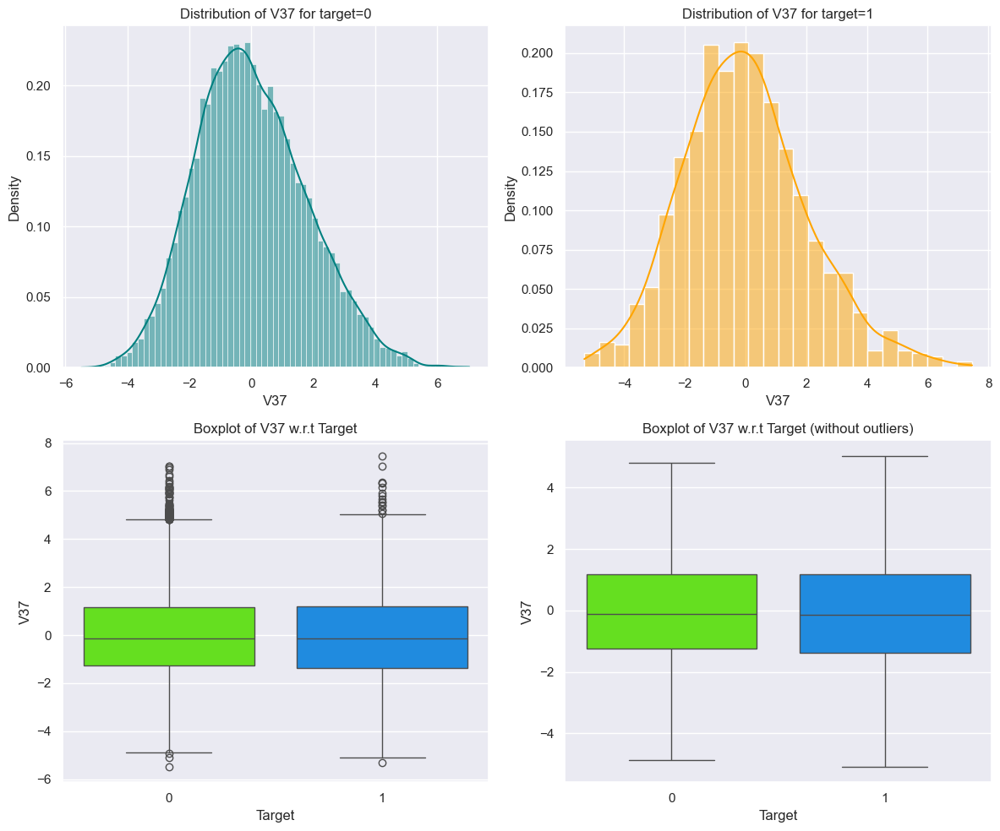

----------------------------------------------------------------------------------------------------
Distribution of 'V38' with respect to the target 'Target'


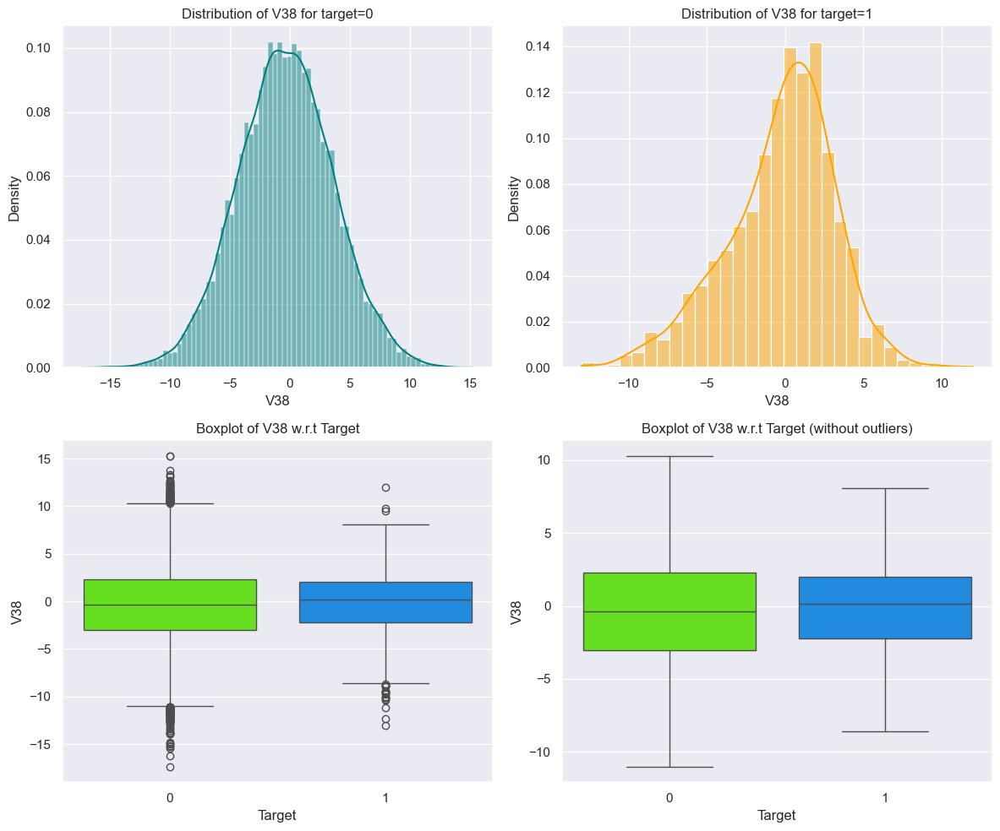

----------------------------------------------------------------------------------------------------
Distribution of 'V39' with respect to the target 'Target'


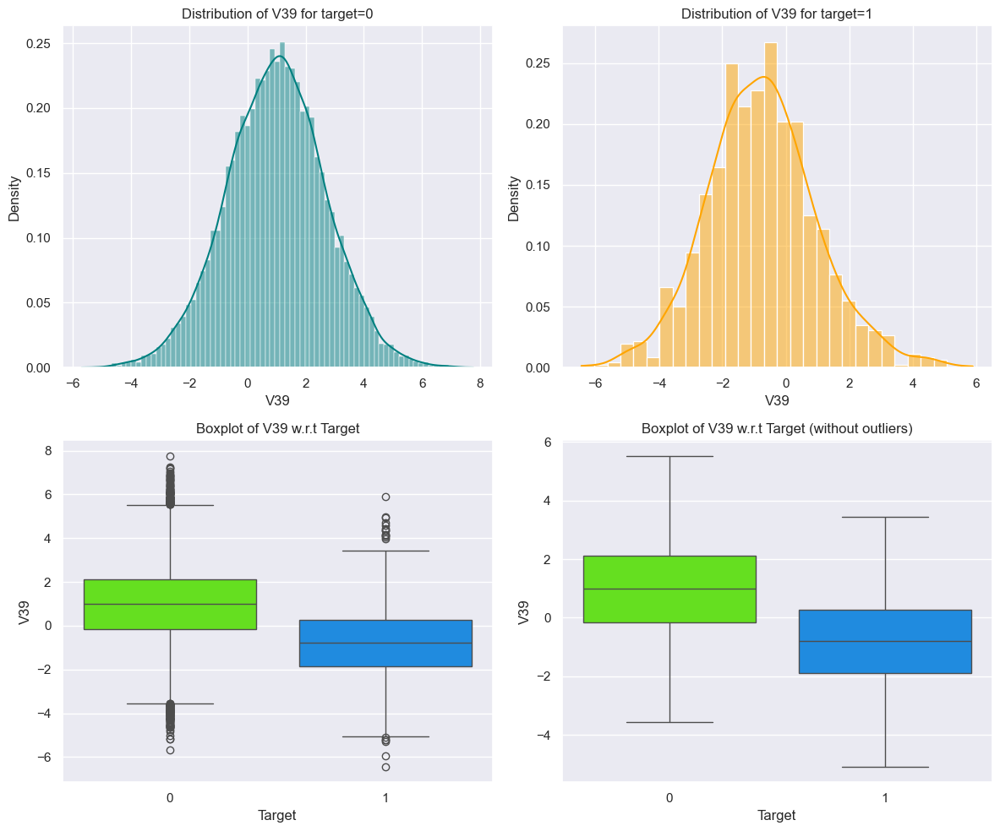

----------------------------------------------------------------------------------------------------
Distribution of 'V40' with respect to the target 'Target'


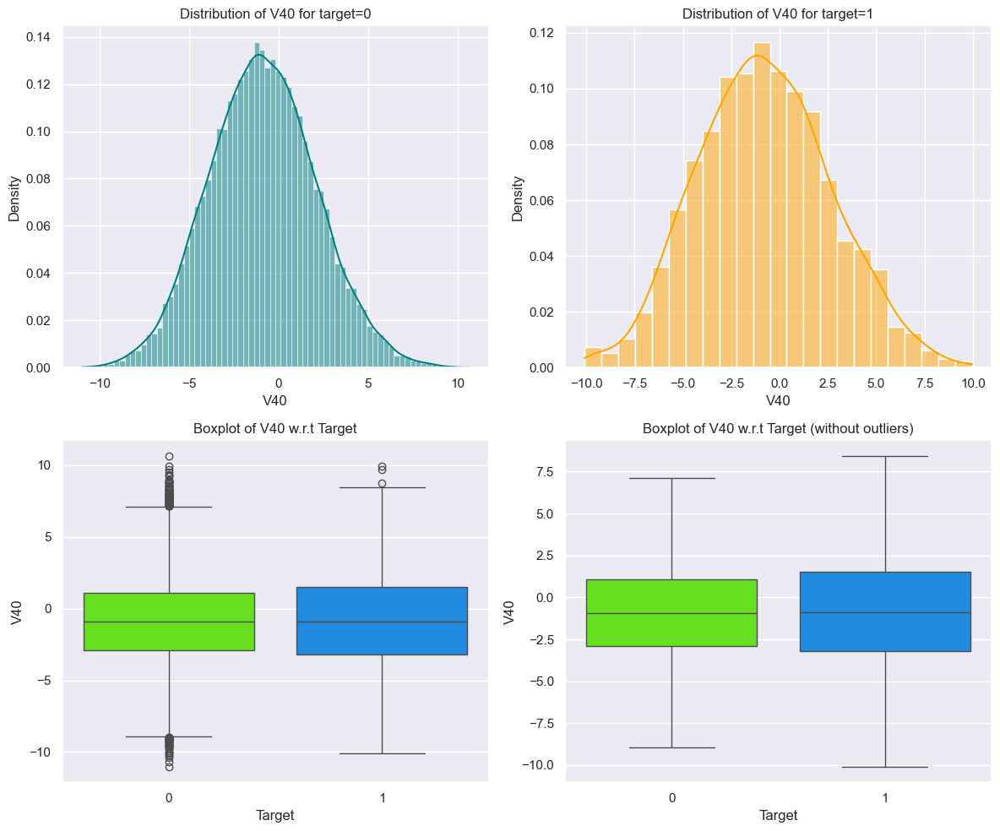

----------------------------------------------------------------------------------------------------


In [145]:
# Run the function on the dataset
distribution_plot_wrt_target(df_eda, "Target")
